# LINRARY DAN DRIVE

In [ ]:
#!pip install mne
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
#import mne #library untuk pemrosesan sinyal elektroensefalografi (EEG)
from scipy.signal import firwin, lfilter

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/MyDrive/TA

Mounted at /content/drive
/content/drive/MyDrive/TA


#SAMPEL 1-20

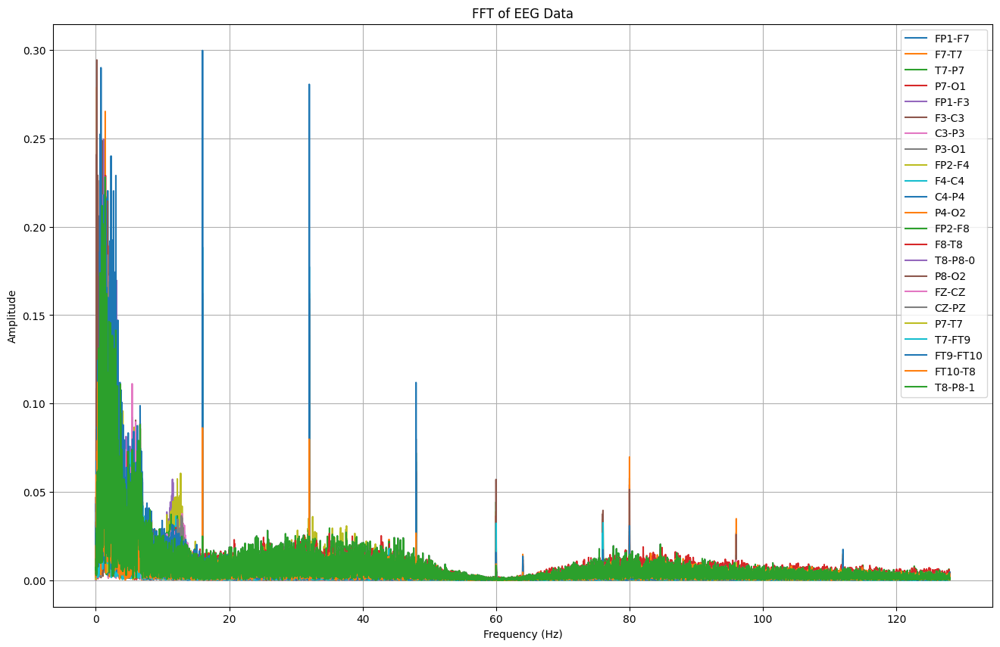

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.008679  0.009814  0.007664  0.007455  0.000143  0.000694  0.007749   
1      0.018795  0.002409  0.000735  0.000872  0.011587  0.004921  0.002183   
2      0.019552  0.002488  0.002390  0.002221  0.009915  0.006960  0.002240   
3      0.012702  0.005983  0.002016  0.003824  0.004243  0.002390  0.005072   
4      0.024575  0.001433  0.002435  0.003311  0.019009  0.007789  0.005162   
...         ...       ...       ...       ...       ...       ...       ...   
20475  0.001504  0.001467  0.000476  0.000162  0.000604  0.000603  0.000626   
20476  0.002187  0.001887  0.000270  0.000859  0.001152  0.000647  0.000104   
20477  0.001103  0.001004  0.000589  0.000281  0.000189  0.000160  0.000702   
20478  0.001624  0.001298  0.000997  0.000621  0.000423  0.000627  0.000457   
20479  0.001811  0.001180  0.000529  0.001397  0.002034  0.002138  0.000726   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA1 = pd.read_csv("/content/drive/MyDrive/TA/LABEL/chb01_03.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA1.columns:
        signal = TA1[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_1 = pd.DataFrame(fft_features).T
TA_1.columns = channels
TA_1['seizure'] = TA1['seizure']
TA_1['frekuensi'] = fft_freqs  # Masukkan frekuensi sebagai kolom pertama


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_1.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA1[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_1.to_csv("/content/drive/MyDrive/TA/FFT NO FILTERING chb01_03.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_1}")

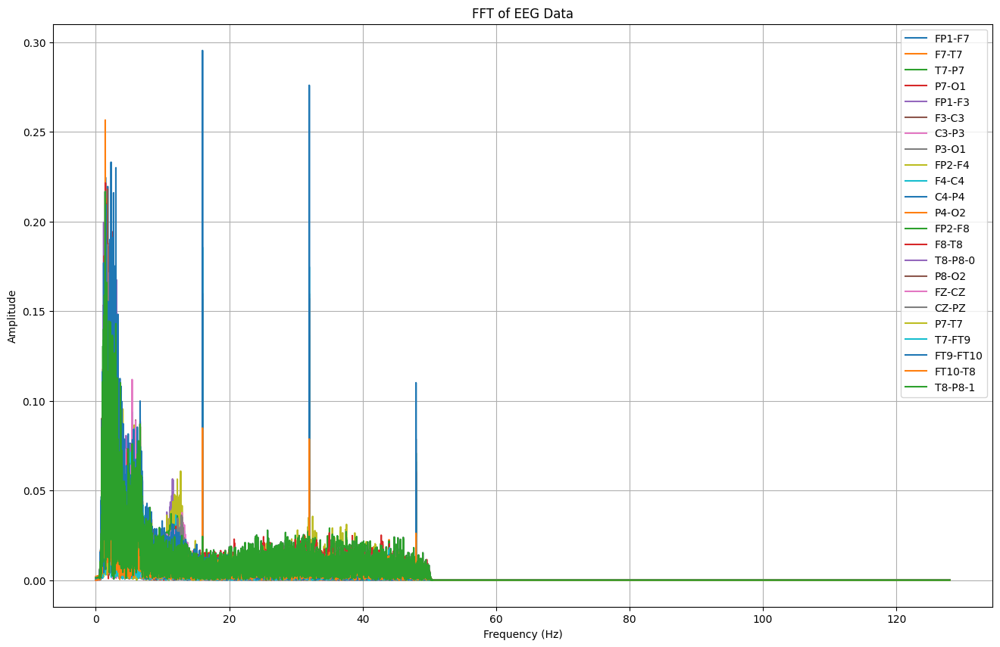

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000157  0.000071  0.001070  0.001301  0.000145  0.000176  0.001193   
1      0.000166  0.000078  0.001064  0.001293  0.000156  0.000182  0.001184   
2      0.000167  0.000078  0.001065  0.001296  0.000154  0.000183  0.001188   
3      0.000161  0.000075  0.001062  0.001291  0.000149  0.000179  0.001184   
4      0.000171  0.000081  0.001066  0.001297  0.000163  0.000184  0.001191   
...         ...       ...       ...       ...       ...       ...       ...   
20475  0.000007  0.000009  0.000005  0.000005  0.000003  0.000006  0.000002   
20476  0.000007  0.000009  0.000005  0.000005  0.000003  0.000006  0.000002   
20477  0.000007  0.000009  0.000005  0.000005  0.000003  0.000006  0.000002   
20478  0.000007  0.000009  0.000005  0.000005  0.000003  0.000006  0.000002   
20479  0.000007  0.000009  0.000005  0.000005  0.000003  0.000006  0.000002   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA1 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb01_03.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA1.columns:
        signal = TA1[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_1 = pd.DataFrame(fft_features).T
TA_1.columns = channels
TA_1['seizure'] = TA1['seizure']
TA_1['frekuensi'] = fft_freqs  # Masukkan frekuensi sebagai kolom pertama


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_1.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA1[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_1.to_csv("/content/drive/MyDrive/TA/FFT FILTERING chb01_03.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_1}")


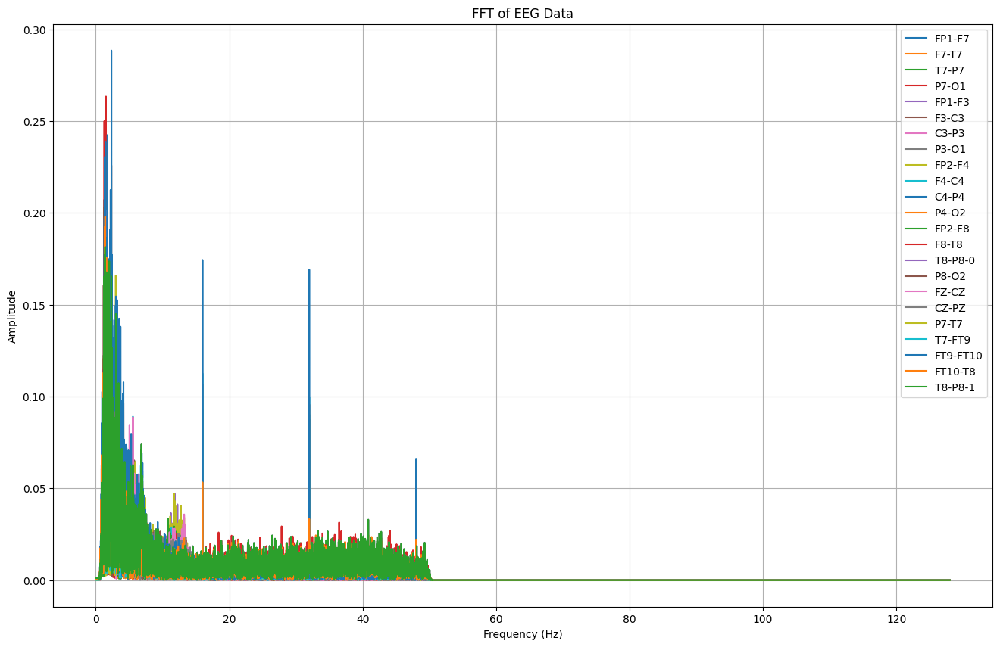

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7         T7-P7     P7-O1    FP1-F3     F3-C3  \
0      0.000160  0.000086  5.536483e-05  0.000100  0.000407  0.000212   
1      0.000169  0.000093  4.802338e-05  0.000107  0.000418  0.000208   
2      0.000162  0.000091  4.885494e-05  0.000105  0.000408  0.000208   
3      0.000165  0.000094  4.752537e-05  0.000109  0.000413  0.000206   
4      0.000164  0.000090  4.943870e-05  0.000106  0.000413  0.000211   
...         ...       ...           ...       ...       ...       ...   
18811  0.000006  0.000011  5.440008e-07  0.000017  0.000013  0.000008   
18812  0.000006  0.000011  5.439972e-07  0.000017  0.000013  0.000008   
18813  0.000006  0.000011  5.439684e-07  0.000017  0.000013  0.000008   
18814  0.000006  0.000011  5.440119e-07  0.000017  0.000013  0.000008   
18815  0.000006  0.000011  5.439767e-07  0.000017  0.000013  0.000008   

          C3-P3     P3-O1    FP2-F4     F4-C4  ...     P8-O2     FZ-CZ  

In [ ]:

# Simpan data setelah filtering ke file CSV
TA2 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb01_04.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA2.columns:
        signal = TA2[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_2 = pd.DataFrame(fft_features).T
TA_2.columns = channels
TA_2['seizure'] = TA2['seizure']
TA_2['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_2.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA2[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_2.to_csv("/content/drive/MyDrive/TA/FFT/chb01_04.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_2}")


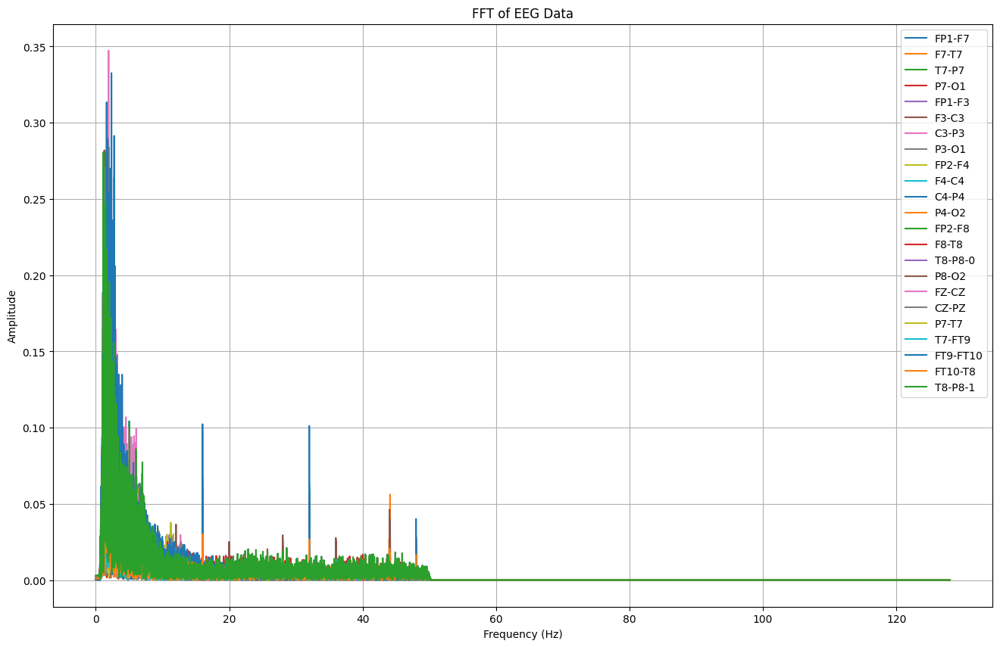

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.001427  0.000418  0.001312  0.000638  0.001023  0.000493  0.000676   
1      0.001434  0.000411  0.001321  0.000646  0.001034  0.000497  0.000669   
2      0.001432  0.000414  0.001319  0.000645  0.001028  0.000500  0.000669   
3      0.001433  0.000412  0.001322  0.000648  0.001034  0.000497  0.000667   
4      0.001439  0.000412  0.001321  0.000644  0.001037  0.000506  0.000671   
...         ...       ...       ...       ...       ...       ...       ...   
20475  0.000010  0.000045  0.000002  0.000018  0.000176  0.000118  0.000059   
20476  0.000010  0.000045  0.000002  0.000018  0.000176  0.000118  0.000059   
20477  0.000010  0.000045  0.000002  0.000018  0.000176  0.000118  0.000059   
20478  0.000010  0.000045  0.000002  0.000018  0.000176  0.000118  0.000059   
20479  0.000010  0.000045  0.000002  0.000018  0.000176  0.000118  0.000059   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA3 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb01_15.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA3.columns:
        signal = TA3[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_3 = pd.DataFrame(fft_features).T
TA_3.columns = channels
TA_3['seizure'] = TA3['seizure']
TA_3['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_3.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA3[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_3.to_csv("/content/drive/MyDrive/TA/FFT/chb01_15.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_3}")


Data setelah filtering berhasil disimpan dalam file CSV:              FP1-F7         F7-T7         T7-P7         P7-O1        FP1-F3  \
0      1.498450e-09 -5.912803e-10  8.180727e-10  4.454851e-10 -2.211226e-09   
1      5.170056e-09 -2.321859e-09  3.187803e-09  1.412264e-09 -7.572234e-09   
2      8.376876e-09 -4.024530e-09  5.685757e-09  2.008201e-09 -1.184688e-08   
3      9.093238e-09 -3.859368e-09  5.895591e-09  1.928367e-09 -1.173278e-08   
4      8.403374e-09 -2.024508e-09  4.030138e-09  1.760423e-09 -9.604264e-09   
...             ...           ...           ...           ...           ...   
43771 -2.269874e-05  4.470316e-06 -3.390358e-06 -1.973469e-05 -1.846869e-05   
43772 -2.370950e-05  7.959233e-06 -3.419993e-06 -2.073038e-05 -1.803477e-05   
43773 -2.480767e-05  1.259110e-05 -4.157482e-06 -1.974726e-05 -1.708349e-05   
43774 -2.524561e-05  1.566612e-05 -2.960244e-06 -1.774608e-05 -1.625768e-05   
43775 -2.580482e-05  1.559005e-05  1.316794e-06 -1.624849e-05 -1.631547e-0

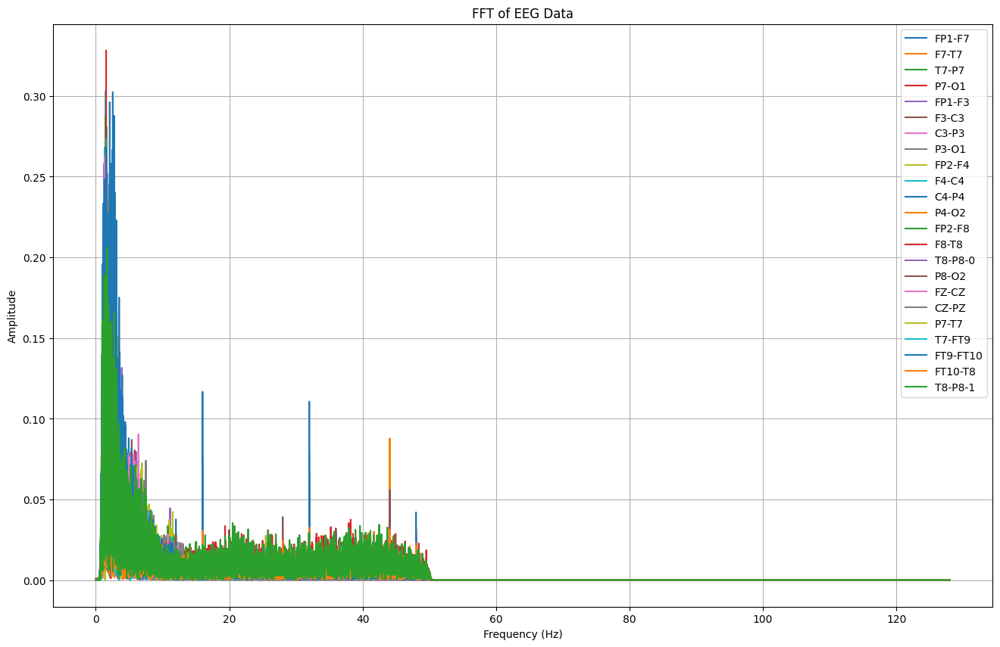

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000586  0.000404  0.000400  0.000923  0.000896  0.000118  0.000436   
1      0.000581  0.000407  0.000391  0.000933  0.000878  0.000112  0.000447   
2      0.000582  0.000412  0.000395  0.000938  0.000884  0.000120  0.000437   
3      0.000577  0.000409  0.000388  0.000929  0.000885  0.000124  0.000442   
4      0.000583  0.000411  0.000393  0.000940  0.000875  0.000113  0.000463   
...         ...       ...       ...       ...       ...       ...       ...   
21883  0.000013  0.000007  0.000002  0.000008  0.000008  0.000006  0.000003   
21884  0.000013  0.000007  0.000002  0.000008  0.000008  0.000006  0.000003   
21885  0.000013  0.000007  0.000002  0.000008  0.000008  0.000006  0.000003   
21886  0.000013  0.000007  0.000002  0.000008  0.000008  0.000006  0.000003   
21887  0.000013  0.000007  0.000002  0.000008  0.000008  0.000006  0.000003   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA4 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb01_16.csv")

print(f"Data setelah filtering berhasil disimpan dalam file CSV: {TA4}")

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA4.columns:
        signal = TA4[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_4 = pd.DataFrame(fft_features).T
TA_4.columns = channels
TA_4['seizure'] = TA4['seizure']
TA_4['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_4.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA4[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_4.to_csv("/content/drive/MyDrive/TA/FFT/chb01_16.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_4}")


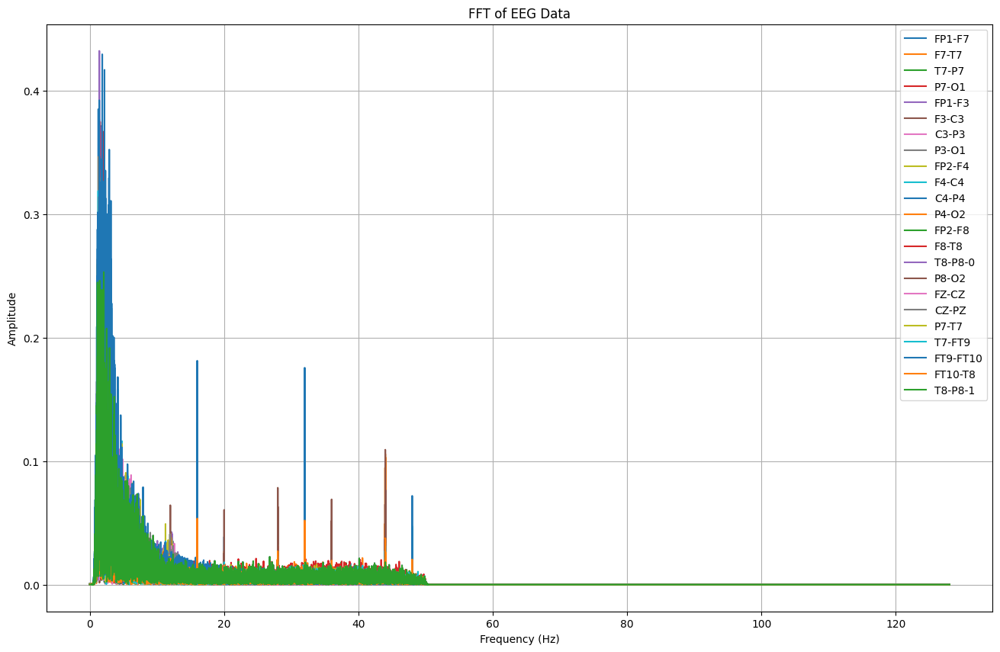

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000374  0.000414  0.000380  0.000196  0.000190  0.000237  0.000307   
1      0.000358  0.000424  0.000369  0.000216  0.000207  0.000231  0.000288   
2      0.000358  0.000428  0.000368  0.000205  0.000207  0.000221  0.000303   
3      0.000355  0.000424  0.000373  0.000214  0.000205  0.000230  0.000286   
4      0.000360  0.000423  0.000367  0.000210  0.000205  0.000228  0.000290   
...         ...       ...       ...       ...       ...       ...       ...   
34555  0.000011  0.000007  0.000003  0.000004  0.000001  0.000003  0.000016   
34556  0.000011  0.000007  0.000003  0.000004  0.000001  0.000003  0.000016   
34557  0.000011  0.000007  0.000003  0.000004  0.000001  0.000003  0.000016   
34558  0.000011  0.000007  0.000003  0.000004  0.000001  0.000003  0.000016   
34559  0.000011  0.000007  0.000003  0.000004  0.000001  0.000003  0.000016   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA5 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb01_18.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA5.columns:
        signal = TA5[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_5 = pd.DataFrame(fft_features).T
TA_5.columns = channels
TA_5['seizure'] = TA5['seizure']
TA_5['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_5.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA5[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_5.to_csv("/content/drive/MyDrive/TA/FFT/chb01_18.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_5}")


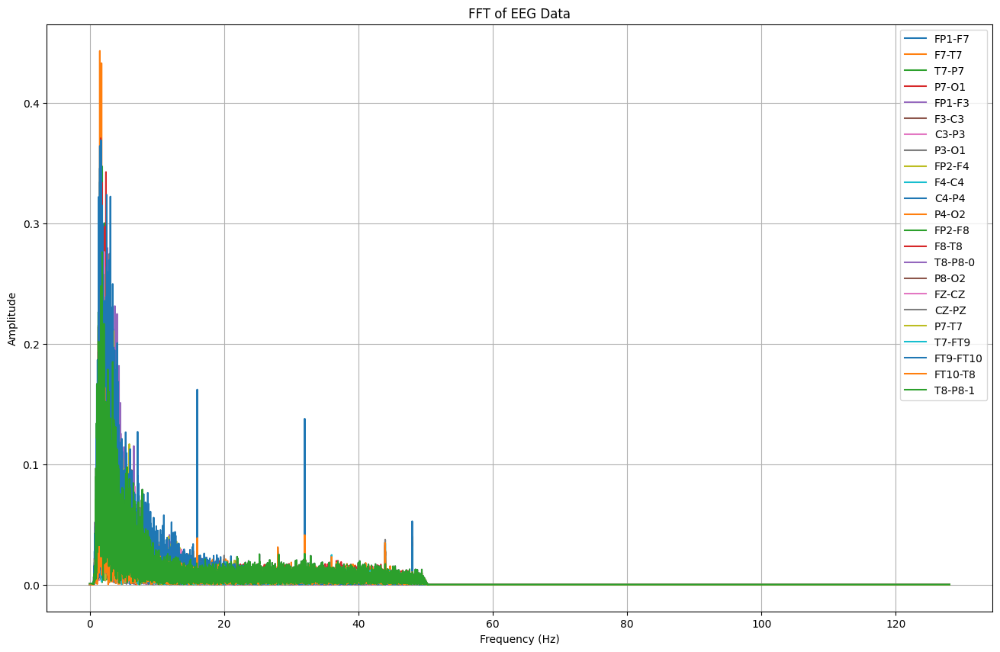

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000353  0.000488  0.000833  0.000329  0.000259  0.000613  0.000510   
1      0.000338  0.000486  0.000815  0.000340  0.000245  0.000608  0.000498   
2      0.000344  0.000476  0.000832  0.000342  0.000251  0.000601  0.000504   
3      0.000342  0.000496  0.000806  0.000338  0.000250  0.000609  0.000498   
4      0.000341  0.000467  0.000834  0.000336  0.000250  0.000609  0.000500   
...         ...       ...       ...       ...       ...       ...       ...   
27259  0.000004  0.000013  0.000003  0.000029  0.000001  0.000003  0.000009   
27260  0.000004  0.000013  0.000003  0.000029  0.000001  0.000003  0.000009   
27261  0.000004  0.000013  0.000003  0.000029  0.000001  0.000003  0.000009   
27262  0.000004  0.000013  0.000003  0.000029  0.000001  0.000003  0.000009   
27263  0.000004  0.000013  0.000003  0.000029  0.000001  0.000003  0.000009   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA6 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb01_21.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA6.columns:
        signal = TA6[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_6 = pd.DataFrame(fft_features).T
TA_6.columns = channels
TA_6['seizure'] = TA6['seizure']
TA_6['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_6.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA6[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_6.to_csv("/content/drive/MyDrive/TA/FFT/chb01_21.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_6}")

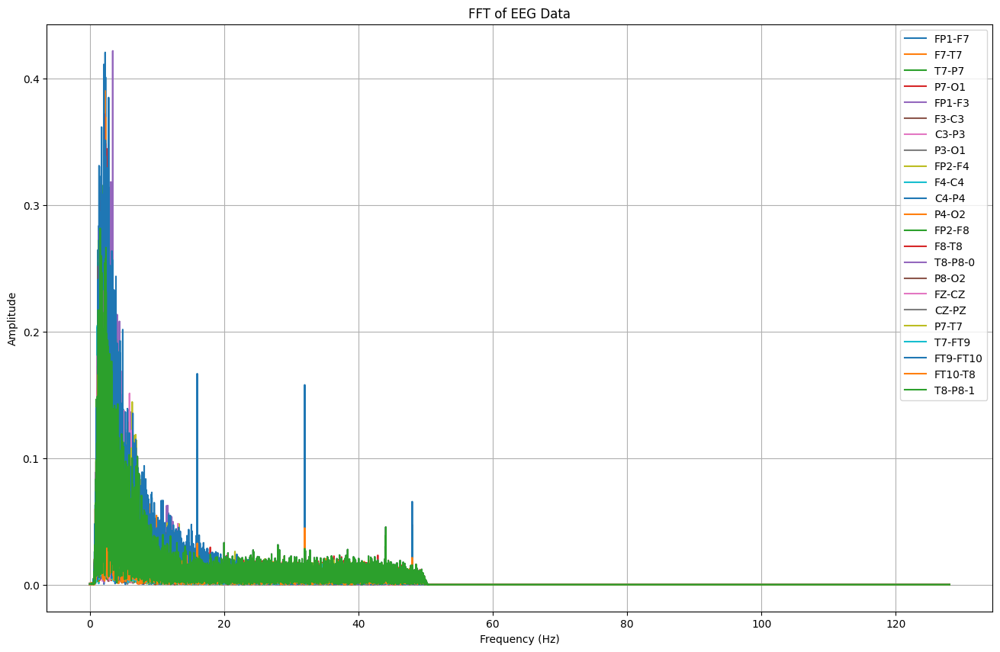

Data setelah FFT berhasil disimpan dalam file CSV:              FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3  \
0      4.117539e-04  0.001247  0.000513  0.000358  0.000254  0.000010   
1      3.972527e-04  0.001253  0.000528  0.000344  0.000269  0.000006   
2      4.038814e-04  0.001259  0.000516  0.000344  0.000257  0.000005   
3      4.025811e-04  0.001242  0.000544  0.000346  0.000266  0.000021   
4      3.905803e-04  0.001265  0.000514  0.000346  0.000277  0.000018   
...             ...       ...       ...       ...       ...       ...   
28283  3.543759e-07  0.000001  0.000020  0.000014  0.000008  0.000004   
28284  3.543612e-07  0.000001  0.000020  0.000014  0.000008  0.000004   
28285  3.543192e-07  0.000001  0.000020  0.000014  0.000008  0.000004   
28286  3.543488e-07  0.000001  0.000020  0.000014  0.000008  0.000004   
28287  3.543333e-07  0.000001  0.000020  0.000014  0.000008  0.000004   

          C3-P3     P3-O1    FP2-F4     F4-C4  ...     P8-O2     FZ-CZ  

In [ ]:

# Simpan data setelah filtering ke file CSV
TA7 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb01_26.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA7.columns:
        signal = TA7[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_7 = pd.DataFrame(fft_features).T
TA_7.columns = channels
TA_7['seizure'] = TA7['seizure']
TA_7['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_7.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA7[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_7.to_csv("/content/drive/MyDrive/TA/FFT/chb01_26.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_7}")

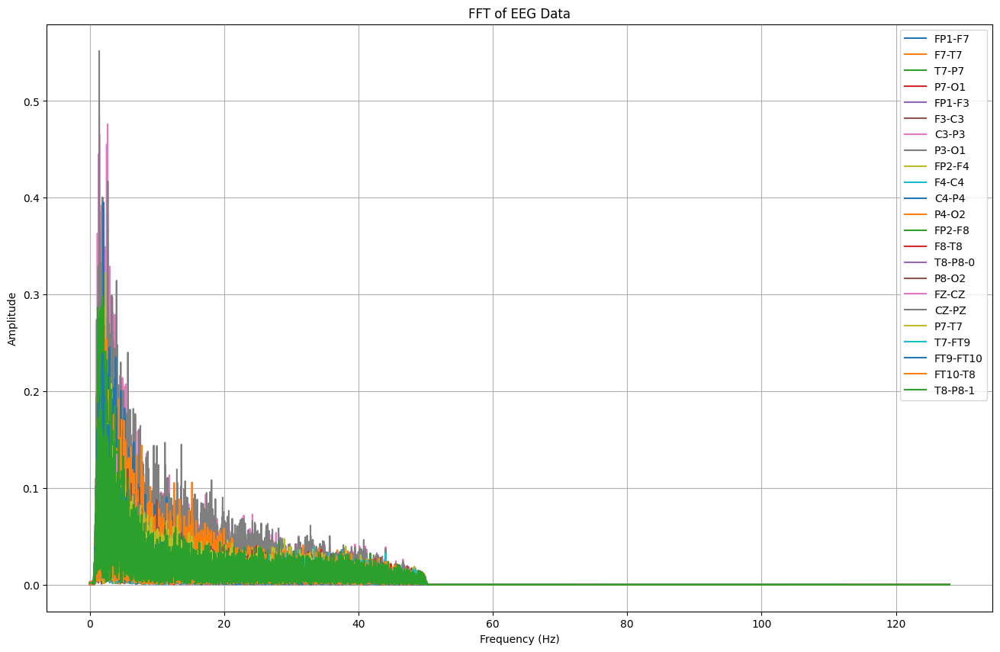

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000730  0.000086  0.001602  0.000653  0.000165  0.000788  0.003129   
1      0.000740  0.000077  0.001608  0.000660  0.000175  0.000781  0.003143   
2      0.000743  0.000079  0.001606  0.000662  0.000173  0.000779  0.003117   
3      0.000733  0.000074  0.001610  0.000672  0.000172  0.000780  0.003173   
4      0.000754  0.000080  0.001610  0.000650  0.000181  0.000777  0.003092   
...         ...       ...       ...       ...       ...       ...       ...   
25851  0.000008  0.000012  0.000013  0.000035  0.000004  0.000018  0.000032   
25852  0.000008  0.000012  0.000013  0.000035  0.000004  0.000018  0.000032   
25853  0.000008  0.000012  0.000013  0.000035  0.000004  0.000018  0.000032   
25854  0.000008  0.000012  0.000013  0.000035  0.000004  0.000018  0.000032   
25855  0.000008  0.000012  0.000013  0.000035  0.000004  0.000018  0.000032   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA8 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb02_16.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA8.columns:
        signal = TA8[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_8 = pd.DataFrame(fft_features).T
TA_8.columns = channels
TA_8['seizure'] = TA8['seizure']
TA_8['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_8.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA8[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_8.to_csv("/content/drive/MyDrive/TA/FFT/chb02_16.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_8}")


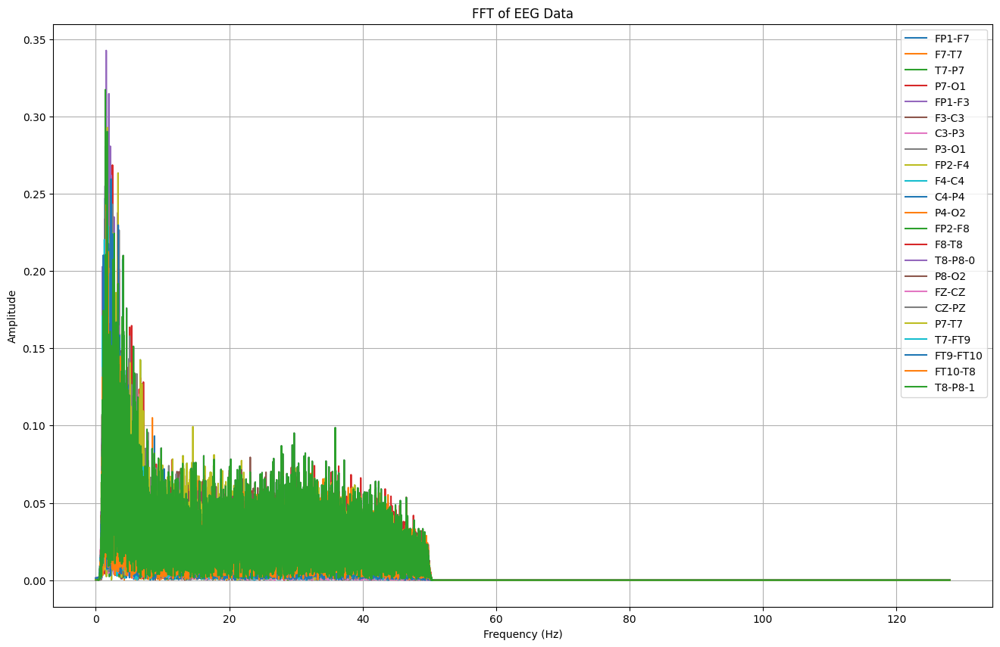

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000875  0.000114  0.000790  0.000498  0.001495  0.000603  0.000437   
1      0.000890  0.000125  0.000785  0.000526  0.001485  0.000616  0.000443   
2      0.000893  0.000129  0.000790  0.000495  0.001485  0.000615  0.000449   
3      0.000897  0.000134  0.000781  0.000516  0.001477  0.000629  0.000438   
4      0.000904  0.000127  0.000775  0.000533  0.001472  0.000615  0.000447   
...         ...       ...       ...       ...       ...       ...       ...   
25723  0.000002  0.000008  0.000031  0.000025  0.000003  0.000016  0.000018   
25724  0.000002  0.000008  0.000031  0.000025  0.000003  0.000016  0.000018   
25725  0.000002  0.000008  0.000031  0.000025  0.000003  0.000016  0.000018   
25726  0.000002  0.000008  0.000031  0.000025  0.000003  0.000016  0.000018   
25727  0.000002  0.000008  0.000031  0.000025  0.000003  0.000016  0.000018   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA9 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb02_16+.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA9.columns:
        signal = TA9[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_9 = pd.DataFrame(fft_features).T
TA_9.columns = channels
TA_9['seizure'] = TA9['seizure']
TA_9['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_9.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA9[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_9.to_csv("/content/drive/MyDrive/TA/FFT/chb02_16+.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_9}")


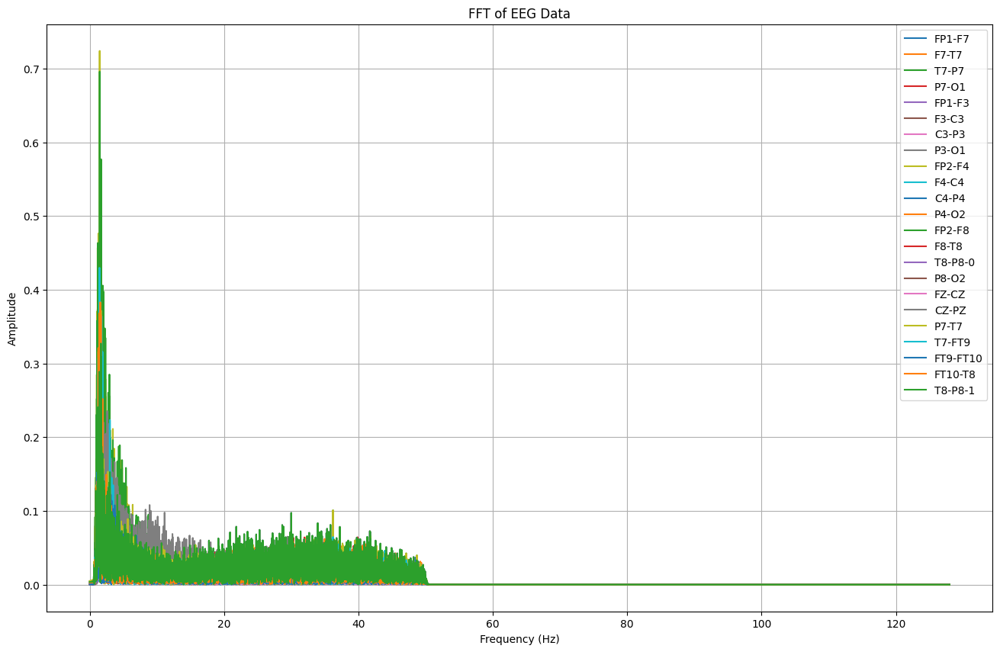

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000225  0.001839  0.004502  0.000495  0.001619  0.000981  0.001331   
1      0.000243  0.001851  0.004504  0.000502  0.001608  0.000976  0.001325   
2      0.000241  0.001848  0.004505  0.000505  0.001614  0.000972  0.001324   
3      0.000238  0.001853  0.004511  0.000507  0.001613  0.000977  0.001333   
4      0.000245  0.001849  0.004505  0.000503  0.001610  0.000971  0.001332   
...         ...       ...       ...       ...       ...       ...       ...   
17019  0.000061  0.000049  0.000044  0.000021  0.000011  0.000010  0.000014   
17020  0.000061  0.000049  0.000044  0.000021  0.000011  0.000010  0.000014   
17021  0.000061  0.000049  0.000044  0.000021  0.000011  0.000010  0.000014   
17022  0.000061  0.000049  0.000044  0.000021  0.000011  0.000010  0.000014   
17023  0.000061  0.000049  0.000044  0.000021  0.000011  0.000010  0.000014   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA10 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb02_19.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA10.columns:
        signal = TA10[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_10 = pd.DataFrame(fft_features).T
TA_10.columns = channels
TA_10['seizure'] = TA10['seizure']
TA_10['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_10.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA10[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_10.to_csv("/content/drive/MyDrive/TA/FFT/chb02_19.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_10}")


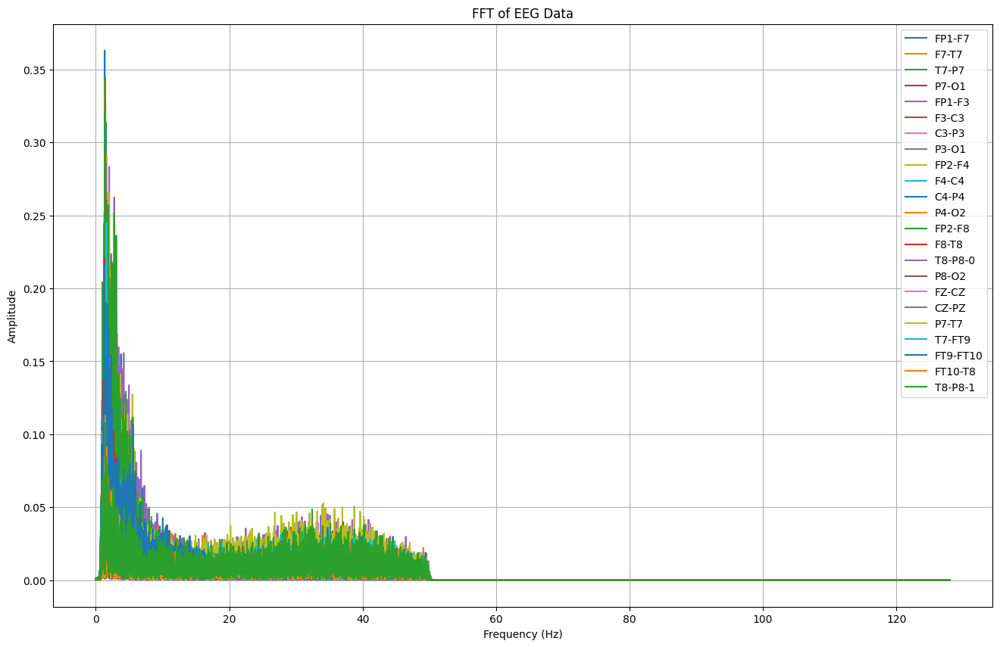

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000742  0.001083  0.000071  0.000479  0.000117  0.000335  0.000181   
1      0.000755  0.001074  0.000080  0.000469  0.000106  0.000326  0.000174   
2      0.000754  0.001066  0.000076  0.000473  0.000099  0.000332  0.000176   
3      0.000755  0.001083  0.000082  0.000469  0.000112  0.000332  0.000173   
4      0.000768  0.001064  0.000069  0.000470  0.000086  0.000335  0.000178   
...         ...       ...       ...       ...       ...       ...       ...   
22011  0.000064  0.000016  0.000002  0.000004  0.000072  0.000011  0.000001   
22012  0.000064  0.000016  0.000002  0.000004  0.000072  0.000011  0.000001   
22013  0.000064  0.000016  0.000002  0.000004  0.000072  0.000011  0.000001   
22014  0.000064  0.000016  0.000002  0.000004  0.000072  0.000011  0.000001   
22015  0.000064  0.000016  0.000002  0.000004  0.000072  0.000011  0.000001   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA11 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb03_01.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA11.columns:
        signal = TA11[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_11 = pd.DataFrame(fft_features).T
TA_11.columns = channels
TA_11['seizure'] = TA11['seizure']
TA_11['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_11.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA11[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_11.to_csv("/content/drive/MyDrive/TA/FFT/chb03_01.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_11}")


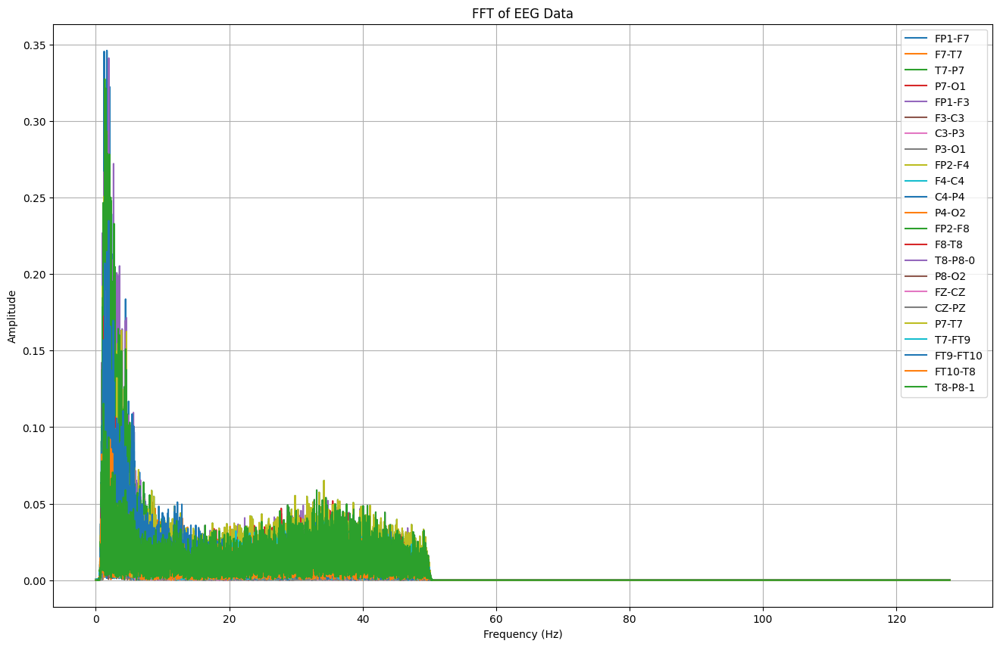

Data setelah FFT berhasil disimpan dalam file CSV:              FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3  \
0      4.345558e-04  0.000526  0.000162  0.000345  0.000464  0.000117   
1      4.468464e-04  0.000515  0.000166  0.000356  0.000469  0.000135   
2      4.455365e-04  0.000505  0.000160  0.000355  0.000458  0.000147   
3      4.521395e-04  0.000525  0.000174  0.000357  0.000458  0.000145   
4      4.454441e-04  0.000518  0.000169  0.000361  0.000470  0.000135   
...             ...       ...       ...       ...       ...       ...   
23675  1.147873e-07  0.000028  0.000002  0.000004  0.000002  0.000013   
23676  1.147008e-07  0.000028  0.000002  0.000004  0.000002  0.000013   
23677  1.148341e-07  0.000028  0.000002  0.000004  0.000002  0.000013   
23678  1.146703e-07  0.000028  0.000002  0.000004  0.000002  0.000013   
23679  1.146477e-07  0.000028  0.000002  0.000004  0.000002  0.000013   

          C3-P3     P3-O1    FP2-F4     F4-C4  ...     P8-O2         FZ-

In [ ]:

# Simpan data setelah filtering ke file CSV
TA12 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb03_02.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA12.columns:
        signal = TA12[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_12 = pd.DataFrame(fft_features).T
TA_12.columns = channels
TA_12['seizure'] = TA12['seizure']
TA_12['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_12.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA12[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_12.to_csv("/content/drive/MyDrive/TA/FFT/chb03_02.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_12}")


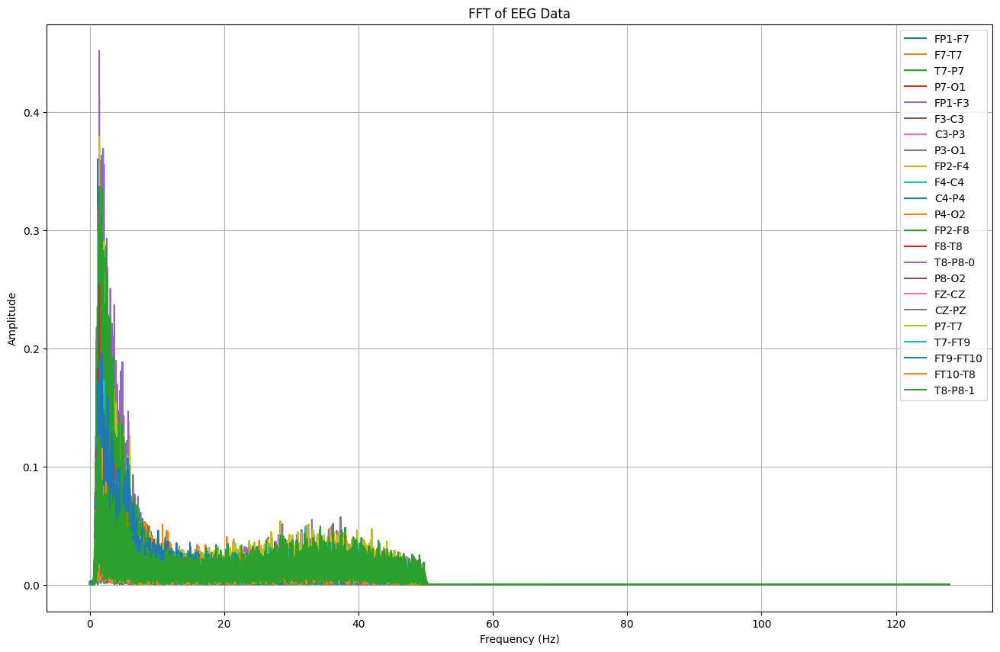

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.002600  0.001251  0.000159  0.000468  0.001197  0.000101  0.000119   
1      0.002612  0.001237  0.000153  0.000455  0.001204  0.000084  0.000111   
2      0.002617  0.001231  0.000159  0.000462  0.001196  0.000074  0.000111   
3      0.002611  0.001245  0.000146  0.000456  0.001187  0.000075  0.000109   
4      0.002602  0.001255  0.000153  0.000453  0.001190  0.000097  0.000110   
...         ...       ...       ...       ...       ...       ...       ...   
24187  0.000003  0.000023  0.000014  0.000016  0.000021  0.000020  0.000011   
24188  0.000003  0.000023  0.000014  0.000016  0.000021  0.000020  0.000011   
24189  0.000003  0.000023  0.000014  0.000016  0.000021  0.000020  0.000011   
24190  0.000003  0.000023  0.000014  0.000016  0.000021  0.000020  0.000011   
24191  0.000003  0.000023  0.000014  0.000016  0.000021  0.000020  0.000011   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA13 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb03_03.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA13.columns:
        signal = TA13[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_13 = pd.DataFrame(fft_features).T
TA_13.columns = channels
TA_13['seizure'] = TA13['seizure']
TA_13['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_13.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA13[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_13.to_csv("/content/drive/MyDrive/TA/FFT/chb03_03.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_13}")

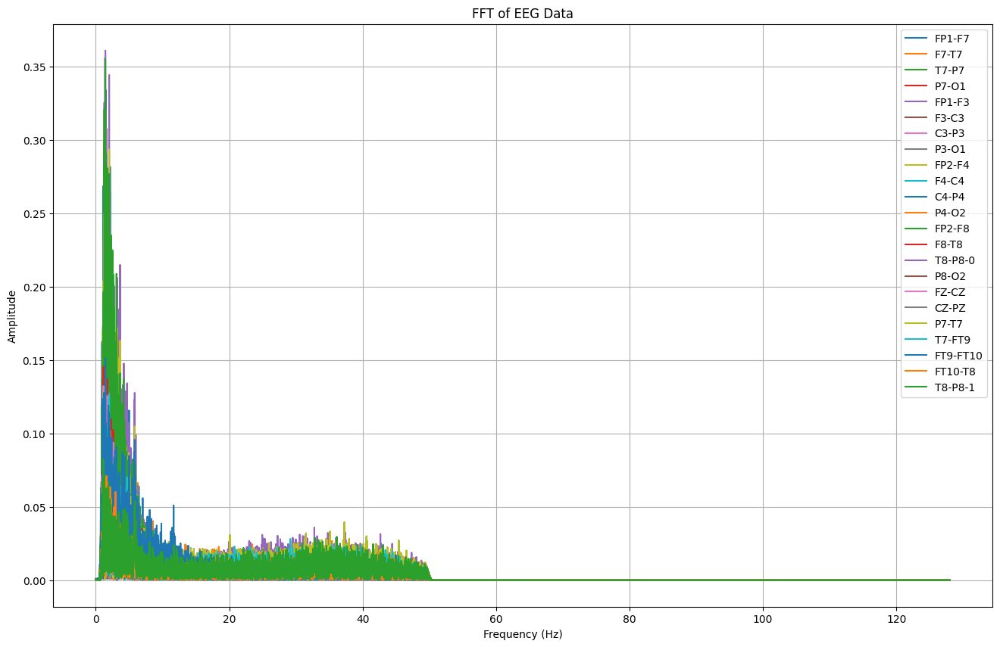

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000167  0.000746  0.000078  0.000333  0.000367  0.000307  0.000073   
1      0.000179  0.000734  0.000087  0.000321  0.000369  0.000284  0.000064   
2      0.000175  0.000728  0.000076  0.000324  0.000386  0.000271  0.000063   
3      0.000175  0.000748  0.000094  0.000320  0.000399  0.000270  0.000060   
4      0.000172  0.000734  0.000085  0.000323  0.000364  0.000295  0.000065   
...         ...       ...       ...       ...       ...       ...       ...   
22011  0.000001  0.000010  0.000021  0.000013  0.000006  0.000010  0.000002   
22012  0.000001  0.000010  0.000021  0.000013  0.000006  0.000010  0.000002   
22013  0.000001  0.000010  0.000021  0.000013  0.000006  0.000010  0.000002   
22014  0.000001  0.000010  0.000021  0.000013  0.000006  0.000010  0.000002   
22015  0.000001  0.000010  0.000021  0.000013  0.000006  0.000010  0.000002   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA14 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb03_04.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA14.columns:
        signal = TA14[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_14 = pd.DataFrame(fft_features).T
TA_14.columns = channels
TA_14['seizure'] = TA14['seizure']
TA_14['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_14.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA14[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_14.to_csv("/content/drive/MyDrive/TA/FFT/chb03_04.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_14}")


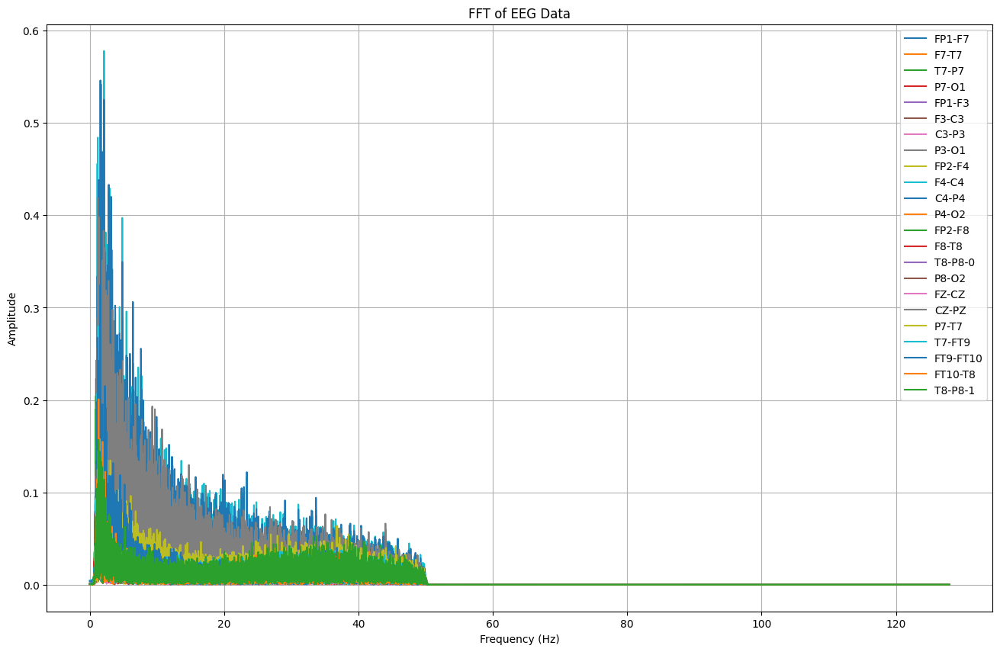

Data setelah FFT berhasil disimpan dalam file CSV:              FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3  \
0      1.512970e-04  0.000715  0.000427  0.000733  0.001232  0.000969   
1      1.598289e-04  0.000723  0.000432  0.000724  0.001238  0.000985   
2      1.616168e-04  0.000715  0.000450  0.000730  0.001242  0.000968   
3      1.679553e-04  0.000721  0.000435  0.000746  0.001224  0.000984   
4      1.640788e-04  0.000698  0.000443  0.000719  0.001248  0.000946   
...             ...       ...       ...       ...       ...       ...   
21371  2.951245e-07  0.000009  0.000015  0.000015  0.000007  0.000013   
21372  2.951509e-07  0.000009  0.000015  0.000015  0.000007  0.000013   
21373  2.952780e-07  0.000009  0.000015  0.000015  0.000007  0.000013   
21374  2.952807e-07  0.000009  0.000015  0.000015  0.000007  0.000013   
21375  2.952365e-07  0.000009  0.000015  0.000015  0.000007  0.000013   

          C3-P3     P3-O1    FP2-F4     F4-C4  ...     P8-O2     FZ-CZ  

In [ ]:

# Simpan data setelah filtering ke file CSV
TA15 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb03_34.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA15.columns:
        signal = TA15[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_15 = pd.DataFrame(fft_features).T
TA_15.columns = channels
TA_15['seizure'] = TA15['seizure']
TA_15['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_15.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA15[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_15.to_csv("/content/drive/MyDrive/TA/FFT/chb03_34.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_15}")


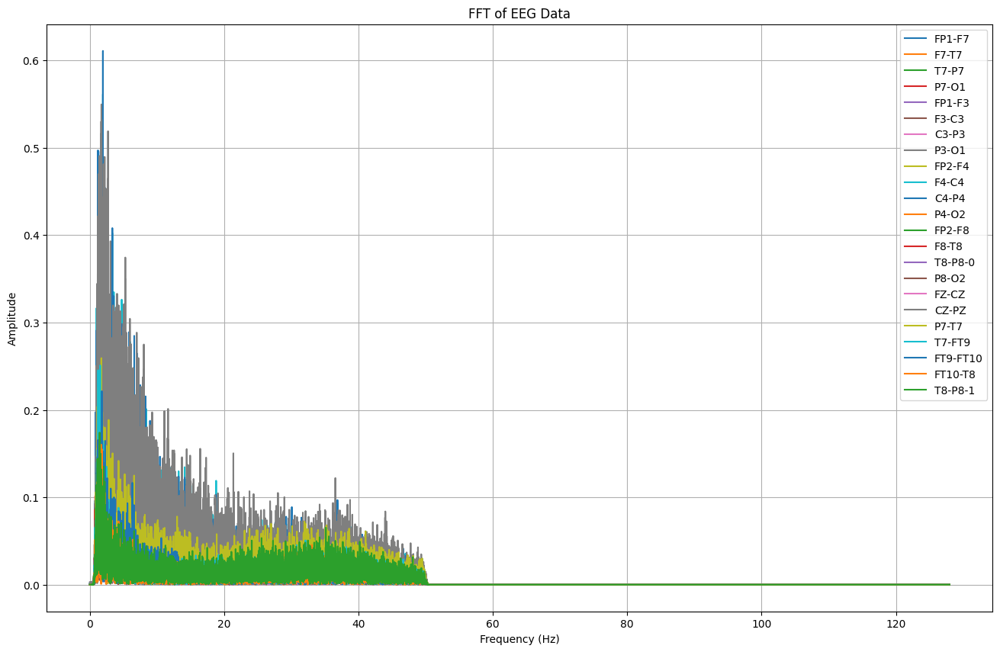

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3  \
0      0.000150  0.000356  0.000444  0.000383  0.000134  0.000196   
1      0.000168  0.000349  0.000433  0.000386  0.000145  0.000187   
2      0.000157  0.000347  0.000433  0.000380  0.000135  0.000184   
3      0.000188  0.000360  0.000433  0.000391  0.000147  0.000180   
4      0.000168  0.000379  0.000454  0.000408  0.000105  0.000178   
...         ...       ...       ...       ...       ...       ...   
23547  0.000007  0.000008  0.000003  0.000003  0.000012  0.000007   
23548  0.000007  0.000008  0.000003  0.000003  0.000012  0.000007   
23549  0.000007  0.000008  0.000003  0.000003  0.000012  0.000007   
23550  0.000007  0.000008  0.000003  0.000003  0.000012  0.000007   
23551  0.000007  0.000008  0.000003  0.000003  0.000012  0.000007   

              C3-P3     P3-O1    FP2-F4     F4-C4  ...     P8-O2     FZ-CZ  \
0      1.331343e-04  0.000071  0.000151  0

In [ ]:

# Simpan data setelah filtering ke file CSV
TA16 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb03_35.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA16.columns:
        signal = TA16[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_16 = pd.DataFrame(fft_features).T
TA_16.columns = channels
TA_16['seizure'] = TA16['seizure']
TA_16['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_16.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA16[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_16.to_csv("/content/drive/MyDrive/TA/FFT/chb03_35.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_16}")


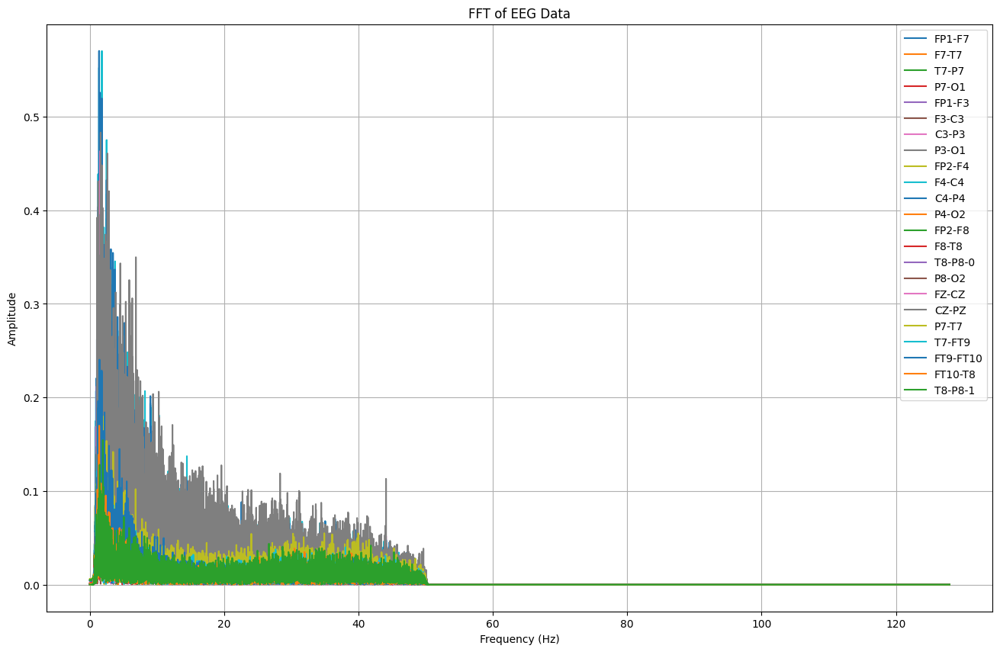

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3  \
0      0.004234  0.001527  0.000355  0.000684  0.004537  0.001109   
1      0.004251  0.001530  0.000358  0.000668  0.004546  0.001118   
2      0.004240  0.001533  0.000374  0.000676  0.004540  0.001117   
3      0.004248  0.001533  0.000358  0.000665  0.004539  0.001129   
4      0.004244  0.001542  0.000345  0.000650  0.004541  0.001118   
...         ...       ...       ...       ...       ...       ...   
22139  0.000040  0.000034  0.000015  0.000003  0.000061  0.000020   
22140  0.000040  0.000034  0.000015  0.000003  0.000061  0.000020   
22141  0.000040  0.000034  0.000015  0.000003  0.000061  0.000020   
22142  0.000040  0.000034  0.000015  0.000003  0.000061  0.000020   
22143  0.000040  0.000034  0.000015  0.000003  0.000061  0.000020   

              C3-P3     P3-O1    FP2-F4     F4-C4  ...     P8-O2     FZ-CZ  \
0      1.819097e-05  0.000248  0.005858  0

In [ ]:

# Simpan data setelah filtering ke file CSV
TA17 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb03_36.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA17.columns:
        signal = TA17[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_17 = pd.DataFrame(fft_features).T
TA_17.columns = channels
TA_17['seizure'] = TA17['seizure']
TA_17['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_17.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA17[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_17.to_csv("/content/drive/MyDrive/TA/FFT/chb03_36.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_17}")


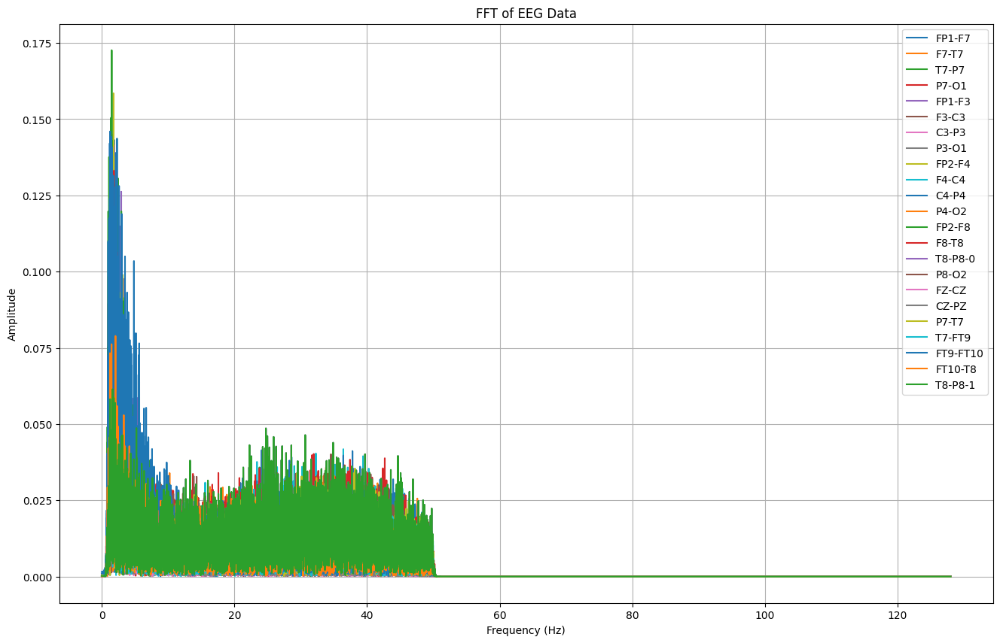

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.001563  0.000185  0.000576  0.000156  0.000935  0.000306  0.000189   
1      0.001546  0.000177  0.000581  0.000174  0.000919  0.000302  0.000194   
2      0.001556  0.000176  0.000583  0.000167  0.000934  0.000293  0.000194   
3      0.001581  0.000166  0.000591  0.000144  0.000973  0.000264  0.000202   
4      0.001574  0.000170  0.000598  0.000164  0.000973  0.000234  0.000196   
...         ...       ...       ...       ...       ...       ...       ...   
21627  0.000028  0.000008  0.000017  0.000012  0.000019  0.000004  0.000004   
21628  0.000028  0.000008  0.000017  0.000012  0.000019  0.000004  0.000004   
21629  0.000028  0.000008  0.000017  0.000012  0.000019  0.000004  0.000004   
21630  0.000028  0.000008  0.000017  0.000012  0.000019  0.000004  0.000004   
21631  0.000028  0.000008  0.000017  0.000012  0.000019  0.000004  0.000004   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA18 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb04_05.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA18.columns:
        signal = TA18[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_18 = pd.DataFrame(fft_features).T
TA_18.columns = channels
TA_18['seizure'] = TA18['seizure']
TA_18['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_18.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA18[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_18.to_csv("/content/drive/MyDrive/TA/FFT/chb04_05.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_18}")


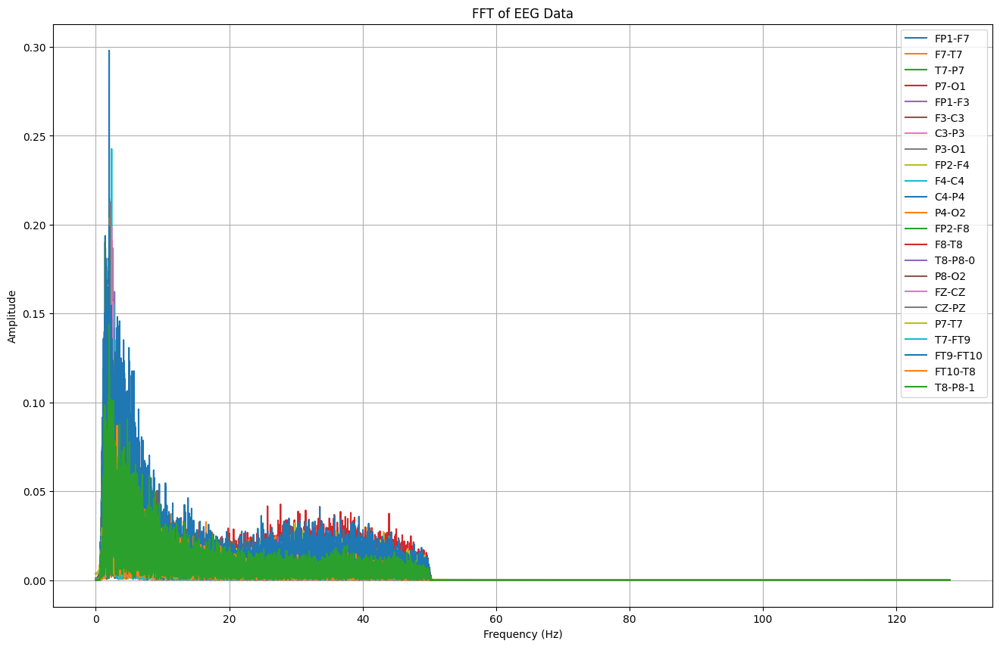

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.001143  0.000585  0.003525  0.000407  0.000051  0.000294  0.000697   
1      0.001152  0.000571  0.003514  0.000393  0.000060  0.000272  0.000704   
2      0.001138  0.000553  0.003527  0.000396  0.000036  0.000254  0.000706   
3      0.001116  0.000549  0.003533  0.000401  0.000007  0.000259  0.000717   
4      0.001140  0.000562  0.003543  0.000411  0.000060  0.000283  0.000692   
...         ...       ...       ...       ...       ...       ...       ...   
29563  0.000006  0.000020  0.000201  0.000182  0.000017  0.000013  0.000058   
29564  0.000006  0.000020  0.000201  0.000182  0.000017  0.000013  0.000058   
29565  0.000006  0.000020  0.000201  0.000182  0.000017  0.000013  0.000058   
29566  0.000006  0.000020  0.000201  0.000182  0.000017  0.000013  0.000058   
29567  0.000006  0.000020  0.000201  0.000182  0.000017  0.000013  0.000058   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA19 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb04_08.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA19.columns:
        signal = TA19[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_19 = pd.DataFrame(fft_features).T
TA_19.columns = channels
TA_19['seizure'] = TA19['seizure']
TA_19['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_19.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA19[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_19.to_csv("/content/drive/MyDrive/TA/FFT/chb04_08.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_19}")

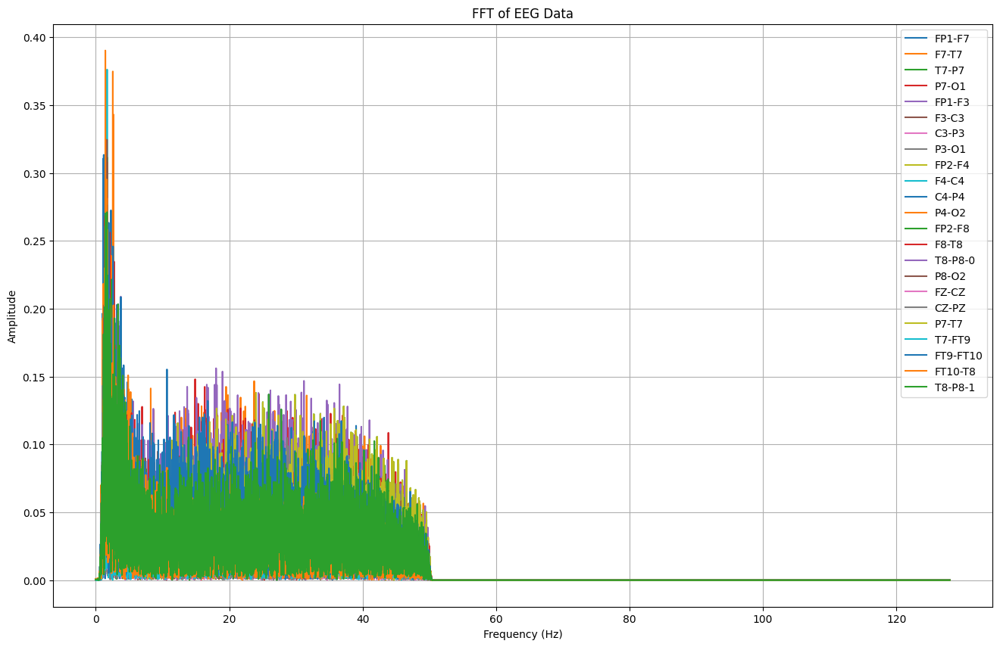

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3         F3-C3  \
0      0.000016  0.000254  0.000341  0.000332  0.000255  2.994122e-05   
1      0.000033  0.000266  0.000335  0.000319  0.000265  3.948260e-05   
2      0.000028  0.000258  0.000334  0.000323  0.000261  4.658147e-05   
3      0.000037  0.000280  0.000333  0.000322  0.000256  6.203594e-05   
4      0.000016  0.000278  0.000319  0.000334  0.000257  6.288631e-05   
...         ...       ...       ...       ...       ...           ...   
28411  0.000010  0.000007  0.000014  0.000006  0.000012  3.204663e-07   
28412  0.000010  0.000007  0.000014  0.000006  0.000012  3.204912e-07   
28413  0.000010  0.000007  0.000014  0.000006  0.000012  3.204788e-07   
28414  0.000010  0.000007  0.000014  0.000006  0.000012  3.204591e-07   
28415  0.000010  0.000007  0.000014  0.000006  0.000012  3.204995e-07   

          C3-P3     P3-O1    FP2-F4     F4-C4  ...     P8-O2     FZ-CZ  

In [ ]:

# Simpan data setelah filtering ke file CSV
TA20 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb04_28.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA20.columns:
        signal = TA20[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_20 = pd.DataFrame(fft_features).T
TA_20.columns = channels
TA_20['seizure'] = TA20['seizure']
TA_20['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_20.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA20[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_20.to_csv("/content/drive/MyDrive/TA/FFT/chb04_28.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_20}")


# SAMPEL 21-40

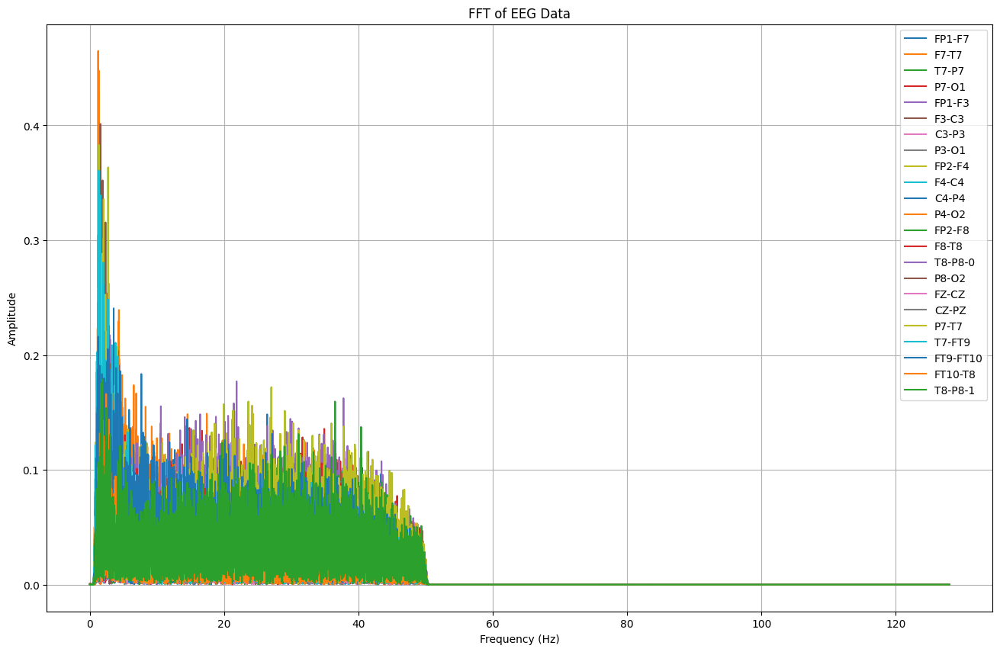

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000044  0.000322  0.000185  0.000045  0.000179  0.000209  0.000066   
1      0.000029  0.000323  0.000164  0.000035  0.000193  0.000201  0.000082   
2      0.000033  0.000329  0.000176  0.000033  0.000181  0.000203  0.000070   
3      0.000017  0.000322  0.000167  0.000051  0.000172  0.000165  0.000086   
4      0.000048  0.000361  0.000184  0.000073  0.000180  0.000196  0.000040   
...         ...       ...       ...       ...       ...       ...       ...   
30203  0.000013  0.000025  0.000051  0.000038  0.000002  0.000013  0.000045   
30204  0.000013  0.000025  0.000051  0.000038  0.000002  0.000013  0.000045   
30205  0.000013  0.000025  0.000051  0.000038  0.000002  0.000013  0.000045   
30206  0.000013  0.000025  0.000051  0.000038  0.000002  0.000013  0.000045   
30207  0.000013  0.000025  0.000051  0.000038  0.000002  0.000013  0.000045   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA20_1 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb04_28_1.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA20_1.columns:
        signal = TA20_1[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_20_1 = pd.DataFrame(fft_features).T
TA_20_1.columns = channels
TA_20_1['frekuensi'] = fft_freqs
TA_20_1['seizure'] = TA20_1['seizure']

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_20_1.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA20_1[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_20_1.to_csv("/content/drive/MyDrive/TA/FFT/chb04_28_1.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_20_1}")


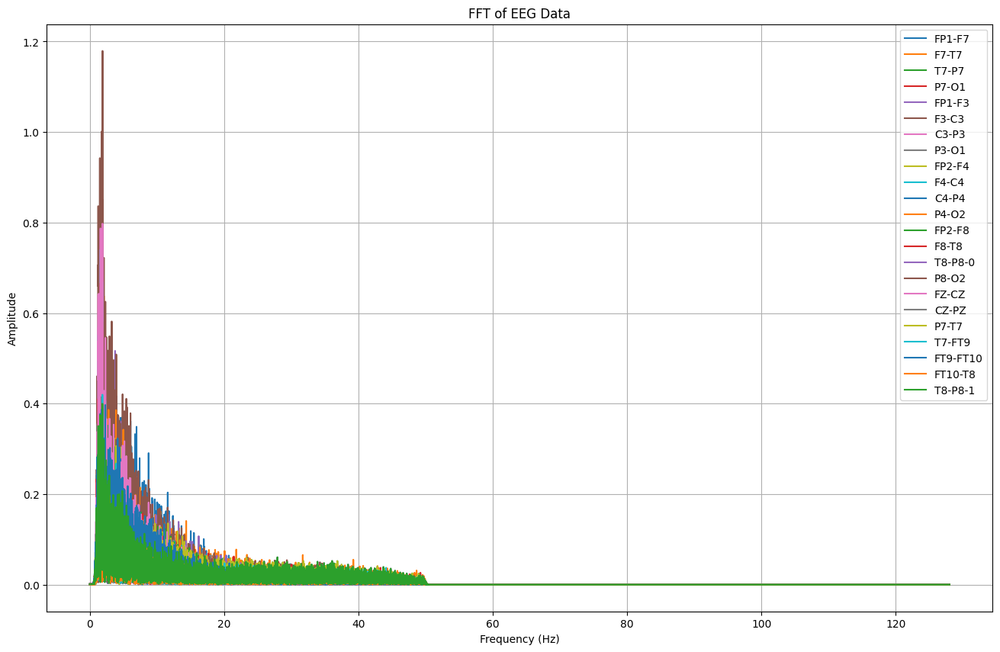

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000135  0.001151  0.000734  0.001561  0.001266  0.000651  0.000376   
1      0.000155  0.001170  0.000729  0.001574  0.001264  0.000676  0.000389   
2      0.000147  0.001171  0.000730  0.001576  0.001264  0.000670  0.000383   
3      0.000158  0.001165  0.000719  0.001573  0.001259  0.000683  0.000404   
4      0.000148  0.001165  0.000731  0.001570  0.001268  0.000657  0.000407   
...         ...       ...       ...       ...       ...       ...       ...   
30075  0.000018  0.000032  0.000011  0.000044  0.000002  0.000009  0.000006   
30076  0.000018  0.000032  0.000011  0.000044  0.000002  0.000009  0.000006   
30077  0.000018  0.000032  0.000011  0.000044  0.000002  0.000009  0.000006   
30078  0.000018  0.000032  0.000011  0.000044  0.000002  0.000009  0.000006   
30079  0.000018  0.000032  0.000011  0.000044  0.000002  0.000009  0.000006   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA21 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb05_06.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA21.columns:
        signal = TA21[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_21 = pd.DataFrame(fft_features).T
TA_21.columns = channels
TA_21['frekuensi'] = fft_freqs
TA_21['seizure'] = TA21['seizure']

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_21.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA21[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_21.to_csv("/content/drive/MyDrive/TA/FFT/chb05_06.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_21}")


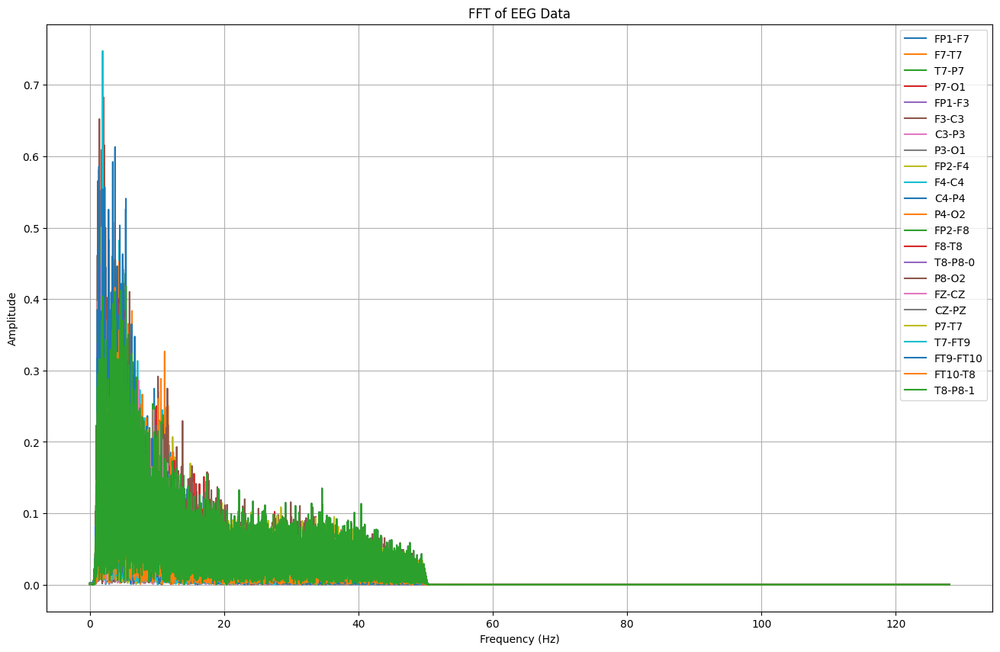

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000015  0.002025  0.000675  0.001422  0.000410  0.000914  0.001573   
1      0.000028  0.002013  0.000667  0.001434  0.000401  0.000904  0.001584   
2      0.000030  0.002003  0.000668  0.001436  0.000406  0.000901  0.001590   
3      0.000030  0.002002  0.000659  0.001432  0.000410  0.000899  0.001578   
4      0.000042  0.002020  0.000667  0.001429  0.000410  0.000911  0.001593   
...         ...       ...       ...       ...       ...       ...       ...   
29435  0.000053  0.000006  0.000097  0.000021  0.000033  0.000009  0.000041   
29436  0.000053  0.000006  0.000097  0.000021  0.000033  0.000009  0.000041   
29437  0.000053  0.000006  0.000097  0.000021  0.000033  0.000009  0.000041   
29438  0.000053  0.000006  0.000097  0.000021  0.000033  0.000009  0.000041   
29439  0.000053  0.000006  0.000097  0.000021  0.000033  0.000009  0.000041   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA22 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb05_13.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA22.columns:
        signal = TA22[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_22 = pd.DataFrame(fft_features).T
TA_22.columns = channels
TA_22['frekuensi'] = fft_freqs
TA_22['seizure'] = TA22['seizure']

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_22.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA22[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_22.to_csv("/content/drive/MyDrive/TA/FFT/chb05_13.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_22}")


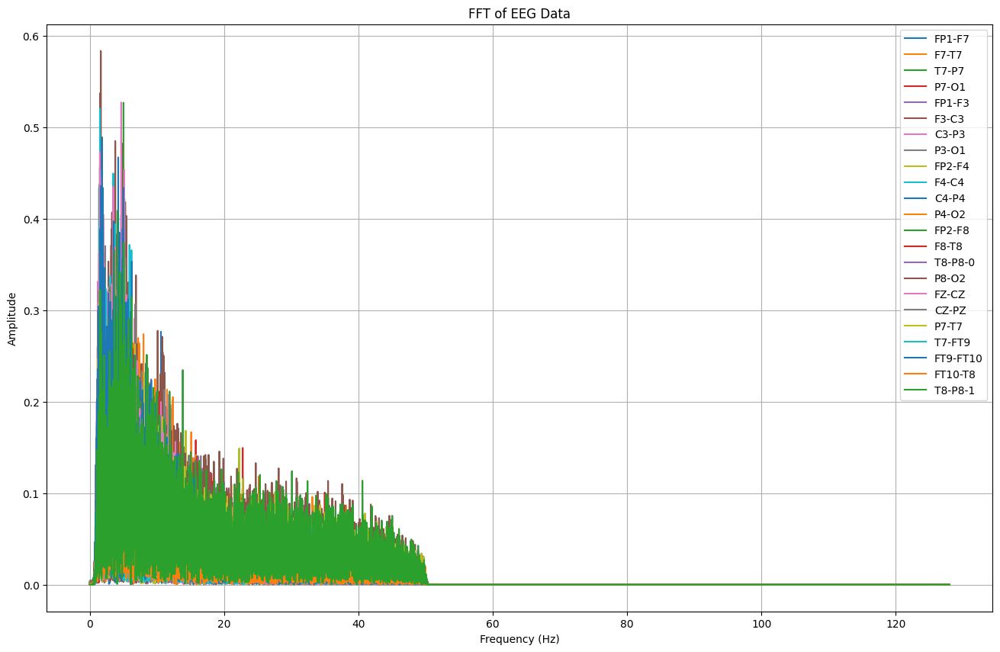

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000610  0.000532  0.000149  0.001457  0.000961  0.002732  0.000993   
1      0.000620  0.000519  0.000144  0.001447  0.000952  0.002741  0.001001   
2      0.000620  0.000516  0.000146  0.001444  0.000948  0.002734  0.001005   
3      0.000614  0.000513  0.000137  0.001448  0.000954  0.002753  0.001002   
4      0.000617  0.000514  0.000146  0.001451  0.000952  0.002740  0.001006   
...         ...       ...       ...       ...       ...       ...       ...   
27643  0.000016  0.000004  0.000034  0.000004  0.000035  0.000006  0.000050   
27644  0.000016  0.000004  0.000034  0.000004  0.000035  0.000006  0.000050   
27645  0.000016  0.000004  0.000034  0.000004  0.000035  0.000006  0.000050   
27646  0.000016  0.000004  0.000034  0.000004  0.000035  0.000006  0.000050   
27647  0.000016  0.000004  0.000034  0.000004  0.000035  0.000006  0.000050   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA23 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb05_16.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA23.columns:
        signal = TA23[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_23 = pd.DataFrame(fft_features).T
TA_23.columns = channels
TA_23['frekuensi'] = fft_freqs
TA_23['seizure'] = TA23['seizure']

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_23.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA23[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_23.to_csv("/content/drive/MyDrive/TA/FFT/chb05_16.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_23}")


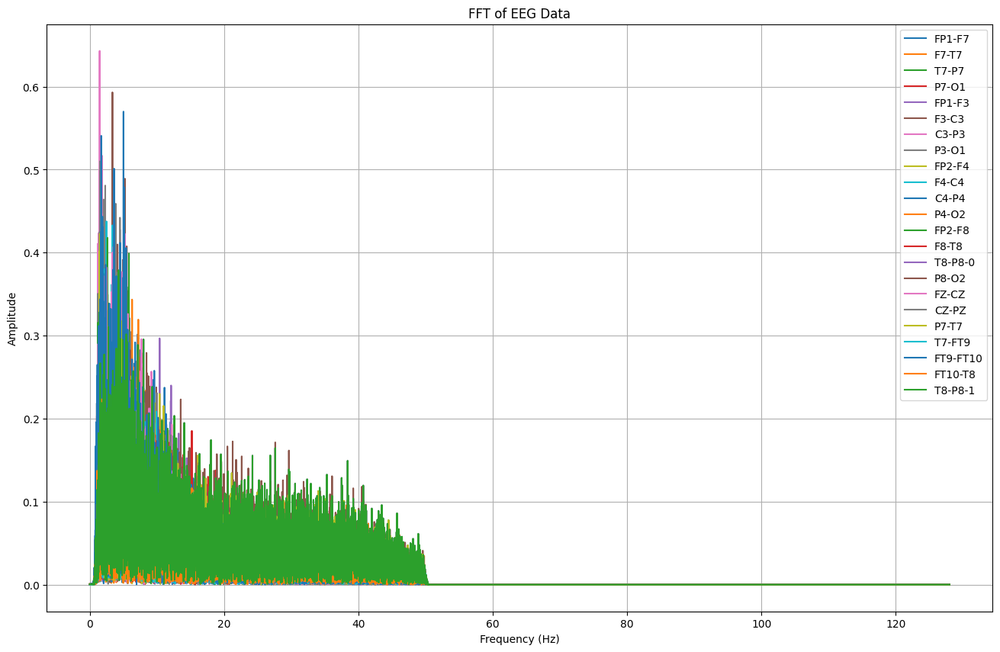

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7         F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3  \
0      0.000403  1.990871e-04  0.000399  0.000111  0.000371  0.000351   
1      0.000414  2.116801e-04  0.000408  0.000100  0.000384  0.000363   
2      0.000407  2.177464e-04  0.000410  0.000098  0.000378  0.000355   
3      0.000423  2.142858e-04  0.000404  0.000096  0.000390  0.000360   
4      0.000416  2.001292e-04  0.000409  0.000099  0.000376  0.000359   
...         ...           ...       ...       ...       ...       ...   
30715  0.000016  3.647598e-07  0.000003  0.000004  0.000012  0.000007   
30716  0.000016  3.647290e-07  0.000003  0.000004  0.000012  0.000007   
30717  0.000016  3.648996e-07  0.000003  0.000004  0.000012  0.000007   
30718  0.000016  3.651198e-07  0.000003  0.000004  0.000012  0.000007   
30719  0.000016  3.650195e-07  0.000003  0.000004  0.000012  0.000007   

          C3-P3     P3-O1    FP2-F4     F4-C4  ...     P8-O2     FZ-CZ  

In [ ]:

# Simpan data setelah filtering ke file CSV
TA24 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb05_17.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA24.columns:
        signal = TA24[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_24 = pd.DataFrame(fft_features).T
TA_24.columns = channels
TA_24['frekuensi'] = fft_freqs
TA_24['seizure'] = TA24['seizure']

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_24.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA24[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_24.to_csv("/content/drive/MyDrive/TA/FFT/chb05_17.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_24}")


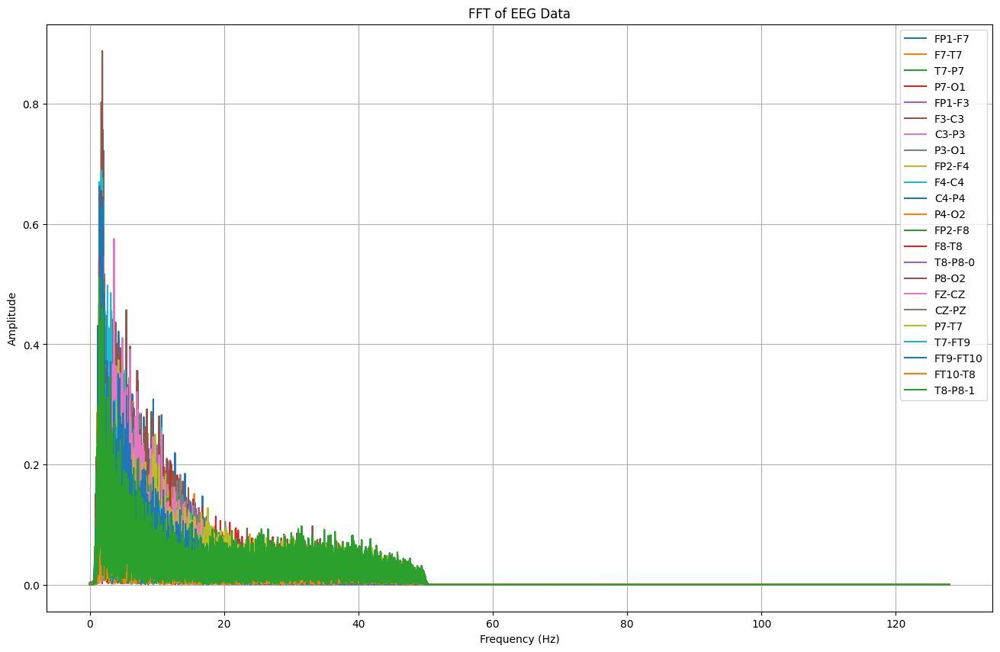

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.001238  0.001689  0.001349  0.000872  0.001998  0.000126  0.000332   
1      0.001230  0.001670  0.001354  0.000861  0.001997  0.000144  0.000322   
2      0.001230  0.001676  0.001349  0.000858  0.001991  0.000133  0.000325   
3      0.001225  0.001679  0.001375  0.000865  0.001991  0.000155  0.000318   
4      0.001231  0.001667  0.001350  0.000861  0.001975  0.000116  0.000323   
...         ...       ...       ...       ...       ...       ...       ...   
30331  0.000033  0.000021  0.000002  0.000042  0.000017  0.000026  0.000029   
30332  0.000033  0.000021  0.000002  0.000042  0.000017  0.000026  0.000029   
30333  0.000033  0.000021  0.000002  0.000042  0.000017  0.000026  0.000029   
30334  0.000033  0.000021  0.000002  0.000042  0.000017  0.000026  0.000029   
30335  0.000033  0.000021  0.000002  0.000042  0.000017  0.000026  0.000029   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA25 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb05_22.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA25.columns:
        signal = TA25[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_25 = pd.DataFrame(fft_features).T
TA_25.columns = channels
TA_25['frekuensi'] = fft_freqs
TA_25['seizure'] = TA25['seizure']

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_25.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA25[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_25.to_csv("/content/drive/MyDrive/TA/FFT/chb05_22.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_25}")


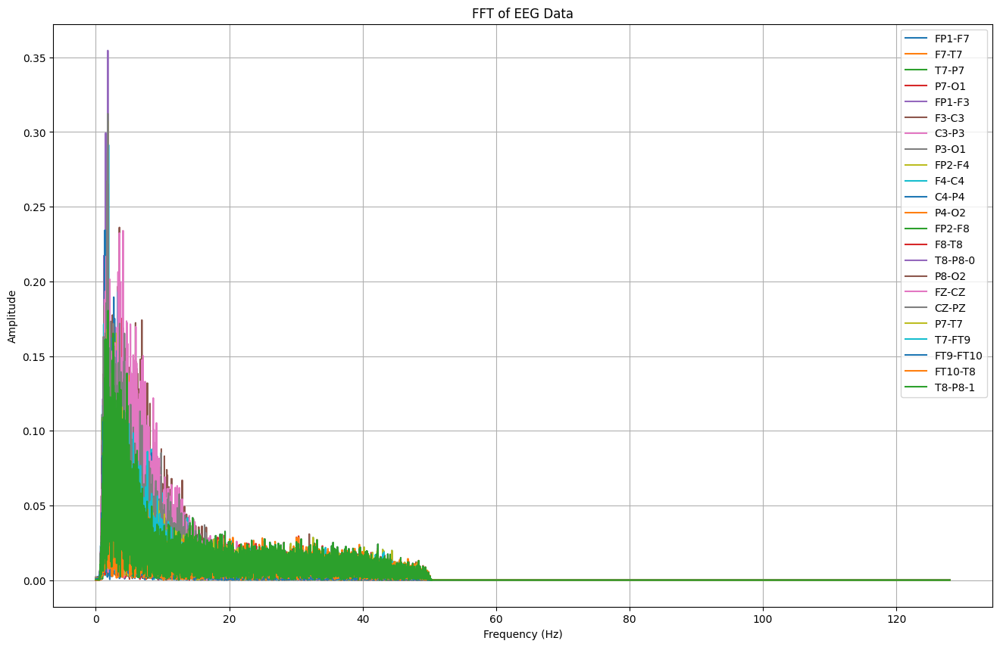

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.002092  0.001530  0.000919  0.000048  0.000717  0.000813  0.000634   
1      0.002098  0.001523  0.000911  0.000053  0.000723  0.000806  0.000639   
2      0.002097  0.001520  0.000911  0.000047  0.000727  0.000812  0.000643   
3      0.002104  0.001522  0.000913  0.000054  0.000725  0.000808  0.000641   
4      0.002114  0.001522  0.000917  0.000061  0.000727  0.000793  0.000637   
...         ...       ...       ...       ...       ...       ...       ...   
17147  0.000005  0.000009  0.000031  0.000044  0.000021  0.000017  0.000026   
17148  0.000005  0.000009  0.000031  0.000044  0.000021  0.000017  0.000026   
17149  0.000005  0.000009  0.000031  0.000044  0.000021  0.000017  0.000026   
17150  0.000005  0.000009  0.000031  0.000044  0.000021  0.000017  0.000026   
17151  0.000005  0.000009  0.000031  0.000044  0.000021  0.000017  0.000026   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA26 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb06_01.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA26.columns:
        signal = TA26[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_26 = pd.DataFrame(fft_features).T
TA_26.columns = channels
TA_26['frekuensi'] = fft_freqs
TA_26['seizure'] = TA26['seizure']

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_26.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA26[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_26.to_csv("/content/drive/MyDrive/TA/FFT/chb06_01.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_26}")


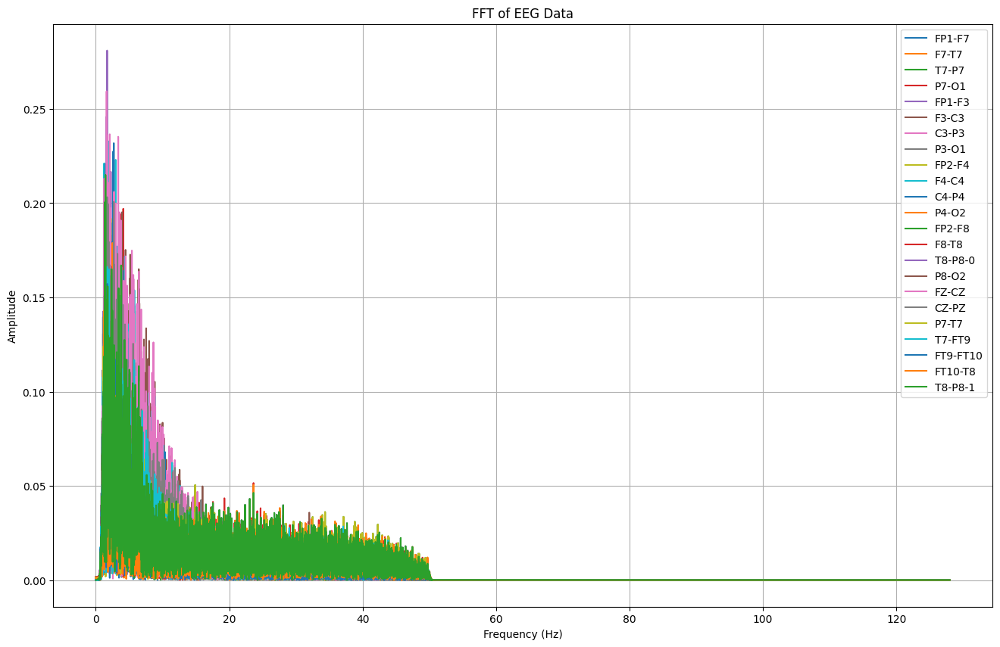

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000730  0.000948  0.001425  0.001149  0.001714  0.000996  0.001044   
1      0.000722  0.000955  0.001433  0.001143  0.001704  0.001002  0.001051   
2      0.000720  0.000962  0.001425  0.001144  0.001705  0.001004  0.001049   
3      0.000727  0.000951  0.001438  0.001143  0.001706  0.001002  0.001049   
4      0.000723  0.000955  0.001431  0.001137  0.001707  0.001008  0.001049   
...         ...       ...       ...       ...       ...       ...       ...   
17275  0.000005  0.000004  0.000017  0.000073  0.000014  0.000008  0.000008   
17276  0.000005  0.000004  0.000017  0.000073  0.000014  0.000008  0.000008   
17277  0.000005  0.000004  0.000017  0.000073  0.000014  0.000008  0.000008   
17278  0.000005  0.000004  0.000017  0.000073  0.000014  0.000008  0.000008   
17279  0.000005  0.000004  0.000017  0.000073  0.000014  0.000008  0.000008   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA26_1 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb06_01_1.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA26_1.columns:
        signal = TA26_1[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_26_1 = pd.DataFrame(fft_features).T
TA_26_1.columns = channels
TA_26_1['frekuensi'] = fft_freqs
TA_26_1['seizure'] = TA26_1['seizure']

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_26_1.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA26_1[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_26_1.to_csv("/content/drive/MyDrive/TA/FFT/chb06_01_1.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_26_1}")


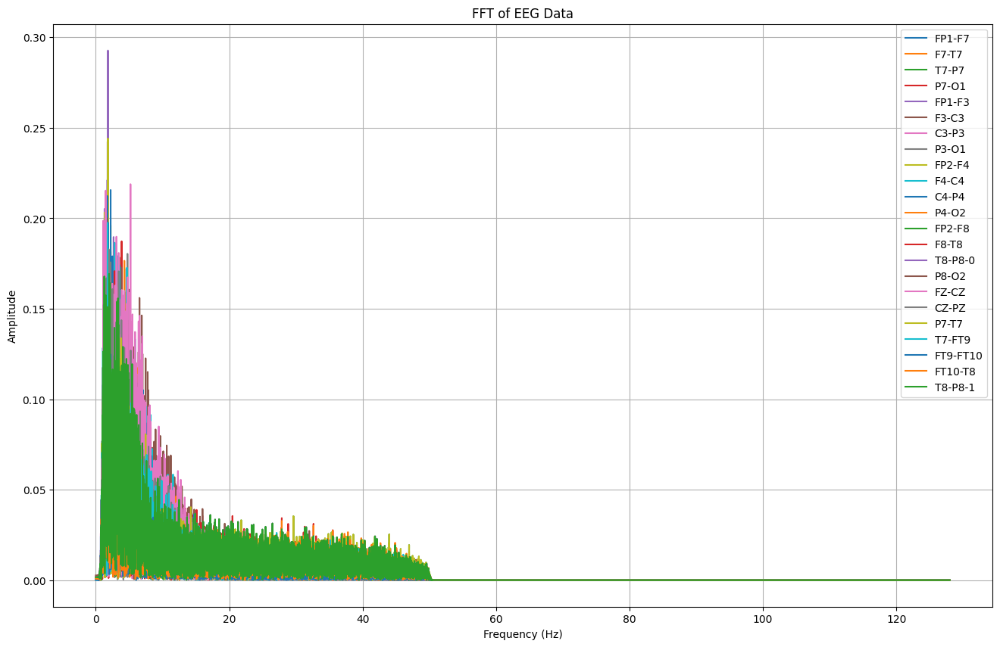

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000195  0.001412  0.001243  0.000807  0.000484  0.000334  0.001828   
1      0.000203  0.001419  0.001248  0.000803  0.000475  0.000340  0.001834   
2      0.000202  0.001419  0.001249  0.000808  0.000477  0.000338  0.001836   
3      0.000198  0.001415  0.001255  0.000806  0.000479  0.000339  0.001834   
4      0.000197  0.001427  0.001254  0.000811  0.000486  0.000346  0.001840   
...         ...       ...       ...       ...       ...       ...       ...   
17275  0.000007  0.000002  0.000003  0.000003  0.000009  0.000020  0.000019   
17276  0.000007  0.000002  0.000003  0.000003  0.000009  0.000020  0.000019   
17277  0.000007  0.000002  0.000003  0.000003  0.000009  0.000020  0.000019   
17278  0.000007  0.000002  0.000003  0.000003  0.000009  0.000020  0.000019   
17279  0.000007  0.000002  0.000003  0.000003  0.000009  0.000020  0.000019   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA26_2 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb06_01_2.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA26_2.columns:
        signal = TA26_2[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_26_2 = pd.DataFrame(fft_features).T
TA_26_2.columns = channels
TA_26_2['frekuensi'] = fft_freqs
TA_26_2['seizure'] = TA26_2['seizure']

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_26_2.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA26_2[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_26_2.to_csv("/content/drive/MyDrive/TA/FFT/chb06_01_2.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_26_2}")


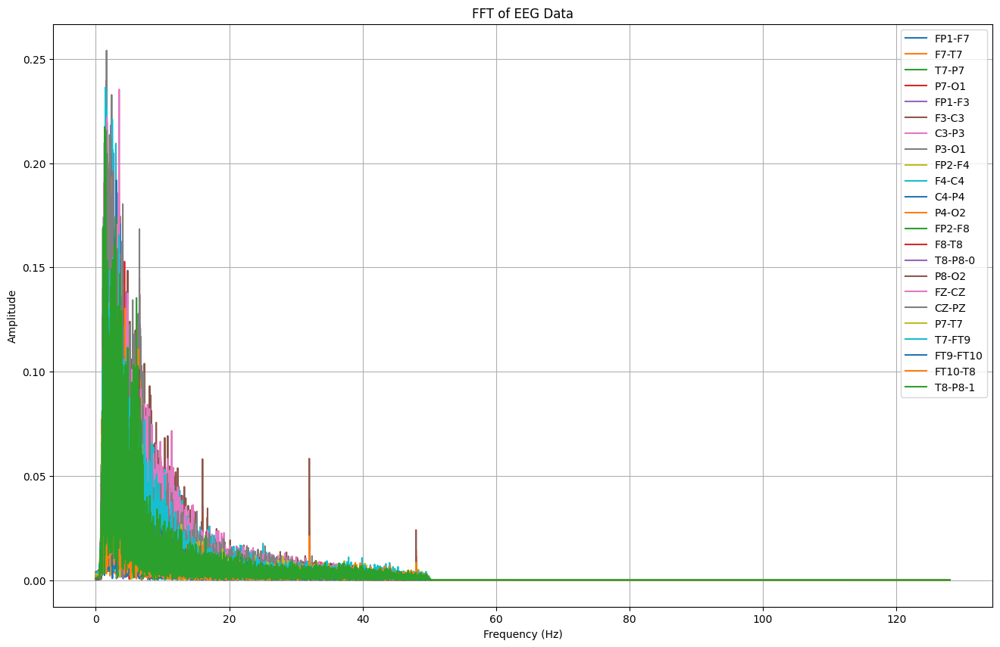

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.002650  0.002301  0.002698  0.002281  0.003949  0.001108  0.002325   
1      0.002655  0.002296  0.002702  0.002295  0.003956  0.001104  0.002337   
2      0.002661  0.002296  0.002698  0.002301  0.003961  0.001103  0.002337   
3      0.002652  0.002295  0.002709  0.002291  0.003954  0.001102  0.002334   
4      0.002649  0.002285  0.002724  0.002275  0.003966  0.001107  0.002338   
...         ...       ...       ...       ...       ...       ...       ...   
17915  0.000050  0.000002  0.000060  0.000067  0.000068  0.000032  0.000048   
17916  0.000050  0.000002  0.000060  0.000067  0.000068  0.000032  0.000048   
17917  0.000050  0.000002  0.000060  0.000067  0.000068  0.000032  0.000048   
17918  0.000050  0.000002  0.000060  0.000067  0.000068  0.000032  0.000048   
17919  0.000050  0.000002  0.000060  0.000067  0.000068  0.000032  0.000048   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA27 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb06_04.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA27.columns:
        signal = TA27[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_27 = pd.DataFrame(fft_features).T
TA_27.columns = channels
TA_27['frekuensi'] = fft_freqs
TA_27['seizure'] = TA27['seizure']

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_27.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA27[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_27.to_csv("/content/drive/MyDrive/TA/FFT/chb06_04.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_27}")


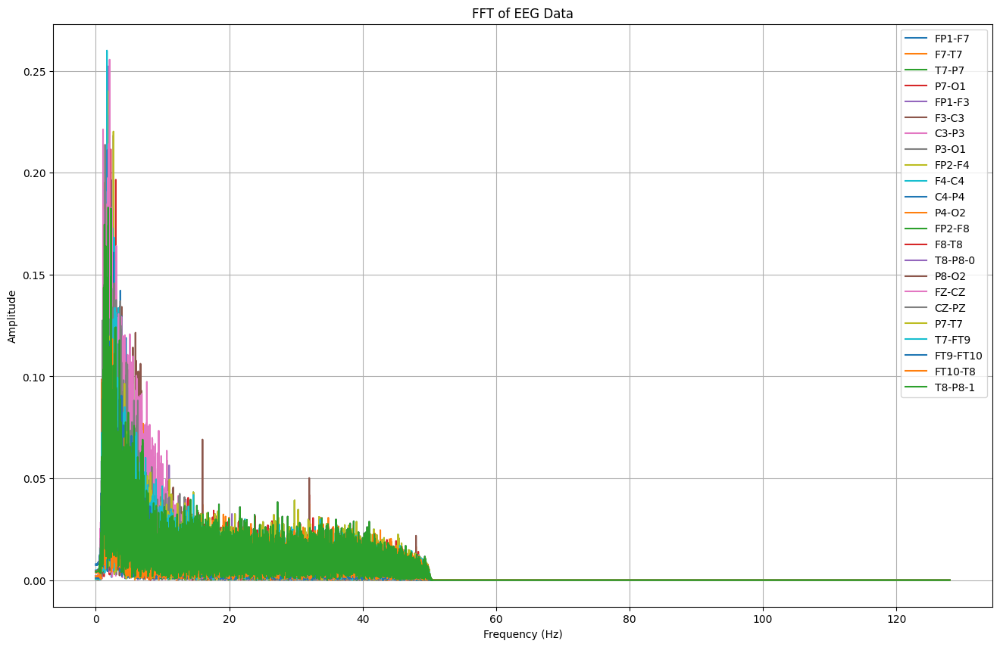

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.007363  0.003708  0.000555  0.001869  0.001845  0.000524  0.002061   
1      0.007376  0.003700  0.000560  0.001860  0.001854  0.000535  0.002066   
2      0.007373  0.003703  0.000561  0.001861  0.001857  0.000535  0.002066   
3      0.007374  0.003695  0.000565  0.001882  0.001852  0.000511  0.002082   
4      0.007361  0.003714  0.000570  0.001853  0.001859  0.000530  0.002066   
...         ...       ...       ...       ...       ...       ...       ...   
17915  0.000004  0.000015  0.000005  0.000062  0.000014  0.000124  0.000044   
17916  0.000004  0.000015  0.000005  0.000062  0.000014  0.000124  0.000044   
17917  0.000004  0.000015  0.000005  0.000062  0.000014  0.000124  0.000044   
17918  0.000004  0.000015  0.000005  0.000062  0.000014  0.000124  0.000044   
17919  0.000004  0.000015  0.000005  0.000062  0.000014  0.000124  0.000044   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA27_1 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb06_04_1.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA27_1.columns:
        signal = TA27_1[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_27_1 = pd.DataFrame(fft_features).T
TA_27_1.columns = channels
TA_27_1['frekuensi'] = fft_freqs
TA_27_1['seizure'] = TA27_1['seizure']

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_27_1.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA27_1[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_27_1.to_csv("/content/drive/MyDrive/TA/FFT/chb06_04_1.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_27_1}")


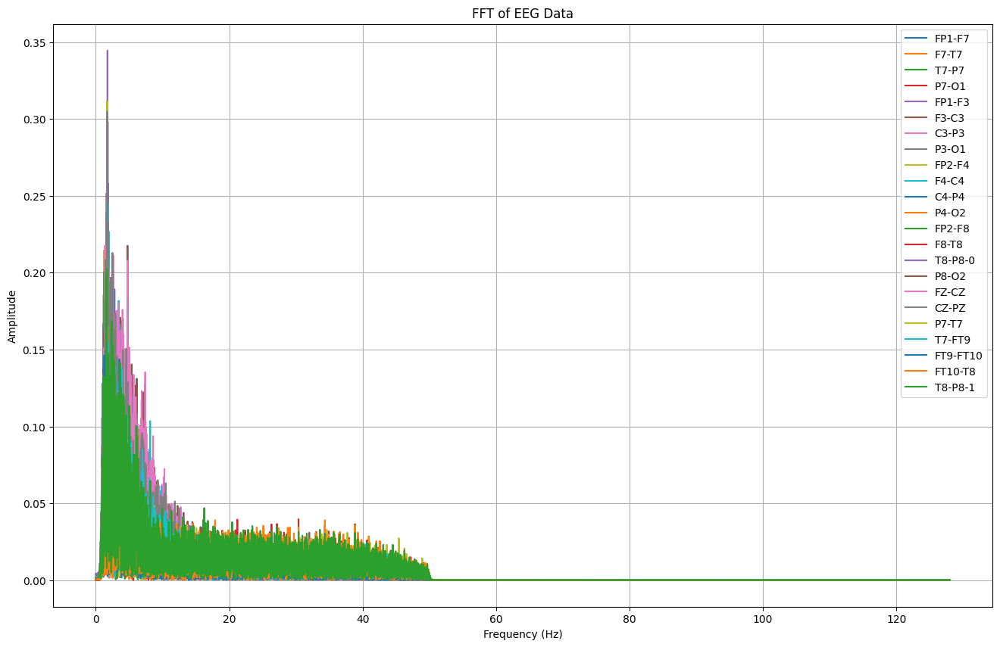

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3         F3-C3  \
0      0.003584  0.001797  0.001419  0.001166  0.004070  2.136016e-03   
1      0.003580  0.001794  0.001412  0.001173  0.004066  2.129526e-03   
2      0.003580  0.001786  0.001419  0.001165  0.004063  2.126714e-03   
3      0.003594  0.001792  0.001417  0.001179  0.004085  2.123984e-03   
4      0.003587  0.001781  0.001426  0.001183  0.004062  2.118327e-03   
...         ...       ...       ...       ...       ...           ...   
17403  0.000051  0.000036  0.000033  0.000083  0.000087  6.266355e-07   
17404  0.000051  0.000036  0.000033  0.000083  0.000087  6.266124e-07   
17405  0.000051  0.000036  0.000033  0.000083  0.000087  6.265863e-07   
17406  0.000051  0.000036  0.000033  0.000083  0.000087  6.265811e-07   
17407  0.000051  0.000036  0.000033  0.000083  0.000087  6.265895e-07   

          C3-P3     P3-O1    FP2-F4     F4-C4  ...     P8-O2     FZ-CZ  

In [ ]:

# Simpan data setelah filtering ke file CSV
TA28 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb06_09.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA28.columns:
        signal = TA28[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_28 = pd.DataFrame(fft_features).T
TA_28.columns = channels
TA_28['frekuensi'] = fft_freqs
TA_28['seizure'] = TA28['seizure']

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_28.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA28[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_28.to_csv("/content/drive/MyDrive/TA/FFT/chb06_09.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_28}")


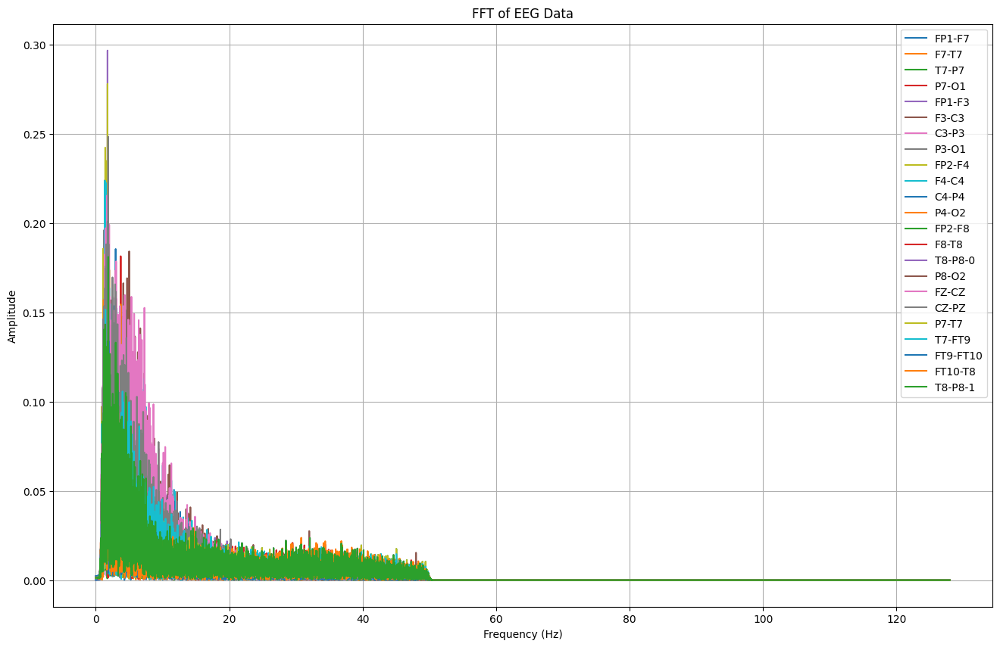

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000948  0.001130  0.001295  0.000280  0.001996  0.002264  0.001436   
1      0.000940  0.001137  0.001302  0.000275  0.001986  0.002268  0.001444   
2      0.000942  0.001139  0.001301  0.000271  0.001987  0.002270  0.001441   
3      0.000942  0.001134  0.001302  0.000286  0.001992  0.002272  0.001442   
4      0.000944  0.001139  0.001305  0.000283  0.001997  0.002281  0.001442   
...         ...       ...       ...       ...       ...       ...       ...   
16891  0.000007  0.000018  0.000011  0.000017  0.000017  0.000033  0.000014   
16892  0.000007  0.000018  0.000011  0.000017  0.000017  0.000033  0.000014   
16893  0.000007  0.000018  0.000011  0.000017  0.000017  0.000033  0.000014   
16894  0.000007  0.000018  0.000011  0.000017  0.000017  0.000033  0.000014   
16895  0.000007  0.000018  0.000011  0.000017  0.000017  0.000033  0.000014   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA29 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb06_10.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA29.columns:
        signal = TA29[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_29 = pd.DataFrame(fft_features).T
TA_29.columns = channels
TA_29['frekuensi'] = fft_freqs
TA_29['seizure'] = TA29['seizure']

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_29.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA29[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_29.to_csv("/content/drive/MyDrive/TA/FFT/chb06_10.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_29}")


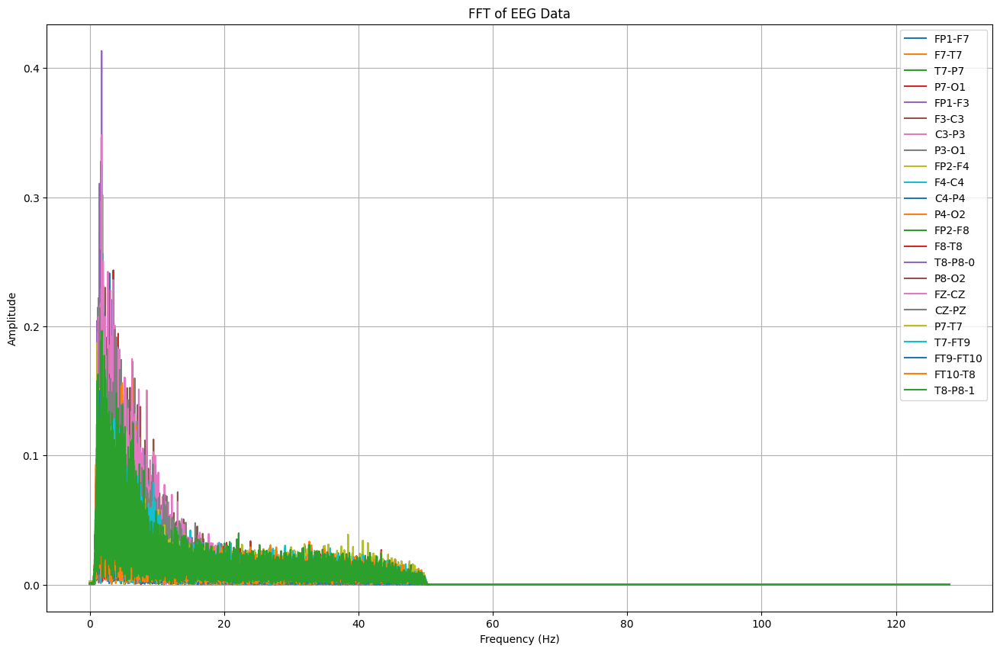

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.001333  0.000810  0.002690  0.000753  0.000076  0.000766  0.000563   
1      0.001336  0.000808  0.002679  0.000749  0.000072  0.000759  0.000558   
2      0.001328  0.000801  0.002686  0.000736  0.000084  0.000763  0.000557   
3      0.001336  0.000799  0.002686  0.000760  0.000070  0.000761  0.000563   
4      0.001336  0.000804  0.002687  0.000760  0.000070  0.000760  0.000559   
...         ...       ...       ...       ...       ...       ...       ...   
17019  0.000003  0.000011  0.000050  0.000062  0.000016  0.000019  0.000055   
17020  0.000003  0.000011  0.000050  0.000062  0.000016  0.000019  0.000055   
17021  0.000003  0.000011  0.000050  0.000062  0.000016  0.000019  0.000055   
17022  0.000003  0.000011  0.000050  0.000062  0.000016  0.000019  0.000055   
17023  0.000003  0.000011  0.000050  0.000062  0.000016  0.000019  0.000055   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA30 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb06_13.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA30.columns:
        signal = TA30[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_30 = pd.DataFrame(fft_features).T
TA_30.columns = channels
TA_30['frekuensi'] = fft_freqs
TA_30['seizure'] = TA30['seizure']

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_30.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA30[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_30.to_csv("/content/drive/MyDrive/TA/FFT/chb06_13.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_30}")


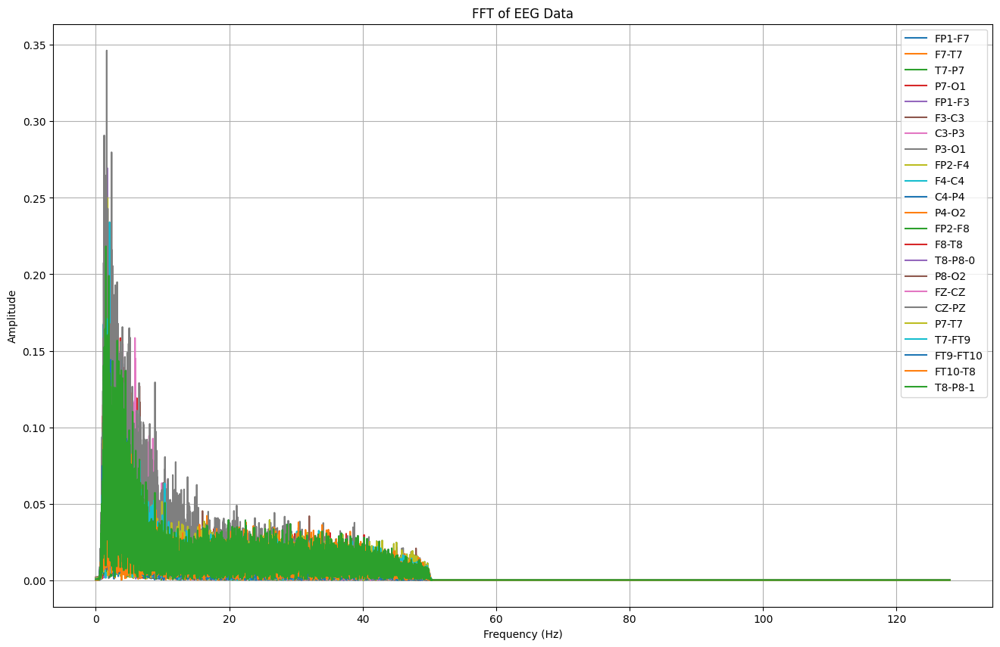

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000620  0.000582  0.001374  0.001641  0.001705  0.000329  0.000575   
1      0.000608  0.000582  0.001368  0.001648  0.001697  0.000323  0.000570   
2      0.000624  0.000555  0.001372  0.001650  0.001691  0.000323  0.000573   
3      0.000591  0.000602  0.001372  0.001644  0.001702  0.000315  0.000574   
4      0.000626  0.000571  0.001365  0.001646  0.001710  0.000323  0.000563   
...         ...       ...       ...       ...       ...       ...       ...   
16891  0.000007  0.000019  0.000059  0.000032  0.000034  0.000024  0.000051   
16892  0.000007  0.000019  0.000059  0.000032  0.000034  0.000024  0.000051   
16893  0.000007  0.000019  0.000059  0.000032  0.000034  0.000024  0.000051   
16894  0.000007  0.000019  0.000059  0.000032  0.000034  0.000024  0.000051   
16895  0.000007  0.000019  0.000059  0.000032  0.000034  0.000024  0.000051   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA31 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb06_18.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA31.columns:
        signal = TA31[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_31 = pd.DataFrame(fft_features).T
TA_31.columns = channels
TA_31['frekuensi'] = fft_freqs
TA_31['seizure'] = TA31['seizure']

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_31.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA31[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_31.to_csv("/content/drive/MyDrive/TA/FFT/chb06_18.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_31}")


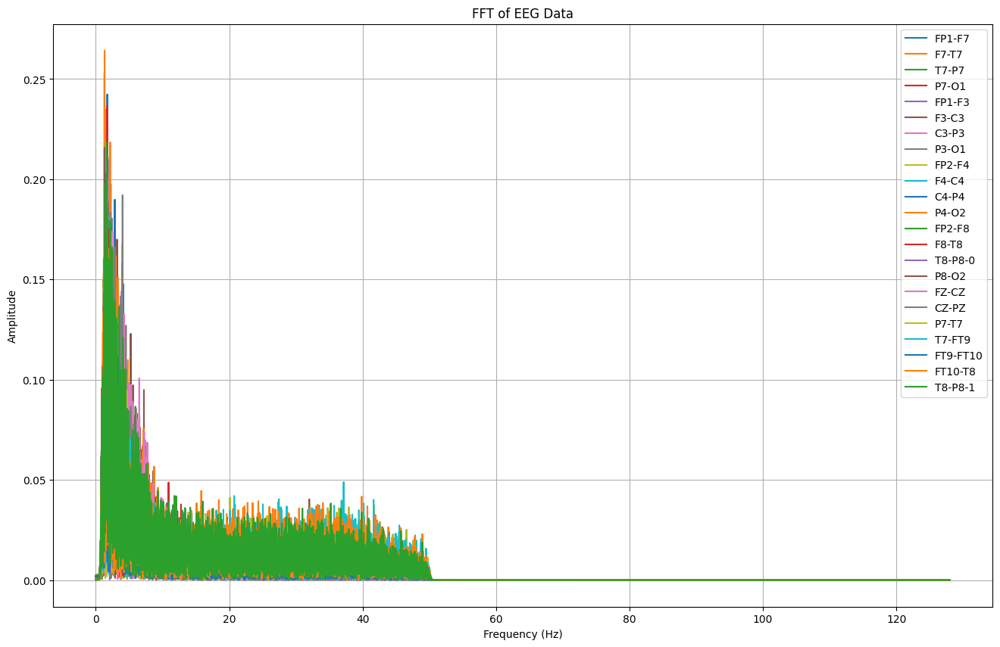

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.001599  0.000345  0.000259  0.000168  0.002133  0.000155  0.000466   
1      0.001602  0.000334  0.000253  0.000174  0.002139  0.000161  0.000466   
2      0.001599  0.000336  0.000244  0.000191  0.002147  0.000151  0.000466   
3      0.001614  0.000335  0.000242  0.000169  0.002152  0.000156  0.000456   
4      0.001627  0.000317  0.000269  0.000156  0.002160  0.000193  0.000494   
...         ...       ...       ...       ...       ...       ...       ...   
17403  0.000003  0.000059  0.000051  0.000052  0.000014  0.000003  0.000038   
17404  0.000003  0.000059  0.000051  0.000052  0.000014  0.000003  0.000038   
17405  0.000003  0.000059  0.000051  0.000052  0.000014  0.000003  0.000038   
17406  0.000003  0.000059  0.000051  0.000052  0.000014  0.000003  0.000038   
17407  0.000003  0.000059  0.000051  0.000052  0.000014  0.000003  0.000038   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA32 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb06_24.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA32.columns:
        signal = TA32[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_32 = pd.DataFrame(fft_features).T
TA_32.columns = channels
TA_32['frekuensi'] = fft_freqs
TA_32['seizure'] = TA32['seizure']

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_32.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA32[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_32.to_csv("/content/drive/MyDrive/TA/FFT/chb06_24.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_32}")


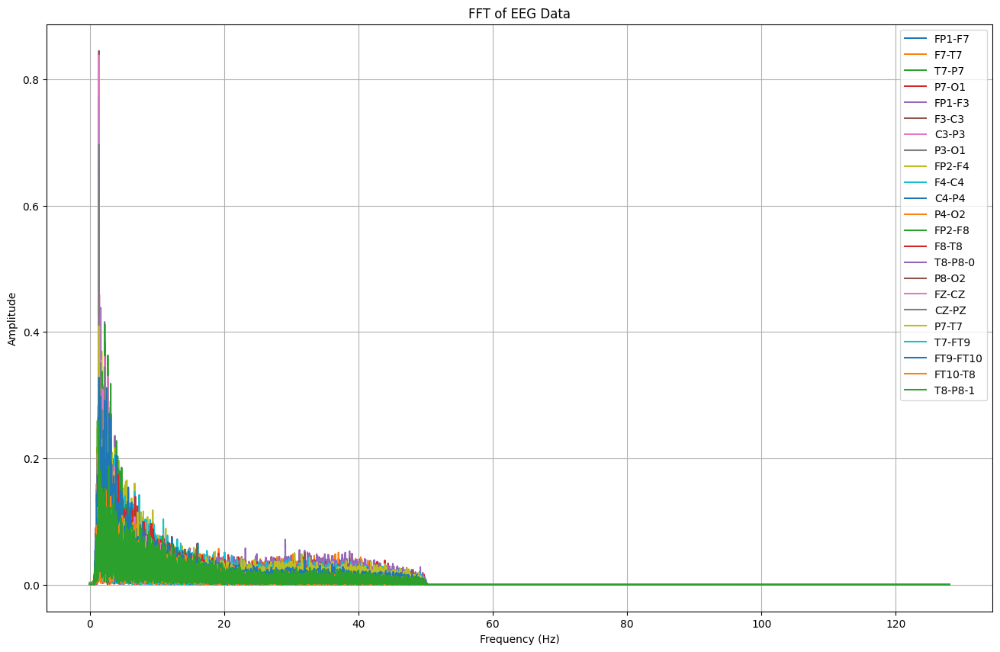

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7         P7-O1    FP1-F3     F3-C3  \
0      0.002093  0.000604  0.000610  2.932685e-04  0.001523  0.001095   
1      0.002081  0.000595  0.000597  2.747553e-04  0.001519  0.001086   
2      0.002074  0.000597  0.000606  2.987820e-04  0.001506  0.001092   
3      0.002082  0.000585  0.000603  2.723128e-04  0.001516  0.001083   
4      0.002080  0.000597  0.000593  3.252913e-04  0.001503  0.001089   
...         ...       ...       ...           ...       ...       ...   
26363  0.000018  0.000021  0.000005  5.269215e-07  0.000010  0.000011   
26364  0.000018  0.000021  0.000005  5.270099e-07  0.000010  0.000011   
26365  0.000018  0.000021  0.000005  5.268904e-07  0.000010  0.000011   
26366  0.000018  0.000021  0.000005  5.269394e-07  0.000010  0.000011   
26367  0.000018  0.000021  0.000005  5.269226e-07  0.000010  0.000011   

          C3-P3     P3-O1    FP2-F4     F4-C4  ...     P8-O2     FZ-CZ  

In [ ]:

# Simpan data setelah filtering ke file CSV
TA33 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb07_12.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA33.columns:
        signal = TA33[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_33 = pd.DataFrame(fft_features).T
TA_33.columns = channels
TA_33['frekuensi'] = fft_freqs
TA_33['seizure'] = TA33['seizure']

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_33.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA33[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_33.to_csv("/content/drive/MyDrive/TA/FFT/chb07_12.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_33}")


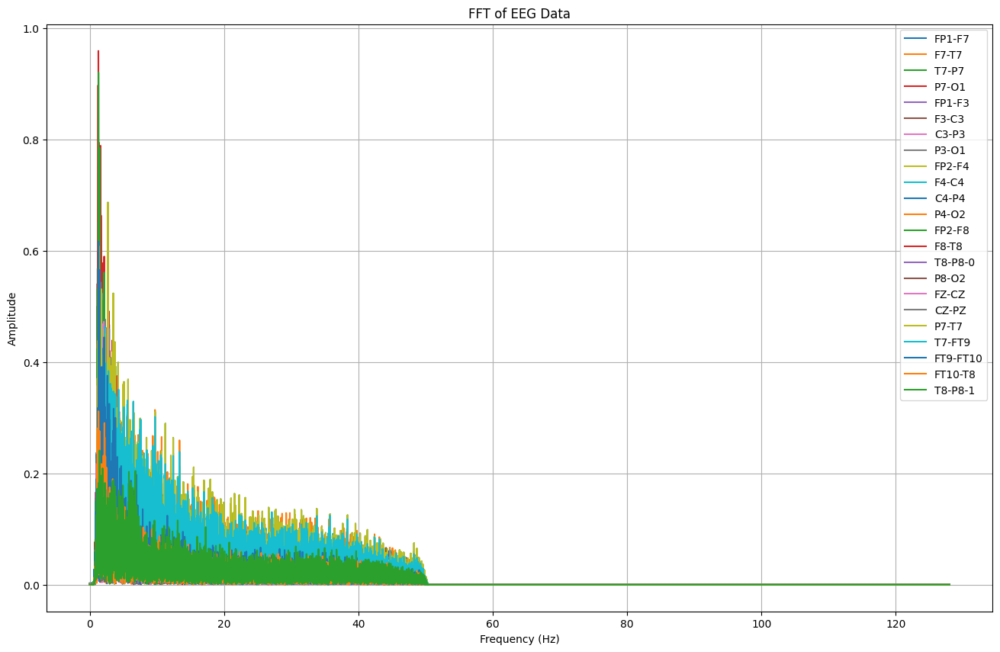

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.001744  0.001163  0.000868  0.000652  0.000895  0.000526  0.001507   
1      0.001756  0.001176  0.000868  0.000632  0.000907  0.000532  0.001519   
2      0.001763  0.001188  0.000867  0.000649  0.000893  0.000534  0.001520   
3      0.001753  0.001215  0.000830  0.000617  0.000927  0.000546  0.001498   
4      0.001764  0.001200  0.000863  0.000652  0.000870  0.000559  0.001525   
...         ...       ...       ...       ...       ...       ...       ...   
27643  0.000035  0.000168  0.000074  0.000074  0.000018  0.000029  0.000053   
27644  0.000035  0.000168  0.000074  0.000074  0.000018  0.000029  0.000053   
27645  0.000035  0.000168  0.000074  0.000074  0.000018  0.000029  0.000053   
27646  0.000035  0.000168  0.000074  0.000074  0.000018  0.000029  0.000053   
27647  0.000035  0.000168  0.000074  0.000074  0.000018  0.000029  0.000053   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA34 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb07_13.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA34.columns:
        signal = TA34[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_34 = pd.DataFrame(fft_features).T
TA_34.columns = channels
TA_34['frekuensi'] = fft_freqs
TA_34['seizure'] = TA34['seizure']

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_34.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA34[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_34.to_csv("/content/drive/MyDrive/TA/FFT/chb07_13.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_34}")


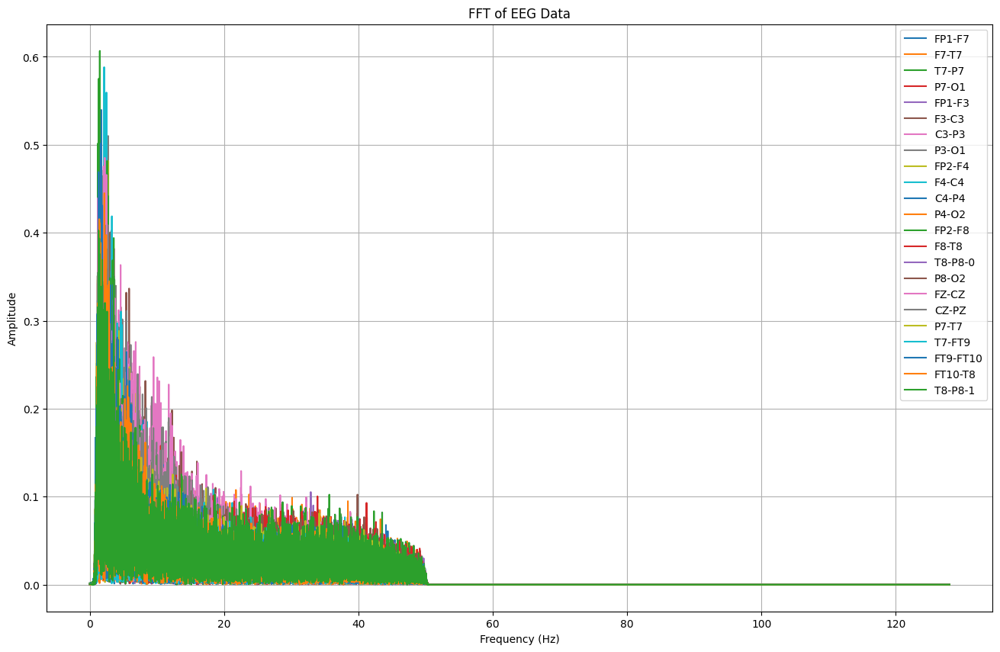

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000147  0.000119  0.000963  0.000729  0.000164  0.000641  0.000969   
1      0.000129  0.000154  0.000971  0.000737  0.000159  0.000680  0.000981   
2      0.000145  0.000178  0.000967  0.000741  0.000170  0.000713  0.000975   
3      0.000170  0.000165  0.000965  0.000743  0.000165  0.000672  0.000980   
4      0.000129  0.000135  0.000998  0.000749  0.000120  0.000658  0.000995   
...         ...       ...       ...       ...       ...       ...       ...   
33659  0.000044  0.000036  0.000002  0.000024  0.000008  0.000045  0.000026   
33660  0.000044  0.000036  0.000002  0.000024  0.000008  0.000045  0.000026   
33661  0.000044  0.000036  0.000002  0.000024  0.000008  0.000045  0.000026   
33662  0.000044  0.000036  0.000002  0.000024  0.000008  0.000045  0.000026   
33663  0.000044  0.000036  0.000002  0.000024  0.000008  0.000045  0.000026   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA35 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb07_19.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA35.columns:
        signal = TA35[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_35 = pd.DataFrame(fft_features).T
TA_35.columns = channels
TA_35['frekuensi'] = fft_freqs
TA_35['seizure'] = TA35['seizure']

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_35.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA35[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_35.to_csv("/content/drive/MyDrive/TA/FFT/chb07_19.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_35}")


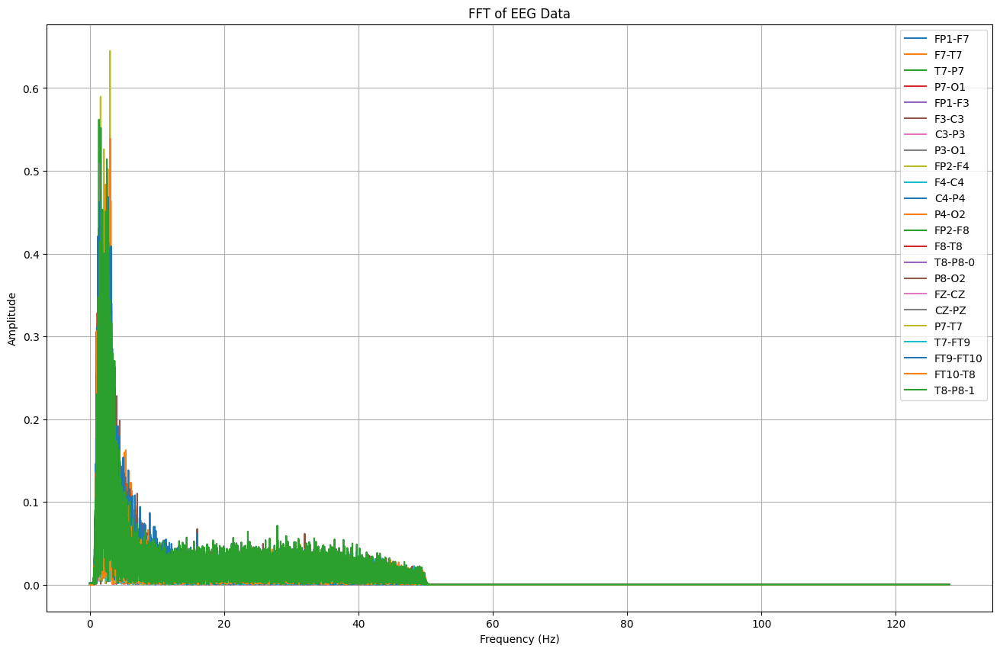

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000348  0.000126  0.000659  0.000417  0.001608  0.000327  0.001101   
1      0.000333  0.000118  0.000642  0.000430  0.001596  0.000311  0.001117   
2      0.000338  0.000105  0.000650  0.000427  0.001589  0.000314  0.001105   
3      0.000325  0.000114  0.000644  0.000426  0.001589  0.000312  0.001123   
4      0.000352  0.000111  0.000639  0.000427  0.001597  0.000313  0.001104   
...         ...       ...       ...       ...       ...       ...       ...   
37243  0.000018  0.000041  0.000042  0.000015  0.000025  0.000043  0.000005   
37244  0.000018  0.000041  0.000042  0.000015  0.000025  0.000043  0.000005   
37245  0.000018  0.000041  0.000042  0.000015  0.000025  0.000043  0.000005   
37246  0.000018  0.000041  0.000042  0.000015  0.000025  0.000043  0.000005   
37247  0.000018  0.000041  0.000042  0.000015  0.000025  0.000043  0.000005   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA36 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb08_02.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA36.columns:
        signal = TA36[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_36 = pd.DataFrame(fft_features).T
TA_36.columns = channels
TA_36['frekuensi'] = fft_freqs
TA_36['seizure'] = TA36['seizure']

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_36.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA36[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_36.to_csv("/content/drive/MyDrive/TA/FFT/chb08_02.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_36}")


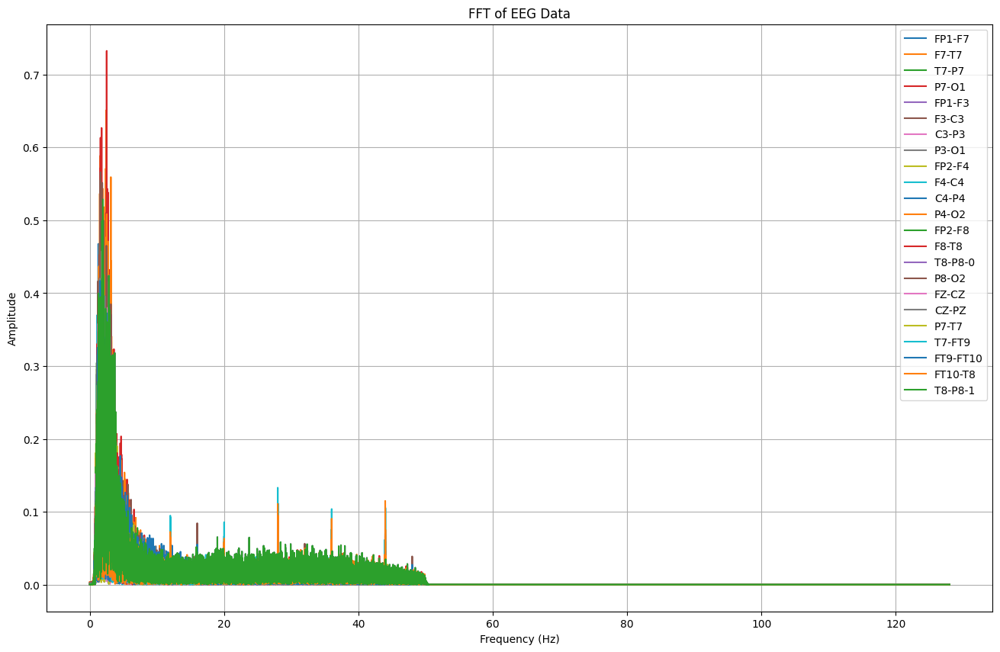

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000217  0.001494  0.000539  0.002565  0.000562  0.001351  0.000186   
1      0.000230  0.001505  0.000555  0.002551  0.000573  0.001365  0.000170   
2      0.000236  0.001523  0.000546  0.002557  0.000586  0.001369  0.000180   
3      0.000226  0.001495  0.000566  0.002547  0.000569  0.001363  0.000155   
4      0.000219  0.001518  0.000562  0.002555  0.000584  0.001369  0.000189   
...         ...       ...       ...       ...       ...       ...       ...   
39675  0.000005  0.000014  0.000032  0.000014  0.000009  0.000017  0.000029   
39676  0.000005  0.000014  0.000032  0.000014  0.000009  0.000017  0.000029   
39677  0.000005  0.000014  0.000032  0.000014  0.000009  0.000017  0.000029   
39678  0.000005  0.000014  0.000032  0.000014  0.000009  0.000017  0.000029   
39679  0.000005  0.000014  0.000032  0.000014  0.000009  0.000017  0.000029   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA37 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb08_05.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA37.columns:
        signal = TA37[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_37 = pd.DataFrame(fft_features).T
TA_37.columns = channels
TA_37['frekuensi'] = fft_freqs
TA_37['seizure'] = TA37['seizure']

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_37.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA37[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_37.to_csv("/content/drive/MyDrive/TA/FFT/chb08_05.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_37}")


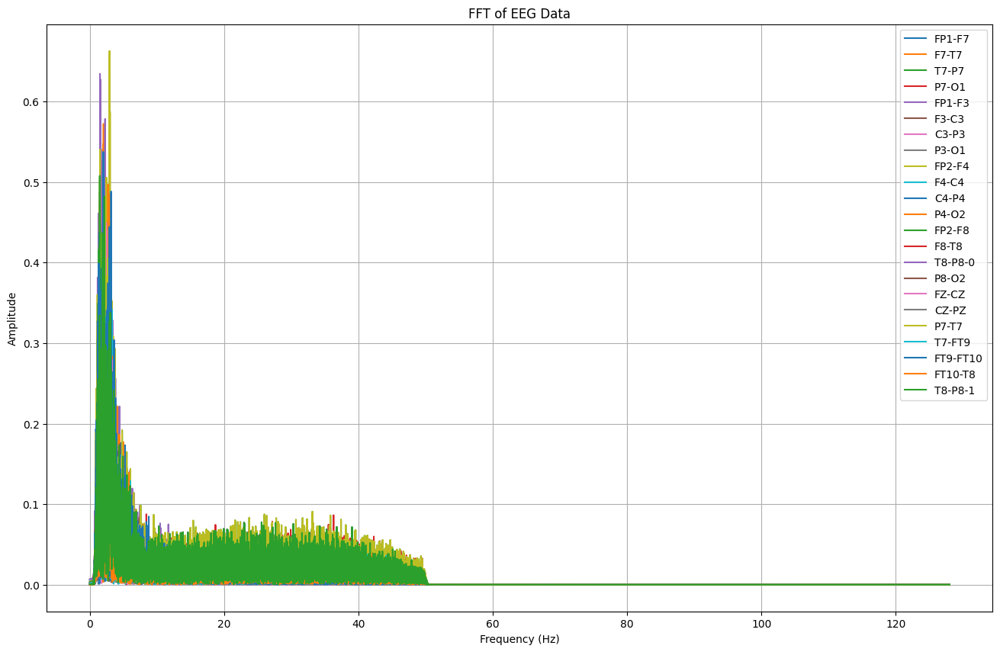

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3  \
0      0.005926  0.001738  0.001231  0.002057  0.006777  0.000013   
1      0.005913  0.001753  0.001219  0.002045  0.006760  0.000006   
2      0.005906  0.001747  0.001219  0.002048  0.006761  0.000015   
3      0.005910  0.001752  0.001220  0.002043  0.006761  0.000021   
4      0.005912  0.001743  0.001217  0.002039  0.006765  0.000036   
...         ...       ...       ...       ...       ...       ...   
32507  0.000001  0.000099  0.000061  0.000011  0.000002  0.000043   
32508  0.000001  0.000099  0.000061  0.000011  0.000002  0.000043   
32509  0.000001  0.000099  0.000061  0.000011  0.000002  0.000043   
32510  0.000001  0.000099  0.000061  0.000011  0.000002  0.000043   
32511  0.000001  0.000099  0.000061  0.000011  0.000002  0.000043   

              C3-P3     P3-O1    FP2-F4     F4-C4  ...     P8-O2     FZ-CZ  \
0      6.851343e-04  0.000006  0.004039  0

In [ ]:

# Simpan data setelah filtering ke file CSV
TA38 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb08_11.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA38.columns:
        signal = TA38[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_38 = pd.DataFrame(fft_features).T
TA_38.columns = channels
TA_38['frekuensi'] = fft_freqs
TA_38['seizure'] = TA38['seizure']

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_38.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA38[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_38.to_csv("/content/drive/MyDrive/TA/FFT/chb08_11.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_38}")


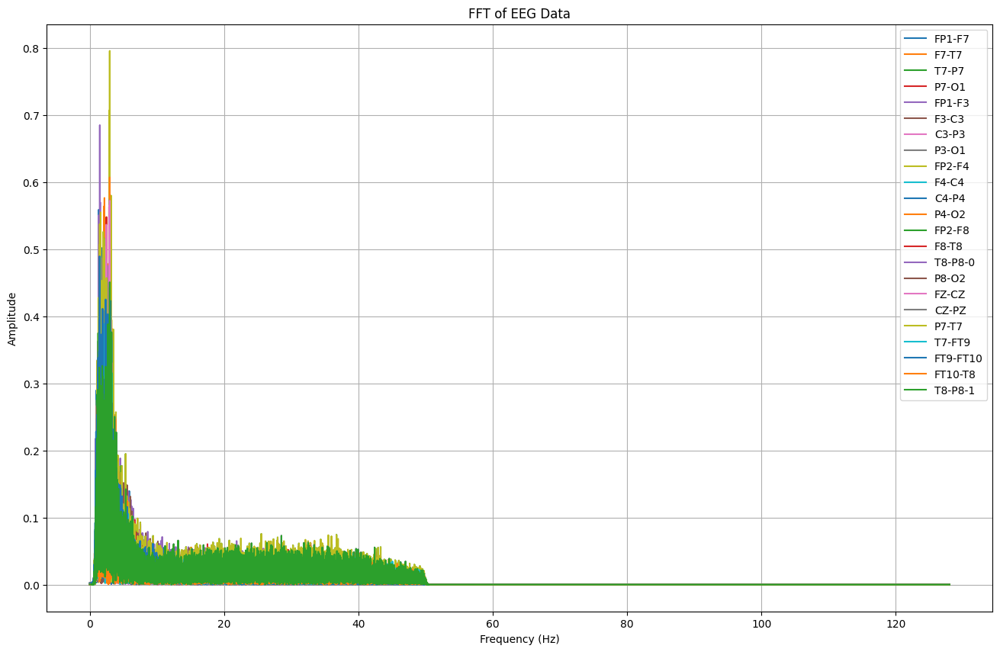

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.002756  0.002524  0.001362  0.001001  0.001269  0.000349  0.000696   
1      0.002775  0.002509  0.001376  0.001011  0.001289  0.000334  0.000710   
2      0.002779  0.002516  0.001376  0.001011  0.001284  0.000331  0.000703   
3      0.002766  0.002501  0.001370  0.001015  0.001283  0.000337  0.000715   
4      0.002789  0.002518  0.001376  0.001007  0.001296  0.000335  0.000699   
...         ...       ...       ...       ...       ...       ...       ...   
35835  0.000079  0.000044  0.000025  0.000031  0.000006  0.000042  0.000003   
35836  0.000079  0.000044  0.000025  0.000031  0.000006  0.000042  0.000003   
35837  0.000079  0.000044  0.000025  0.000031  0.000006  0.000042  0.000003   
35838  0.000079  0.000044  0.000025  0.000031  0.000006  0.000042  0.000003   
35839  0.000079  0.000044  0.000025  0.000031  0.000006  0.000042  0.000003   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA39 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb08_13.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA39.columns:
        signal = TA39[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_39 = pd.DataFrame(fft_features).T
TA_39.columns = channels
TA_39['frekuensi'] = fft_freqs
TA_39['seizure'] = TA39['seizure']

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_39.columns:
        fft_freqs, fft_vals = compute_fft(TA39[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_39.to_csv("/content/drive/MyDrive/TA/FFT/chb08_13.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_39}")


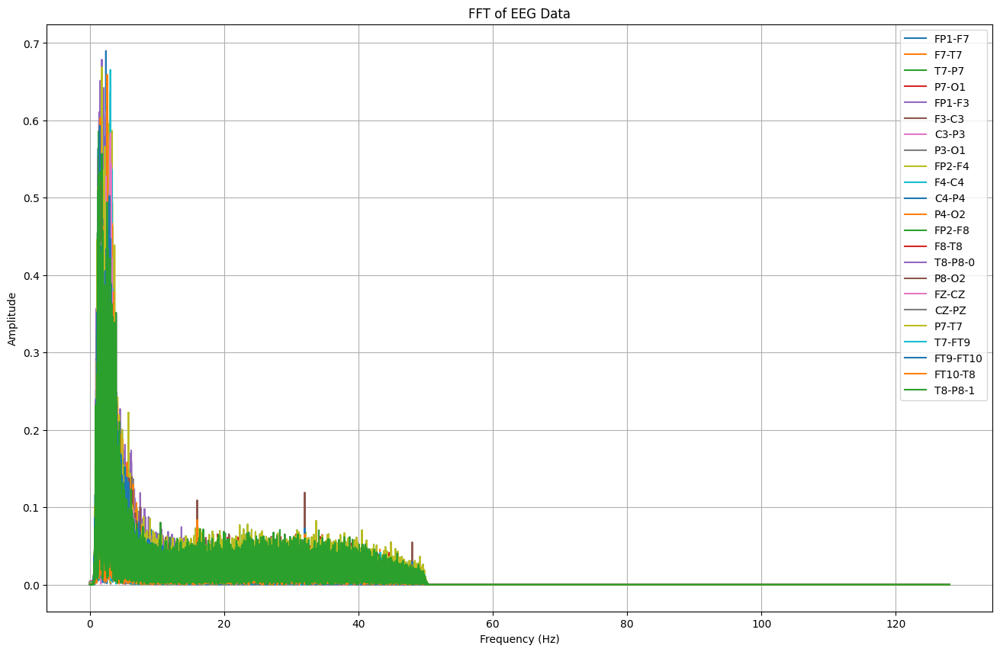

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000916  0.002355  0.002060  0.004025  0.001413  0.000058  0.000500   
1      0.000939  0.002377  0.002045  0.004008  0.001438  0.000040  0.000479   
2      0.000933  0.002378  0.002045  0.004008  0.001430  0.000038  0.000476   
3      0.000948  0.002375  0.002042  0.004016  0.001447  0.000042  0.000487   
4      0.000927  0.002382  0.002045  0.004008  0.001431  0.000036  0.000472   
...         ...       ...       ...       ...       ...       ...       ...   
49147  0.000018  0.000006  0.000040  0.000036  0.000018  0.000010  0.000020   
49148  0.000018  0.000006  0.000040  0.000036  0.000018  0.000010  0.000020   
49149  0.000018  0.000006  0.000040  0.000036  0.000018  0.000010  0.000020   
49150  0.000018  0.000006  0.000040  0.000036  0.000018  0.000010  0.000020   
49151  0.000018  0.000006  0.000040  0.000036  0.000018  0.000010  0.000020   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA40 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb08_21.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA40.columns:
        signal = TA40[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_40 = pd.DataFrame(fft_features).T
TA_40.columns = channels
TA_40['frekuensi'] = fft_freqs
TA_40['seizure'] = TA40['seizure']

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_40.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA40[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_40.to_csv("/content/drive/MyDrive/TA/FFT/chb08_21.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_40}")


# 41-60

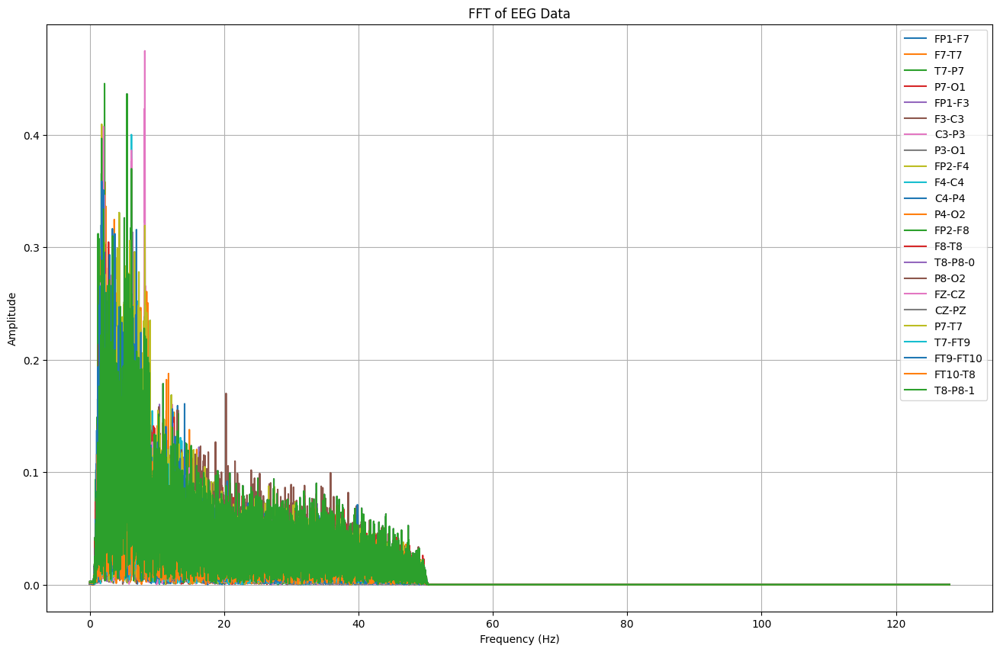

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.001618  0.000970  0.002171  0.000615  0.002905  0.002452  0.001280   
1      0.001596  0.000964  0.002158  0.000606  0.002885  0.002440  0.001279   
2      0.001588  0.000970  0.002154  0.000603  0.002875  0.002445  0.001278   
3      0.001583  0.000991  0.002134  0.000600  0.002868  0.002447  0.001273   
4      0.001597  0.000986  0.002162  0.000602  0.002890  0.002469  0.001259   
...         ...       ...       ...       ...       ...       ...       ...   
23547  0.000015  0.000012  0.000026  0.000015  0.000008  0.000022  0.000013   
23548  0.000015  0.000012  0.000026  0.000015  0.000008  0.000022  0.000013   
23549  0.000015  0.000012  0.000026  0.000015  0.000008  0.000022  0.000013   
23550  0.000015  0.000012  0.000026  0.000015  0.000008  0.000022  0.000013   
23551  0.000015  0.000012  0.000026  0.000015  0.000008  0.000022  0.000013   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA41 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb09_06.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA41.columns:
        signal = TA41[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_41 = pd.DataFrame(fft_features).T
TA_41.columns = channels
TA_41['Time'] = TA41['Time']
TA_41['seizure'] = TA41['seizure']

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_41.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA41[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_41.to_csv("/content/drive/MyDrive/TA/FFT/chb09_06.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_41}")


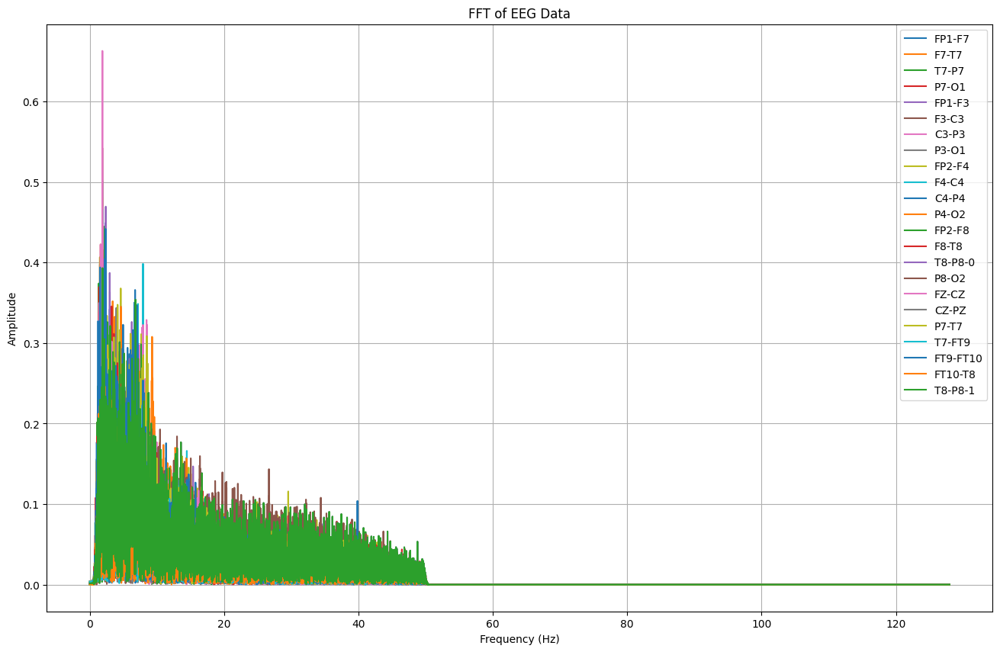

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000396  0.002780  0.000119  0.001233  0.003954  0.001987  0.000605   
1      0.000370  0.002776  0.000096  0.001242  0.003926  0.001975  0.000600   
2      0.000337  0.002796  0.000087  0.001247  0.003890  0.001984  0.000604   
3      0.000354  0.002786  0.000095  0.001245  0.003910  0.001985  0.000591   
4      0.000400  0.002761  0.000127  0.001246  0.003956  0.001993  0.000591   
...         ...       ...       ...       ...       ...       ...       ...   
25467  0.000020  0.000005  0.000033  0.000002  0.000042  0.000018  0.000008   
25468  0.000020  0.000005  0.000033  0.000002  0.000042  0.000018  0.000008   
25469  0.000020  0.000005  0.000033  0.000002  0.000042  0.000018  0.000008   
25470  0.000020  0.000005  0.000033  0.000002  0.000042  0.000018  0.000008   
25471  0.000020  0.000005  0.000033  0.000002  0.000042  0.000018  0.000008   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA42 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb09_08.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
import numpy as np

def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA42.columns:
        signal = TA42[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_42 = pd.DataFrame(fft_features).T
TA_42.columns = channels
TA_42['seizure'] = TA42['seizure']

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_42.columns:
        fft_freqs, fft_vals = compute_fft(TA42[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_42.to_csv("/content/drive/MyDrive/TA/FFT/chb09_08.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_42}")


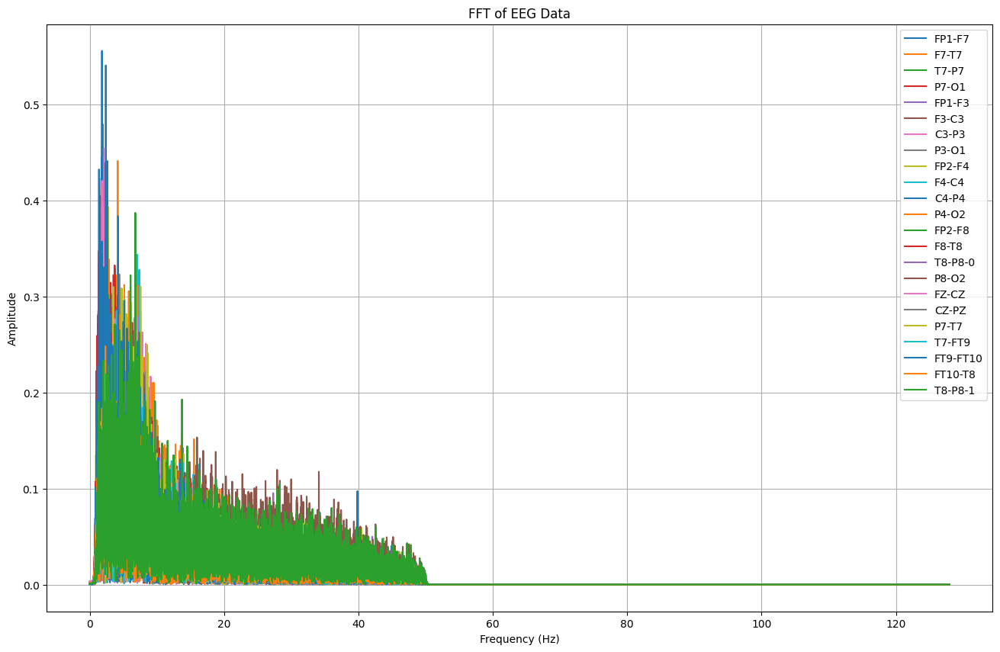

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000149  0.000930  0.000429  0.000439  0.000429  0.003485  0.000782   
1      0.000175  0.000927  0.000412  0.000428  0.000456  0.003478  0.000775   
2      0.000192  0.000944  0.000396  0.000422  0.000485  0.003482  0.000780   
3      0.000204  0.000946  0.000390  0.000435  0.000494  0.003470  0.000779   
4      0.000159  0.000926  0.000412  0.000434  0.000438  0.003490  0.000772   
...         ...       ...       ...       ...       ...       ...       ...   
24443  0.000036  0.000003  0.000004  0.000031  0.000007  0.000050  0.000023   
24444  0.000036  0.000003  0.000004  0.000031  0.000007  0.000050  0.000023   
24445  0.000036  0.000003  0.000004  0.000031  0.000007  0.000050  0.000023   
24446  0.000036  0.000003  0.000004  0.000031  0.000007  0.000050  0.000023   
24447  0.000036  0.000003  0.000004  0.000031  0.000007  0.000050  0.000023   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA42_1 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb09_08_1.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA42_1.columns:
        signal = TA42_1[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_42_1 = pd.DataFrame(fft_features).T
TA_42_1.columns = channels
TA_42_1['seizure'] = TA42_1['seizure']
TA_42_1['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_42_1.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA42_1[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_42_1.to_csv("/content/drive/MyDrive/TA/FFT/chb09_08_1.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_42_1}")


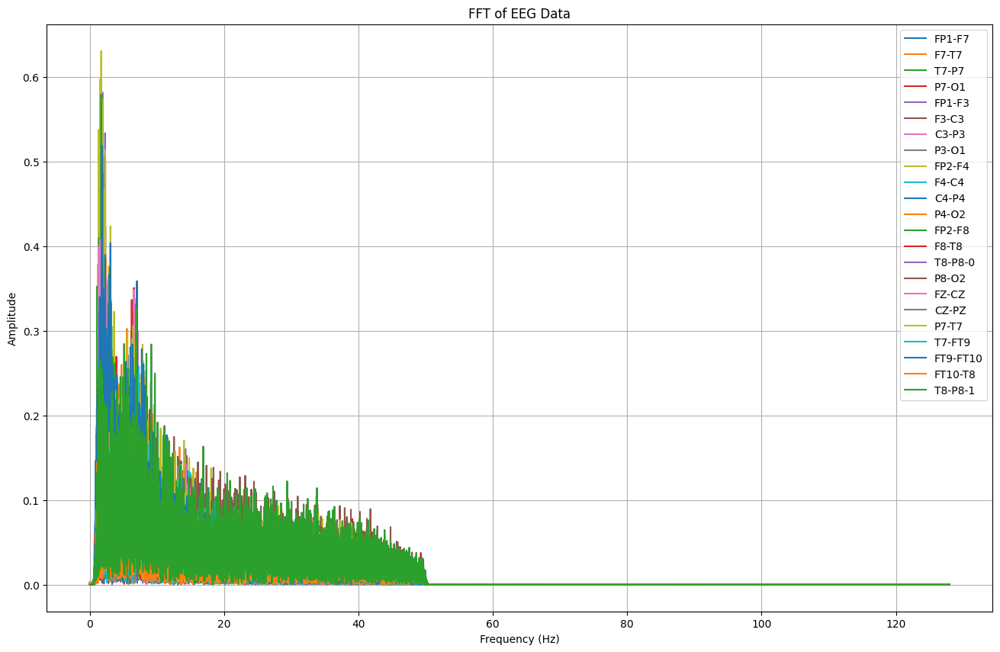

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.001151  0.000518  0.002351  0.000958  0.001847  0.001959  0.002724   
1      0.001171  0.000529  0.002371  0.000941  0.001808  0.001976  0.002730   
2      0.001173  0.000523  0.002390  0.000919  0.001788  0.001984  0.002725   
3      0.001187  0.000545  0.002352  0.000930  0.001789  0.001981  0.002729   
4      0.001156  0.000543  0.002306  0.000937  0.001876  0.001980  0.002724   
...         ...       ...       ...       ...       ...       ...       ...   
23291  0.000040  0.000011  0.000052  0.000012  0.000019  0.000012  0.000020   
23292  0.000040  0.000011  0.000052  0.000012  0.000019  0.000012  0.000020   
23293  0.000040  0.000011  0.000052  0.000012  0.000019  0.000012  0.000020   
23294  0.000040  0.000011  0.000052  0.000012  0.000019  0.000012  0.000020   
23295  0.000040  0.000011  0.000052  0.000012  0.000019  0.000012  0.000020   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA43 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb09_19.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA43.columns:
        signal = TA43[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_43 = pd.DataFrame(fft_features).T
TA_43.columns = channels
TA_43['seizure'] = TA43['seizure']
TA_43['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_43.columns:
        fft_freqs, fft_vals = compute_fft(TA43[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_43.to_csv("/content/drive/MyDrive/TA/FFT/chb09_19.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_43}")


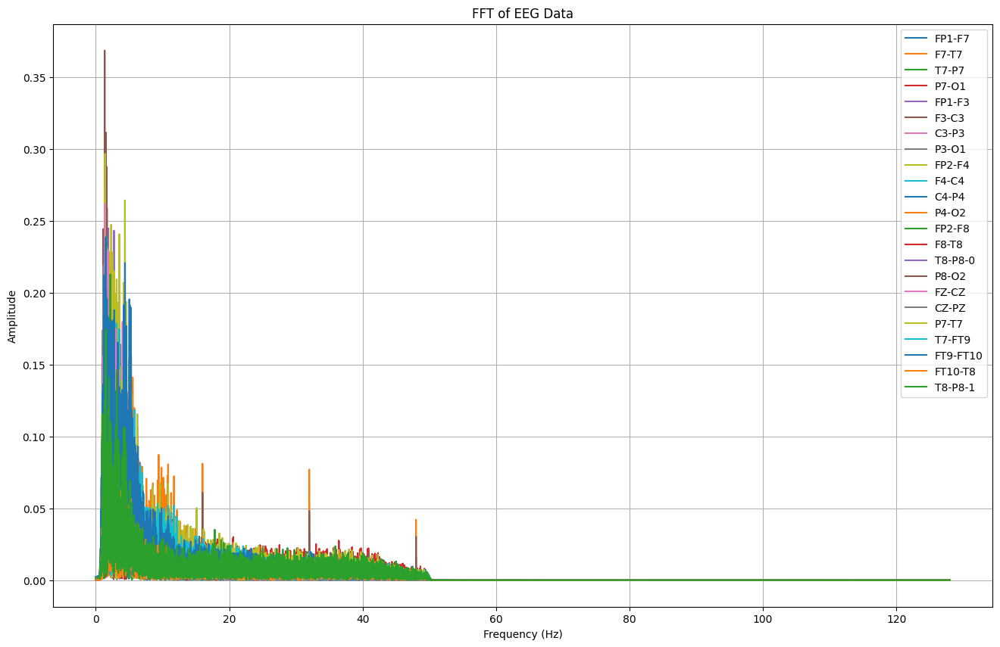

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000491  0.001031  0.001448  0.001544  0.000779  0.000348  0.001293   
1      0.000507  0.001022  0.001461  0.001558  0.000799  0.000338  0.001303   
2      0.000498  0.001019  0.001457  0.001556  0.000787  0.000342  0.001305   
3      0.000490  0.001029  0.001466  0.001558  0.000777  0.000340  0.001306   
4      0.000511  0.001022  0.001455  0.001561  0.000796  0.000339  0.001304   
...         ...       ...       ...       ...       ...       ...       ...   
19835  0.000015  0.000015  0.000031  0.000005  0.000017  0.000010  0.000021   
19836  0.000015  0.000015  0.000031  0.000005  0.000017  0.000010  0.000021   
19837  0.000015  0.000015  0.000031  0.000005  0.000017  0.000010  0.000021   
19838  0.000015  0.000015  0.000031  0.000005  0.000017  0.000010  0.000021   
19839  0.000015  0.000015  0.000031  0.000005  0.000017  0.000010  0.000021   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA44 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb10_12.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA44.columns:
        signal = TA44[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_44 = pd.DataFrame(fft_features).T
TA_44.columns = channels
TA_44['seizure'] = TA44['seizure']
TA_44['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_44.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA44[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_44.to_csv("/content/drive/MyDrive/TA/FFT/chb10_12.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_44}")


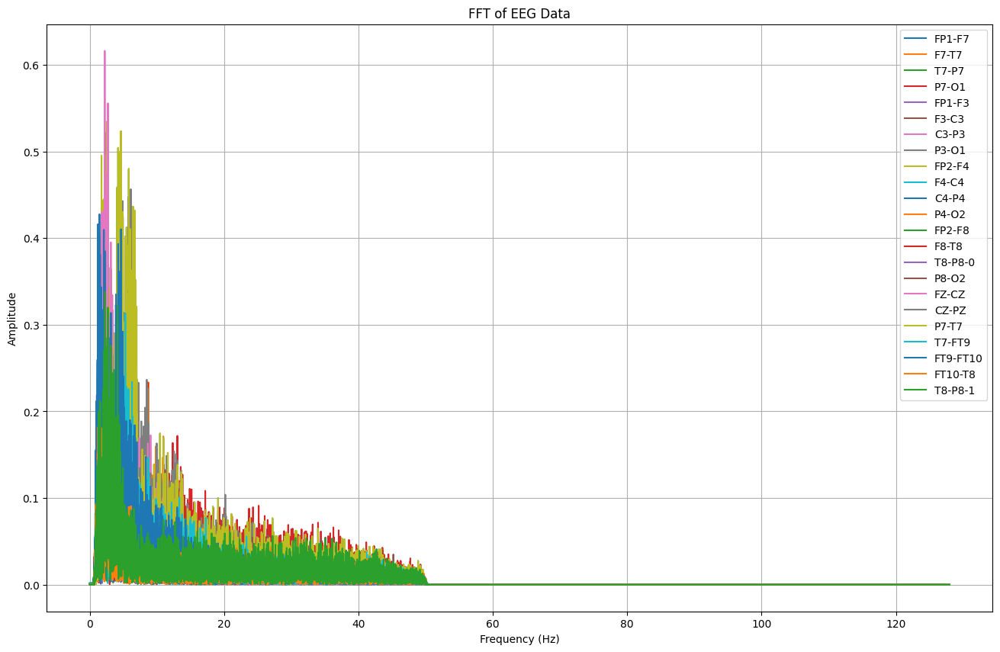

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3         F3-C3  \
0      0.001847  0.000515  0.001225  0.001583  0.000377  1.302684e-03   
1      0.001833  0.000507  0.001207  0.001597  0.000397  1.295504e-03   
2      0.001831  0.000497  0.001219  0.001606  0.000373  1.274873e-03   
3      0.001840  0.000517  0.001200  0.001584  0.000423  1.316541e-03   
4      0.001839  0.000487  0.001214  0.001567  0.000353  1.255649e-03   
...         ...       ...       ...       ...       ...           ...   
24315  0.000064  0.000025  0.000036  0.000031  0.000060  4.486352e-07   
24316  0.000064  0.000025  0.000036  0.000031  0.000060  4.486507e-07   
24317  0.000064  0.000025  0.000036  0.000031  0.000060  4.486268e-07   
24318  0.000064  0.000025  0.000036  0.000031  0.000060  4.486313e-07   
24319  0.000064  0.000025  0.000036  0.000031  0.000060  4.486321e-07   

          C3-P3     P3-O1    FP2-F4     F4-C4  ...     P8-O2     FZ-CZ  

In [ ]:

# Simpan data setelah filtering ke file CSV
TA45 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb10_20.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA45.columns:
        signal = TA45[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_45 = pd.DataFrame(fft_features).T
TA_45.columns = channels
TA_45['seizure'] = TA45['seizure']
TA_45['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_45.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA45[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_45.to_csv("/content/drive/MyDrive/TA/FFT/chb10_20.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_45}")


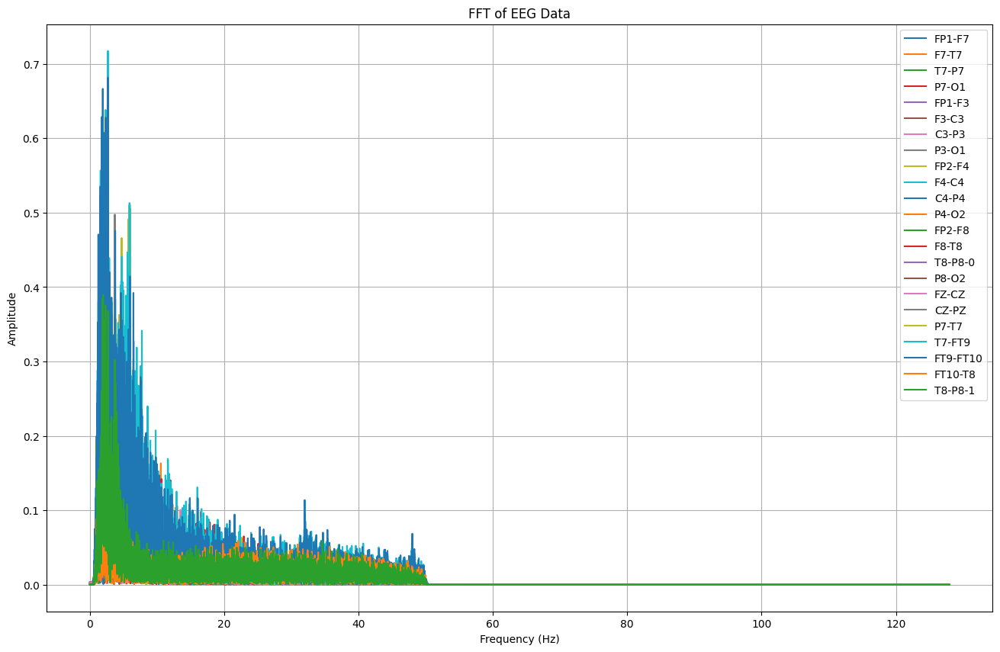

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000340  0.001960  0.000727  0.001626  0.000109  0.003496  0.000959   
1      0.000356  0.001970  0.000715  0.001608  0.000092  0.003501  0.000956   
2      0.000363  0.001974  0.000722  0.001626  0.000118  0.003527  0.000952   
3      0.000366  0.001953  0.000712  0.001600  0.000080  0.003494  0.000941   
4      0.000356  0.002000  0.000695  0.001682  0.000114  0.003542  0.000944   
...         ...       ...       ...       ...       ...       ...       ...   
23675  0.000016  0.000050  0.000009  0.000003  0.000004  0.000036  0.000032   
23676  0.000016  0.000050  0.000009  0.000003  0.000004  0.000036  0.000032   
23677  0.000016  0.000050  0.000009  0.000003  0.000004  0.000036  0.000032   
23678  0.000016  0.000050  0.000009  0.000003  0.000004  0.000036  0.000032   
23679  0.000016  0.000050  0.000009  0.000003  0.000004  0.000036  0.000032   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA46 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb10_27.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA46.columns:
        signal = TA46[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_46 = pd.DataFrame(fft_features).T
TA_46.columns = channels
TA_46['seizure'] = TA46['seizure']
TA_46['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_46.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA46[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_46.to_csv("/content/drive/MyDrive/TA/FFT/chb10_27.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_46}")


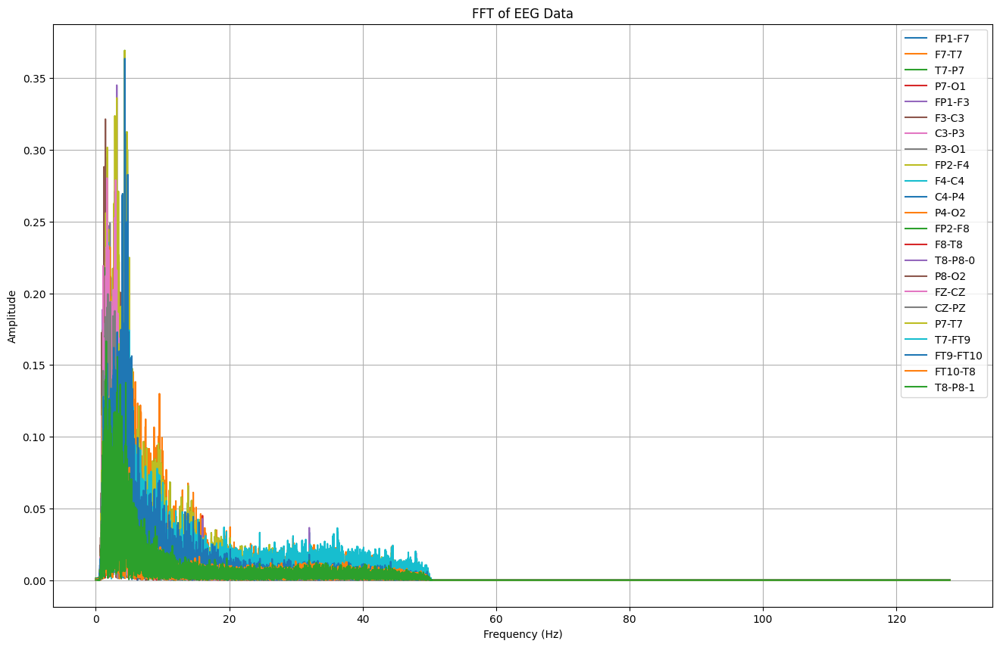

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3         F3-C3  \
0      0.000169  0.000197  0.000171  0.000517  0.000673  6.105181e-04   
1      0.000155  0.000209  0.000183  0.000503  0.000651  6.187708e-04   
2      0.000155  0.000207  0.000183  0.000501  0.000658  6.176155e-04   
3      0.000156  0.000206  0.000187  0.000505  0.000659  6.180271e-04   
4      0.000163  0.000208  0.000179  0.000498  0.000659  6.180887e-04   
...         ...       ...       ...       ...       ...           ...   
22779  0.000017  0.000034  0.000010  0.000012  0.000065  9.520331e-07   
22780  0.000017  0.000034  0.000010  0.000012  0.000065  9.520235e-07   
22781  0.000017  0.000034  0.000010  0.000012  0.000065  9.520178e-07   
22782  0.000017  0.000034  0.000010  0.000012  0.000065  9.520305e-07   
22783  0.000017  0.000034  0.000010  0.000012  0.000065  9.520221e-07   

          C3-P3     P3-O1    FP2-F4     F4-C4  ...     P8-O2     FZ-CZ  

In [ ]:

# Simpan data setelah filtering ke file CSV
TA47 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb10_30.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA47.columns:
        signal = TA47[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_47 = pd.DataFrame(fft_features).T
TA_47.columns = channels
TA_47['seizure'] = TA47['seizure']
TA_47['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_47.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA47[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_47.to_csv("/content/drive/MyDrive/TA/FFT/chb10_30.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_47}")


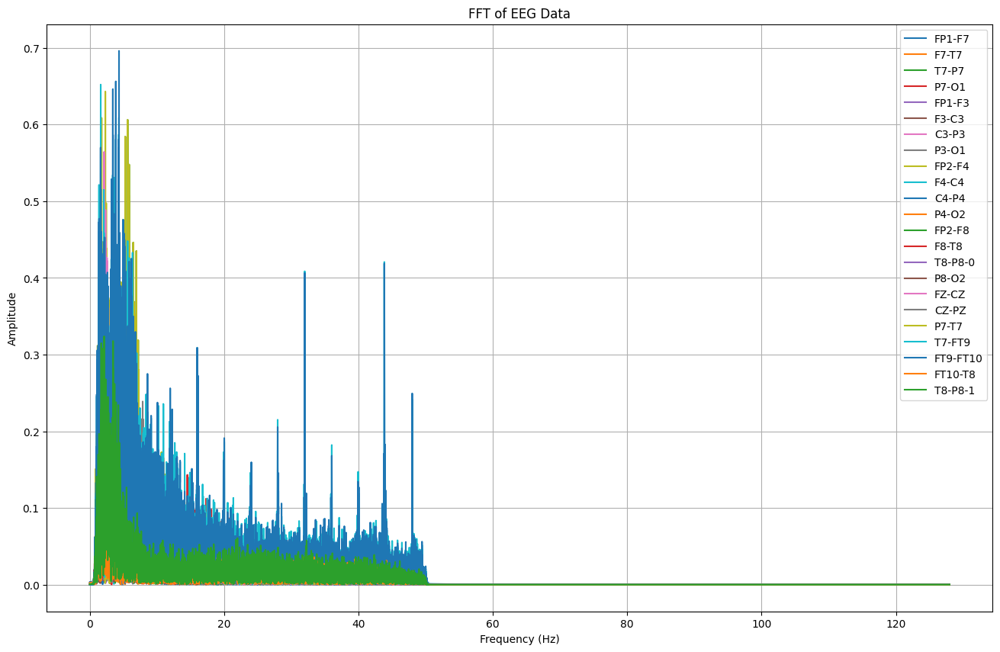

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.003357  0.002481  0.001401  0.000330  0.000516  0.000170  0.001269   
1      0.003351  0.002498  0.001411  0.000321  0.000502  0.000164  0.001283   
2      0.003334  0.002492  0.001410  0.000310  0.000515  0.000143  0.001288   
3      0.003333  0.002479  0.001416  0.000253  0.000459  0.000188  0.001277   
4      0.003363  0.002513  0.001412  0.000338  0.000558  0.000111  0.001296   
...         ...       ...       ...       ...       ...       ...       ...   
25083  0.000054  0.000063  0.000030  0.000017  0.000011  0.000013  0.000032   
25084  0.000054  0.000063  0.000030  0.000017  0.000011  0.000013  0.000032   
25085  0.000054  0.000063  0.000030  0.000017  0.000011  0.000013  0.000032   
25086  0.000054  0.000063  0.000030  0.000017  0.000011  0.000013  0.000032   
25087  0.000054  0.000063  0.000030  0.000017  0.000011  0.000013  0.000032   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA48 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb10_31.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA48.columns:
        signal = TA48[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_48 = pd.DataFrame(fft_features).T
TA_48.columns = channels
TA_48['seizure'] = TA48['seizure']
TA_48['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_48.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA48[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_48.to_csv("/content/drive/MyDrive/TA/FFT/chb10_31.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_48}")


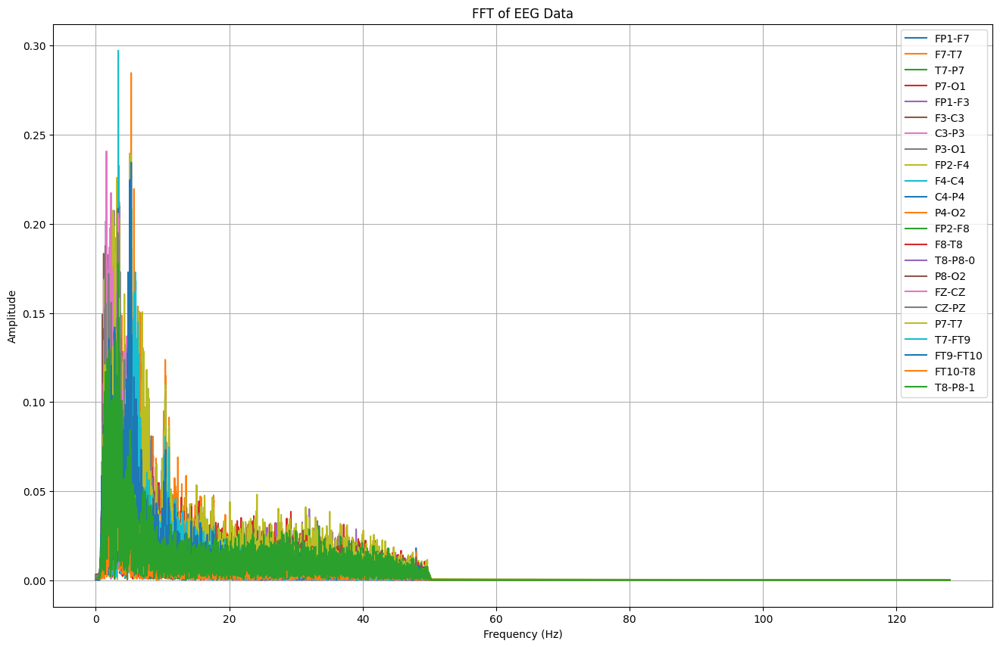

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000481  0.002504  0.000919  0.001653  0.000334  0.000291  0.000673   
1      0.000490  0.002499  0.000913  0.001660  0.000341  0.000298  0.000667   
2      0.000494  0.002505  0.000909  0.001664  0.000347  0.000298  0.000668   
3      0.000520  0.002507  0.000899  0.001659  0.000378  0.000301  0.000665   
4      0.000519  0.002497  0.000899  0.001650  0.000376  0.000306  0.000659   
...         ...       ...       ...       ...       ...       ...       ...   
11387  0.000065  0.000042  0.000259  0.000104  0.000103  0.000072  0.000068   
11388  0.000065  0.000042  0.000259  0.000104  0.000103  0.000072  0.000068   
11389  0.000065  0.000042  0.000259  0.000104  0.000103  0.000072  0.000068   
11390  0.000065  0.000042  0.000259  0.000104  0.000103  0.000072  0.000068   
11391  0.000065  0.000042  0.000259  0.000104  0.000103  0.000072  0.000068   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA49 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb10_38.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA49.columns:
        signal = TA49[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_49 = pd.DataFrame(fft_features).T
TA_49.columns = channels
TA_49['seizure'] = TA49['seizure']
TA_49['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_49.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA49[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_49.to_csv("/content/drive/MyDrive/TA/FFT/chb10_38.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_49}")


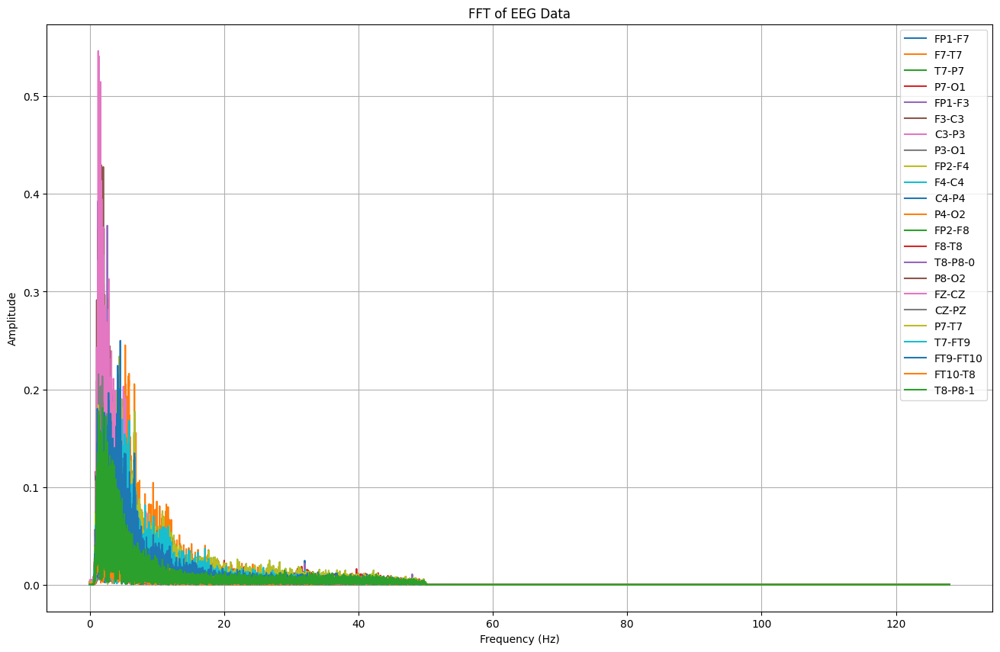

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.001506  0.002970  0.002566  0.000005  0.003003  0.003013  0.004640   
1      0.001519  0.002963  0.002553  0.000019  0.003017  0.002997  0.004632   
2      0.001510  0.002949  0.002559  0.000023  0.003018  0.003031  0.004600   
3      0.001535  0.002963  0.002565  0.000025  0.003017  0.002951  0.004672   
4      0.001496  0.002963  0.002541  0.000023  0.003021  0.003066  0.004577   
...         ...       ...       ...       ...       ...       ...       ...   
22267  0.000019  0.000005  0.000021  0.000005  0.000071  0.000069  0.000031   
22268  0.000019  0.000005  0.000021  0.000005  0.000071  0.000069  0.000031   
22269  0.000019  0.000005  0.000021  0.000005  0.000071  0.000069  0.000031   
22270  0.000019  0.000005  0.000021  0.000005  0.000071  0.000069  0.000031   
22271  0.000019  0.000005  0.000021  0.000005  0.000071  0.000069  0.000031   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA50 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb10_89.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA50.columns:
        signal = TA50[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_50 = pd.DataFrame(fft_features).T
TA_50.columns = channels
TA_50['seizure'] = TA50['seizure']
TA_50['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_50.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA50[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_50.to_csv("/content/drive/MyDrive/TA/FFT/chb10_89.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_50}")


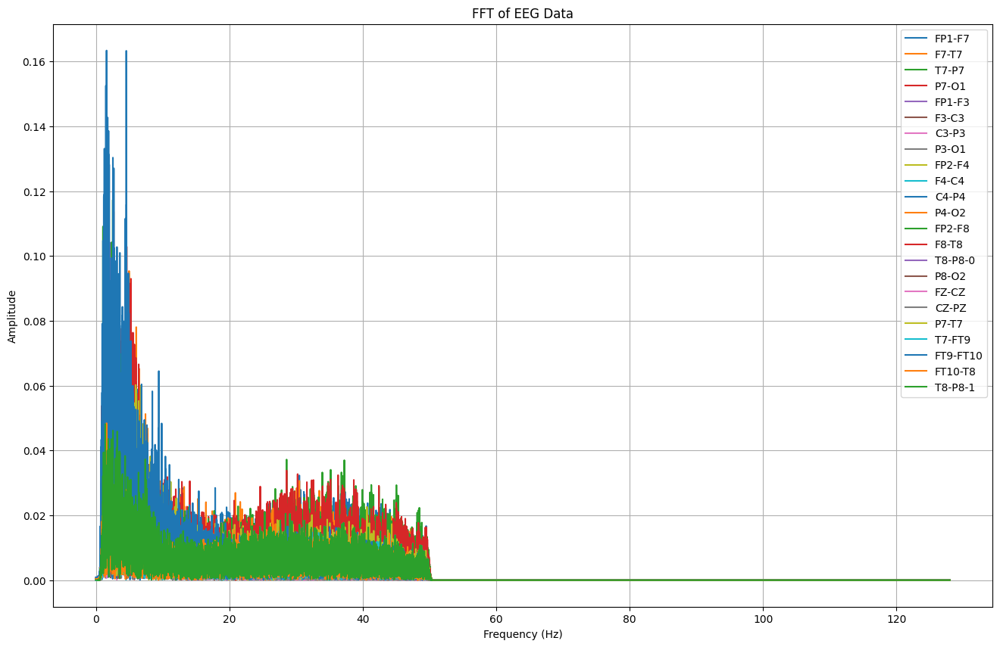

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000484  0.000118  0.000327  0.000266  0.000074  0.000286  0.000071   
1      0.000496  0.000121  0.000320  0.000255  0.000066  0.000293  0.000063   
2      0.000495  0.000123  0.000318  0.000261  0.000067  0.000291  0.000064   
3      0.000494  0.000123  0.000320  0.000264  0.000073  0.000290  0.000061   
4      0.000496  0.000126  0.000321  0.000269  0.000072  0.000292  0.000059   
...         ...       ...       ...       ...       ...       ...       ...   
18171  0.000010  0.000009  0.000005  0.000002  0.000001  0.000002  0.000007   
18172  0.000010  0.000009  0.000005  0.000002  0.000001  0.000002  0.000007   
18173  0.000010  0.000009  0.000005  0.000002  0.000001  0.000002  0.000007   
18174  0.000010  0.000009  0.000005  0.000002  0.000001  0.000002  0.000007   
18175  0.000010  0.000009  0.000005  0.000002  0.000001  0.000002  0.000007   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA51 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb11_82.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA51.columns:
        signal = TA51[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_51 = pd.DataFrame(fft_features).T
TA_51.columns = channels
TA_51['seizure'] = TA51['seizure']
TA_51['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_51.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA51[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_51.to_csv("/content/drive/MyDrive/TA/FFT/chb11_82.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_51}")


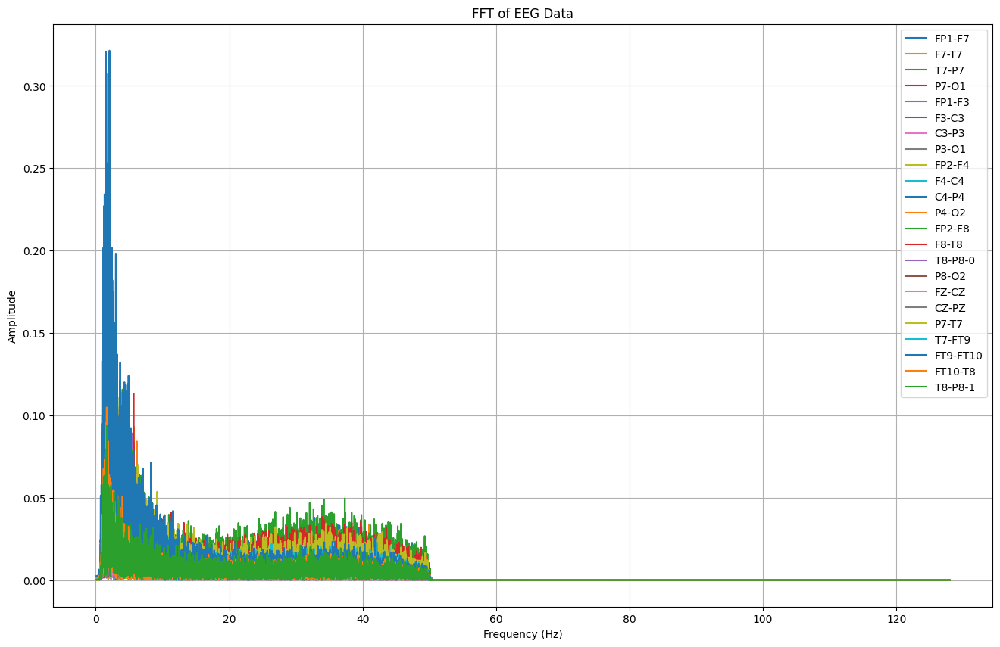

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7         P7-O1    FP1-F3     F3-C3  \
0      0.001967  0.002319  0.000053  6.252577e-07  0.000255  0.000463   
1      0.001968  0.002309  0.000049  8.169636e-06  0.000257  0.000457   
2      0.001961  0.002308  0.000050  1.219343e-05  0.000250  0.000456   
3      0.001950  0.002311  0.000044  1.474525e-05  0.000243  0.000456   
4      0.001944  0.002305  0.000057  2.051401e-05  0.000230  0.000455   
...         ...       ...       ...           ...       ...       ...   
19451  0.000018  0.000034  0.000025  4.217911e-05  0.000012  0.000009   
19452  0.000018  0.000034  0.000025  4.217912e-05  0.000012  0.000009   
19453  0.000018  0.000034  0.000025  4.217924e-05  0.000012  0.000009   
19454  0.000018  0.000034  0.000025  4.217919e-05  0.000012  0.000009   
19455  0.000018  0.000034  0.000025  4.217917e-05  0.000012  0.000009   

          C3-P3     P3-O1    FP2-F4     F4-C4  ...     P8-O2         FZ-

In [ ]:

# Simpan data setelah filtering ke file CSV
TA52 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb11_92.csv")  # Diubah

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA52.columns:
        signal = TA52[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_52 = pd.DataFrame(fft_features).T  # Diubah
TA_52.columns = channels
TA_52['seizure'] = TA52['seizure']
TA_52['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_52.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA52[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_52.to_csv("/content/drive/MyDrive/TA/FFT/chb11_92.csv", index=False)  # Diubah

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_52}")


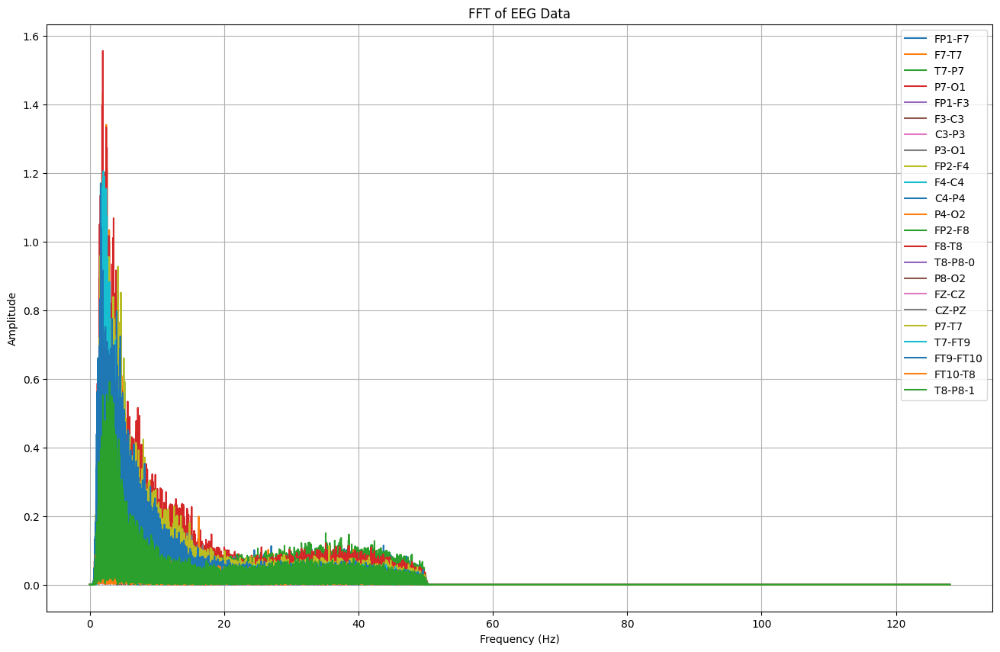

Data setelah FFT berhasil disimpan dalam file CSV:               FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3  \
0       2.192128e-04  0.000011  0.001158  0.000152  0.000152  0.000455   
1       2.645326e-04  0.000034  0.001128  0.000104  0.000203  0.000493   
2       2.579158e-04  0.000039  0.001122  0.000108  0.000209  0.000492   
3       2.647526e-04  0.000036  0.001115  0.000116  0.000207  0.000495   
4       2.597177e-04  0.000037  0.001111  0.000125  0.000206  0.000493   
...              ...       ...       ...       ...       ...       ...   
111611  1.606560e-07  0.000009  0.000005  0.000014  0.000008  0.000003   
111612  1.605885e-07  0.000009  0.000005  0.000014  0.000008  0.000003   
111613  1.605819e-07  0.000009  0.000005  0.000014  0.000008  0.000003   
111614  1.607100e-07  0.000009  0.000005  0.000014  0.000008  0.000003   
111615  1.606023e-07  0.000009  0.000005  0.000014  0.000008  0.000003   

           C3-P3     P3-O1    FP2-F4     F4-C4  ...     P8-O

In [ ]:

# Simpan data setelah filtering ke file CSV
TA53 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb11_99.csv")  # Diubah

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA53.columns:
        signal = TA53[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_53 = pd.DataFrame(fft_features).T  # Diubah
TA_53.columns = channels
TA_53['seizure'] = TA53['seizure']
TA_53['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_53.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA53[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_53.to_csv("/content/drive/MyDrive/TA/FFT/chb11_99.csv", index=False)  # Diubah

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_53}")


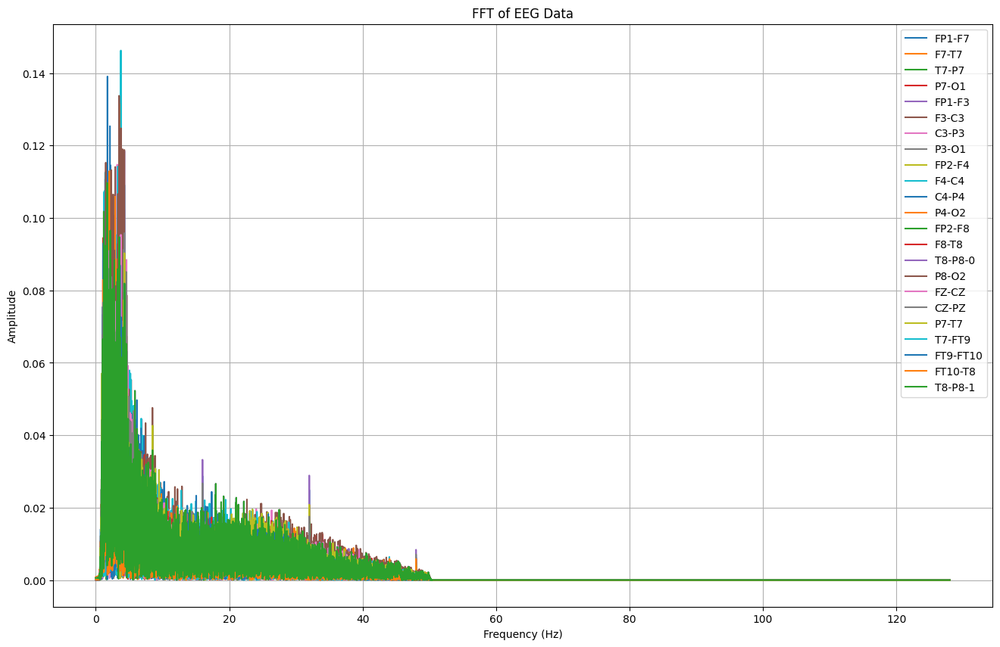

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7         P7-O1    FP1-F3     F3-C3  \
0      0.000104  0.000252  0.000555  3.439091e-04  0.000105  0.000257   
1      0.000091  0.000242  0.000546  3.338739e-04  0.000090  0.000247   
2      0.000095  0.000243  0.000547  3.346966e-04  0.000097  0.000246   
3      0.000094  0.000242  0.000546  3.360980e-04  0.000096  0.000248   
4      0.000094  0.000242  0.000548  3.307476e-04  0.000098  0.000246   
...         ...       ...       ...           ...       ...       ...   
24443  0.000005  0.000006  0.000008  8.644376e-07  0.000010  0.000006   
24444  0.000005  0.000006  0.000008  8.644241e-07  0.000010  0.000006   
24445  0.000005  0.000006  0.000008  8.644324e-07  0.000010  0.000006   
24446  0.000005  0.000006  0.000008  8.644272e-07  0.000010  0.000006   
24447  0.000005  0.000006  0.000008  8.644309e-07  0.000010  0.000006   

          C3-P3     P3-O1    FP2-F4     F4-C4  ...     P8-O2     FZ-CZ  

In [ ]:

# Simpan data setelah filtering ke file CSV
TA54 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb12_06.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA54.columns:
        signal = TA54[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_54 = pd.DataFrame(fft_features).T
TA_54.columns = channels
TA_54['seizure'] = TA54['seizure']
TA_54['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_54.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA54[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_54.to_csv("/content/drive/MyDrive/TA/FFT/chb12_06.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_54}")


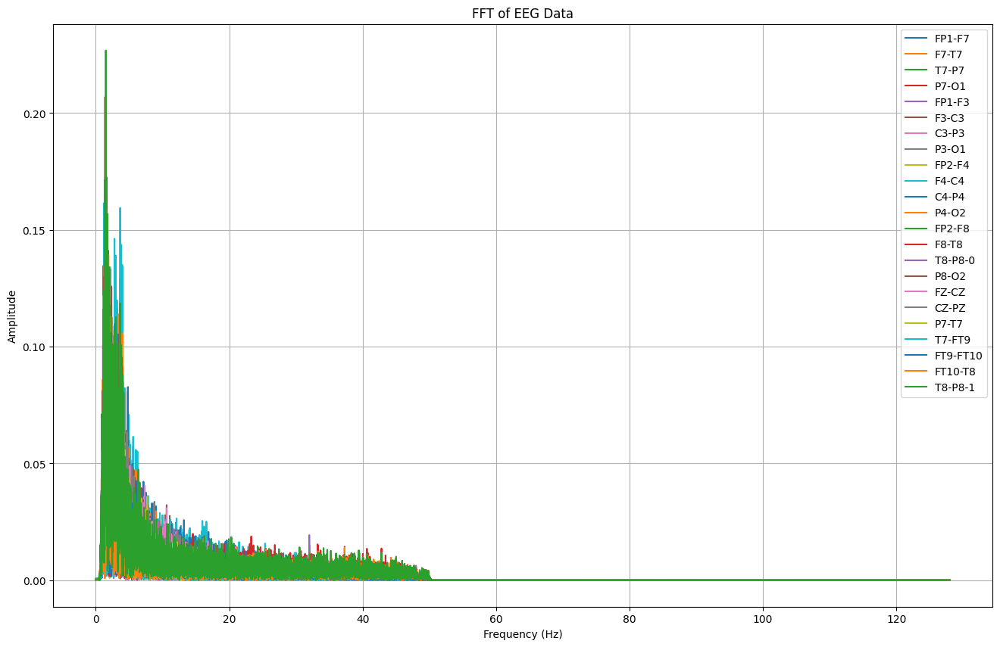

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000094  0.000645  0.000381  0.000409  0.000442  0.000529  0.000094   
1      0.000084  0.000655  0.000375  0.000399  0.000430  0.000540  0.000098   
2      0.000086  0.000654  0.000372  0.000403  0.000435  0.000543  0.000097   
3      0.000095  0.000658  0.000378  0.000398  0.000438  0.000535  0.000099   
4      0.000089  0.000651  0.000374  0.000404  0.000437  0.000536  0.000103   
...         ...       ...       ...       ...       ...       ...       ...   
19451  0.000002  0.000002  0.000029  0.000017  0.000009  0.000001  0.000023   
19452  0.000002  0.000002  0.000029  0.000017  0.000009  0.000001  0.000023   
19453  0.000002  0.000002  0.000029  0.000017  0.000009  0.000001  0.000023   
19454  0.000002  0.000002  0.000029  0.000017  0.000009  0.000001  0.000023   
19455  0.000002  0.000002  0.000029  0.000017  0.000009  0.000001  0.000023   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA54_1 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb12_06_1.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA54_1.columns:
        signal = TA54_1[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_54_1 = pd.DataFrame(fft_features).T
TA_54_1.columns = channels
TA_54_1['seizure'] = TA54_1['seizure']
TA_54_1['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_54_1.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA54_1[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_54_1.to_csv("/content/drive/MyDrive/TA/FFT/chb12_06_1.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_54_1}")


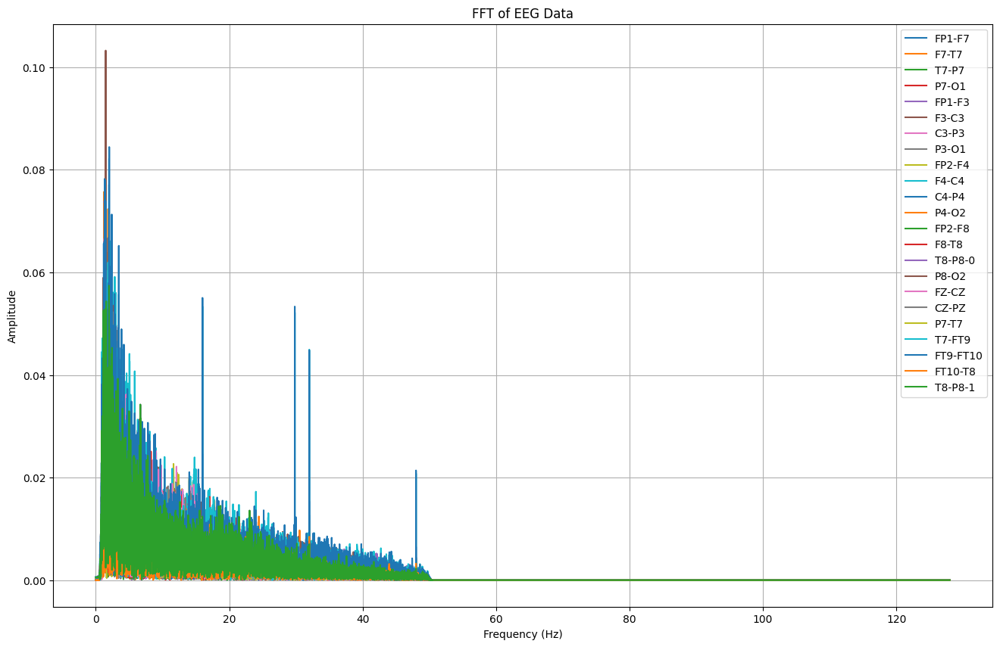

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000115  0.000049  0.000258  0.000283  0.000669  0.000109  0.000420   
1      0.000122  0.000055  0.000249  0.000277  0.000677  0.000102  0.000415   
2      0.000125  0.000055  0.000252  0.000278  0.000678  0.000102  0.000415   
3      0.000118  0.000053  0.000252  0.000277  0.000672  0.000103  0.000414   
4      0.000125  0.000057  0.000252  0.000277  0.000681  0.000103  0.000417   
...         ...       ...       ...       ...       ...       ...       ...   
17019  0.000004  0.000012  0.000010  0.000007  0.000011  0.000016  0.000026   
17020  0.000004  0.000012  0.000010  0.000007  0.000011  0.000016  0.000026   
17021  0.000004  0.000012  0.000010  0.000007  0.000011  0.000016  0.000026   
17022  0.000004  0.000012  0.000010  0.000007  0.000011  0.000016  0.000026   
17023  0.000004  0.000012  0.000010  0.000007  0.000011  0.000016  0.000026   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA55 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb12_08.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA55.columns:
        signal = TA55[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_55 = pd.DataFrame(fft_features).T
TA_55.columns = channels
TA_55['seizure'] = TA55['seizure']
TA_55['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_55.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA55[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_55.to_csv("/content/drive/MyDrive/TA/FFT/chb12_08.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_55}")


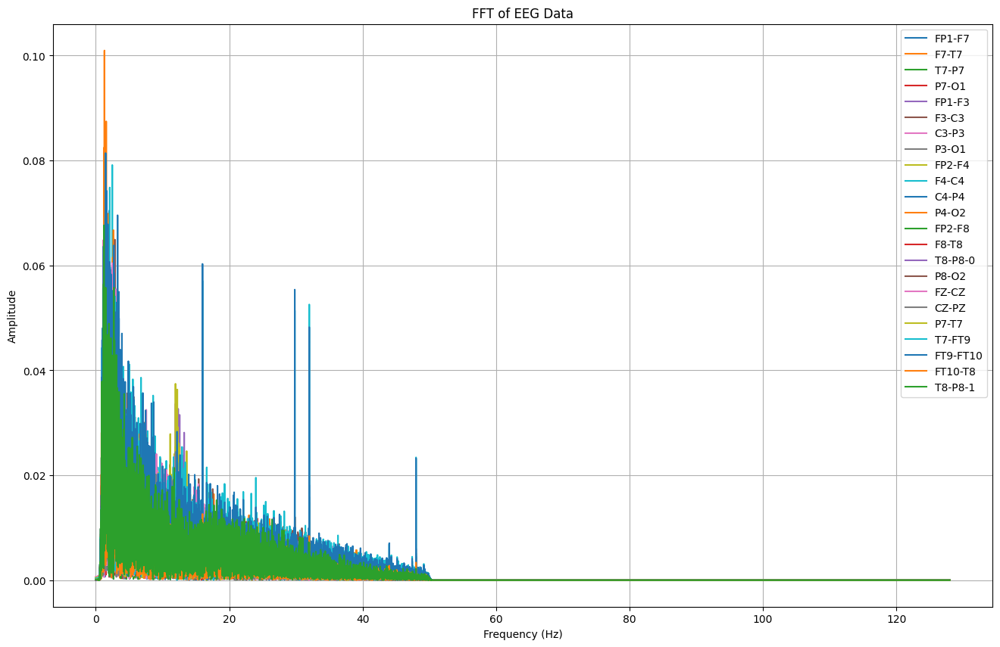

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3         F3-C3  \
0      0.000167  0.000233  0.000444  0.000426  0.000124  6.594987e-05   
1      0.000173  0.000224  0.000437  0.000418  0.000118  7.295891e-05   
2      0.000179  0.000224  0.000437  0.000419  0.000111  7.398697e-05   
3      0.000168  0.000224  0.000437  0.000421  0.000123  7.396880e-05   
4      0.000178  0.000224  0.000435  0.000415  0.000110  7.216352e-05   
...         ...       ...       ...       ...       ...           ...   
18299  0.000012  0.000007  0.000010  0.000020  0.000003  7.779775e-07   
18300  0.000012  0.000007  0.000010  0.000020  0.000003  7.779779e-07   
18301  0.000012  0.000007  0.000010  0.000020  0.000003  7.779845e-07   
18302  0.000012  0.000007  0.000010  0.000020  0.000003  7.779839e-07   
18303  0.000012  0.000007  0.000010  0.000020  0.000003  7.779830e-07   

          C3-P3     P3-O1    FP2-F4         F4-C4  ...     P8-O2     FZ-

In [ ]:

# Simpan data setelah filtering ke file CSV
TA55_1 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb12_08_1.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA55_1.columns:
        signal = TA55_1[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_55_1 = pd.DataFrame(fft_features).T
TA_55_1.columns = channels
TA_55_1['seizure'] = TA55_1['seizure']
TA_55_1['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_55_1.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA55_1[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_55_1.to_csv("/content/drive/MyDrive/TA/FFT/chb12_08_1.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_55_1}")


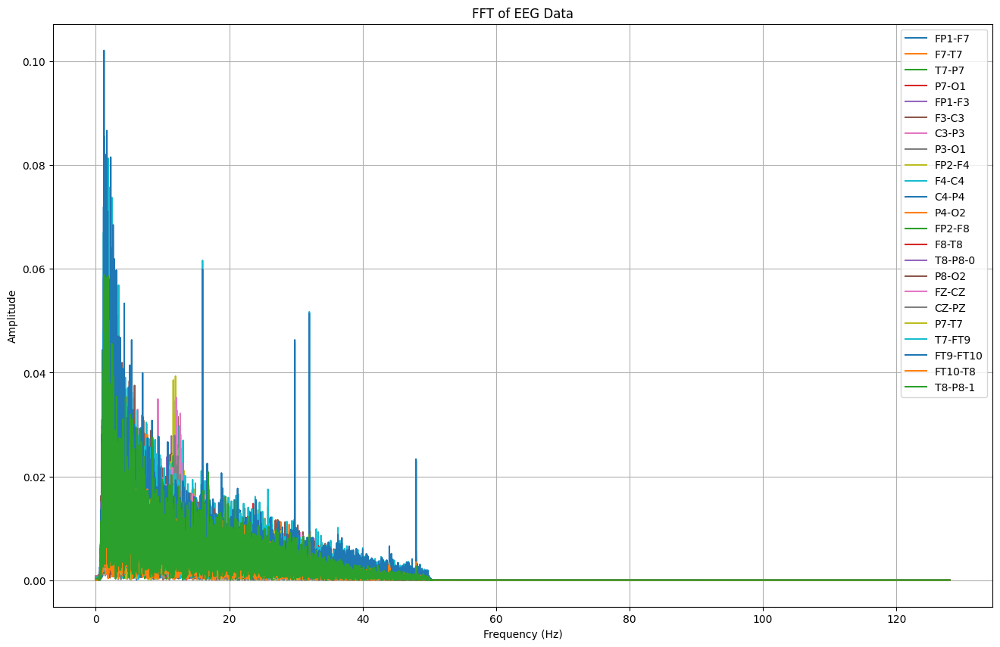

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000400  0.000533  0.000277  0.000811  0.000575  0.000073  0.000485   
1      0.000405  0.000539  0.000270  0.000804  0.000569  0.000068  0.000494   
2      0.000407  0.000539  0.000270  0.000804  0.000568  0.000067  0.000493   
3      0.000405  0.000540  0.000271  0.000805  0.000569  0.000069  0.000494   
4      0.000407  0.000540  0.000268  0.000803  0.000566  0.000067  0.000493   
...         ...       ...       ...       ...       ...       ...       ...   
17915  0.000004  0.000006  0.000006  0.000004  0.000015  0.000026  0.000009   
17916  0.000004  0.000006  0.000006  0.000004  0.000015  0.000026  0.000009   
17917  0.000004  0.000006  0.000006  0.000004  0.000015  0.000026  0.000009   
17918  0.000004  0.000006  0.000006  0.000004  0.000015  0.000026  0.000009   
17919  0.000004  0.000006  0.000006  0.000004  0.000015  0.000026  0.000009   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA55_2 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb12_08_2.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA55_2.columns:
        signal = TA55_2[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_55_2 = pd.DataFrame(fft_features).T
TA_55_2.columns = channels
TA_55_2['seizure'] = TA55_2['seizure']
TA_55_2['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_55_2.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA55_2[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_55_2.to_csv("/content/drive/MyDrive/TA/FFT/chb12_08_2.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_55_2}")


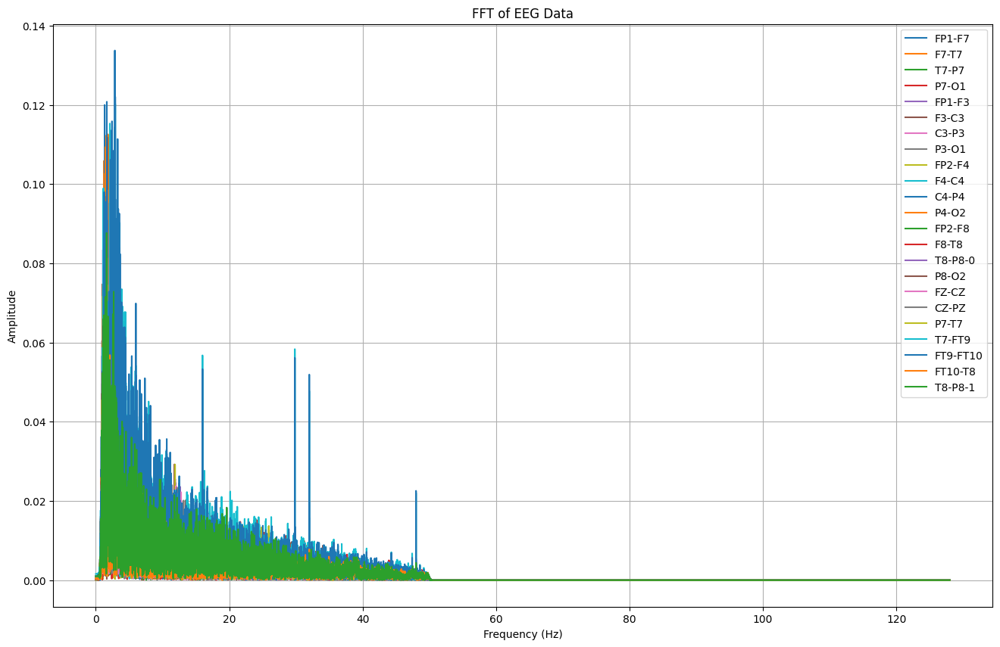

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000076  0.000099  0.000847  0.000817  0.000094  0.000782  0.000526   
1      0.000085  0.000096  0.000839  0.000811  0.000086  0.000775  0.000518   
2      0.000089  0.000100  0.000838  0.000812  0.000084  0.000772  0.000524   
3      0.000081  0.000100  0.000843  0.000810  0.000094  0.000769  0.000527   
4      0.000083  0.000090  0.000841  0.000805  0.000086  0.000769  0.000520   
...         ...       ...       ...       ...       ...       ...       ...   
18683  0.000004  0.000012  0.000005  0.000009  0.000003  0.000002  0.000013   
18684  0.000004  0.000012  0.000005  0.000009  0.000003  0.000002  0.000013   
18685  0.000004  0.000012  0.000005  0.000009  0.000003  0.000002  0.000013   
18686  0.000004  0.000012  0.000005  0.000009  0.000003  0.000002  0.000013   
18687  0.000004  0.000012  0.000005  0.000009  0.000003  0.000002  0.000013   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA55_3 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb12_08_3.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA55_3.columns:
        signal = TA55_3[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_55_3 = pd.DataFrame(fft_features).T
TA_55_3.columns = channels
TA_55_3['seizure'] = TA55_3['seizure']
TA_55_3['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_55_3.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA55_3[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_55_3.to_csv("/content/drive/MyDrive/TA/FFT/chb12_08_3.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_55_3}")


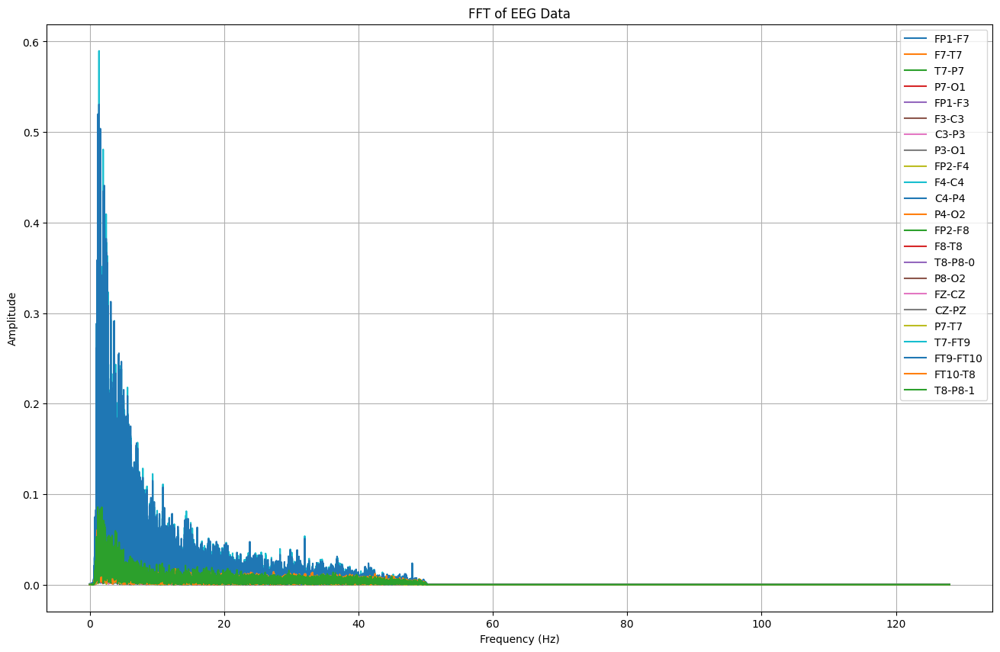

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000092  0.000405  0.000265  0.000047  0.000028  0.000046  0.000303   
1      0.000086  0.000387  0.000264  0.000055  0.000020  0.000037  0.000294   
2      0.000087  0.000396  0.000271  0.000059  0.000026  0.000032  0.000309   
3      0.000085  0.000391  0.000256  0.000056  0.000022  0.000052  0.000294   
4      0.000075  0.000408  0.000289  0.000058  0.000013  0.000041  0.000311   
...         ...       ...       ...       ...       ...       ...       ...   
19451  0.000006  0.000003  0.000024  0.000013  0.000008  0.000026  0.000007   
19452  0.000006  0.000003  0.000024  0.000013  0.000008  0.000026  0.000007   
19453  0.000006  0.000003  0.000024  0.000013  0.000008  0.000026  0.000007   
19454  0.000006  0.000003  0.000024  0.000013  0.000008  0.000026  0.000007   
19455  0.000006  0.000003  0.000024  0.000013  0.000008  0.000026  0.000007   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA56 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb12_09.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA56.columns:
        signal = TA56[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_56 = pd.DataFrame(fft_features).T
TA_56.columns = channels
TA_56['seizure'] = TA56['seizure']
TA_56['frekuensi'] = fft_features[0]

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_56.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA56[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_56.to_csv("/content/drive/MyDrive/TA/FFT/chb12_09.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_56}")


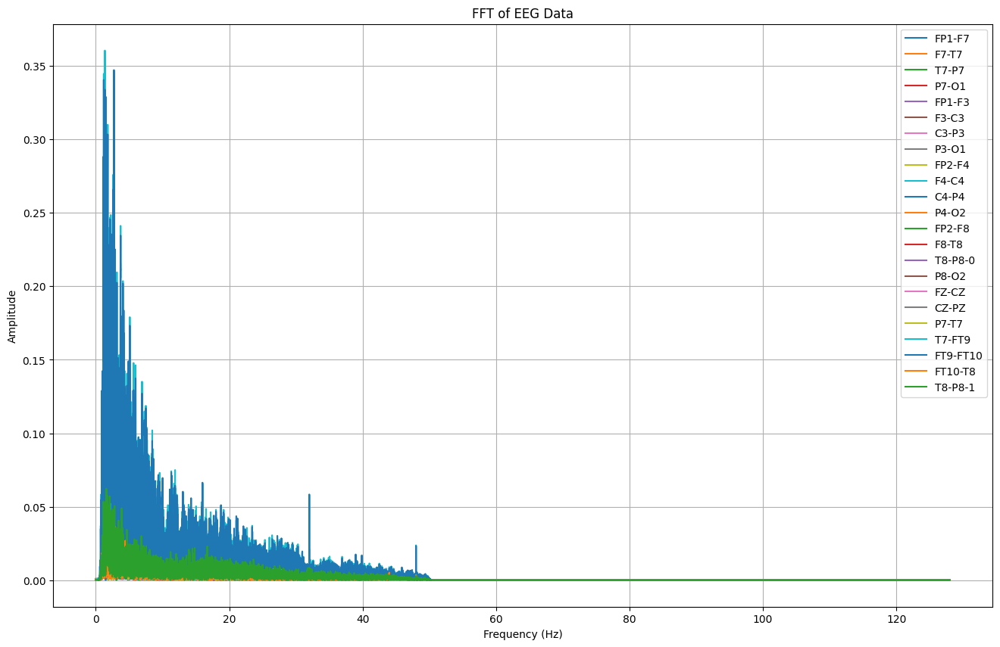

Data setelah FFT berhasil disimpan dalam file CSV:              FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3  \
0      7.382450e-04  0.000768  0.000690  0.000640  0.000349  0.000347   
1      7.457582e-04  0.000760  0.000695  0.000648  0.000356  0.000340   
2      7.474469e-04  0.000761  0.000697  0.000647  0.000358  0.000339   
3      7.398518e-04  0.000760  0.000694  0.000649  0.000350  0.000341   
4      7.497234e-04  0.000764  0.000696  0.000649  0.000362  0.000343   
...             ...       ...       ...       ...       ...       ...   
19451  6.786957e-07  0.000004  0.000015  0.000011  0.000014  0.000016   
19452  6.787044e-07  0.000004  0.000015  0.000011  0.000014  0.000016   
19453  6.787012e-07  0.000004  0.000015  0.000011  0.000014  0.000016   
19454  6.786965e-07  0.000004  0.000015  0.000011  0.000014  0.000016   
19455  6.786984e-07  0.000004  0.000015  0.000011  0.000014  0.000016   

          C3-P3     P3-O1    FP2-F4     F4-C4  ...     P8-O2     FZ-CZ  

In [ ]:

# Simpan data setelah filtering ke file CSV
TA56_1 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb12_09_1.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA56_1.columns:
        signal = TA56_1[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_56_1 = pd.DataFrame(fft_features).T
TA_56_1.columns = channels
TA_56_1['seizure'] = TA56_1['seizure']
TA_56_1['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_56_1.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA56_1[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_56_1.to_csv("/content/drive/MyDrive/TA/FFT/chb12_09_1.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_56_1}")


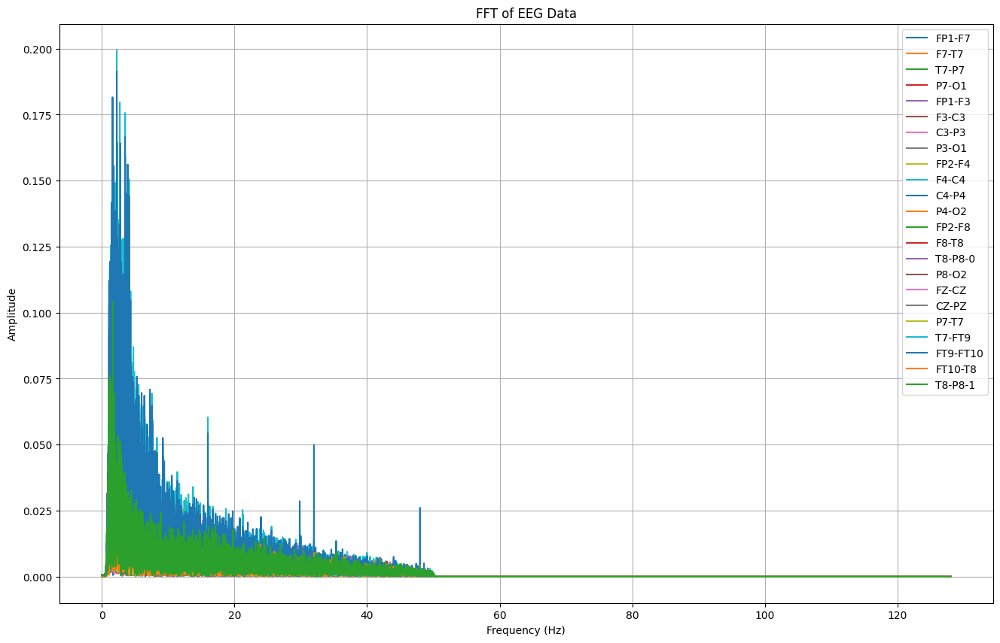

Data setelah FFT berhasil disimpan dalam file CSV:              FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3  \
0      1.710599e-04  0.000449  0.000423  0.000197  0.000142  0.000676   
1      1.782467e-04  0.000457  0.000430  0.000203  0.000149  0.000684   
2      1.843404e-04  0.000457  0.000431  0.000203  0.000153  0.000684   
3      1.773026e-04  0.000460  0.000428  0.000204  0.000148  0.000684   
4      1.793914e-04  0.000456  0.000430  0.000204  0.000151  0.000684   
...             ...       ...       ...       ...       ...       ...   
19451  1.480815e-07  0.000002  0.000010  0.000018  0.000008  0.000007   
19452  1.480793e-07  0.000002  0.000010  0.000018  0.000008  0.000007   
19453  1.480776e-07  0.000002  0.000010  0.000018  0.000008  0.000007   
19454  1.480801e-07  0.000002  0.000010  0.000018  0.000008  0.000007   
19455  1.480806e-07  0.000002  0.000010  0.000018  0.000008  0.000007   

          C3-P3     P3-O1    FP2-F4     F4-C4  ...     P8-O2     FZ-CZ  

In [ ]:

# Simpan data setelah filtering ke file CSV
TA57 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb12_10.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA57.columns:
        signal = TA57[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_57 = pd.DataFrame(fft_features).T
TA_57.columns = channels
TA_57['seizure'] = TA57['seizure']
TA_57['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_57.columns:
        fft_freqs, fft_vals = compute_fft(TA57[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_57.to_csv("/content/drive/MyDrive/TA/FFT/chb12_10.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_57}")


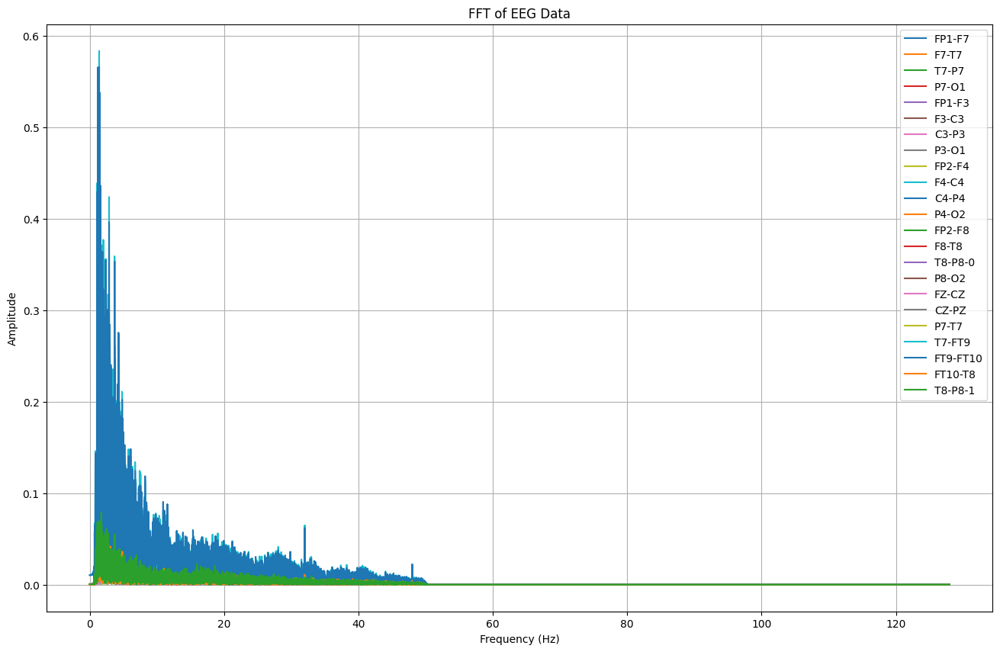

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000351  0.000626  0.000217  0.000478  0.000445  0.000371  0.000291   
1      0.000342  0.000634  0.000210  0.000471  0.000435  0.000378  0.000298   
2      0.000341  0.000634  0.000208  0.000471  0.000434  0.000378  0.000299   
3      0.000343  0.000634  0.000210  0.000471  0.000437  0.000378  0.000298   
4      0.000345  0.000628  0.000209  0.000470  0.000434  0.000376  0.000292   
...         ...       ...       ...       ...       ...       ...       ...   
20987  0.000010  0.000003  0.000003  0.000004  0.000005  0.000008  0.000010   
20988  0.000010  0.000003  0.000003  0.000004  0.000005  0.000008  0.000010   
20989  0.000010  0.000003  0.000003  0.000004  0.000005  0.000008  0.000010   
20990  0.000010  0.000003  0.000003  0.000004  0.000005  0.000008  0.000010   
20991  0.000010  0.000003  0.000003  0.000004  0.000005  0.000008  0.000010   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA57_1 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb12_10_1.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA57_1.columns:
        signal = TA57_1[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_57_1 = pd.DataFrame(fft_features).T
TA_57_1.columns = channels
TA_57_1['seizure'] = TA57_1['seizure']
TA_57_1['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_57_1.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA57_1[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_57_1.to_csv("/content/drive/MyDrive/TA/FFT/chb12_10_1.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_57_1}")


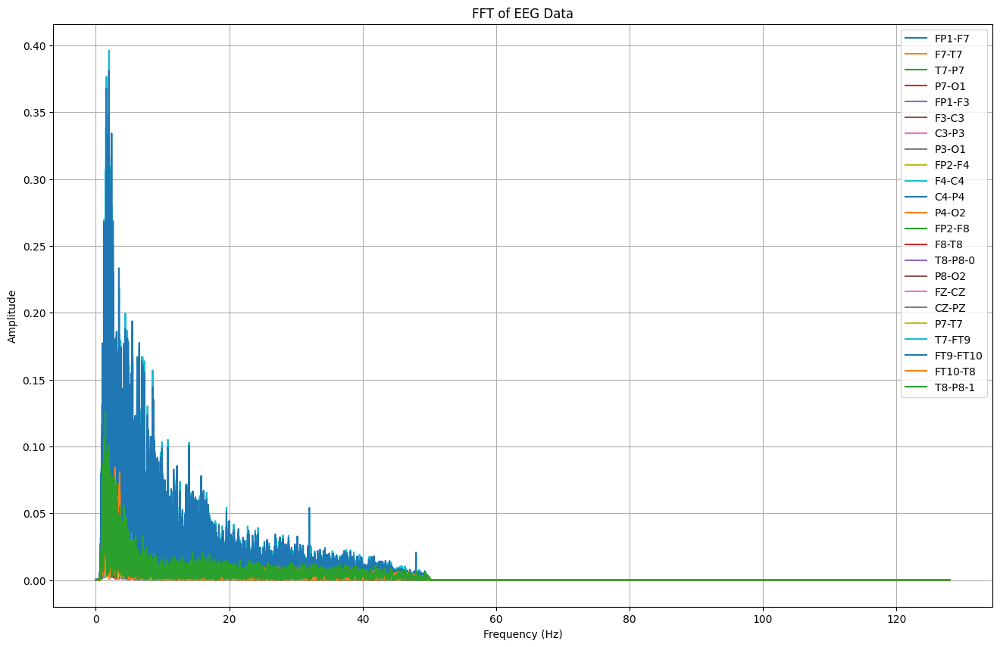

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000071  0.000346  0.000037  0.000019  0.000348  0.000363  0.000490   
1      0.000064  0.000354  0.000028  0.000027  0.000337  0.000368  0.000497   
2      0.000064  0.000353  0.000024  0.000027  0.000336  0.000368  0.000498   
3      0.000061  0.000355  0.000030  0.000024  0.000347  0.000380  0.000495   
4      0.000067  0.000357  0.000035  0.000031  0.000355  0.000381  0.000498   
...         ...       ...       ...       ...       ...       ...       ...   
20091  0.000007  0.000005  0.000015  0.000011  0.000003  0.000024  0.000006   
20092  0.000007  0.000005  0.000015  0.000011  0.000003  0.000024  0.000006   
20093  0.000007  0.000005  0.000015  0.000011  0.000003  0.000024  0.000006   
20094  0.000007  0.000005  0.000015  0.000011  0.000003  0.000024  0.000006   
20095  0.000007  0.000005  0.000015  0.000011  0.000003  0.000024  0.000006   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA58 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb12_11.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA58.columns:
        signal = TA58[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_58 = pd.DataFrame(fft_features).T
TA_58.columns = channels
TA_58['seizure'] = TA58['seizure']
TA_58['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_58.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA58[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_58.to_csv("/content/drive/MyDrive/TA/FFT/chb12_11.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_58}")


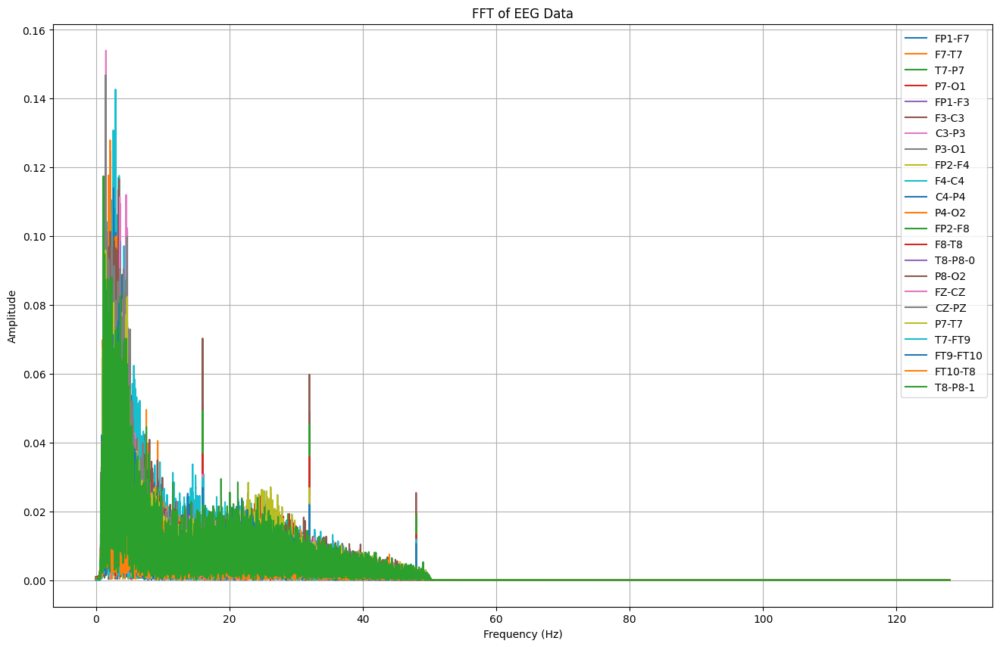

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000064  0.000453  0.000540  0.000053  0.000178  0.000263  0.000576   
1      0.000054  0.000463  0.000549  0.000066  0.000166  0.000271  0.000585   
2      0.000055  0.000465  0.000546  0.000062  0.000172  0.000272  0.000588   
3      0.000053  0.000461  0.000555  0.000070  0.000163  0.000271  0.000583   
4      0.000053  0.000467  0.000542  0.000059  0.000172  0.000271  0.000588   
...         ...       ...       ...       ...       ...       ...       ...   
25595  0.000014  0.000008  0.000020  0.000003  0.000022  0.000005  0.000018   
25596  0.000014  0.000008  0.000020  0.000003  0.000022  0.000005  0.000018   
25597  0.000014  0.000008  0.000020  0.000003  0.000022  0.000005  0.000018   
25598  0.000014  0.000008  0.000020  0.000003  0.000022  0.000005  0.000018   
25599  0.000014  0.000008  0.000020  0.000003  0.000022  0.000005  0.000018   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA59 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb12_23.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA59.columns:
        signal = TA59[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_59 = pd.DataFrame(fft_features).T
TA_59.columns = channels
TA_59['seizure'] = TA59['seizure']
TA_59['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_59.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA59[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_59.to_csv("/content/drive/MyDrive/TA/FFT/chb12_23.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_59}")


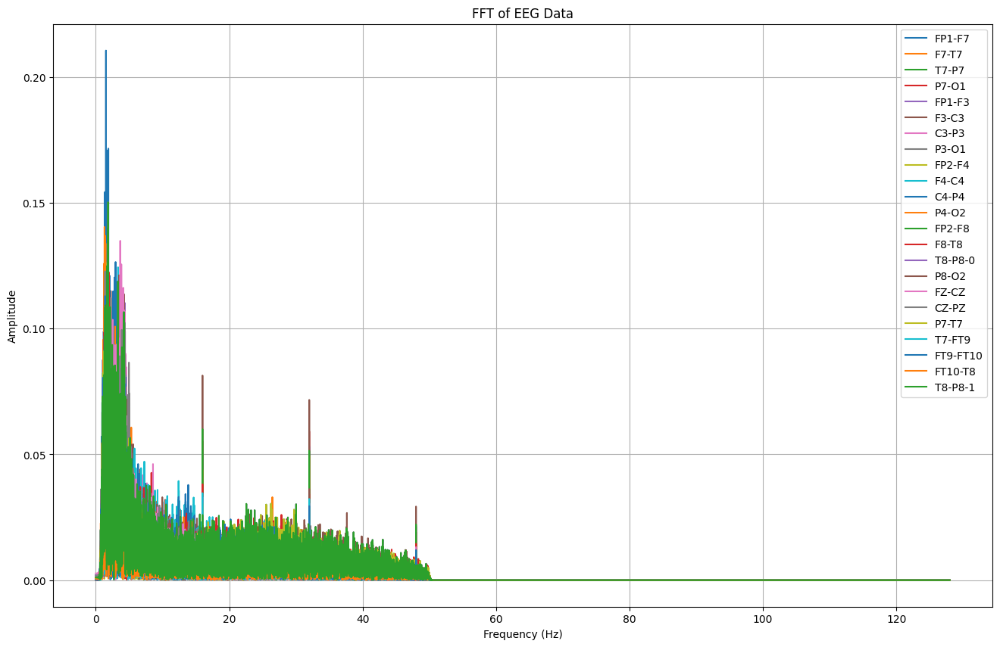

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.002061  0.000779  0.000994  0.000280  0.002076  0.000681  0.002705   
1      0.002073  0.000769  0.000984  0.000270  0.002088  0.000691  0.002696   
2      0.002071  0.000766  0.000988  0.000274  0.002084  0.000692  0.002697   
3      0.002075  0.000770  0.000983  0.000278  0.002088  0.000690  0.002694   
4      0.002068  0.000773  0.000987  0.000276  0.002083  0.000686  0.002700   
...         ...       ...       ...       ...       ...       ...       ...   
27771  0.000016  0.000019  0.000015  0.000002  0.000013  0.000034  0.000027   
27772  0.000016  0.000019  0.000015  0.000002  0.000013  0.000034  0.000027   
27773  0.000016  0.000019  0.000015  0.000002  0.000013  0.000034  0.000027   
27774  0.000016  0.000019  0.000015  0.000002  0.000013  0.000034  0.000027   
27775  0.000016  0.000019  0.000015  0.000002  0.000013  0.000034  0.000027   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA59_1 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb12_23_1.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA59_1.columns:
        signal = TA59_1[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_59_1 = pd.DataFrame(fft_features).T
TA_59_1.columns = channels
TA_59_1['seizure'] = TA59_1['seizure']
TA_59_1['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_59_1.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA59_1[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_59_1.to_csv("/content/drive/MyDrive/TA/FFT/chb12_23_1.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_59_1}")


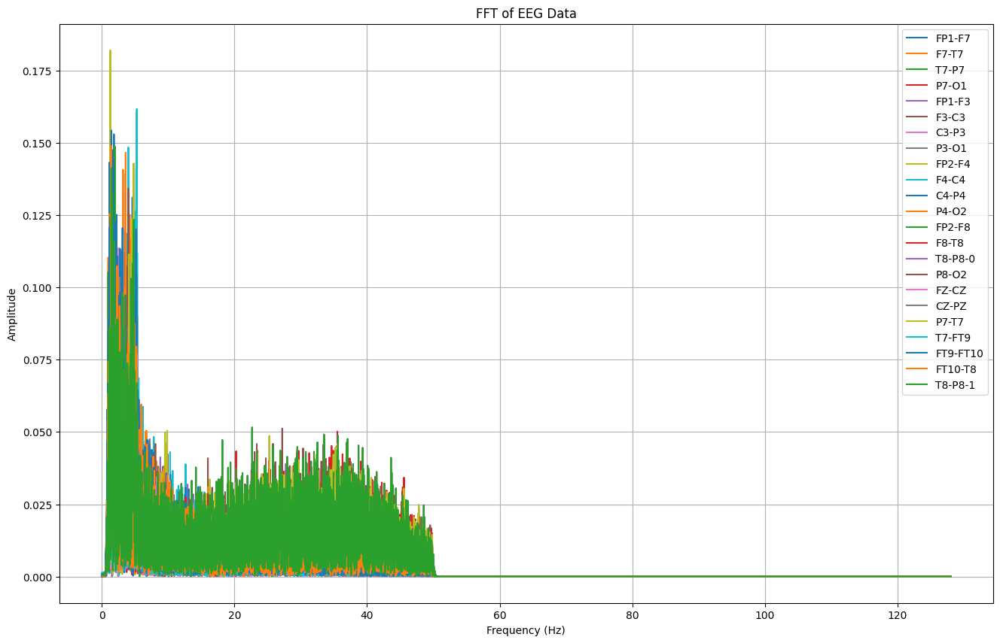

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000617  0.000373  0.000457  0.000004  0.000813  0.000292  0.000203   
1      0.000620  0.000364  0.000464  0.000004  0.000817  0.000284  0.000193   
2      0.000621  0.000366  0.000467  0.000014  0.000817  0.000283  0.000196   
3      0.000620  0.000368  0.000460  0.000021  0.000811  0.000284  0.000191   
4      0.000630  0.000351  0.000463  0.000023  0.000833  0.000276  0.000188   
...         ...       ...       ...       ...       ...       ...       ...   
20475  0.000004  0.000018  0.000010  0.000017  0.000005  0.000016  0.000011   
20476  0.000004  0.000018  0.000010  0.000017  0.000005  0.000016  0.000011   
20477  0.000004  0.000018  0.000010  0.000017  0.000005  0.000016  0.000011   
20478  0.000004  0.000018  0.000010  0.000017  0.000005  0.000016  0.000011   
20479  0.000004  0.000018  0.000010  0.000017  0.000005  0.000016  0.000011   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA59_2 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb12_23_2.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA59_2.columns:
        signal = TA59_2[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_59_2 = pd.DataFrame(fft_features).T
TA_59_2.columns = channels
TA_59_2['seizure'] = TA59_2['seizure']
TA_59_2['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_59_2.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA59_2[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_59_2.to_csv("/content/drive/MyDrive/TA/FFT/chb12_23_2.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_59_2}")


# ERROR

In [ ]:

# Simpan data setelah filtering ke file CSV
TA60 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb12_27.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
import seaborn as sns

# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals)[:N // 2]
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA60.columns:
        signal = TA60[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_60 = pd.DataFrame(fft_features).T
TA_60.columns = channels
TA_60['seizure'] = TA60['seizure']
TA_60['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_60.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA60[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_60.to_csv("/content/drive/MyDrive/TA/FFT/chb12_27.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_60}")


FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/TA/FILTERING/chb12_27.csv'

In [ ]:

# Simpan data setelah filtering ke file CSV
TA60_1 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb12_27_1.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
import seaborn as sns

# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA60_1.columns:
        signal = TA60_1[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_60_1 = pd.DataFrame(fft_features).T
TA_60_1.columns = channels
TA_60_1['seizure'] = TA60_1['seizure']
TA_60_1['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_60_1.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA60_1[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_60_1.to_csv("/content/drive/MyDrive/TA/FFT/chb12_27_1.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_60_1}")


FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/TA/FILTERING/chb12_27_1.csv'

In [ ]:

# Simpan data setelah filtering ke file CSV
TA60_2 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb12_27_2.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA60_2.columns:
        signal = TA60_2[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_60_2 = pd.DataFrame(fft_features).T
TA_60_2.columns = channels
TA_60_2['seizure'] = TA60_2['seizure']
TA_60_2['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_60_2.columns:
        fft_freqs, fft_vals = compute_fft(TA60_2[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_60_2.to_csv("/content/drive/MyDrive/TA/FFT/chb12_27_2.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_60_2}")


FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/TA/FILTERING/chb12_27_2.csv'

In [ ]:

# Simpan data setelah filtering ke file CSV
TA60_3 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb12_27_3.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA60_3.columns:
        signal = TA60_3[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_60_3 = pd.DataFrame(fft_features).T
TA_60_3.columns = channels
TA_60_3['seizure'] = TA60_3['seizure']
TA_60_3['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_60_3.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA60_3[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_60_3.to_csv("/content/drive/MyDrive/TA/FFT/chb12_27_3.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_60_3}")


FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/TA/FILTERING/chb12_27_3.csv'

In [ ]:

# Simpan data setelah filtering ke file CSV
TA60_4 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb12_27_4.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA60_4.columns:
        signal = TA60_4[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_60_4 = pd.DataFrame(fft_features).T
TA_60_4.columns = channels
TA_60_4['seizure'] = TA60_4['seizure']
TA_60_4['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_60_4.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA60_4[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_60_4.to_csv("/content/drive/MyDrive/TA/FFT/chb12_27_4.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_60_4}")


FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/TA/FILTERING/chb12_27_4.csv'

In [ ]:

# Simpan data setelah filtering ke file CSV
TA60_5 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb12_27_5.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA60_5.columns:
        signal = TA60_5[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_60_5 = pd.DataFrame(fft_features).T
TA_60_5.columns = channels
TA_60_5['seizure'] = TA60_5['seizure']
TA_60_5['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_60_5.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA60_5[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_60_5.to_csv("/content/drive/MyDrive/TA/FFT/chb12_27_5.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_60_5}")


FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/TA/FILTERING/chb12_27_5.csv'

In [ ]:

# Simpan data setelah filtering ke file CSV
TA61 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb12_28.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA61.columns:
        signal = TA61[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_61 = pd.DataFrame(fft_features).T
TA_61.columns = channels
TA_61['seizure'] = TA61['seizure']
TA_61['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_61.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA61[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_61.to_csv("/content/drive/MyDrive/TA/FFT/chb12_28.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_61}")


FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/TA/FILTERING/chb12_28.csv'

In [ ]:

# Simpan data setelah filtering ke file CSV
TA62= pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb12_29.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA62.columns:
        signal = TA62[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_62 = pd.DataFrame(fft_features).T
TA_62.columns = channels
TA_62['seizure'] = TA62['seizure']
TA_62['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_62.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA62[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_62.to_csv("/content/drive/MyDrive/TA/FFT/chb12_29.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_62}")


FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/TA/FILTERING/chb12_29.csv'

# SAMPEL 61-80

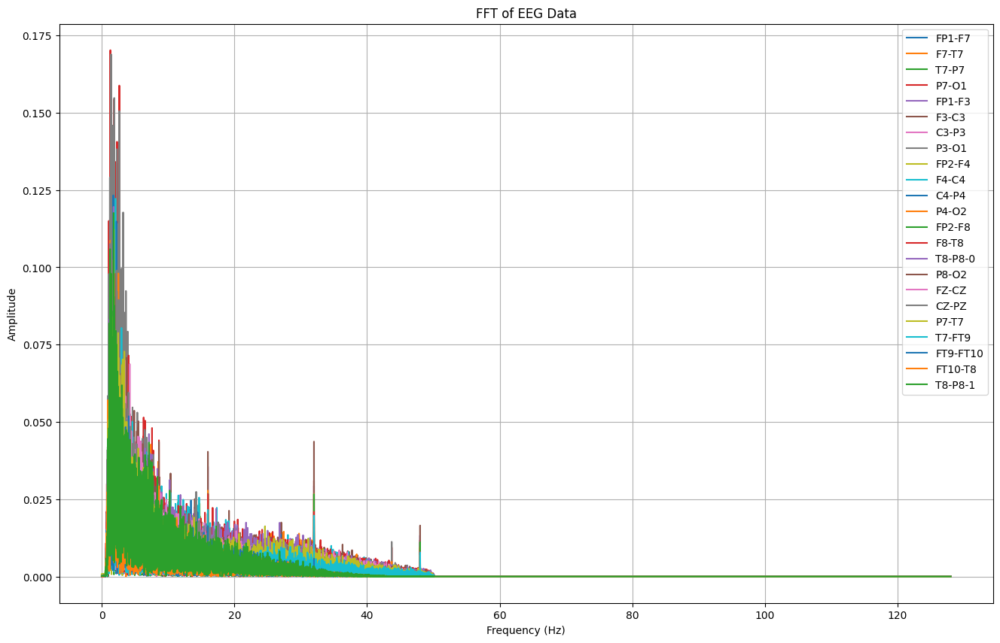

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000206  0.000050  0.000685  0.000117  0.000505  0.000083  0.000302   
1      0.000201  0.000056  0.000680  0.000122  0.000498  0.000085  0.000291   
2      0.000196  0.000053  0.000668  0.000110  0.000495  0.000088  0.000291   
3      0.000203  0.000055  0.000682  0.000146  0.000500  0.000097  0.000301   
4      0.000200  0.000054  0.000690  0.000178  0.000495  0.000089  0.000296   
...         ...       ...       ...       ...       ...       ...       ...   
18043  0.000006  0.000005  0.000006  0.000008  0.000013  0.000020  0.000008   
18044  0.000006  0.000005  0.000006  0.000008  0.000013  0.000020  0.000008   
18045  0.000006  0.000005  0.000006  0.000008  0.000013  0.000020  0.000008   
18046  0.000006  0.000005  0.000006  0.000008  0.000013  0.000020  0.000008   
18047  0.000006  0.000005  0.000006  0.000008  0.000013  0.000020  0.000008   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA63 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb12_33.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA63.columns:
        signal = TA63[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_63 = pd.DataFrame(fft_features).T
TA_63.columns = channels
TA_63['seizure'] = TA63['seizure']
TA_63['frekuensi'] = np.fft.fftfreq(len(TA63['FP1-F7']), d=1/256)[:len(TA63['FP1-F7'])//2]

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_63.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA63[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_63.to_csv("/content/drive/MyDrive/TA/FFT/chb12_33.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_63}")


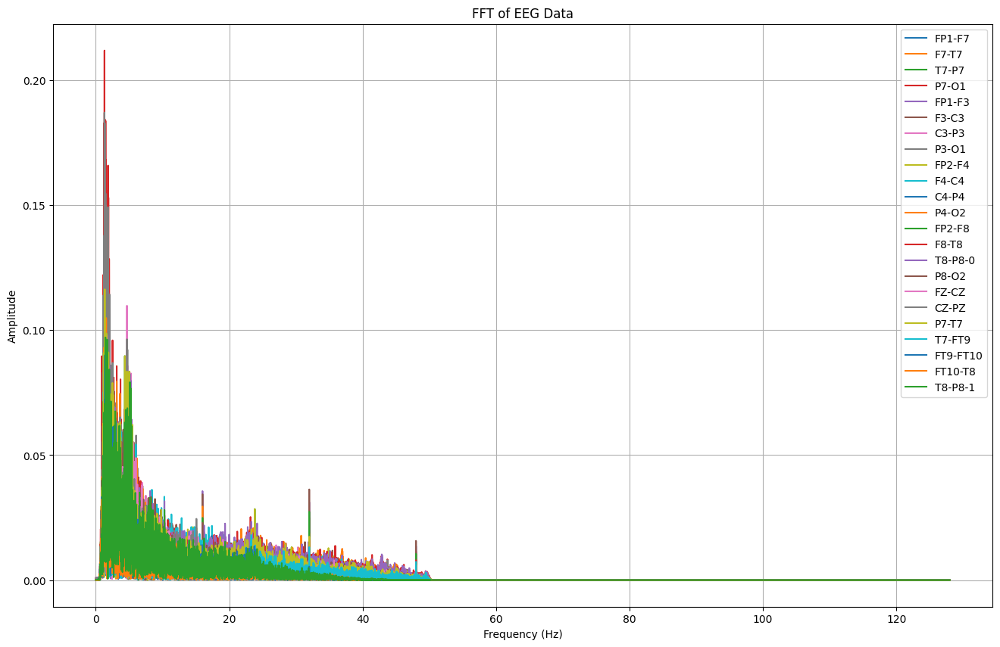

Data setelah FFT berhasil disimpan dalam file CSV:              FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3  \
0      1.949508e-05  0.000186  0.000030  0.000102  0.000676  0.000338   
1      2.613816e-05  0.000192  0.000032  0.000120  0.000670  0.000345   
2      2.560658e-05  0.000189  0.000028  0.000111  0.000672  0.000342   
3      2.056217e-05  0.000192  0.000036  0.000122  0.000680  0.000341   
4      2.113512e-05  0.000194  0.000031  0.000145  0.000681  0.000344   
...             ...       ...       ...       ...       ...       ...   
18299  2.868862e-07  0.000022  0.000018  0.000007  0.000005  0.000023   
18300  2.868719e-07  0.000022  0.000018  0.000007  0.000005  0.000023   
18301  2.868826e-07  0.000022  0.000018  0.000007  0.000005  0.000023   
18302  2.868797e-07  0.000022  0.000018  0.000007  0.000005  0.000023   
18303  2.868811e-07  0.000022  0.000018  0.000007  0.000005  0.000023   

          C3-P3     P3-O1    FP2-F4     F4-C4  ...     P8-O2     FZ-CZ  

In [ ]:

# Simpan data setelah filtering ke file CSV
TA63_1 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb12_33_1.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA63_1.columns:
        signal = TA63_1[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_63_1 = pd.DataFrame(fft_features).T
TA_63_1.columns = channels
TA_63_1['seizure'] = TA63_1['seizure']
TA_63_1['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_63_1.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA63_1[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_63_1.to_csv("/content/drive/MyDrive/TA/FFT/chb12_33_1.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_63_1}")


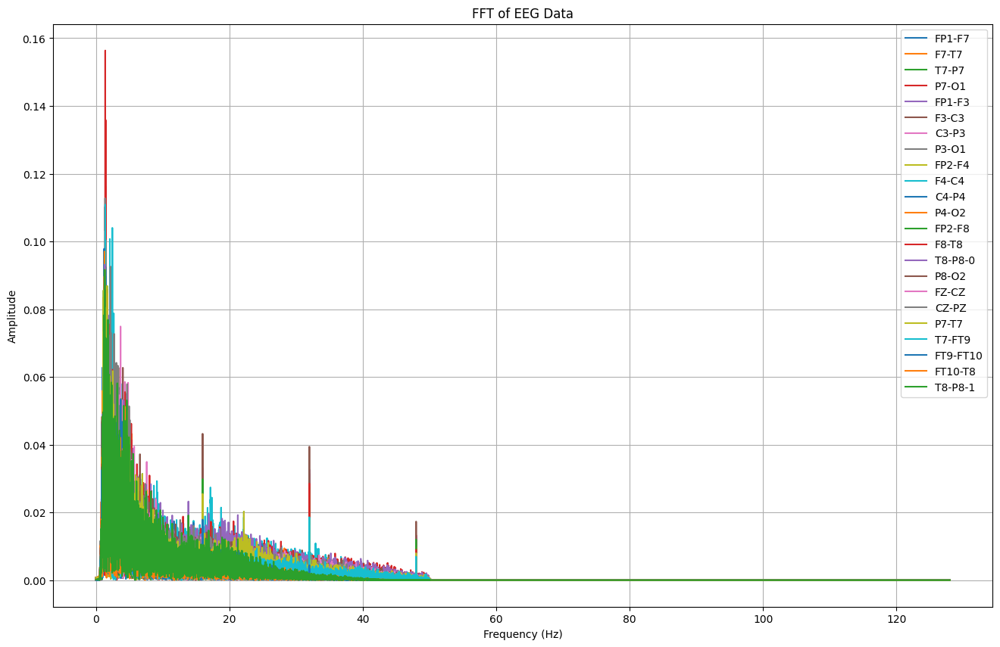

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000112  0.000150  0.000673  0.000237  0.000059  0.000413  0.000098   
1      0.000106  0.000156  0.000676  0.000221  0.000056  0.000405  0.000092   
2      0.000104  0.000153  0.000660  0.000216  0.000050  0.000408  0.000092   
3      0.000106  0.000158  0.000659  0.000257  0.000061  0.000399  0.000089   
4      0.000107  0.000155  0.000689  0.000257  0.000051  0.000413  0.000093   
...         ...       ...       ...       ...       ...       ...       ...   
18811  0.000004  0.000004  0.000001  0.000008  0.000008  0.000006  0.000004   
18812  0.000004  0.000004  0.000001  0.000008  0.000008  0.000006  0.000004   
18813  0.000004  0.000004  0.000001  0.000008  0.000008  0.000006  0.000004   
18814  0.000004  0.000004  0.000001  0.000008  0.000008  0.000006  0.000004   
18815  0.000004  0.000004  0.000001  0.000008  0.000008  0.000006  0.000004   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA64 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb12_36.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA64.columns:
        signal = TA64[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_64 = pd.DataFrame(fft_features).T
TA_64.columns = channels
TA_64['seizure'] = TA64['seizure']
TA_64['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_64.columns:
        fft_freqs, fft_vals = compute_fft(TA64[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_64.to_csv("/content/drive/MyDrive/TA/FFT/chb12_36.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_64}")


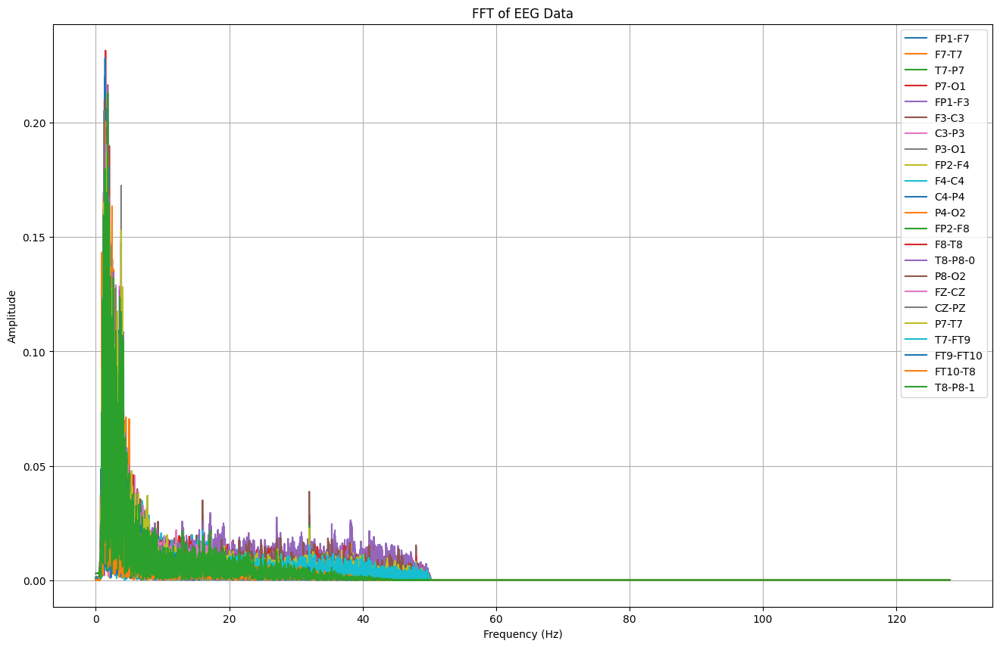

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000526  0.001176  0.000199  0.000074  0.000072  0.001471  0.000500   
1      0.000538  0.001183  0.000211  0.000075  0.000050  0.001475  0.000499   
2      0.000541  0.001179  0.000214  0.000084  0.000061  0.001476  0.000506   
3      0.000541  0.001178  0.000219  0.000067  0.000062  0.001472  0.000511   
4      0.000533  0.001184  0.000226  0.000052  0.000051  0.001475  0.000499   
...         ...       ...       ...       ...       ...       ...       ...   
18555  0.000007  0.000016  0.000029  0.000015  0.000004  0.000017  0.000045   
18556  0.000007  0.000016  0.000029  0.000015  0.000004  0.000017  0.000045   
18557  0.000007  0.000016  0.000029  0.000015  0.000004  0.000017  0.000045   
18558  0.000007  0.000016  0.000029  0.000015  0.000004  0.000017  0.000045   
18559  0.000007  0.000016  0.000029  0.000015  0.000004  0.000017  0.000045   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA65 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb12_38.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA65.columns:
        signal = TA65[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_65 = pd.DataFrame(fft_features).T
TA_65.columns = channels
TA_65['seizure'] = TA65['seizure']
TA_65['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_65.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA65[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_65.to_csv("/content/drive/MyDrive/TA/FFT/chb12_38.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_65}")


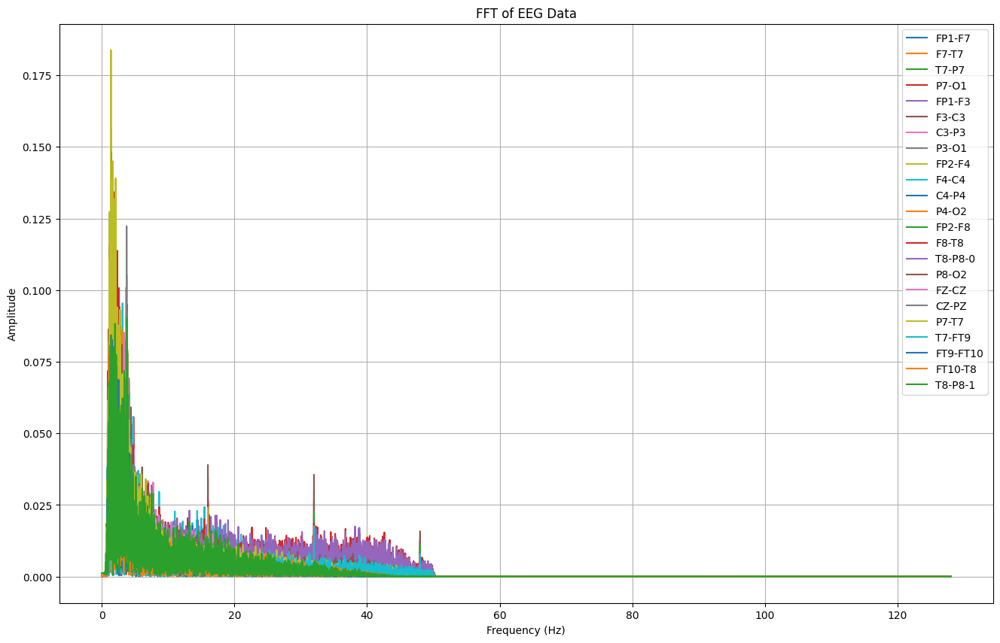

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000097  0.000772  0.001062  0.000136  0.000131  0.000357  0.001019   
1      0.000090  0.000779  0.001067  0.000145  0.000138  0.000364  0.001026   
2      0.000090  0.000777  0.001070  0.000147  0.000136  0.000366  0.001023   
3      0.000089  0.000777  0.001075  0.000139  0.000135  0.000361  0.001028   
4      0.000088  0.000780  0.001083  0.000121  0.000146  0.000361  0.001024   
...         ...       ...       ...       ...       ...       ...       ...   
18299  0.000008  0.000005  0.000013  0.000011  0.000007  0.000005  0.000015   
18300  0.000008  0.000005  0.000013  0.000011  0.000007  0.000005  0.000015   
18301  0.000008  0.000005  0.000013  0.000011  0.000007  0.000005  0.000015   
18302  0.000008  0.000005  0.000013  0.000011  0.000007  0.000005  0.000015   
18303  0.000008  0.000005  0.000013  0.000011  0.000007  0.000005  0.000015   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA65_1 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb12_38_1.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA65_1.columns:
        signal = TA65_1[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_65_1 = pd.DataFrame(fft_features).T
TA_65_1.columns = channels
TA_65_1['seizure'] = TA65_1['seizure']
TA_65_1['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_65_1.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA65_1[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_65_1.to_csv("/content/drive/MyDrive/TA/FFT/chb12_38_1.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_65_1}")


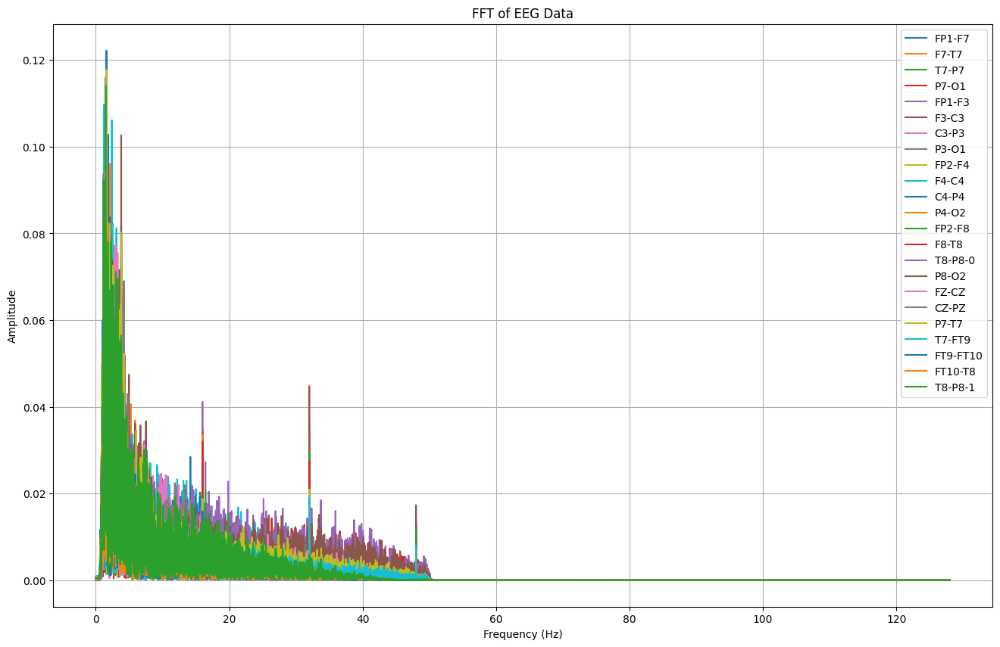

Data setelah FFT berhasil disimpan dalam file CSV:              FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3  \
0      2.037543e-04  0.000147  0.000112  0.000095  0.000375  0.000440   
1      1.957845e-04  0.000139  0.000123  0.000100  0.000384  0.000435   
2      1.936838e-04  0.000141  0.000112  0.000111  0.000382  0.000432   
3      1.995393e-04  0.000136  0.000133  0.000087  0.000382  0.000435   
4      1.931627e-04  0.000142  0.000103  0.000126  0.000383  0.000432   
...             ...       ...       ...       ...       ...       ...   
20859  2.382123e-07  0.000011  0.000009  0.000007  0.000003  0.000010   
20860  2.382121e-07  0.000011  0.000009  0.000007  0.000003  0.000010   
20861  2.382105e-07  0.000011  0.000009  0.000007  0.000003  0.000010   
20862  2.382128e-07  0.000011  0.000009  0.000007  0.000003  0.000010   
20863  2.382117e-07  0.000011  0.000009  0.000007  0.000003  0.000010   

          C3-P3     P3-O1    FP2-F4     F4-C4  ...     P8-O2     FZ-CZ  

In [ ]:

# Simpan data setelah filtering ke file CSV
TA65_2 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb12_38_2.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA65_2.columns:
        signal = TA65_2[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_65_2 = pd.DataFrame(fft_features).T
TA_65_2.columns = channels
TA_65_2['seizure'] = TA65_2['seizure']
TA_65_2['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_65_2.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA65_2[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_65_2.to_csv("/content/drive/MyDrive/TA/FFT/chb12_38_2.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_65_2}")


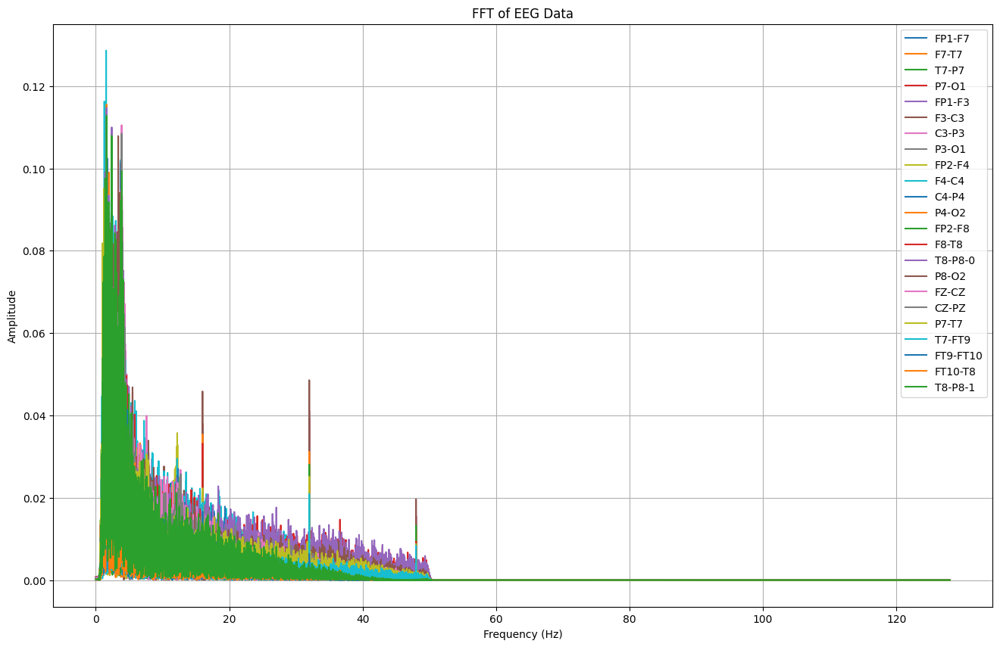

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3         F3-C3  \
0      0.000307  0.000214  0.000150  0.000256  0.000055  7.064795e-04   
1      0.000298  0.000222  0.000161  0.000263  0.000045  7.149369e-04   
2      0.000299  0.000220  0.000159  0.000265  0.000048  7.147583e-04   
3      0.000300  0.000222  0.000160  0.000266  0.000048  7.145761e-04   
4      0.000296  0.000221  0.000160  0.000259  0.000048  7.160568e-04   
...         ...       ...       ...       ...       ...           ...   
22395  0.000003  0.000017  0.000002  0.000019  0.000007  5.848437e-07   
22396  0.000003  0.000017  0.000002  0.000019  0.000007  5.848735e-07   
22397  0.000003  0.000017  0.000002  0.000019  0.000007  5.848497e-07   
22398  0.000003  0.000017  0.000002  0.000019  0.000007  5.848666e-07   
22399  0.000003  0.000017  0.000002  0.000019  0.000007  5.848582e-07   

          C3-P3     P3-O1    FP2-F4     F4-C4  ...     P8-O2     FZ-CZ  

In [ ]:

# Simpan data setelah filtering ke file CSV
TA65_3 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb12_38_3.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA65_3.columns:
        signal = TA65_3[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_65_3 = pd.DataFrame(fft_features).T
TA_65_3.columns = channels
TA_65_3['seizure'] = TA65_3['seizure']
TA_65_3['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_65_3.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA65_3[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_65_3.to_csv("/content/drive/MyDrive/TA/FFT/chb12_38_3.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_65_3}")


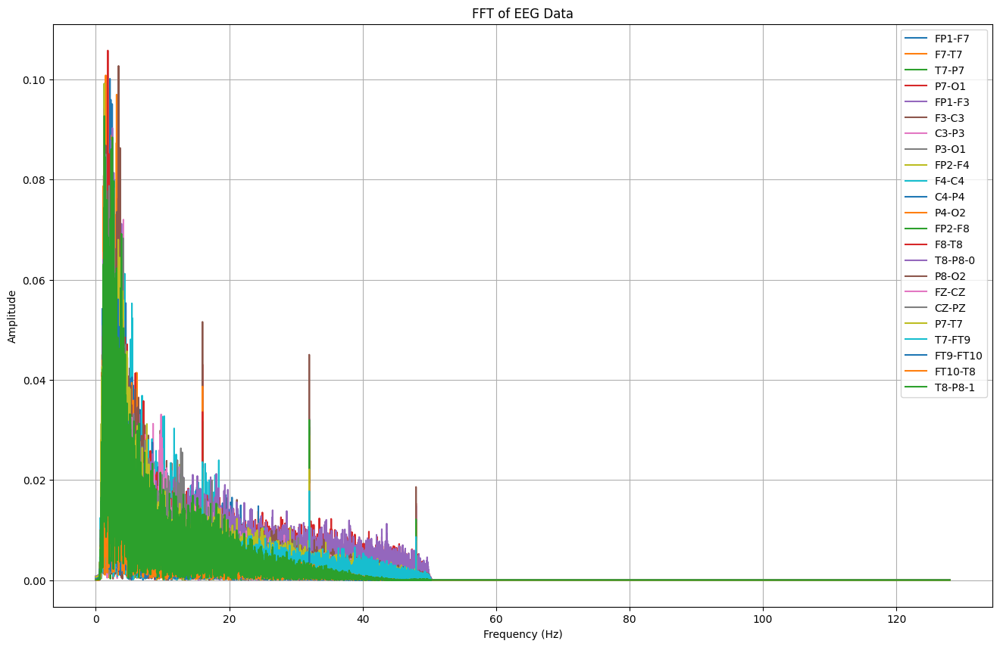

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000744  0.000043  0.000677  0.000344  0.000825  0.000013  0.000449   
1      0.000752  0.000033  0.000688  0.000337  0.000833  0.000003  0.000442   
2      0.000752  0.000035  0.000685  0.000336  0.000831  0.000004  0.000442   
3      0.000749  0.000032  0.000691  0.000342  0.000832  0.000006  0.000440   
4      0.000751  0.000034  0.000686  0.000332  0.000834  0.000007  0.000442   
...         ...       ...       ...       ...       ...       ...       ...   
21243  0.000011  0.000004  0.000008  0.000027  0.000010  0.000006  0.000017   
21244  0.000011  0.000004  0.000008  0.000027  0.000010  0.000006  0.000017   
21245  0.000011  0.000004  0.000008  0.000027  0.000010  0.000006  0.000017   
21246  0.000011  0.000004  0.000008  0.000027  0.000010  0.000006  0.000017   
21247  0.000011  0.000004  0.000008  0.000027  0.000010  0.000006  0.000017   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA65_4 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb12_38_4.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA65_4.columns:
        signal = TA65_4[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_65_4 = pd.DataFrame(fft_features).T
TA_65_4.columns = channels
TA_65_4['seizure'] = TA65_4['seizure']
TA_65_4['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_65_4.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA65_4[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_65_4.to_csv("/content/drive/MyDrive/TA/FFT/chb12_38_4.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_65_4}")


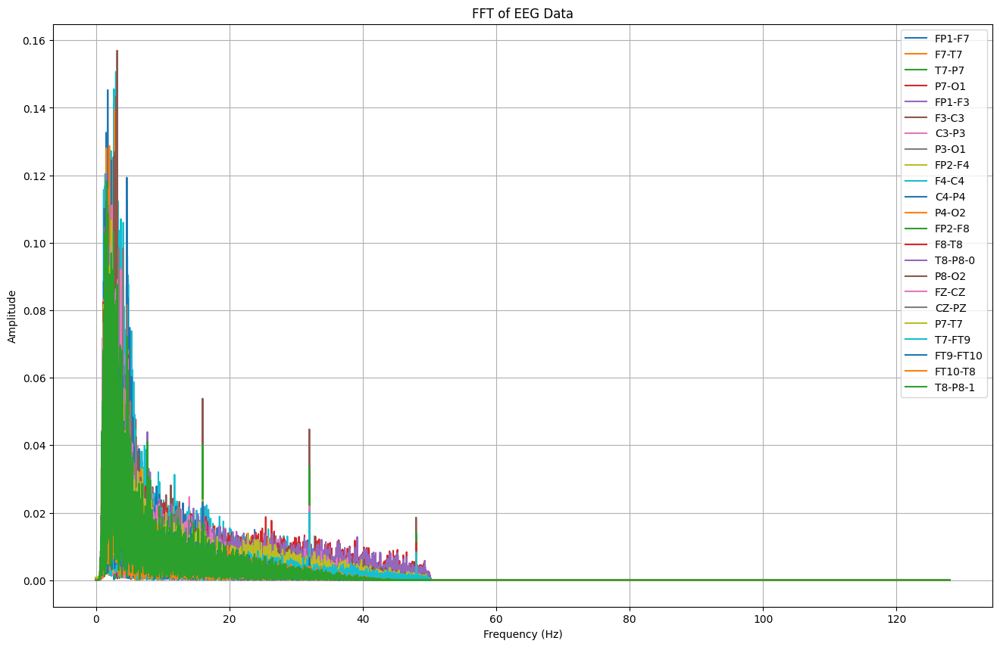

Data setelah FFT berhasil disimpan dalam file CSV:              FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3  \
0      1.962653e-06  0.000071  0.000820  0.000418  0.000396  0.000283   
1      7.221218e-06  0.000081  0.000812  0.000425  0.000406  0.000274   
2      7.601644e-06  0.000077  0.000811  0.000428  0.000402  0.000272   
3      3.497678e-06  0.000080  0.000810  0.000426  0.000407  0.000278   
4      1.133363e-05  0.000081  0.000817  0.000426  0.000403  0.000275   
...             ...       ...       ...       ...       ...       ...   
21883  7.954095e-07  0.000028  0.000019  0.000004  0.000018  0.000015   
21884  7.954145e-07  0.000028  0.000019  0.000004  0.000018  0.000015   
21885  7.954114e-07  0.000028  0.000019  0.000004  0.000018  0.000015   
21886  7.954150e-07  0.000028  0.000019  0.000004  0.000018  0.000015   
21887  7.954115e-07  0.000028  0.000019  0.000004  0.000018  0.000015   

          C3-P3     P3-O1    FP2-F4     F4-C4  ...     P8-O2     FZ-CZ  

In [ ]:

# Simpan data setelah filtering ke file CSV
TA66 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb12_42.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA66.columns:
        signal = TA66[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_66 = pd.DataFrame(fft_features).T
TA_66.columns = channels
TA_66['seizure'] = TA66['seizure']
TA_66['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_66.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA66[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_66.to_csv("/content/drive/MyDrive/TA/FFT/chb12_42.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_66}")


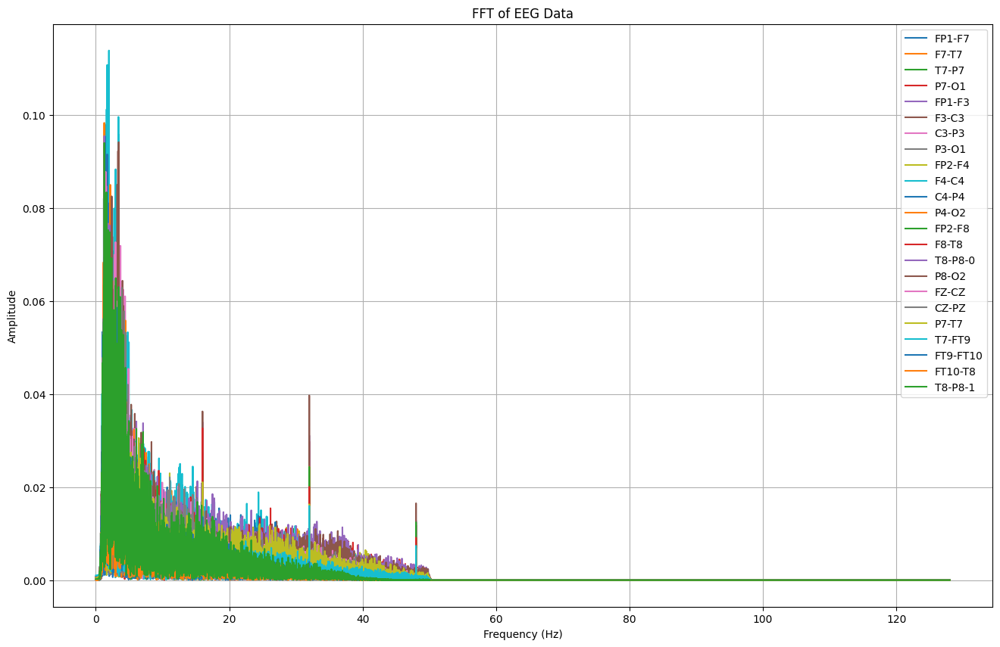

Data setelah FFT berhasil disimpan dalam file CSV:              FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3  \
0      2.111199e-04  0.000318  0.000477  0.000633  0.000106  0.000753   
1      2.029226e-04  0.000311  0.000470  0.000641  0.000096  0.000749   
2      2.048455e-04  0.000312  0.000468  0.000639  0.000097  0.000747   
3      2.056978e-04  0.000310  0.000472  0.000641  0.000100  0.000755   
4      2.078537e-04  0.000315  0.000467  0.000643  0.000098  0.000744   
...             ...       ...       ...       ...       ...       ...   
18939  6.896956e-07  0.000004  0.000011  0.000020  0.000021  0.000006   
18940  6.896905e-07  0.000004  0.000011  0.000020  0.000021  0.000006   
18941  6.896931e-07  0.000004  0.000011  0.000020  0.000021  0.000006   
18942  6.896901e-07  0.000004  0.000011  0.000020  0.000021  0.000006   
18943  6.896928e-07  0.000004  0.000011  0.000020  0.000021  0.000006   

          C3-P3     P3-O1    FP2-F4     F4-C4  ...     P8-O2         FZ-

In [ ]:

# Simpan data setelah filtering ke file CSV
TA66_1 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb12_42_1.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA66_1.columns:
        signal = TA66_1[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_66_1 = pd.DataFrame(fft_features).T
TA_66_1.columns = channels
TA_66_1['seizure'] = TA66_1['seizure']
TA_66_1['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_66_1.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA66_1[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_66_1.to_csv("/content/drive/MyDrive/TA/FFT/chb12_42_1.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_66_1}")


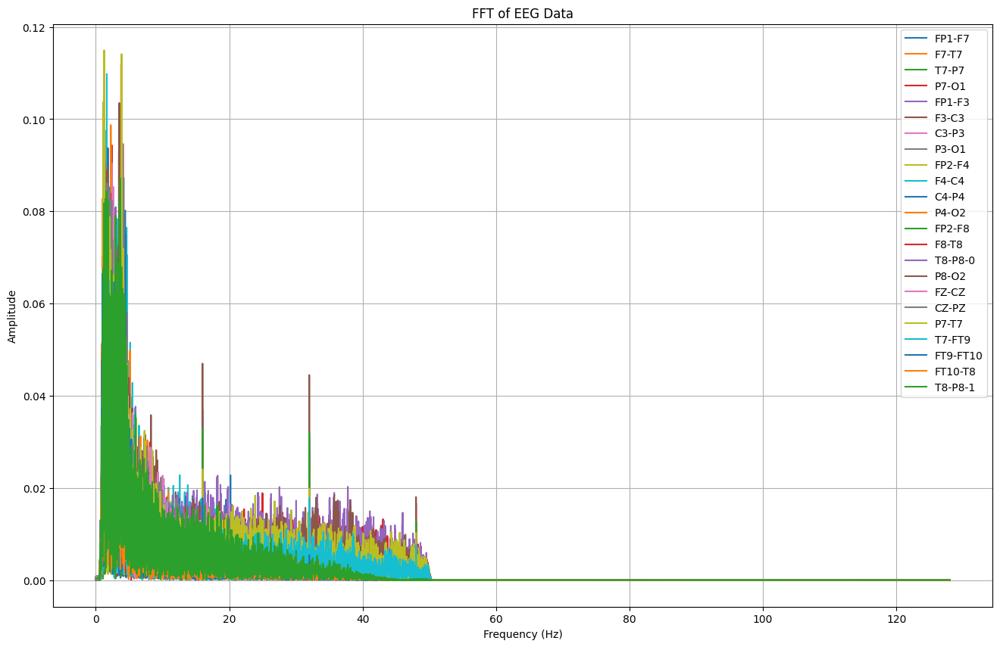

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000186  0.000601  0.000406  0.000321  0.000400  0.000789  0.000728   
1      0.000178  0.000592  0.000414  0.000327  0.000410  0.000793  0.000718   
2      0.000180  0.000597  0.000413  0.000337  0.000399  0.000803  0.000722   
3      0.000181  0.000591  0.000411  0.000329  0.000408  0.000794  0.000719   
4      0.000177  0.000596  0.000420  0.000329  0.000412  0.000804  0.000733   
...         ...       ...       ...       ...       ...       ...       ...   
19067  0.000002  0.000007  0.000020  0.000014  0.000005  0.000010  0.000003   
19068  0.000002  0.000007  0.000020  0.000014  0.000005  0.000010  0.000003   
19069  0.000002  0.000007  0.000020  0.000014  0.000005  0.000010  0.000003   
19070  0.000002  0.000007  0.000020  0.000014  0.000005  0.000010  0.000003   
19071  0.000002  0.000007  0.000020  0.000014  0.000005  0.000010  0.000003   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA66_2 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb12_42_2.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA66_2.columns:
        signal = TA66_2[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_66_2 = pd.DataFrame(fft_features).T
TA_66_2.columns = channels
TA_66_2['seizure'] = TA66_2['seizure']
TA_66_2['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_66_2.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA66_2[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_66_2.to_csv("/content/drive/MyDrive/TA/FFT/chb12_42_2.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_66_2}")


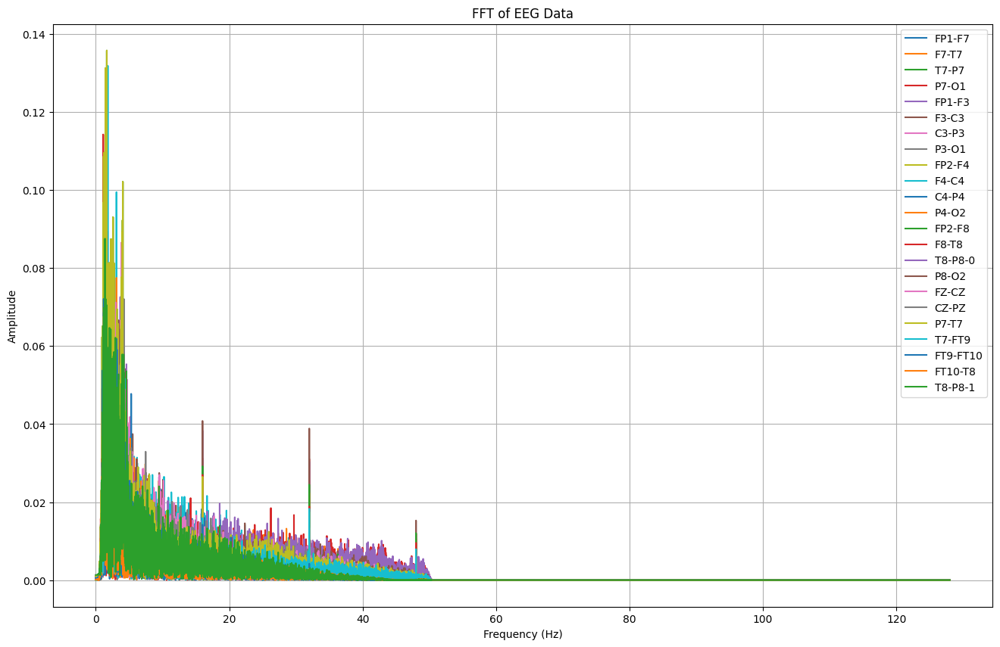

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000026  0.000110  0.001045  0.000317  0.000150  0.000239  0.000641   
1      0.000034  0.000115  0.001034  0.000311  0.000152  0.000227  0.000637   
2      0.000036  0.000119  0.001036  0.000304  0.000158  0.000228  0.000634   
3      0.000034  0.000120  0.001023  0.000327  0.000147  0.000224  0.000630   
4      0.000032  0.000115  0.001043  0.000316  0.000150  0.000232  0.000633   
...         ...       ...       ...       ...       ...       ...       ...   
18555  0.000002  0.000002  0.000003  0.000007  0.000011  0.000009  0.000015   
18556  0.000002  0.000002  0.000003  0.000007  0.000011  0.000009  0.000015   
18557  0.000002  0.000002  0.000003  0.000007  0.000011  0.000009  0.000015   
18558  0.000002  0.000002  0.000003  0.000007  0.000011  0.000009  0.000015   
18559  0.000002  0.000002  0.000003  0.000007  0.000011  0.000009  0.000015   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA66_3 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb12_42_3.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA66_3.columns:
        signal = TA66_3[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_66_3 = pd.DataFrame(fft_features).T
TA_66_3.columns = channels
TA_66_3['seizure'] = TA66_3['seizure']
TA_66_3['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_66_3.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA66_3[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_66_3.to_csv("/content/drive/MyDrive/TA/FFT/chb12_42_3.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_66_3}")


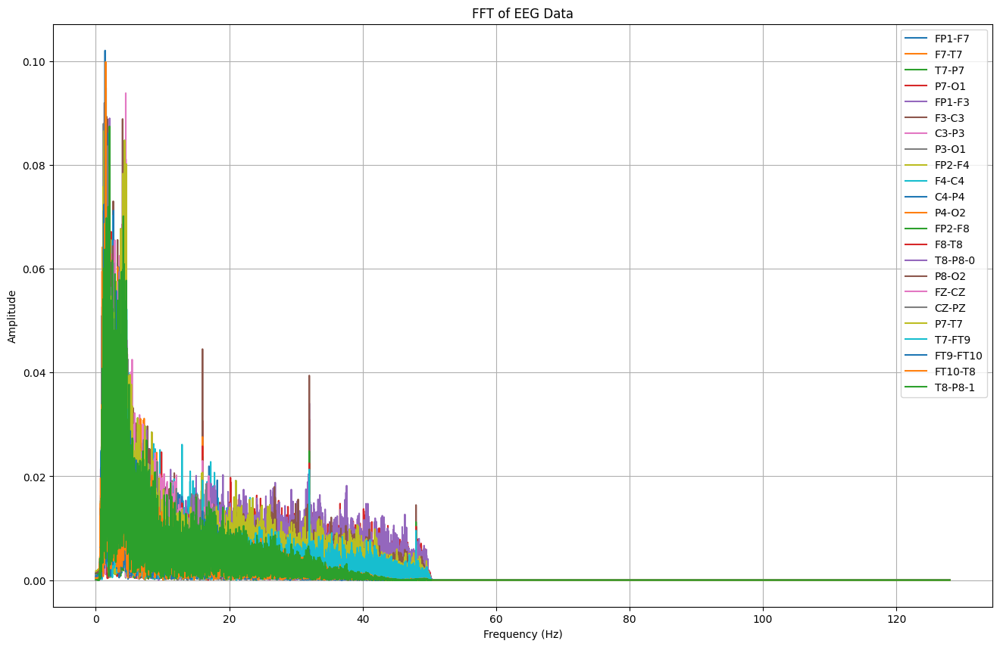

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3  \
0      0.001166  0.000857  0.000204  0.000122  0.001067  0.000266   
1      0.001159  0.000866  0.000198  0.000130  0.001062  0.000274   
2      0.001160  0.000861  0.000194  0.000129  0.001065  0.000274   
3      0.001160  0.000866  0.000194  0.000120  0.001050  0.000261   
4      0.001165  0.000865  0.000194  0.000104  0.001056  0.000259   
...         ...       ...       ...       ...       ...       ...   
18299  0.000002  0.000022  0.000017  0.000010  0.000018  0.000012   
18300  0.000002  0.000022  0.000017  0.000010  0.000018  0.000012   
18301  0.000002  0.000022  0.000017  0.000010  0.000018  0.000012   
18302  0.000002  0.000022  0.000017  0.000010  0.000018  0.000012   
18303  0.000002  0.000022  0.000017  0.000010  0.000018  0.000012   

              C3-P3     P3-O1    FP2-F4     F4-C4  ...     P8-O2     FZ-CZ  \
0      2.130281e-04  0.000203  0.001750  0

In [ ]:

# Simpan data setelah filtering ke file CSV
TA66_4 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb12_42_4.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA66_4.columns:
        signal = TA66_4[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_66_4 = pd.DataFrame(fft_features).T
TA_66_4.columns = channels
TA_66_4['seizure'] = TA66_4['seizure']
TA_66_4['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_66_4.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA66_4[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_66_4.to_csv("/content/drive/MyDrive/TA/FFT/chb12_42_4.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_66_4}")


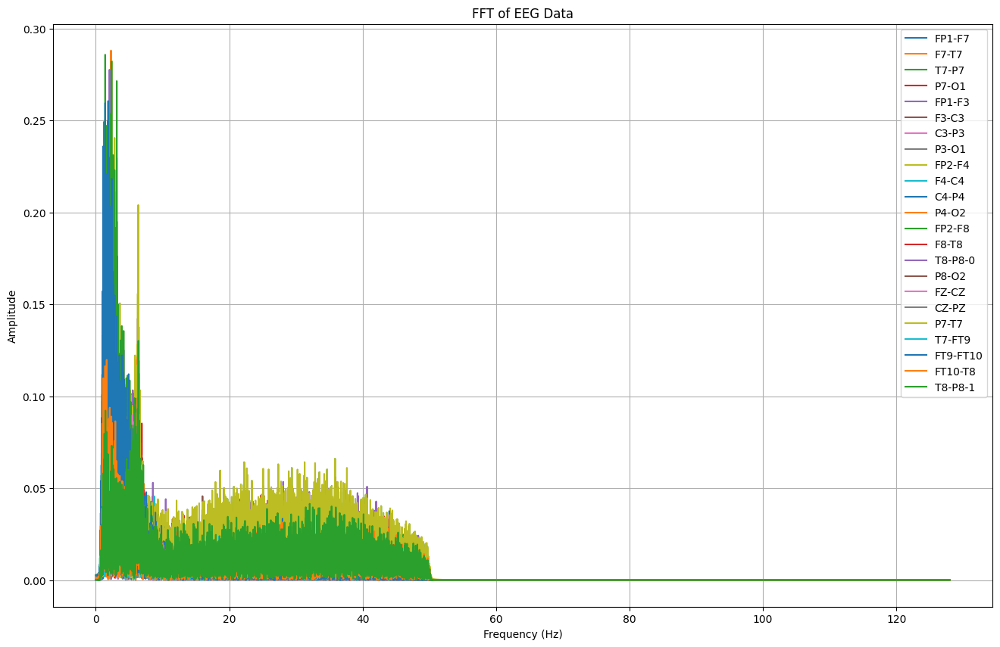

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000500  0.001888  0.001409  0.000417  0.000604  0.000398  0.000477   
1      0.000488  0.001897  0.001420  0.000415  0.000616  0.000402  0.000484   
2      0.000483  0.001895  0.001416  0.000412  0.000618  0.000404  0.000484   
3      0.000483  0.001889  0.001420  0.000414  0.000615  0.000404  0.000485   
4      0.000494  0.001902  0.001422  0.000412  0.000618  0.000405  0.000488   
...         ...       ...       ...       ...       ...       ...       ...   
20987  0.000017  0.000038  0.000015  0.000054  0.000008  0.000002  0.000020   
20988  0.000017  0.000038  0.000015  0.000054  0.000008  0.000002  0.000020   
20989  0.000017  0.000038  0.000015  0.000054  0.000008  0.000002  0.000020   
20990  0.000017  0.000038  0.000015  0.000054  0.000008  0.000002  0.000020   
20991  0.000017  0.000038  0.000015  0.000054  0.000008  0.000002  0.000020   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA67 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb13_19.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA67.columns:
        signal = TA67[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_67 = pd.DataFrame(fft_features).T
TA_67.columns = channels
TA_67['seizure'] = TA67['seizure']
TA_67['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_67.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA67[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_67.to_csv("/content/drive/MyDrive/TA/FFT/chb13_19.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_67}")


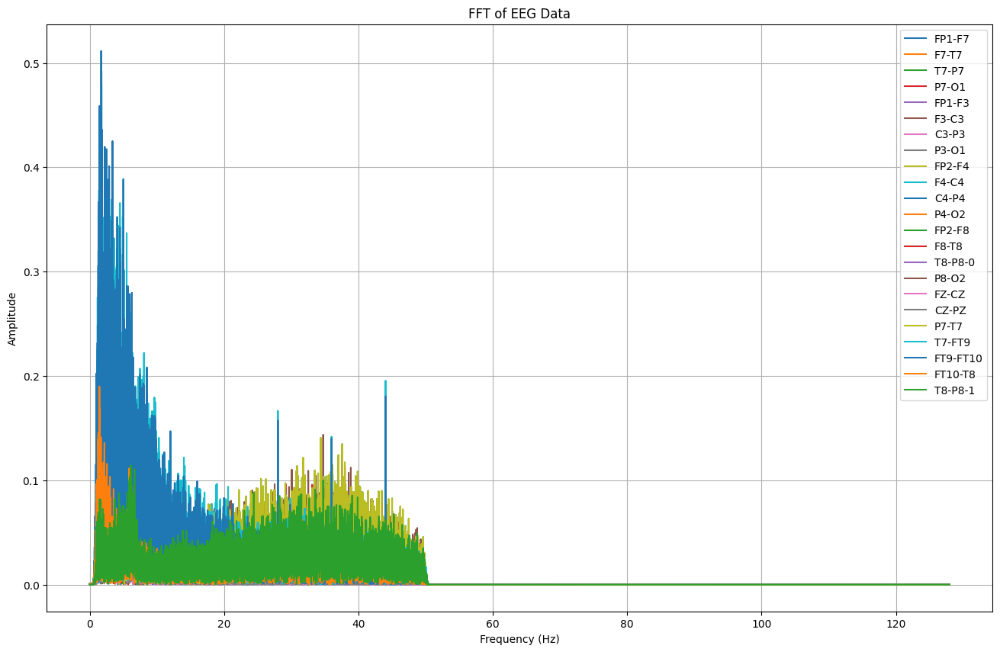

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000985  0.001018  0.000928  0.000427  0.000471  0.000052  0.000402   
1      0.001001  0.001011  0.000916  0.000430  0.000457  0.000051  0.000410   
2      0.001002  0.001010  0.000912  0.000428  0.000455  0.000049  0.000411   
3      0.001000  0.001003  0.000920  0.000434  0.000452  0.000050  0.000409   
4      0.001000  0.001018  0.000915  0.000428  0.000465  0.000058  0.000410   
...         ...       ...       ...       ...       ...       ...       ...   
24315  0.000014  0.000066  0.000018  0.000026  0.000024  0.000038  0.000017   
24316  0.000014  0.000066  0.000018  0.000026  0.000024  0.000038  0.000017   
24317  0.000014  0.000066  0.000018  0.000026  0.000024  0.000038  0.000017   
24318  0.000014  0.000066  0.000018  0.000026  0.000024  0.000038  0.000017   
24319  0.000014  0.000066  0.000018  0.000026  0.000024  0.000038  0.000017   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA68 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb13_21.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA68.columns:
        signal = TA68[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_68 = pd.DataFrame(fft_features).T
TA_68.columns = channels
TA_68['seizure'] = TA68['seizure']
TA_68['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_68.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA68[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_68.to_csv("/content/drive/MyDrive/TA/FFT/chb13_21.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_68}")


# error 69

In [ ]:

# Simpan data setelah filtering ke file CSV
TA69 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb13_40.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA69.columns:
        signal = TA69[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_69 = pd.DataFrame(fft_features).T
TA_69.columns = channels
TA_69['seizure'] = TA69['seizure']
TA_69['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_69.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA69[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_69.to_csv("/content/drive/MyDrive/TA/FFT/chb13_40.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_69}")


FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/TA/FILTERING/chb13_40.csv'

In [ ]:

# Simpan data setelah filtering ke file CSV
TA69_1 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb13_40_1.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA69_1.columns:
        signal = TA69_1[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_69_1 = pd.DataFrame(fft_features).T
TA_69_1.columns = channels
TA_69_1['seizure'] = TA69_1['seizure']
TA_69_1['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_69_1.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA69_1[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_69_1.to_csv("/content/drive/MyDrive/TA/FFT/chb13_40_1.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_69_1}")


FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/TA/FILTERING/chb13_40_1.csv'

# 70

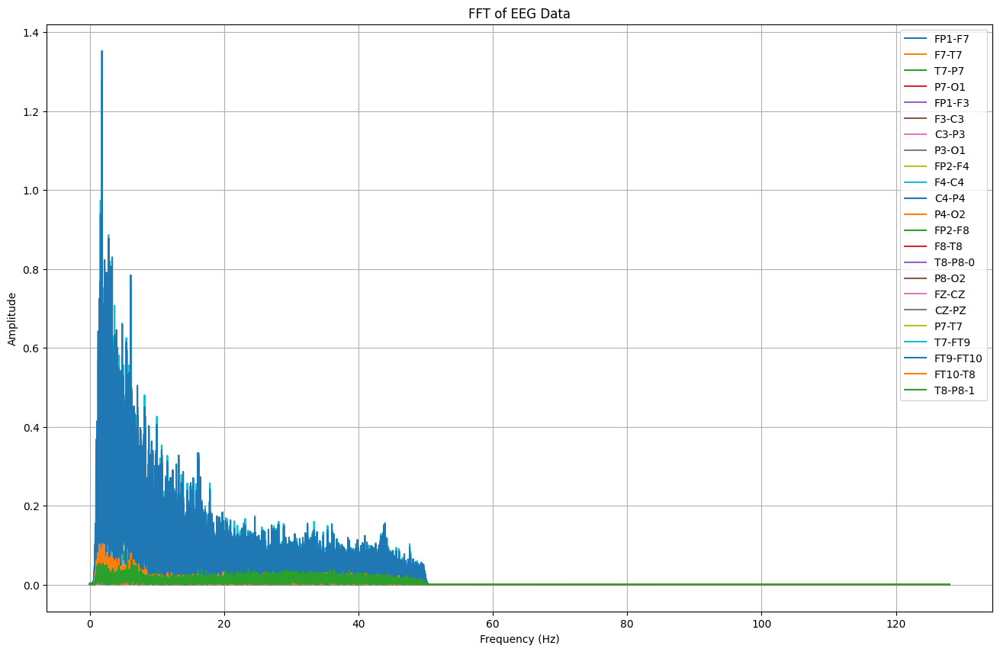

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.001226  0.001063  0.000319  0.000467  0.001733  0.001498  0.000625   
1      0.001233  0.001055  0.000309  0.000464  0.001740  0.001491  0.000624   
2      0.001227  0.001050  0.000316  0.000462  0.001732  0.001490  0.000626   
3      0.001237  0.001054  0.000312  0.000466  0.001738  0.001488  0.000615   
4      0.001221  0.001051  0.000310  0.000470  0.001730  0.001492  0.000609   
...         ...       ...       ...       ...       ...       ...       ...   
17915  0.000023  0.000018  0.000021  0.000013  0.000010  0.000006  0.000024   
17916  0.000023  0.000018  0.000021  0.000013  0.000010  0.000006  0.000024   
17917  0.000023  0.000018  0.000021  0.000013  0.000010  0.000006  0.000024   
17918  0.000023  0.000018  0.000021  0.000013  0.000010  0.000006  0.000024   
17919  0.000023  0.000018  0.000021  0.000013  0.000010  0.000006  0.000024   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA70 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb13_55.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA70.columns:
        signal = TA70[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_70 = pd.DataFrame(fft_features).T
TA_70.columns = channels
TA_70['seizure'] = TA70['seizure']
TA_70['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_70.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA70[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_70.to_csv("/content/drive/MyDrive/TA/FFT/chb13_55.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_70}")


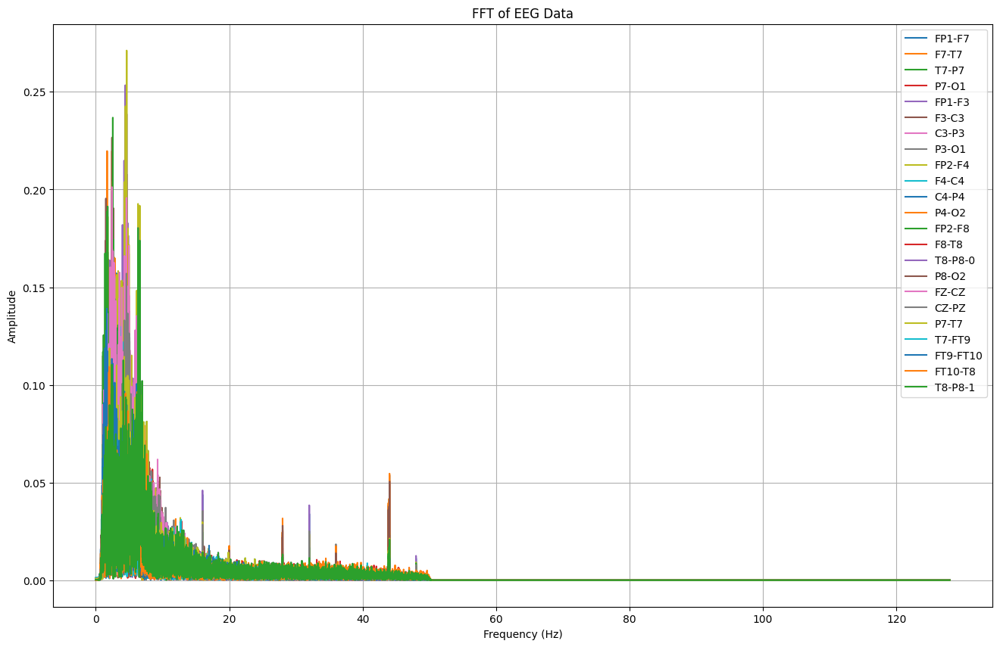

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000725  0.000110  0.000767  0.000104  0.000717  0.001055  0.000446   
1      0.000736  0.000104  0.000773  0.000096  0.000716  0.001070  0.000451   
2      0.000740  0.000108  0.000774  0.000098  0.000693  0.001048  0.000453   
3      0.000728  0.000104  0.000773  0.000097  0.000715  0.001054  0.000454   
4      0.000731  0.000109  0.000775  0.000100  0.000702  0.001047  0.000450   
...         ...       ...       ...       ...       ...       ...       ...   
17659  0.000005  0.000039  0.000018  0.000013  0.000004  0.000011  0.000007   
17660  0.000005  0.000039  0.000018  0.000013  0.000004  0.000011  0.000007   
17661  0.000005  0.000039  0.000018  0.000013  0.000004  0.000011  0.000007   
17662  0.000005  0.000039  0.000018  0.000013  0.000004  0.000011  0.000007   
17663  0.000005  0.000039  0.000018  0.000013  0.000004  0.000011  0.000007   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA70_1 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb13_55_1.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA70_1.columns:
        signal = TA70_1[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_70_1 = pd.DataFrame(fft_features).T
TA_70_1.columns = channels
TA_70_1['seizure'] = TA70_1['seizure']
TA_70_1['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_70_1.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA70_1[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_70_1.to_csv("/content/drive/MyDrive/TA/FFT/chb13_55_1.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_70_1}")


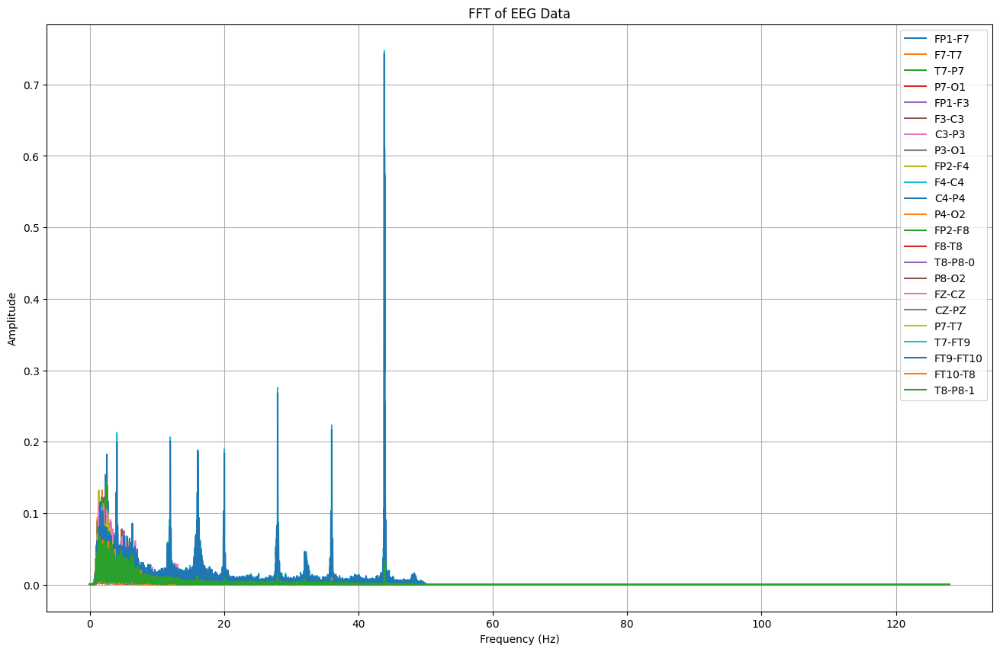

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000709  0.000992  0.000325  0.000085  0.000853  0.001029  0.000051   
1      0.000700  0.000996  0.000330  0.000092  0.000847  0.001033  0.000044   
2      0.000697  0.000995  0.000331  0.000092  0.000846  0.001034  0.000044   
3      0.000699  0.000998  0.000330  0.000092  0.000847  0.001034  0.000044   
4      0.000698  0.000995  0.000329  0.000092  0.000848  0.001036  0.000046   
...         ...       ...       ...       ...       ...       ...       ...   
17531  0.000008  0.000012  0.000017  0.000014  0.000033  0.000008  0.000002   
17532  0.000008  0.000012  0.000017  0.000014  0.000033  0.000008  0.000002   
17533  0.000008  0.000012  0.000017  0.000014  0.000033  0.000008  0.000002   
17534  0.000008  0.000012  0.000017  0.000014  0.000033  0.000008  0.000002   
17535  0.000008  0.000012  0.000017  0.000014  0.000033  0.000008  0.000002   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA71 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb13_58.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA71.columns:
        signal = TA71[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_71 = pd.DataFrame(fft_features).T
TA_71.columns = channels
TA_71['seizure'] = TA71['seizure']
TA_71['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_71.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA71[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_71.to_csv("/content/drive/MyDrive/TA/FFT/chb13_58.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_71}")


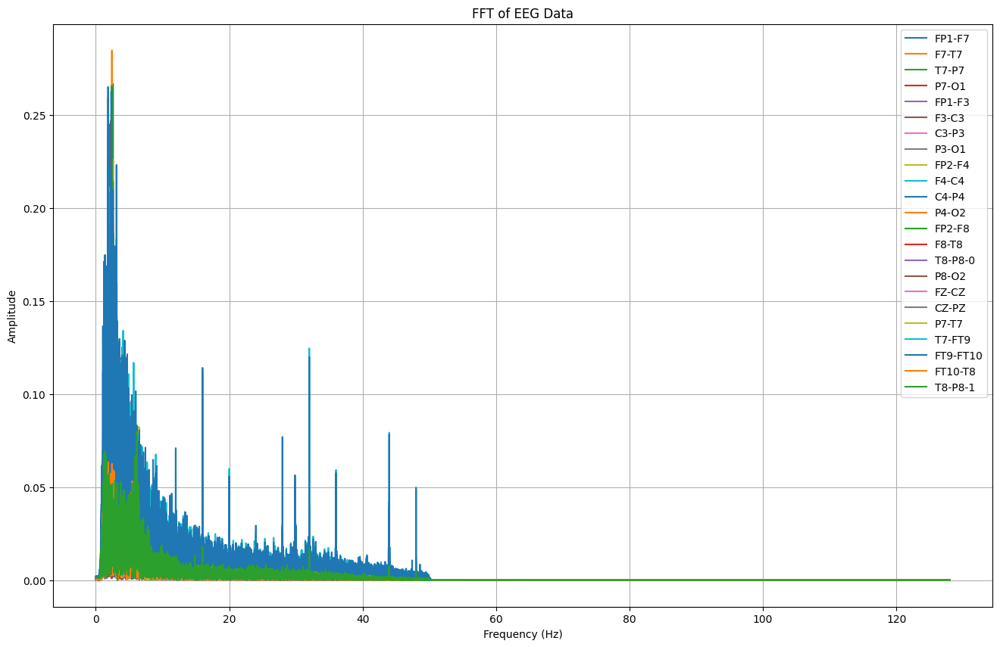

Data setelah FFT berhasil disimpan dalam file CSV:              FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3  \
0      9.943742e-04  0.000436  0.001660  0.000089  0.001083  0.000921   
1      9.783797e-04  0.000431  0.001653  0.000097  0.001094  0.000917   
2      9.809619e-04  0.000431  0.001653  0.000096  0.001093  0.000917   
3      9.800087e-04  0.000430  0.001653  0.000098  0.001095  0.000918   
4      9.774776e-04  0.000434  0.001652  0.000096  0.001093  0.000917   
...             ...       ...       ...       ...       ...       ...   
23291  1.810400e-08  0.000034  0.000020  0.000002  0.000049  0.000073   
23292  1.811875e-08  0.000034  0.000020  0.000002  0.000049  0.000073   
23293  1.811568e-08  0.000034  0.000020  0.000002  0.000049  0.000073   
23294  1.811729e-08  0.000034  0.000020  0.000002  0.000049  0.000073   
23295  1.811408e-08  0.000034  0.000020  0.000002  0.000049  0.000073   

          C3-P3     P3-O1    FP2-F4     F4-C4  ...         P8-O2     FZ-

In [ ]:

# Simpan data setelah filtering ke file CSV
TA72 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb13_59.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA72.columns:
        signal = TA72[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_72 = pd.DataFrame(fft_features).T
TA_72.columns = channels
TA_72['seizure'] = TA72['seizure']
TA_72['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_72.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA72[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_72.to_csv("/content/drive/MyDrive/TA/FFT/chb13_59.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_72}")


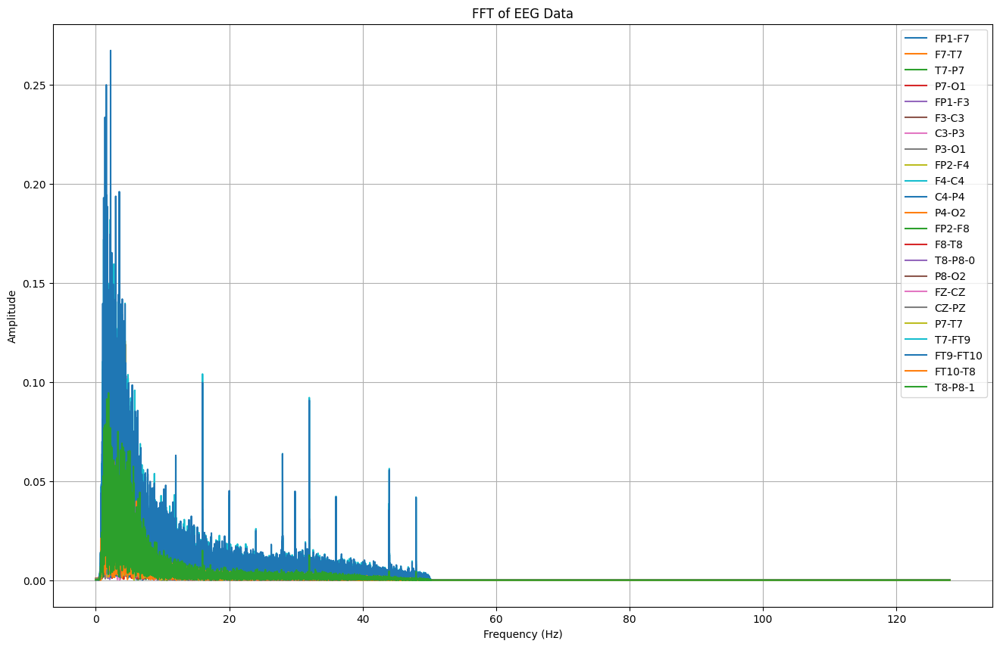

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000153  0.000791  0.000239  0.000268  0.000750  0.000959  0.000251   
1      0.000144  0.000784  0.000246  0.000273  0.000758  0.000953  0.000255   
2      0.000144  0.000785  0.000246  0.000272  0.000759  0.000953  0.000257   
3      0.000152  0.000782  0.000248  0.000272  0.000758  0.000956  0.000257   
4      0.000152  0.000782  0.000246  0.000272  0.000759  0.000955  0.000258   
...         ...       ...       ...       ...       ...       ...       ...   
18171  0.000040  0.000076  0.000009  0.000011  0.000018  0.000039  0.000017   
18172  0.000040  0.000076  0.000009  0.000011  0.000018  0.000039  0.000017   
18173  0.000040  0.000076  0.000009  0.000011  0.000018  0.000039  0.000017   
18174  0.000040  0.000076  0.000009  0.000011  0.000018  0.000039  0.000017   
18175  0.000040  0.000076  0.000009  0.000011  0.000018  0.000039  0.000017   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA73 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb13_60.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA73.columns:
        signal = TA73[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_73 = pd.DataFrame(fft_features).T
TA_73.columns = channels
TA_73['seizure'] = TA73['seizure']
TA_73['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_73.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA73[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_73.to_csv("/content/drive/MyDrive/TA/FFT/chb13_60.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_73}")


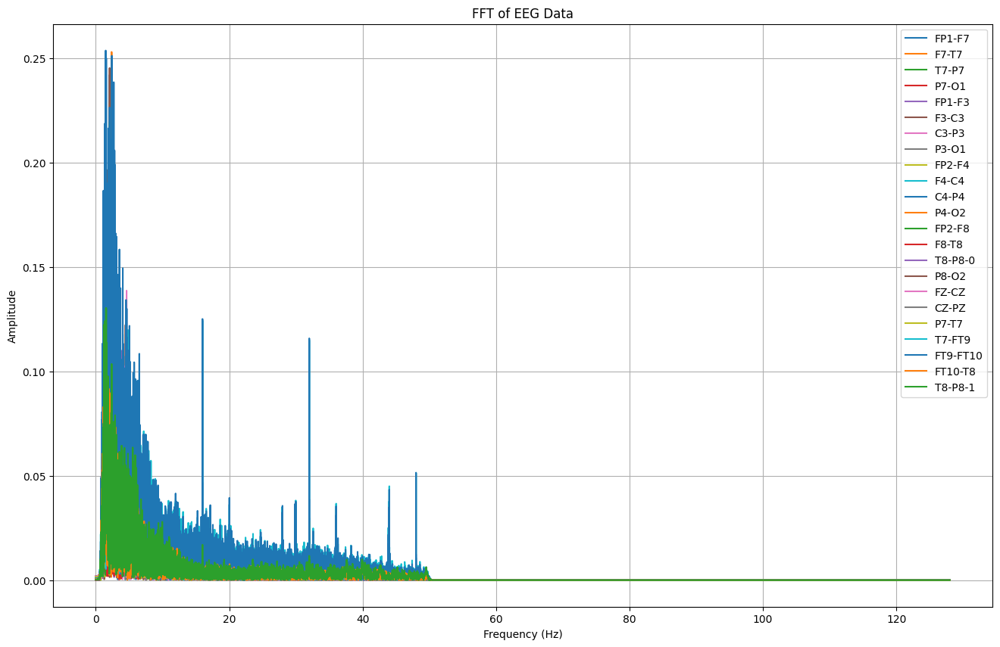

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000204  0.000330  0.001583  0.000099  0.001439  0.002001  0.000752   
1      0.000186  0.000334  0.001579  0.000109  0.001450  0.001997  0.000744   
2      0.000188  0.000337  0.001577  0.000109  0.001452  0.001997  0.000744   
3      0.000186  0.000337  0.001579  0.000111  0.001453  0.001996  0.000745   
4      0.000185  0.000339  0.001580  0.000110  0.001451  0.001994  0.000746   
...         ...       ...       ...       ...       ...       ...       ...   
23675  0.000009  0.000086  0.000027  0.000016  0.000006  0.000062  0.000020   
23676  0.000009  0.000086  0.000027  0.000016  0.000006  0.000062  0.000020   
23677  0.000009  0.000086  0.000027  0.000016  0.000006  0.000062  0.000020   
23678  0.000009  0.000086  0.000027  0.000016  0.000006  0.000062  0.000020   
23679  0.000009  0.000086  0.000027  0.000016  0.000006  0.000062  0.000020   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA74 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb13_62.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA74.columns:
        signal = TA74[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_74 = pd.DataFrame(fft_features).T
TA_74.columns = channels
TA_74['seizure'] = TA74['seizure']
TA_74['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_74.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA74[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_74.to_csv("/content/drive/MyDrive/TA/FFT/chb13_62.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_74}")


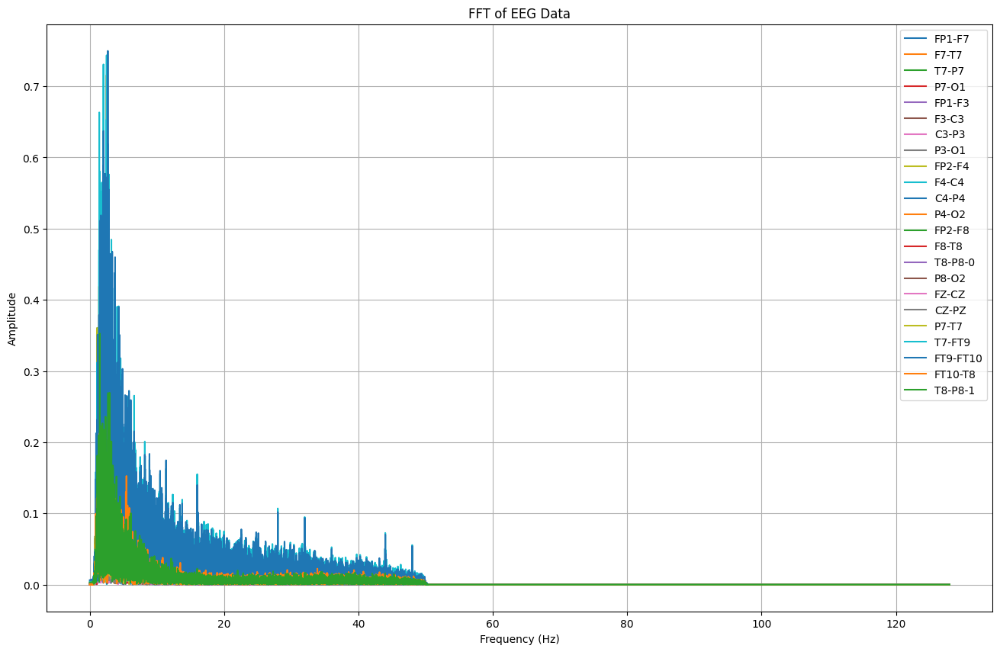

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.001644  0.001277  0.000949  0.000099  0.002398  0.000641  0.000044   
1      0.001635  0.001265  0.000959  0.000110  0.002383  0.000632  0.000035   
2      0.001634  0.001264  0.000959  0.000103  0.002387  0.000634  0.000035   
3      0.001628  0.001278  0.000964  0.000103  0.002385  0.000635  0.000036   
4      0.001624  0.001284  0.000966  0.000110  0.002392  0.000635  0.000043   
...         ...       ...       ...       ...       ...       ...       ...   
23675  0.000007  0.000024  0.000046  0.000047  0.000010  0.000007  0.000025   
23676  0.000007  0.000024  0.000046  0.000047  0.000010  0.000007  0.000025   
23677  0.000007  0.000024  0.000046  0.000047  0.000010  0.000007  0.000025   
23678  0.000007  0.000024  0.000046  0.000047  0.000010  0.000007  0.000025   
23679  0.000007  0.000024  0.000046  0.000047  0.000010  0.000007  0.000025   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA74_1 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb13_62_1.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA74_1.columns:
        signal = TA74_1[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_74_1 = pd.DataFrame(fft_features).T
TA_74_1.columns = channels
TA_74_1['seizure'] = TA74_1['seizure']
TA_74_1['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_74_1.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA74_1[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_74_1.to_csv("/content/drive/MyDrive/TA/FFT/chb13_62_1.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_74_1}")


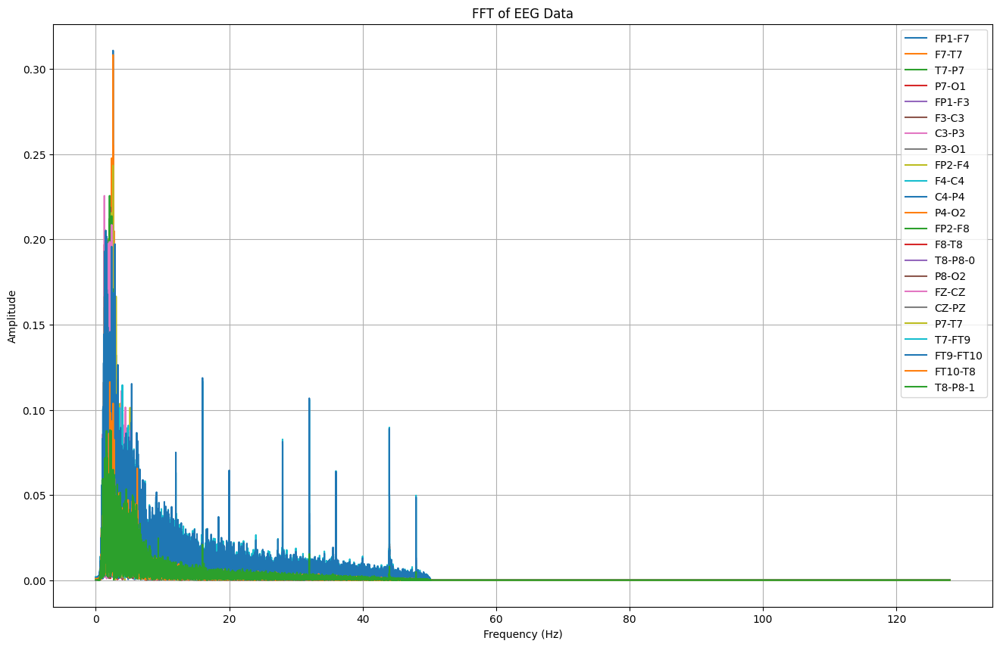

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.001821  0.000811  0.000727  0.000402  0.001106  0.000471  0.000122   
1      0.001808  0.000815  0.000733  0.000410  0.001113  0.000467  0.000114   
2      0.001806  0.000815  0.000732  0.000409  0.001114  0.000469  0.000115   
3      0.001810  0.000817  0.000733  0.000410  0.001112  0.000470  0.000114   
4      0.001815  0.000820  0.000735  0.000410  0.001111  0.000469  0.000113   
...         ...       ...       ...       ...       ...       ...       ...   
22651  0.000004  0.000045  0.000027  0.000006  0.000012  0.000052  0.000016   
22652  0.000004  0.000045  0.000027  0.000006  0.000012  0.000052  0.000016   
22653  0.000004  0.000045  0.000027  0.000006  0.000012  0.000052  0.000016   
22654  0.000004  0.000045  0.000027  0.000006  0.000012  0.000052  0.000016   
22655  0.000004  0.000045  0.000027  0.000006  0.000012  0.000052  0.000016   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA74_2 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb13_62_2.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA74_2.columns:
        signal = TA74_2[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_74_2 = pd.DataFrame(fft_features).T
TA_74_2.columns = channels
TA_74_2['seizure'] = TA74_2['seizure']
TA_74_2['frekuensi'] = np.linspace(0, sampling_rate / 2, len(fft_features[0]))

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_74_2.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA74_2[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_74_2.to_csv("/content/drive/MyDrive/TA/FFT/chb13_62_2.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_74_2}")


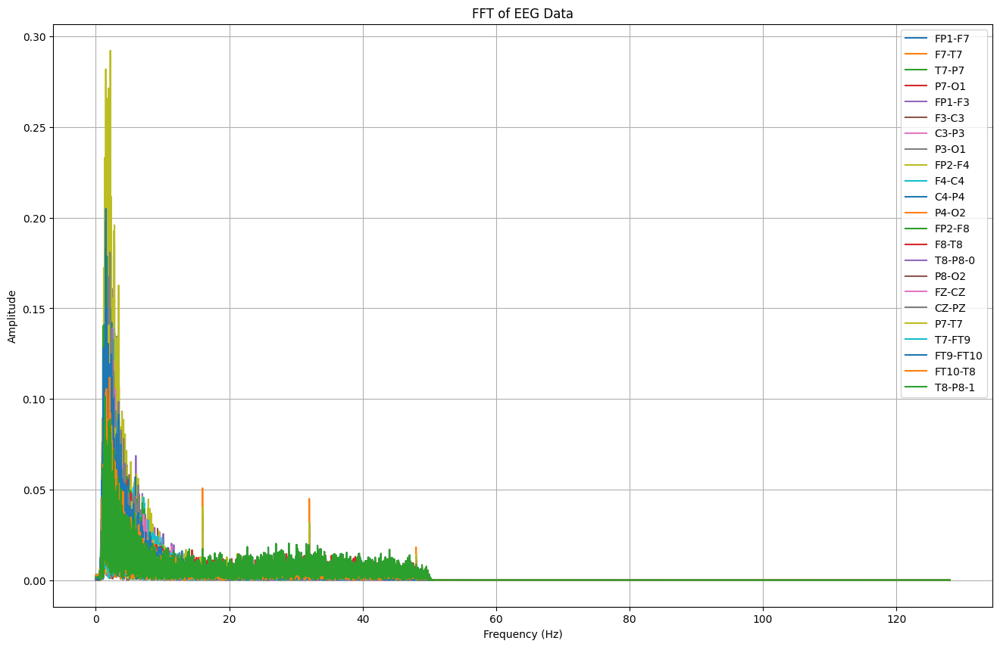

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000681  0.000253  0.002128  0.002443  0.003071  0.001211  0.001267   
1      0.000690  0.000245  0.002121  0.002437  0.003061  0.001218  0.001262   
2      0.000689  0.000248  0.002117  0.002439  0.003063  0.001214  0.001263   
3      0.000688  0.000240  0.002118  0.002435  0.003060  0.001220  0.001261   
4      0.000682  0.000251  0.002114  0.002449  0.003067  0.001207  0.001271   
...         ...       ...       ...       ...       ...       ...       ...   
17147  0.000002  0.000011  0.000012  0.000009  0.000123  0.000002  0.000042   
17148  0.000002  0.000011  0.000012  0.000009  0.000123  0.000002  0.000042   
17149  0.000002  0.000011  0.000012  0.000009  0.000123  0.000002  0.000042   
17150  0.000002  0.000011  0.000012  0.000009  0.000123  0.000002  0.000042   
17151  0.000002  0.000011  0.000012  0.000009  0.000123  0.000002  0.000042   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA75 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb14_03.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA75.columns:
        signal = TA75[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_75 = pd.DataFrame(fft_features).T
TA_75.columns = channels
TA_75['seizure'] = TA75['seizure']
TA_75['frekuensi'] = np.linspace(0, sampling_rate / 2, len(fft_features[0]))


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_75.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA75[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_75.to_csv("/content/drive/MyDrive/TA/FFT/chb14_03.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_75}")


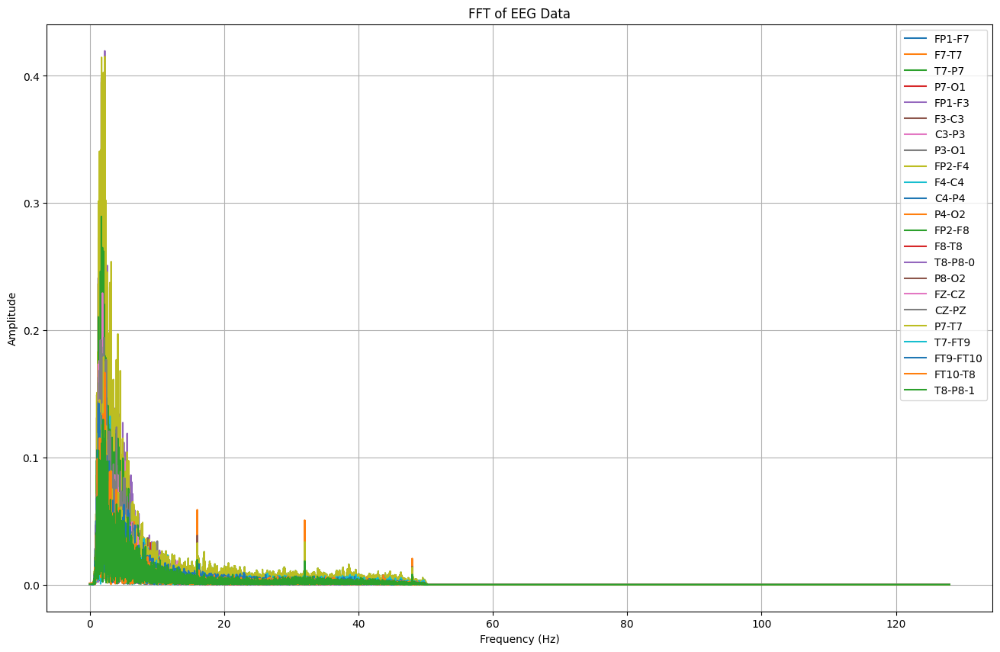

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7         T7-P7     P7-O1    FP1-F3     F3-C3  \
0      0.000453  0.000699  5.785624e-05  0.000054  0.000751  0.000352   
1      0.000444  0.000706  5.312516e-05  0.000062  0.000761  0.000346   
2      0.000449  0.000704  5.094356e-05  0.000064  0.000758  0.000347   
3      0.000438  0.000710  5.019735e-05  0.000064  0.000773  0.000342   
4      0.000452  0.000698  5.328065e-05  0.000058  0.000750  0.000353   
...         ...       ...           ...       ...       ...       ...   
17915  0.000012  0.000007  8.320654e-07  0.000010  0.000021  0.000017   
17916  0.000012  0.000007  8.321405e-07  0.000010  0.000021  0.000017   
17917  0.000012  0.000007  8.322132e-07  0.000010  0.000021  0.000017   
17918  0.000012  0.000007  8.321567e-07  0.000010  0.000021  0.000017   
17919  0.000012  0.000007  8.321533e-07  0.000010  0.000021  0.000017   

          C3-P3     P3-O1    FP2-F4     F4-C4  ...         P8-O2     FZ-

In [ ]:

# Simpan data setelah filtering ke file CSV
TA76 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb14_04.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA76.columns:
        signal = TA76[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_76 = pd.DataFrame(fft_features).T
TA_76.columns = channels
TA_76['seizure'] = TA76['seizure']
TA_76['frekuensi'] = np.linspace(0, sampling_rate / 2, len(fft_features[0]))


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_76.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA76[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_76.to_csv("/content/drive/MyDrive/TA/FFT/chb14_04.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_76}")


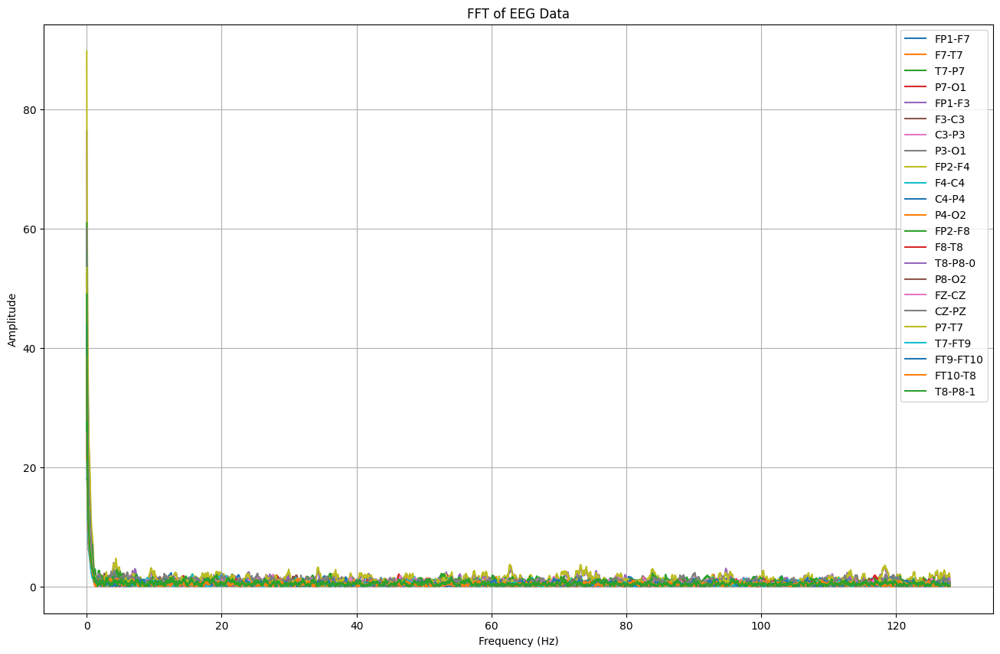

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.001010  0.000518  0.001662  0.001473  0.002550  0.000514  0.001959   
1      0.001000  0.000526  0.001668  0.001483  0.002539  0.000518  0.001964   
2      0.001006  0.000530  0.001672  0.001474  0.002543  0.000522  0.001961   
3      0.001009  0.000531  0.001672  0.001483  0.002541  0.000520  0.001967   
4      0.001005  0.000527  0.001664  0.001486  0.002540  0.000519  0.001960   
...         ...       ...       ...       ...       ...       ...       ...   
18171  0.000015  0.000056  0.000021  0.000005  0.000052  0.000028  0.000007   
18172  0.000015  0.000056  0.000021  0.000005  0.000052  0.000028  0.000007   
18173  0.000015  0.000056  0.000021  0.000005  0.000052  0.000028  0.000007   
18174  0.000015  0.000056  0.000021  0.000005  0.000052  0.000028  0.000007   
18175  0.000015  0.000056  0.000021  0.000005  0.000052  0.000028  0.000007   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA76_1 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb14_04_1.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA76_1.columns:
        signal = TA76_1[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA76__1 = pd.DataFrame(fft_features).T
TA76__1.columns = channels
TA76__1['seizure'] = TA76_1['seizure']
TA76__1['frekuensi'] = np.linspace(0, sampling_rate / 2, len(fft_features[0]))

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA76__1.columns:
        fft_freqs, fft_vals = compute_fft(TA76__1[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA76__1.to_csv("/content/drive/MyDrive/TA/FFT/chb14_04_1.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA76__1}")


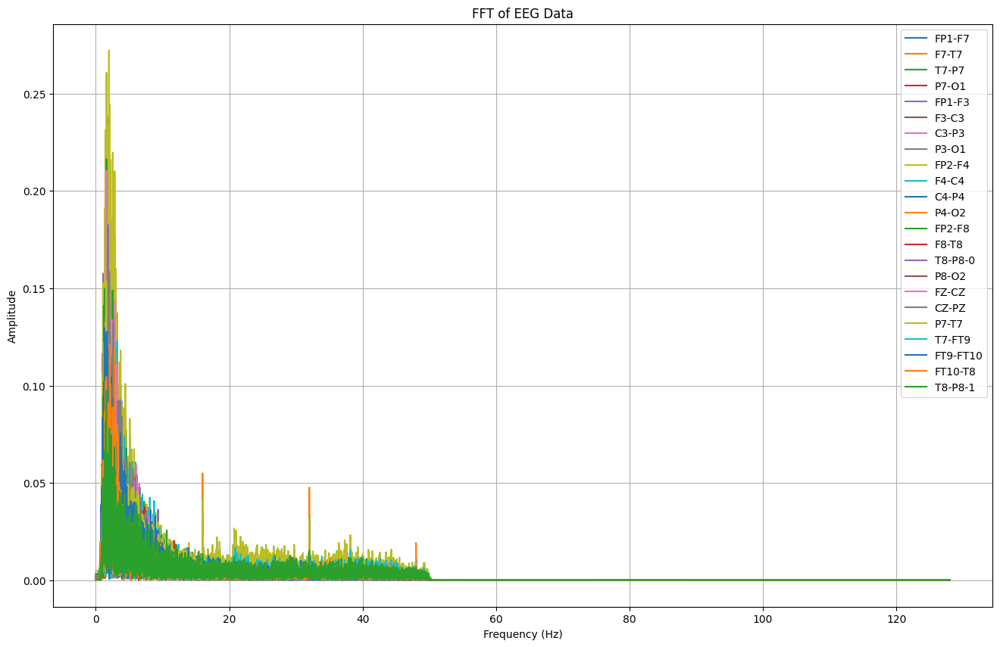

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.001076  0.001666  0.000135  0.000332  0.003358  0.000150  0.001213   
1      0.001066  0.001658  0.000142  0.000339  0.003351  0.000157  0.001220   
2      0.001071  0.001658  0.000142  0.000341  0.003353  0.000159  0.001219   
3      0.001066  0.001658  0.000138  0.000341  0.003344  0.000155  0.001217   
4      0.001083  0.001655  0.000148  0.000343  0.003360  0.000163  0.001223   
...         ...       ...       ...       ...       ...       ...       ...   
17147  0.000055  0.000021  0.000022  0.000004  0.000074  0.000053  0.000022   
17148  0.000055  0.000021  0.000022  0.000004  0.000074  0.000053  0.000022   
17149  0.000055  0.000021  0.000022  0.000004  0.000074  0.000053  0.000022   
17150  0.000055  0.000021  0.000022  0.000004  0.000074  0.000053  0.000022   
17151  0.000055  0.000021  0.000022  0.000004  0.000074  0.000053  0.000022   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA77 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb14_06.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA77.columns:
        signal = TA77[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_77 = pd.DataFrame(fft_features).T
TA_77.columns = channels
TA_77['seizure'] = TA77['seizure']
TA_77['frekuensi'] = np.linspace(0, sampling_rate / 2, len(fft_features[0]))


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_77.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA77[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_77.to_csv("/content/drive/MyDrive/TA/FFT/chb14_06.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_77}")


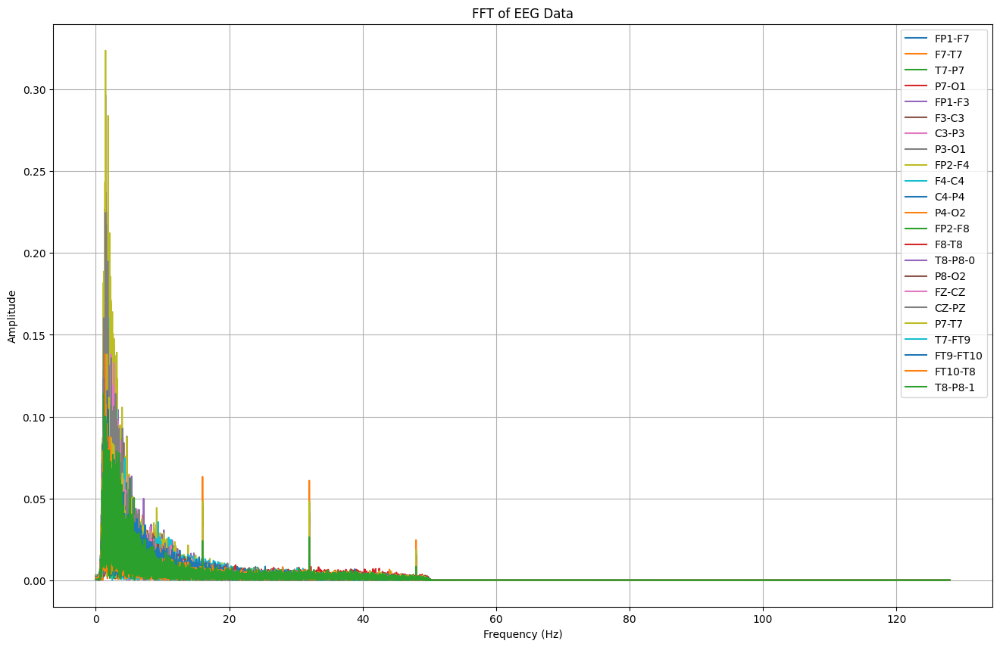

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7         T7-P7     P7-O1    FP1-F3     F3-C3  \
0      0.002048  0.001575  9.399493e-04  0.002841  0.002010  0.001223   
1      0.002054  0.001583  9.322655e-04  0.002833  0.002016  0.001233   
2      0.002059  0.001582  9.333298e-04  0.002835  0.002020  0.001231   
3      0.002057  0.001587  9.303311e-04  0.002831  0.002015  0.001235   
4      0.002064  0.001577  9.326461e-04  0.002837  0.002028  0.001232   
...         ...       ...           ...       ...       ...       ...   
20603  0.000005  0.000009  1.069972e-07  0.000002  0.000028  0.000005   
20604  0.000005  0.000009  1.070041e-07  0.000002  0.000028  0.000005   
20605  0.000005  0.000009  1.070027e-07  0.000002  0.000028  0.000005   
20606  0.000005  0.000009  1.070087e-07  0.000002  0.000028  0.000005   
20607  0.000005  0.000009  1.070071e-07  0.000002  0.000028  0.000005   

          C3-P3     P3-O1    FP2-F4     F4-C4  ...     P8-O2     FZ-CZ  

In [ ]:

# Simpan data setelah filtering ke file CSV
TA78 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb14_11.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA78.columns:
        signal = TA78[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_78 = pd.DataFrame(fft_features).T
TA_78.columns = channels
TA_78['seizure'] = TA78['seizure']
TA_78['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_78.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA78[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_78.to_csv("/content/drive/MyDrive/TA/FFT/chb14_11.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_78}")


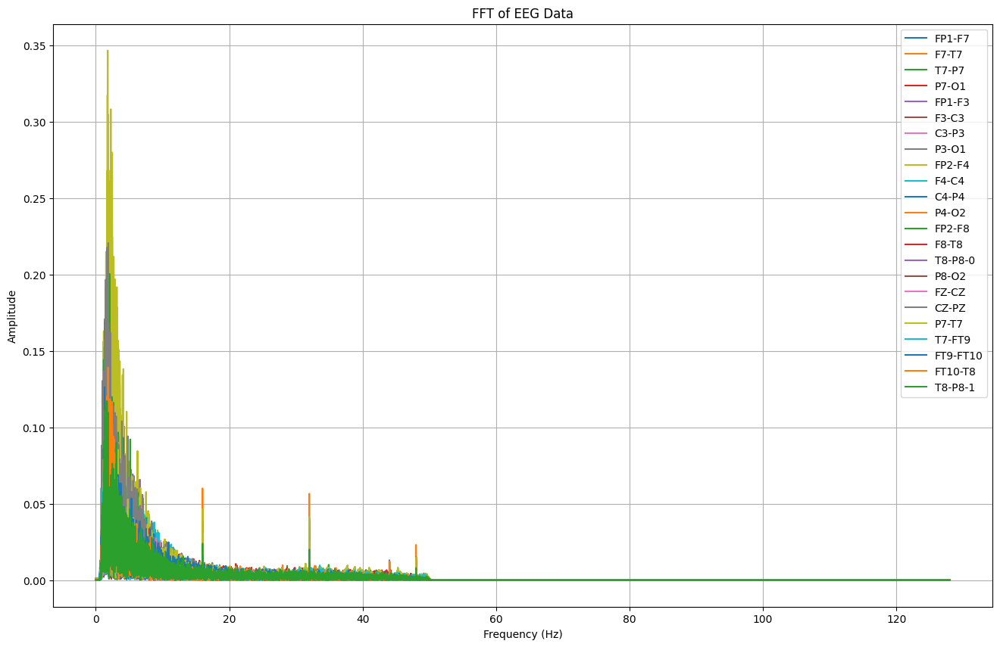

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000846  0.000134  0.000435  0.000475  0.000212  0.000118  0.000692   
1      0.000854  0.000143  0.000439  0.000488  0.000203  0.000124  0.000697   
2      0.000850  0.000135  0.000450  0.000482  0.000210  0.000124  0.000698   
3      0.000861  0.000150  0.000439  0.000485  0.000199  0.000123  0.000701   
4      0.000851  0.000130  0.000440  0.000483  0.000219  0.000127  0.000690   
...         ...       ...       ...       ...       ...       ...       ...   
17915  0.000015  0.000004  0.000011  0.000008  0.000022  0.000005  0.000002   
17916  0.000015  0.000004  0.000011  0.000008  0.000022  0.000005  0.000002   
17917  0.000015  0.000004  0.000011  0.000008  0.000022  0.000005  0.000002   
17918  0.000015  0.000004  0.000011  0.000008  0.000022  0.000005  0.000002   
17919  0.000015  0.000004  0.000011  0.000008  0.000022  0.000005  0.000002   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA79 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb14_17.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA79.columns:
        signal = TA79[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_79 = pd.DataFrame(fft_features).T
TA_79.columns = channels
TA_79['seizure'] = TA79['seizure']
TA_79['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_79.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA79[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_79.to_csv("/content/drive/MyDrive/TA/FFT/chb14_17.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_79}")


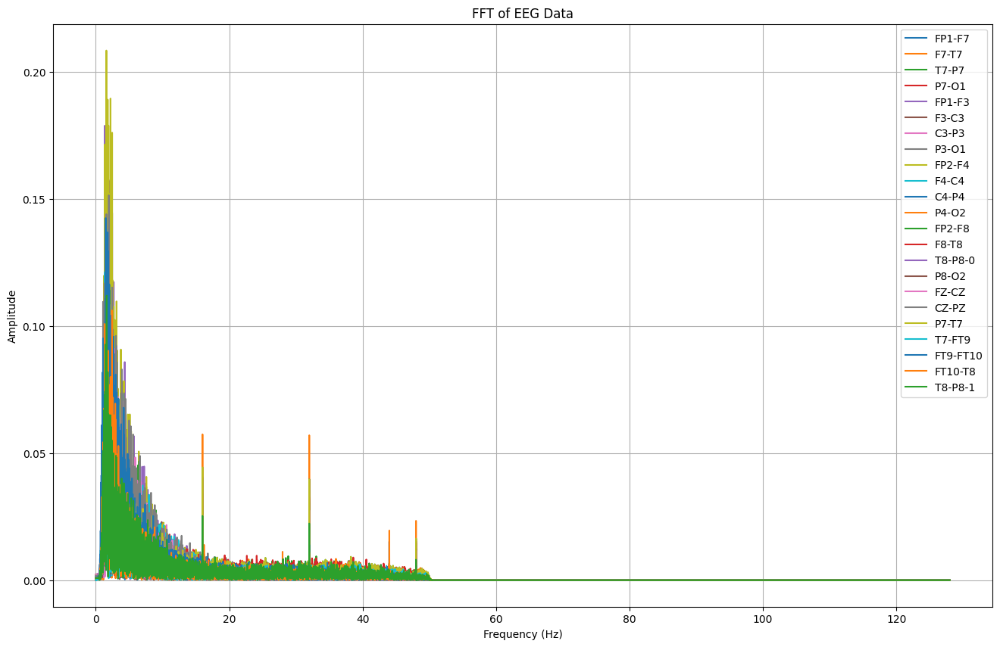

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000742  0.000736  0.000186  0.000011  0.002336  0.001649  0.001316   
1      0.000732  0.000728  0.000195  0.000019  0.002345  0.001642  0.001308   
2      0.000738  0.000730  0.000196  0.000022  0.002340  0.001643  0.001308   
3      0.000728  0.000727  0.000194  0.000030  0.002350  0.001641  0.001305   
4      0.000743  0.000733  0.000195  0.000029  0.002336  0.001646  0.001311   
...         ...       ...       ...       ...       ...       ...       ...   
18171  0.000010  0.000043  0.000022  0.000016  0.000007  0.000007  0.000046   
18172  0.000010  0.000043  0.000022  0.000016  0.000007  0.000007  0.000046   
18173  0.000010  0.000043  0.000022  0.000016  0.000007  0.000007  0.000046   
18174  0.000010  0.000043  0.000022  0.000016  0.000007  0.000007  0.000046   
18175  0.000010  0.000043  0.000022  0.000016  0.000007  0.000007  0.000046   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA80 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb14_18.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA80.columns:
        signal = TA80[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_80 = pd.DataFrame(fft_features).T
TA_80.columns = channels
TA_80['seizure'] = TA80['seizure']
TA_80['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_80.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA80[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_80.to_csv("/content/drive/MyDrive/TA/FFT/chb14_18.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_80}")


# sampel 81-100

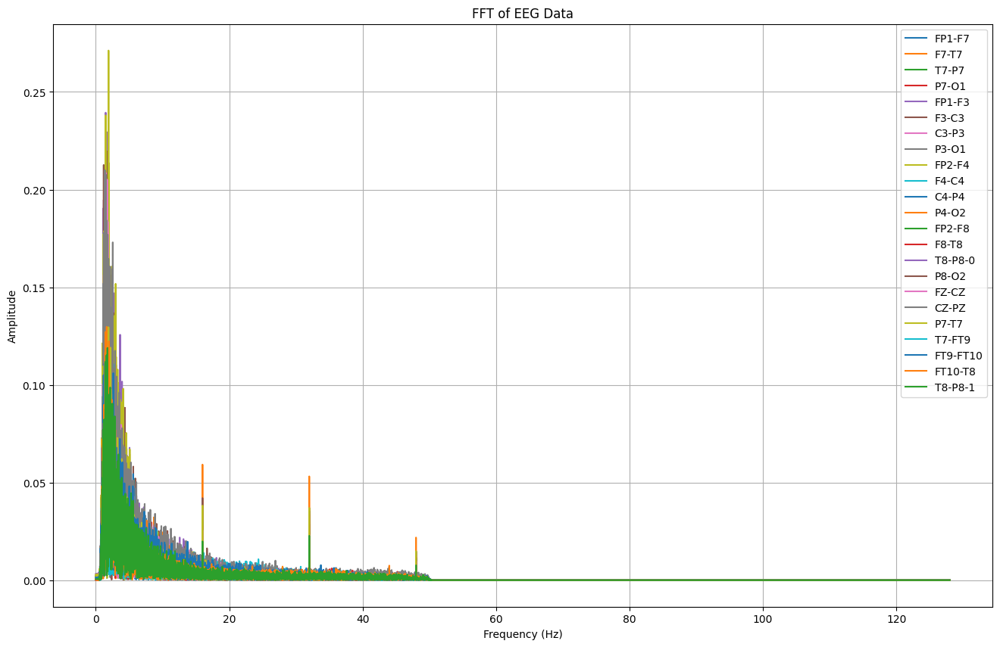

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1        FP1-F3     F3-C3  \
0      0.000686  0.001762  0.002119  0.000507  3.237895e-03  0.002413   
1      0.000694  0.001769  0.002125  0.000515  3.244202e-03  0.002419   
2      0.000694  0.001770  0.002123  0.000515  3.245672e-03  0.002416   
3      0.000699  0.001770  0.002130  0.000517  3.250267e-03  0.002424   
4      0.000688  0.001764  0.002121  0.000517  3.241128e-03  0.002413   
...         ...       ...       ...       ...           ...       ...   
17403  0.000006  0.000019  0.000022  0.000006  4.465722e-07  0.000047   
17404  0.000006  0.000019  0.000022  0.000006  4.465829e-07  0.000047   
17405  0.000006  0.000019  0.000022  0.000006  4.465797e-07  0.000047   
17406  0.000006  0.000019  0.000022  0.000006  4.465794e-07  0.000047   
17407  0.000006  0.000019  0.000022  0.000006  4.465757e-07  0.000047   

          C3-P3         P3-O1    FP2-F4     F4-C4  ...     P8-O2     FZ-

In [ ]:

# Simpan data setelah filtering ke file CSV
TA81 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb14_27.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA81.columns:
        signal = TA81[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_81 = pd.DataFrame(fft_features).T
TA_81.columns = channels
TA_81['seizure'] = TA81['seizure']
TA_81['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_81.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA81[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_81.to_csv("/content/drive/MyDrive/TA/FFT/chb14_27.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_81}")


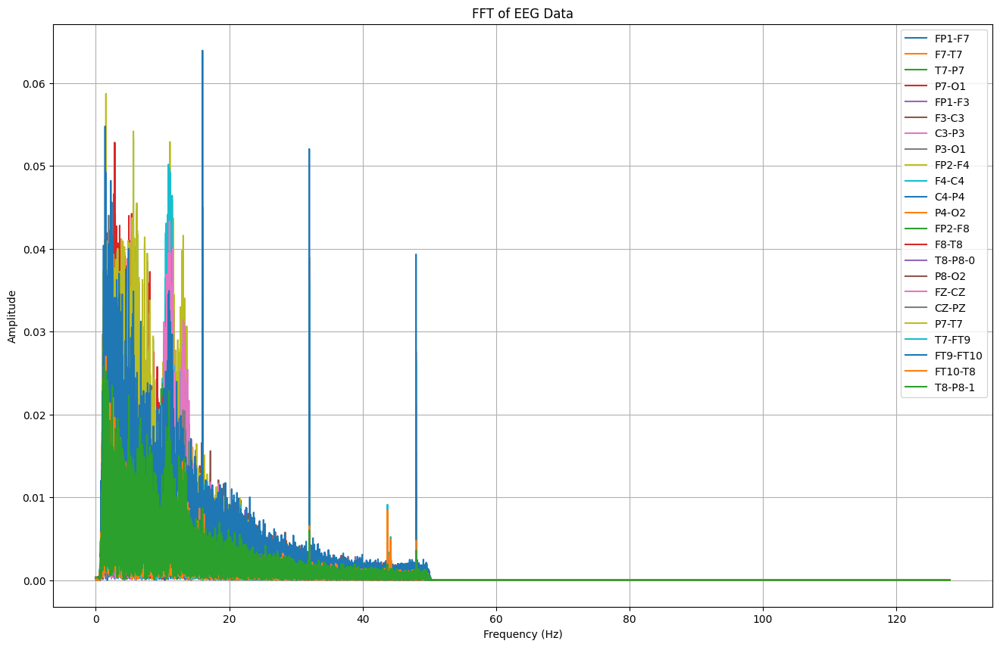

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1        FP1-F3     F3-C3  \
0      0.000170  0.000283  0.000330  0.000245  4.523127e-05  0.000192   
1      0.000199  0.000317  0.000289  0.000228  7.486900e-05  0.000223   
2      0.000198  0.000315  0.000292  0.000222  7.283176e-05  0.000223   
3      0.000196  0.000316  0.000295  0.000221  7.519081e-05  0.000223   
4      0.000199  0.000316  0.000292  0.000226  7.456270e-05  0.000224   
...         ...       ...       ...       ...           ...       ...   
31355  0.000005  0.000001  0.000002  0.000004  8.605936e-07  0.000003   
31356  0.000005  0.000001  0.000002  0.000004  8.605924e-07  0.000003   
31357  0.000005  0.000001  0.000002  0.000004  8.605944e-07  0.000003   
31358  0.000005  0.000001  0.000002  0.000004  8.605926e-07  0.000003   
31359  0.000005  0.000001  0.000002  0.000004  8.605924e-07  0.000003   

              C3-P3     P3-O1    FP2-F4     F4-C4  ...         P8-O2  \


In [ ]:

# Simpan data setelah filtering ke file CSV
TA82 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb15_06.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA82.columns:
        signal = TA82[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_82 = pd.DataFrame(fft_features).T
TA_82.columns = channels
TA_82['seizure'] = TA82['seizure']
TA_82['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_82.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA82[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_82.to_csv("/content/drive/MyDrive/TA/FFT/chb15_06.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_82}")


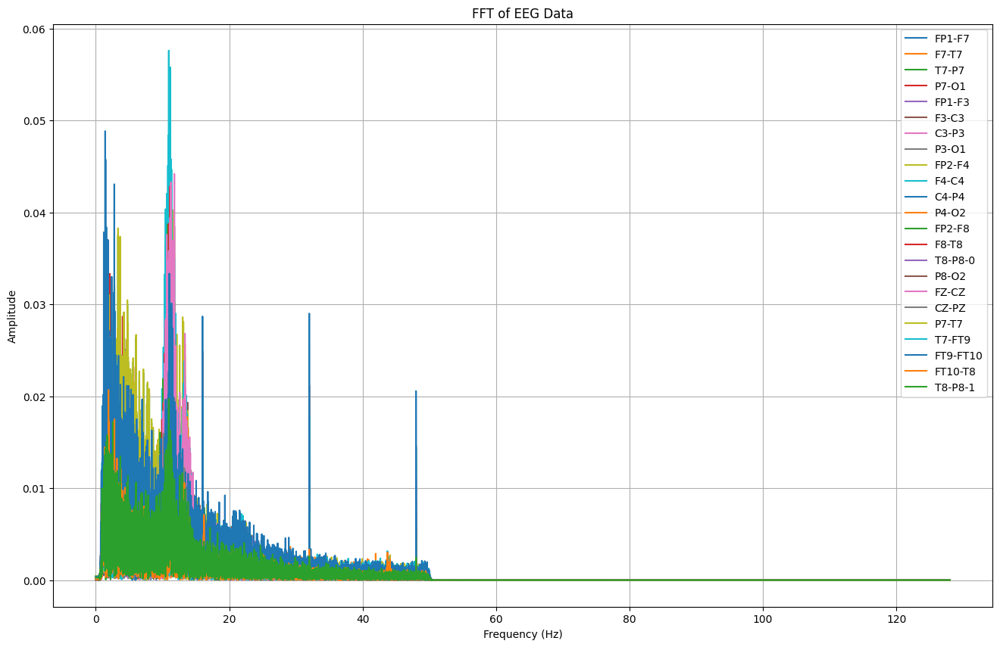

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7         T7-P7     P7-O1    FP1-F3     F3-C3  \
0      0.000033  0.000300  4.535467e-04  0.000058  0.000119  0.000330   
1      0.000051  0.000278  4.301883e-04  0.000043  0.000098  0.000311   
2      0.000052  0.000280  4.351434e-04  0.000043  0.000099  0.000312   
3      0.000050  0.000280  4.312176e-04  0.000043  0.000099  0.000311   
4      0.000052  0.000279  4.341839e-04  0.000043  0.000097  0.000311   
...         ...       ...           ...       ...       ...       ...   
19323  0.000003  0.000003  6.360984e-08  0.000006  0.000003  0.000006   
19324  0.000003  0.000003  6.359800e-08  0.000006  0.000003  0.000006   
19325  0.000003  0.000003  6.360313e-08  0.000006  0.000003  0.000006   
19326  0.000003  0.000003  6.359769e-08  0.000006  0.000003  0.000006   
19327  0.000003  0.000003  6.360422e-08  0.000006  0.000003  0.000006   

          C3-P3     P3-O1    FP2-F4     F4-C4  ...         P8-O2     FZ-

In [ ]:

# Simpan data setelah filtering ke file CSV
TA83 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb15_10.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA83.columns:
        signal = TA83[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_83 = pd.DataFrame(fft_features).T
TA_83.columns = channels
TA_83['seizure'] = TA83['seizure']
TA_83['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_83.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA83[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_83.to_csv("/content/drive/MyDrive/TA/FFT/chb15_10.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_83}")


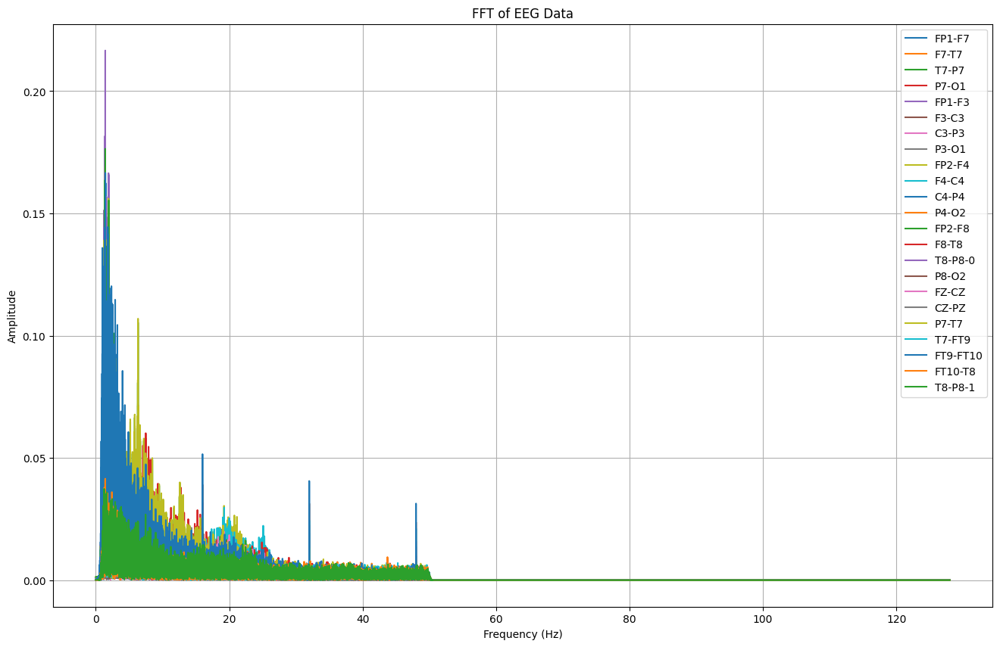

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7         F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3  \
0      0.001049  3.926269e-04  0.000256  0.000011  0.001027  0.000330   
1      0.001000  3.504415e-04  0.000200  0.000029  0.000977  0.000298   
2      0.001002  3.495283e-04  0.000204  0.000036  0.000976  0.000296   
3      0.000999  3.538344e-04  0.000209  0.000036  0.000979  0.000298   
4      0.000997  3.453098e-04  0.000207  0.000030  0.000972  0.000295   
...         ...           ...       ...       ...       ...       ...   
35451  0.000006  7.359812e-07  0.000006  0.000007  0.000008  0.000005   
35452  0.000006  7.360079e-07  0.000006  0.000007  0.000008  0.000005   
35453  0.000006  7.359955e-07  0.000006  0.000007  0.000008  0.000005   
35454  0.000006  7.359969e-07  0.000006  0.000007  0.000008  0.000005   
35455  0.000006  7.359956e-07  0.000006  0.000007  0.000008  0.000005   

          C3-P3     P3-O1    FP2-F4     F4-C4  ...         P8-O2  \
0   

In [ ]:

# Simpan data setelah filtering ke file CSV
TA84 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb15_15.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA84.columns:
        signal = TA84[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_84 = pd.DataFrame(fft_features).T
TA_84.columns = channels
TA_84['seizure'] = TA84['seizure']
TA_84['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_84.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA84[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_84.to_csv("/content/drive/MyDrive/TA/FFT/chb15_15.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_84}")


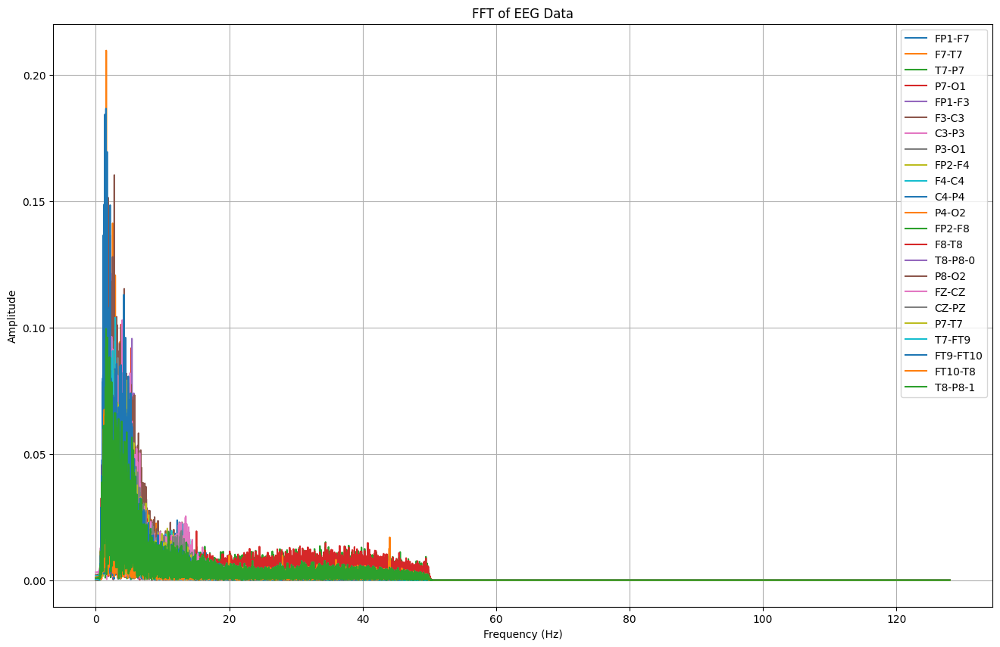

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3  \
0      0.000425  0.000830  0.000977  0.000922  0.000488  0.002125   
1      0.000417  0.000838  0.000985  0.000927  0.000496  0.002135   
2      0.000418  0.000838  0.000985  0.000927  0.000496  0.002135   
3      0.000420  0.000841  0.000987  0.000927  0.000496  0.002135   
4      0.000415  0.000843  0.000985  0.000928  0.000500  0.002136   
...         ...       ...       ...       ...       ...       ...   
20475  0.000012  0.000005  0.000029  0.000010  0.000013  0.000014   
20476  0.000012  0.000005  0.000029  0.000010  0.000013  0.000014   
20477  0.000012  0.000005  0.000029  0.000010  0.000013  0.000014   
20478  0.000012  0.000005  0.000029  0.000010  0.000013  0.000014   
20479  0.000012  0.000005  0.000029  0.000010  0.000013  0.000014   

              C3-P3     P3-O1    FP2-F4     F4-C4  ...     P8-O2  \
0      5.020659e-04  0.000796  0.000880  0.001704  .

In [ ]:

# Simpan data setelah filtering ke file CSV
TA85 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb15_17.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA85.columns:
        signal = TA85[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_85 = pd.DataFrame(fft_features).T
TA_85.columns = channels
TA_85['seizure'] = TA85['seizure']
TA_85['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_85.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA85[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_85.to_csv("/content/drive/MyDrive/TA/FFT/chb15_17.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_85}")


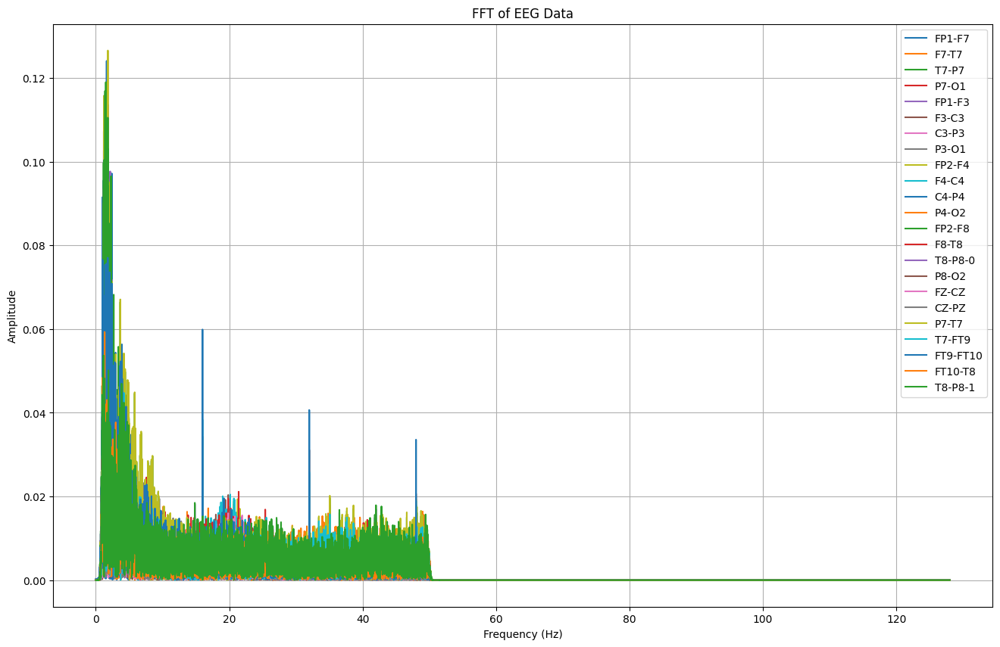

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3  \
0      0.000166  0.000103  0.000019  0.000218  0.000131  0.000081   
1      0.000193  0.000131  0.000005  0.000197  0.000154  0.000103   
2      0.000190  0.000132  0.000006  0.000195  0.000155  0.000104   
3      0.000194  0.000132  0.000003  0.000197  0.000157  0.000104   
4      0.000188  0.000131  0.000009  0.000197  0.000155  0.000103   
...         ...       ...       ...       ...       ...       ...   
22395  0.000007  0.000010  0.000010  0.000004  0.000009  0.000008   
22396  0.000007  0.000010  0.000010  0.000004  0.000009  0.000008   
22397  0.000007  0.000010  0.000010  0.000004  0.000009  0.000008   
22398  0.000007  0.000010  0.000010  0.000004  0.000009  0.000008   
22399  0.000007  0.000010  0.000010  0.000004  0.000009  0.000008   

              C3-P3     P3-O1    FP2-F4     F4-C4  ...     P8-O2     FZ-CZ  \
0      7.526611e-05  0.000103  0.000125  0

In [ ]:

# Simpan data setelah filtering ke file CSV
TA86 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb15_20.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA86.columns:
        signal = TA86[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_86 = pd.DataFrame(fft_features).T
TA_86.columns = channels
TA_86['seizure'] = TA86['seizure']
TA_86['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_86.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA86[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_86.to_csv("/content/drive/MyDrive/TA/FFT/chb15_20.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_86}")


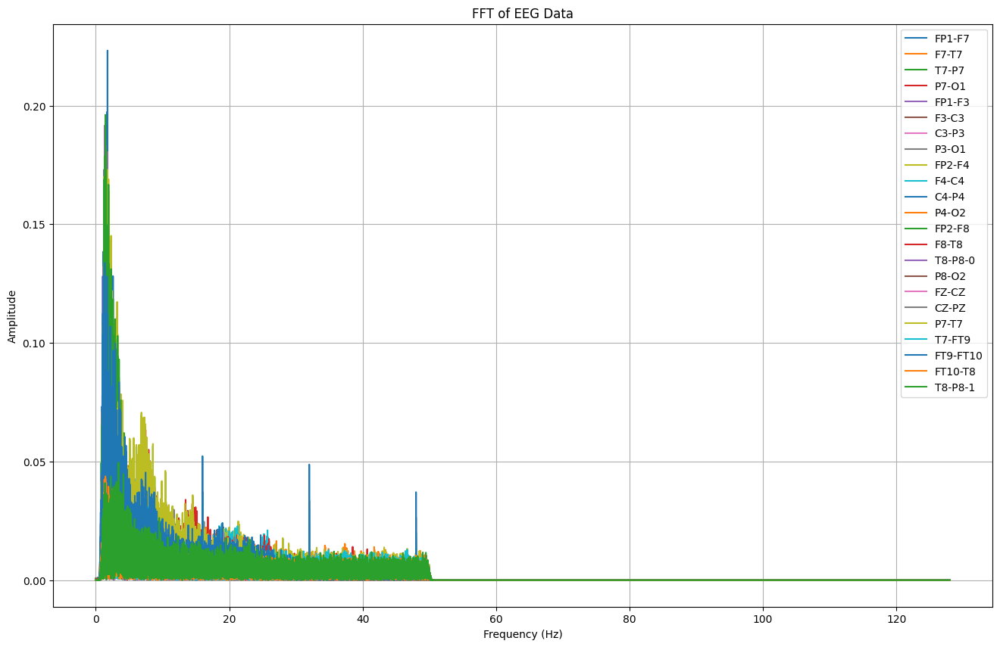

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000803  0.000147  0.000132  0.000062  0.000914  0.000072  0.000061   
1      0.000749  0.000102  0.000075  0.000089  0.000860  0.000110  0.000021   
2      0.000754  0.000096  0.000081  0.000092  0.000860  0.000112  0.000019   
3      0.000753  0.000103  0.000081  0.000093  0.000867  0.000109  0.000020   
4      0.000748  0.000096  0.000088  0.000095  0.000857  0.000113  0.000023   
...         ...       ...       ...       ...       ...       ...       ...   
41595  0.000014  0.000008  0.000007  0.000002  0.000014  0.000002  0.000001   
41596  0.000014  0.000008  0.000007  0.000002  0.000014  0.000002  0.000001   
41597  0.000014  0.000008  0.000007  0.000002  0.000014  0.000002  0.000001   
41598  0.000014  0.000008  0.000007  0.000002  0.000014  0.000002  0.000001   
41599  0.000014  0.000008  0.000007  0.000002  0.000014  0.000002  0.000001   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA87 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb15_22.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA87.columns:
        signal = TA87[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_87 = pd.DataFrame(fft_features).T
TA_87.columns = channels
TA_87['seizure'] = TA87['seizure']
TA_87['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_87.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA87[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_87.to_csv("/content/drive/MyDrive/TA/FFT/chb15_22.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_87}")


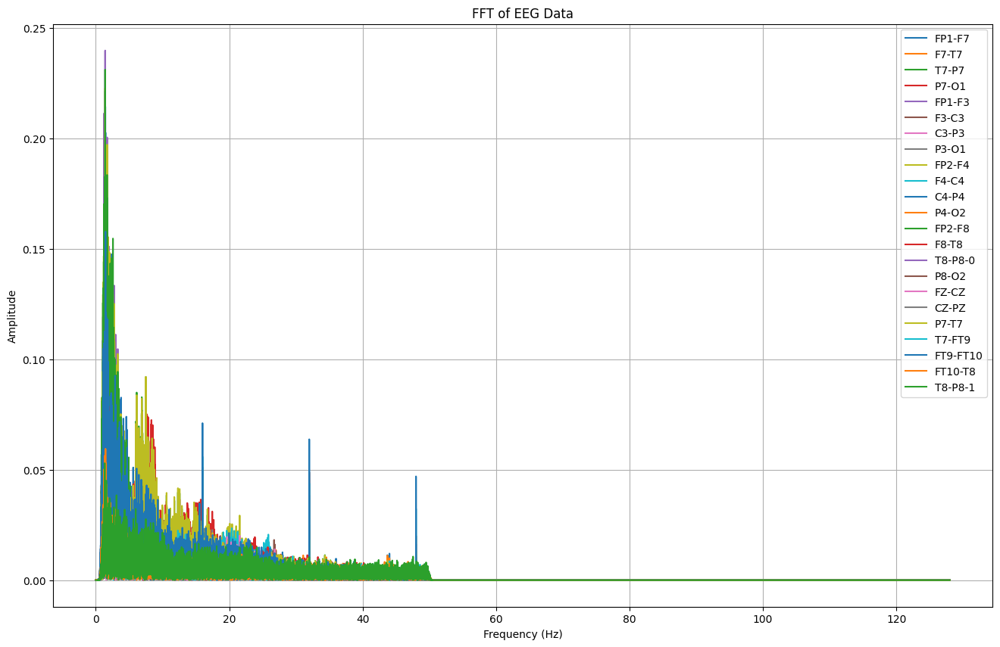

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3  \
0      0.000040  0.000083  0.000023  0.000086  0.000149  0.000005   
1      0.000019  0.000137  0.000086  0.000073  0.000090  0.000036   
2      0.000018  0.000137  0.000072  0.000066  0.000091  0.000041   
3      0.000019  0.000131  0.000077  0.000062  0.000098  0.000039   
4      0.000020  0.000132  0.000076  0.000063  0.000099  0.000038   
...         ...       ...       ...       ...       ...       ...   
39675  0.000008  0.000002  0.000003  0.000002  0.000004  0.000006   
39676  0.000008  0.000002  0.000003  0.000002  0.000004  0.000006   
39677  0.000008  0.000002  0.000003  0.000002  0.000004  0.000006   
39678  0.000008  0.000002  0.000003  0.000002  0.000004  0.000006   
39679  0.000008  0.000002  0.000003  0.000002  0.000004  0.000006   

              C3-P3     P3-O1    FP2-F4     F4-C4  ...     P8-O2     FZ-CZ  \
0      2.560074e-05  0.000131  0.000212  0

In [ ]:

# Simpan data setelah filtering ke file CSV
TA88 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb15_28.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA88.columns:
        signal = TA88[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_88 = pd.DataFrame(fft_features).T
TA_88.columns = channels
TA_88['seizure'] = TA88['seizure']
TA_88['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_88.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA88[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_88.to_csv("/content/drive/MyDrive/TA/FFT/chb15_28.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_88}")


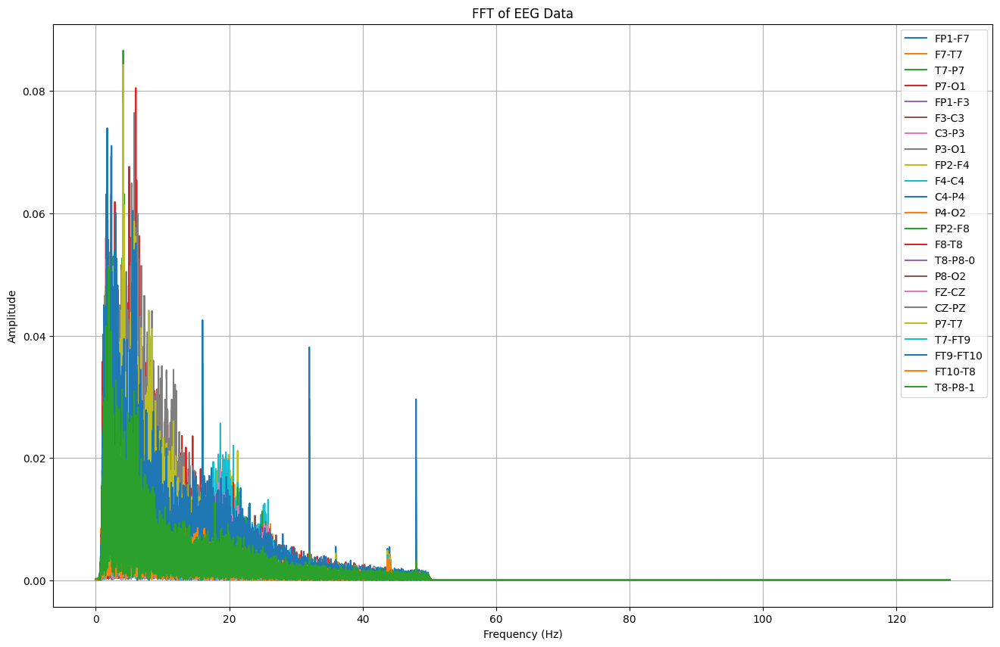

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7         T7-P7     P7-O1    FP1-F3         F3-C3  \
0      0.000048  0.000036  1.723542e-05  0.000114  0.000002  3.607848e-05   
1      0.000077  0.000008  5.739814e-05  0.000081  0.000030  8.450097e-06   
2      0.000076  0.000008  5.388678e-05  0.000085  0.000031  9.108222e-06   
3      0.000079  0.000007  5.259612e-05  0.000082  0.000031  7.219843e-06   
4      0.000079  0.000012  5.128117e-05  0.000080  0.000032  1.053278e-05   
...         ...       ...           ...       ...       ...           ...   
30715  0.000001  0.000001  9.621445e-07  0.000003  0.000002  2.648501e-07   
30716  0.000001  0.000001  9.621458e-07  0.000003  0.000002  2.648447e-07   
30717  0.000001  0.000001  9.621454e-07  0.000003  0.000002  2.648469e-07   
30718  0.000001  0.000001  9.621434e-07  0.000003  0.000002  2.648466e-07   
30719  0.000001  0.000001  9.621457e-07  0.000003  0.000002  2.648497e-07   

          C3-P3     P3-O

In [ ]:

# Simpan data setelah filtering ke file CSV
TA89 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb15_31.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA89.columns:
        signal = TA89[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_89 = pd.DataFrame(fft_features).T
TA_89.columns = channels
TA_89['seizure'] = TA89['seizure']
TA_89['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_89.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA89[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_89.to_csv("/content/drive/MyDrive/TA/FFT/chb15_31.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_89}")


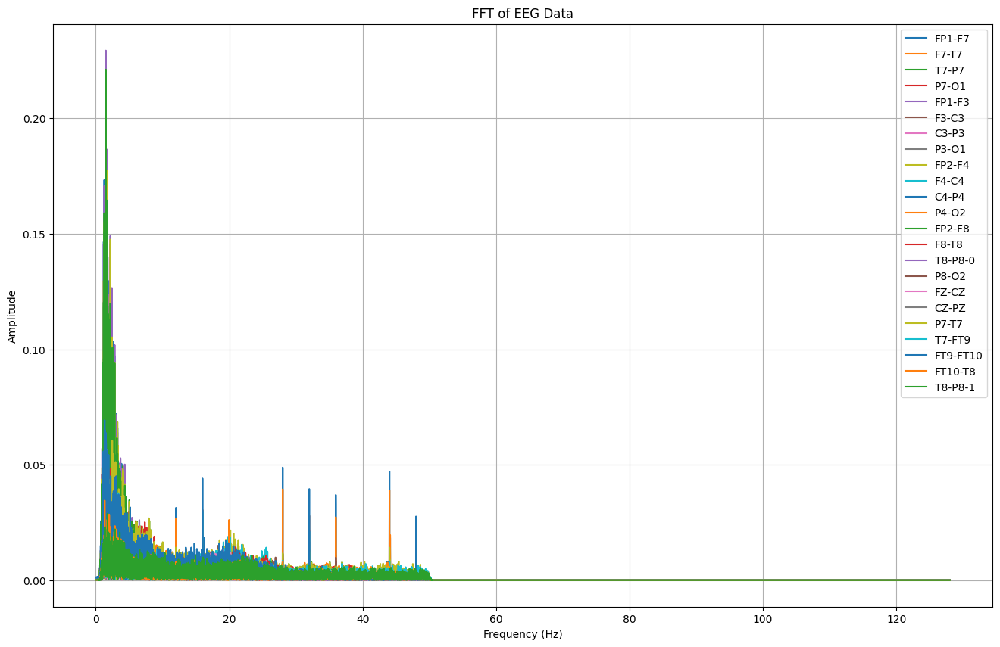

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.001275  0.000083  0.000339  0.000353  0.000664  0.000058  0.000176   
1      0.001295  0.000049  0.000313  0.000335  0.000688  0.000034  0.000153   
2      0.001305  0.000051  0.000317  0.000332  0.000690  0.000033  0.000154   
3      0.001302  0.000050  0.000315  0.000332  0.000694  0.000034  0.000152   
4      0.001310  0.000051  0.000312  0.000334  0.000695  0.000033  0.000152   
...         ...       ...       ...       ...       ...       ...       ...   
23035  0.000001  0.000010  0.000002  0.000008  0.000003  0.000008  0.000010   
23036  0.000001  0.000010  0.000002  0.000008  0.000003  0.000008  0.000010   
23037  0.000001  0.000010  0.000002  0.000008  0.000003  0.000008  0.000010   
23038  0.000001  0.000010  0.000002  0.000008  0.000003  0.000008  0.000010   
23039  0.000001  0.000010  0.000002  0.000008  0.000003  0.000008  0.000010   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA90 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb15_40.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA90.columns:
        signal = TA90[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_90 = pd.DataFrame(fft_features).T
TA_90.columns = channels
TA_90['seizure'] = TA90['seizure']
TA_90['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_90.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA90[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_90.to_csv("/content/drive/MyDrive/TA/FFT/chb15_40.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_90}")


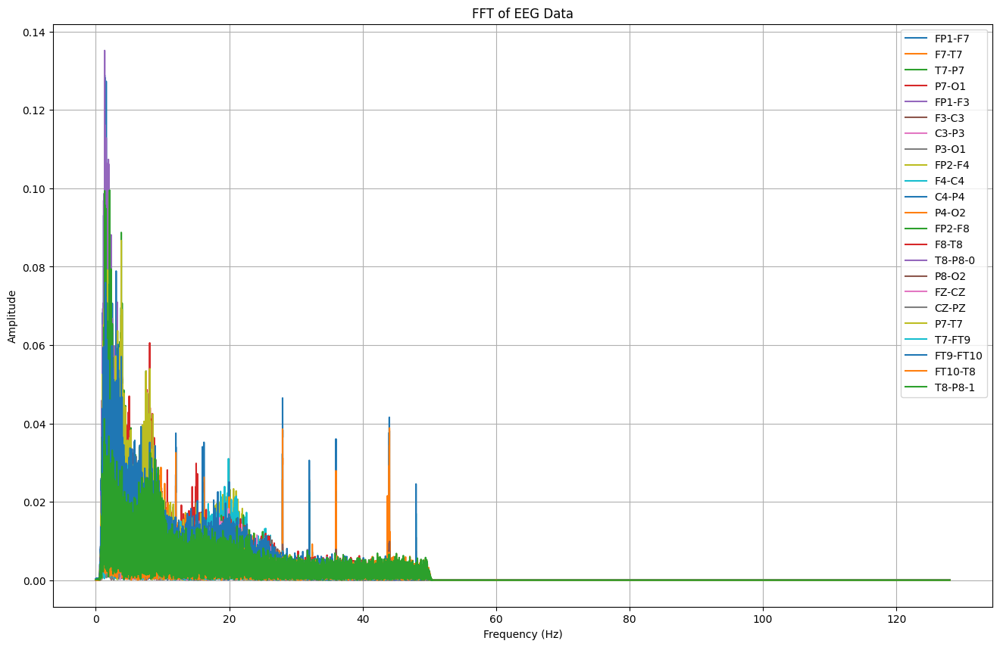

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7         T7-P7     P7-O1    FP1-F3     F3-C3  \
0      0.000047  0.000019  1.287151e-04  0.000036  0.000135  0.000184   
1      0.000093  0.000022  8.123708e-05  0.000051  0.000099  0.000214   
2      0.000094  0.000017  8.789950e-05  0.000057  0.000099  0.000214   
3      0.000092  0.000020  9.107063e-05  0.000058  0.000101  0.000213   
4      0.000087  0.000021  8.764033e-05  0.000054  0.000103  0.000214   
...         ...       ...           ...       ...       ...       ...   
30587  0.000006  0.000002  9.289492e-07  0.000009  0.000006  0.000005   
30588  0.000006  0.000002  9.289700e-07  0.000009  0.000006  0.000005   
30589  0.000006  0.000002  9.289654e-07  0.000009  0.000006  0.000005   
30590  0.000006  0.000002  9.289573e-07  0.000009  0.000006  0.000005   
30591  0.000006  0.000002  9.289610e-07  0.000009  0.000006  0.000005   

              C3-P3     P3-O1        FP2-F4     F4-C4  ...         P8-O2

In [ ]:

# Simpan data setelah filtering ke file CSV
TA90_1 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb15_40_1.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA90_1.columns:
        signal = TA90_1[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_90_1 = pd.DataFrame(fft_features).T
TA_90_1.columns = channels
TA_90_1['seizure'] = TA90_1['seizure']
TA_90_1['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_90_1.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA90_1[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_90_1.to_csv("/content/drive/MyDrive/TA/FFT/chb15_40_1.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_90_1}")


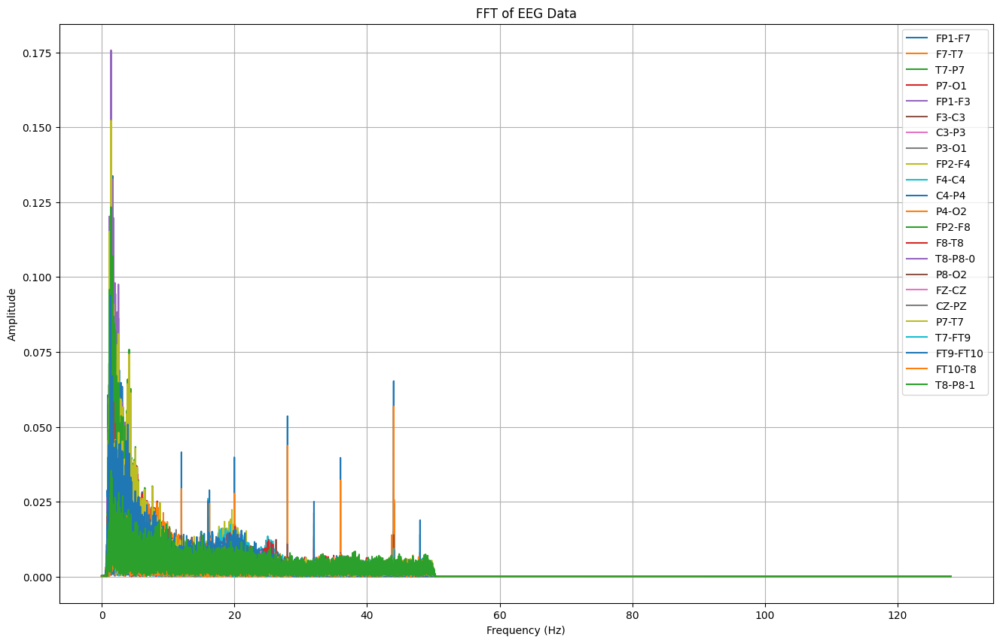

Data setelah FFT berhasil disimpan dalam file CSV:              FP1-F7         F7-T7         T7-P7     P7-O1    FP1-F3     F3-C3  \
0      7.700313e-06  1.126366e-04  1.861304e-04  0.000209  0.000102  0.000075   
1      3.392263e-05  1.452476e-04  2.141020e-04  0.000221  0.000075  0.000101   
2      3.740674e-05  1.395160e-04  2.081799e-04  0.000226  0.000075  0.000099   
3      2.896457e-05  1.410822e-04  2.087365e-04  0.000218  0.000079  0.000098   
4      3.193768e-05  1.416326e-04  2.085600e-04  0.000222  0.000077  0.000098   
...             ...           ...           ...       ...       ...       ...   
23419  2.720721e-08  1.213579e-07  8.783560e-07  0.000003  0.000001  0.000003   
23420  2.721394e-08  1.213808e-07  8.783925e-07  0.000003  0.000001  0.000003   
23421  2.721653e-08  1.213763e-07  8.783818e-07  0.000003  0.000001  0.000003   
23422  2.721074e-08  1.213581e-07  8.783635e-07  0.000003  0.000001  0.000003   
23423  2.721721e-08  1.213671e-07  8.783674e-07  0.000003 

In [ ]:

# Simpan data setelah filtering ke file CSV
TA90_2 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb15_40_2.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA90_2.columns:
        signal = TA90_2[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_90_2 = pd.DataFrame(fft_features).T
TA_90_2.columns = channels
TA_90_2['seizure'] = TA90_2['seizure']
TA_90_2['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_90_2.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA90_2[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_90_2.to_csv("/content/drive/MyDrive/TA/FFT/chb15_40_2.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_90_2}")


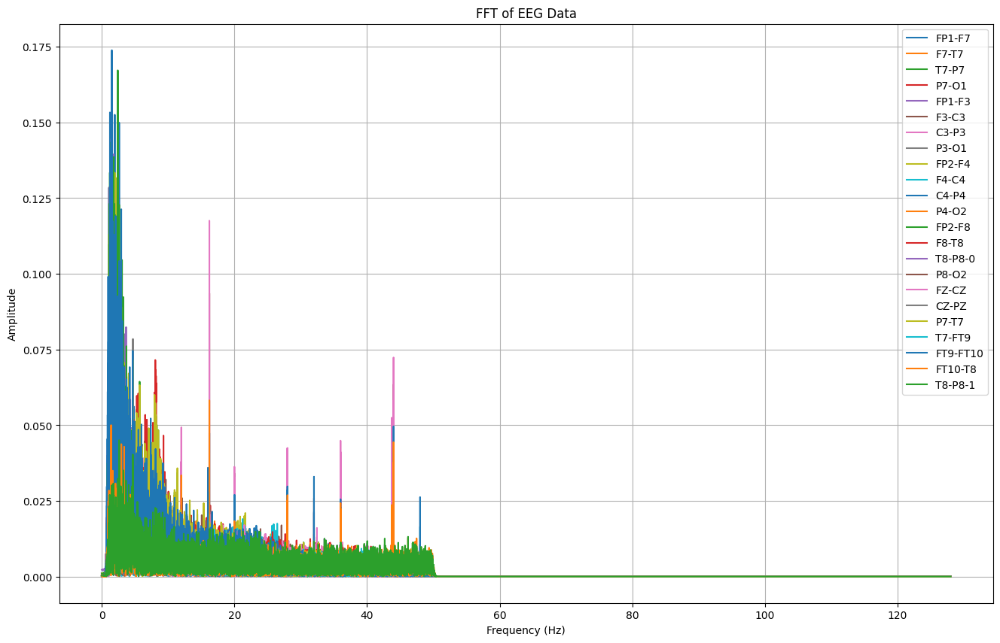

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.001228  0.000494  0.000259  0.000320  0.002250  0.000698  0.000526   
1      0.001192  0.000459  0.000222  0.000301  0.002212  0.000719  0.000498   
2      0.001186  0.000459  0.000226  0.000301  0.002209  0.000717  0.000499   
3      0.001181  0.000460  0.000230  0.000297  0.002218  0.000726  0.000498   
4      0.001185  0.000459  0.000229  0.000298  0.002235  0.000742  0.000496   
...         ...       ...       ...       ...       ...       ...       ...   
29051  0.000015  0.000017  0.000009  0.000008  0.000030  0.000045  0.000017   
29052  0.000015  0.000017  0.000009  0.000008  0.000030  0.000045  0.000017   
29053  0.000015  0.000017  0.000009  0.000008  0.000030  0.000045  0.000017   
29054  0.000015  0.000017  0.000009  0.000008  0.000030  0.000045  0.000017   
29055  0.000015  0.000017  0.000009  0.000008  0.000030  0.000045  0.000017   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA91 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb15_46.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA91.columns:
        signal = TA91[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_91 = pd.DataFrame(fft_features).T
TA_91.columns = channels
TA_91['seizure'] = TA91['seizure']
TA_91['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_91.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA91[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_91.to_csv("/content/drive/MyDrive/TA/FFT/chb15_46.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_91}")


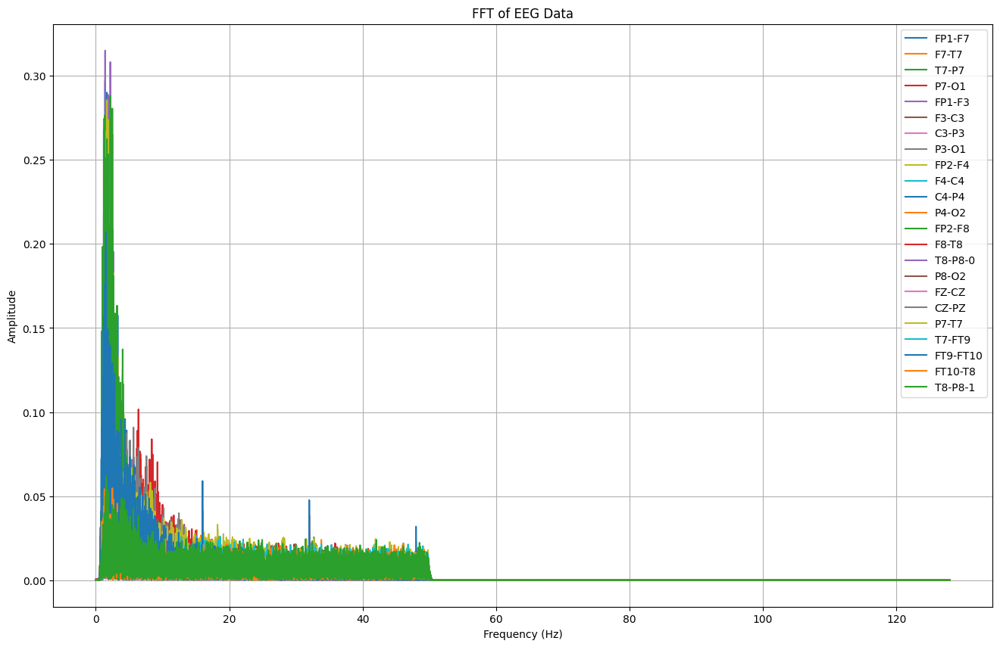

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3         F3-C3  \
0      0.000256  0.000207  0.000186  0.000535  0.000239  1.990208e-05   
1      0.000294  0.000251  0.000153  0.000497  0.000281  1.611276e-05   
2      0.000305  0.000252  0.000156  0.000504  0.000290  1.793650e-05   
3      0.000305  0.000253  0.000163  0.000495  0.000291  1.924626e-05   
4      0.000301  0.000256  0.000161  0.000501  0.000286  1.858739e-05   
...         ...       ...       ...       ...       ...           ...   
33275  0.000008  0.000013  0.000019  0.000007  0.000003  3.699332e-07   
33276  0.000008  0.000013  0.000019  0.000007  0.000003  3.699101e-07   
33277  0.000008  0.000013  0.000019  0.000007  0.000003  3.699165e-07   
33278  0.000008  0.000013  0.000019  0.000007  0.000003  3.699145e-07   
33279  0.000008  0.000013  0.000019  0.000007  0.000003  3.699105e-07   

          C3-P3     P3-O1    FP2-F4     F4-C4  ...     P8-O2         FZ-

In [ ]:

# Simpan data setelah filtering ke file CSV
TA92 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb15_49.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA92.columns:
        signal = TA92[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_92 = pd.DataFrame(fft_features).T
TA_92.columns = channels
TA_92['seizure'] = TA92['seizure']
TA_92['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_92.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA92[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_92.to_csv("/content/drive/MyDrive/TA/FFT/chb15_49.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_92}")


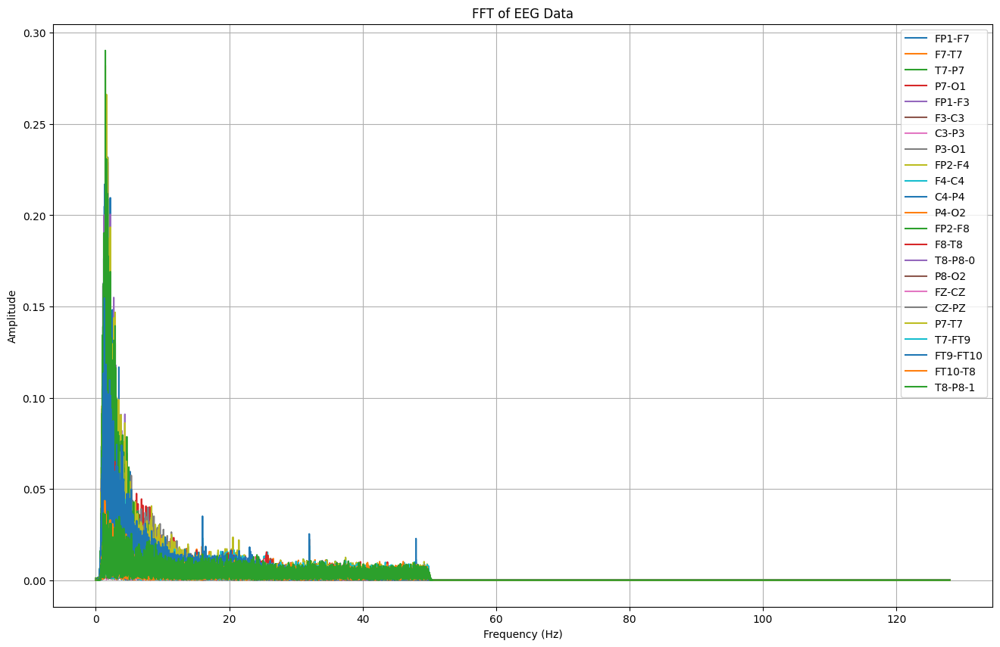

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3         F3-C3  \
0      0.000876  0.000535  0.000138  0.000373  0.001057  1.818008e-04   
1      0.000846  0.000499  0.000109  0.000396  0.001023  1.537766e-04   
2      0.000853  0.000503  0.000116  0.000398  0.001032  1.542011e-04   
3      0.000852  0.000503  0.000117  0.000394  0.001035  1.566941e-04   
4      0.000856  0.000503  0.000108  0.000382  0.001033  1.530924e-04   
...         ...       ...       ...       ...       ...           ...   
24443  0.000011  0.000007  0.000009  0.000009  0.000004  7.911371e-08   
24444  0.000011  0.000007  0.000009  0.000009  0.000004  7.911154e-08   
24445  0.000011  0.000007  0.000009  0.000009  0.000004  7.911265e-08   
24446  0.000011  0.000007  0.000009  0.000009  0.000004  7.910830e-08   
24447  0.000011  0.000007  0.000009  0.000009  0.000004  7.911939e-08   

              C3-P3     P3-O1    FP2-F4     F4-C4  ...     P8-O2     FZ-

In [ ]:

# Simpan data setelah filtering ke file CSV
TA93 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb15_52.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA93.columns:
        signal = TA93[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_93 = pd.DataFrame(fft_features).T
TA_93.columns = channels
TA_93['seizure'] = TA93['seizure']
TA_93['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_93.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA93[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_93.to_csv("/content/drive/MyDrive/TA/FFT/chb15_52.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_93}")


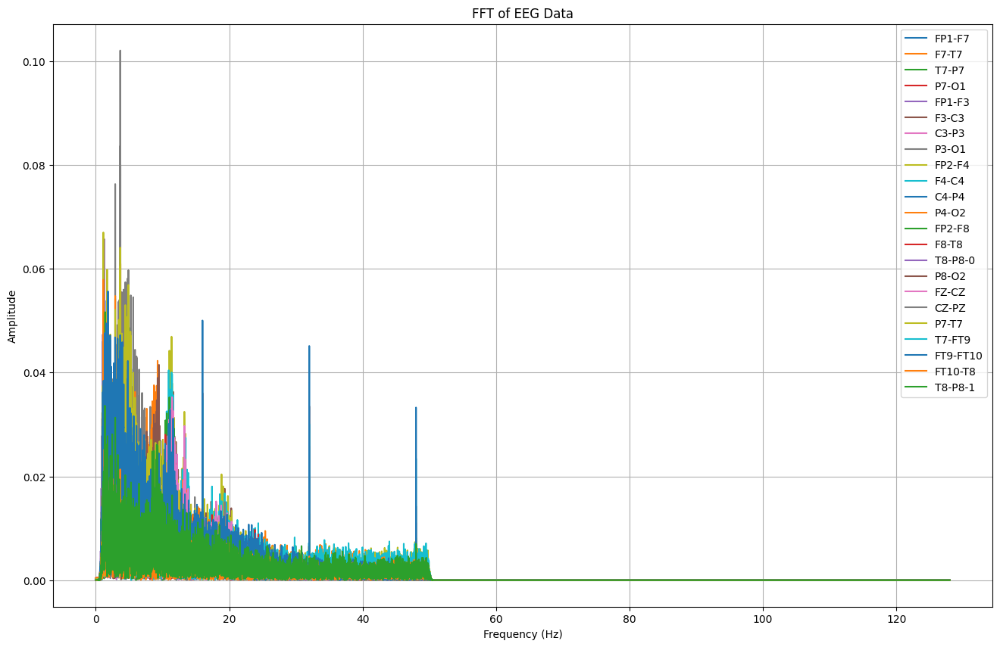

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7         F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3  \
0      0.000087  1.440740e-04  0.000243  0.000440  0.000135  0.000262   
1      0.000067  1.135178e-04  0.000219  0.000457  0.000113  0.000239   
2      0.000071  1.158159e-04  0.000227  0.000458  0.000121  0.000238   
3      0.000067  1.166544e-04  0.000222  0.000461  0.000116  0.000237   
4      0.000066  1.172760e-04  0.000222  0.000457  0.000112  0.000241   
...         ...           ...       ...       ...       ...       ...   
22395  0.000005  5.399648e-07  0.000002  0.000001  0.000005  0.000003   
22396  0.000005  5.399177e-07  0.000002  0.000001  0.000005  0.000003   
22397  0.000005  5.399178e-07  0.000002  0.000001  0.000005  0.000003   
22398  0.000005  5.399413e-07  0.000002  0.000001  0.000005  0.000003   
22399  0.000005  5.399287e-07  0.000002  0.000001  0.000005  0.000003   

          C3-P3     P3-O1    FP2-F4     F4-C4  ...     P8-O2         FZ-

In [ ]:

# Simpan data setelah filtering ke file CSV
TA94 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb15_54.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA94.columns:
        signal = TA94[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_94 = pd.DataFrame(fft_features).T
TA_94.columns = channels
TA_94['seizure'] = TA94['seizure']
TA_94['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_94.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA94[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_94.to_csv("/content/drive/MyDrive/TA/FFT/chb15_54.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_94}")


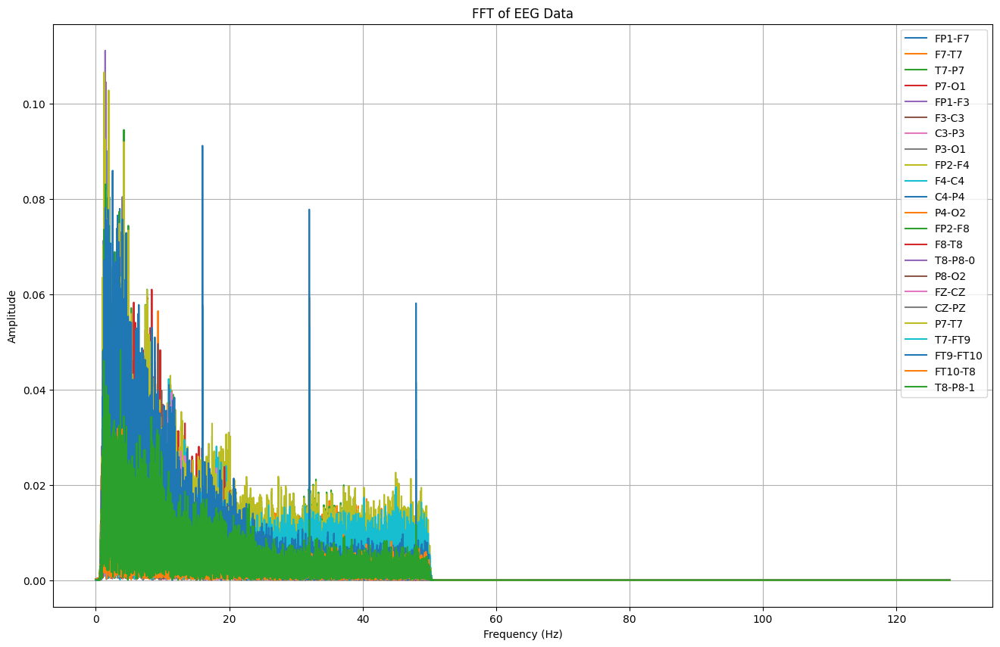

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7         T7-P7         P7-O1    FP1-F3     F3-C3  \
0      0.000019  0.000053  1.375930e-04  1.571952e-04  0.000154  0.000071   
1      0.000059  0.000097  1.029119e-04  1.351563e-04  0.000197  0.000035   
2      0.000060  0.000094  9.834465e-05  1.367869e-04  0.000195  0.000036   
3      0.000055  0.000095  1.071706e-04  1.200196e-04  0.000195  0.000035   
4      0.000054  0.000093  1.003413e-04  1.398703e-04  0.000190  0.000039   
...         ...       ...           ...           ...       ...       ...   
38011  0.000001  0.000002  1.082702e-07  8.217661e-07  0.000007  0.000006   
38012  0.000001  0.000002  1.082268e-07  8.217897e-07  0.000007  0.000006   
38013  0.000001  0.000002  1.082008e-07  8.217789e-07  0.000007  0.000006   
38014  0.000001  0.000002  1.082366e-07  8.217822e-07  0.000007  0.000006   
38015  0.000001  0.000002  1.082173e-07  8.217830e-07  0.000007  0.000006   

              C3-P3     

In [ ]:

# Simpan data setelah filtering ke file CSV
TA94_1 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb15_54_1.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA94_1.columns:
        signal = TA94_1[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_94_1 = pd.DataFrame(fft_features).T
TA_94_1.columns = channels
TA_94_1['seizure'] = TA94_1['seizure']
TA_94_1['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_94_1.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA94_1[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_94_1.to_csv("/content/drive/MyDrive/TA/FFT/chb15_54_1.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_94_1}")


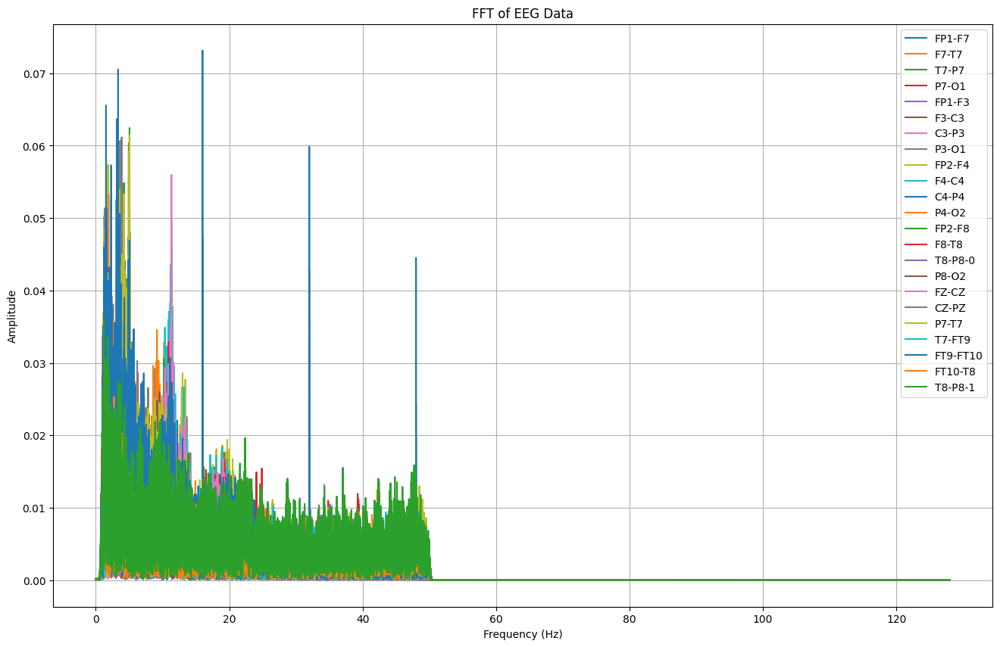

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7         T7-P7         P7-O1    FP1-F3     F3-C3  \
0      0.000119  0.000154  9.131450e-05  1.014319e-04  0.000209  0.000077   
1      0.000090  0.000126  6.644104e-05  1.206646e-04  0.000186  0.000052   
2      0.000096  0.000127  7.010926e-05  1.281563e-04  0.000190  0.000053   
3      0.000097  0.000127  6.577106e-05  1.298602e-04  0.000193  0.000053   
4      0.000099  0.000126  7.032005e-05  1.220883e-04  0.000191  0.000051   
...         ...       ...           ...           ...       ...       ...   
24443  0.000001  0.000003  1.582466e-07  7.283357e-07  0.000002  0.000005   
24444  0.000001  0.000003  1.581907e-07  7.283295e-07  0.000002  0.000005   
24445  0.000001  0.000003  1.582583e-07  7.283319e-07  0.000002  0.000005   
24446  0.000001  0.000003  1.582509e-07  7.283377e-07  0.000002  0.000005   
24447  0.000001  0.000003  1.582263e-07  7.283276e-07  0.000002  0.000005   

          C3-P3     P3-O

In [ ]:

# Simpan data setelah filtering ke file CSV
TA94_2 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb15_54_2.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA94_2.columns:
        signal = TA94_2[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_94_2 = pd.DataFrame(fft_features).T
TA_94_2.columns = channels
TA_94_2['seizure'] = TA94_2['seizure']
TA_94_2['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_94_2.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA94_2[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_94_2.to_csv("/content/drive/MyDrive/TA/FFT/chb15_54_2.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_94_2}")


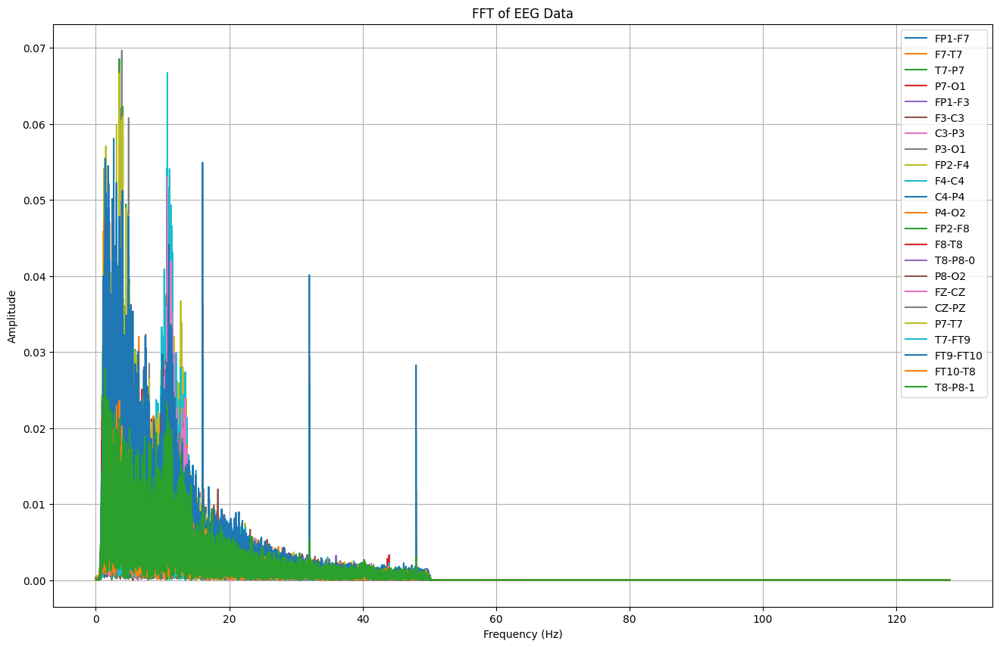

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7         F7-T7     T7-P7     P7-O1        FP1-F3     F3-C3  \
0      0.000047  5.491366e-05  0.000148  0.000091  3.311287e-05  0.000096   
1      0.000068  2.635251e-05  0.000119  0.000073  5.641600e-05  0.000071   
2      0.000068  2.888503e-05  0.000122  0.000073  5.505447e-05  0.000069   
3      0.000070  3.114432e-05  0.000121  0.000073  5.712908e-05  0.000070   
4      0.000070  2.596716e-05  0.000123  0.000071  5.871383e-05  0.000070   
...         ...           ...       ...       ...           ...       ...   
24443  0.000003  9.125249e-07  0.000002  0.000002  6.988782e-07  0.000006   
24444  0.000003  9.125285e-07  0.000002  0.000002  6.988806e-07  0.000006   
24445  0.000003  9.125265e-07  0.000002  0.000002  6.988723e-07  0.000006   
24446  0.000003  9.125249e-07  0.000002  0.000002  6.988699e-07  0.000006   
24447  0.000003  9.125241e-07  0.000002  0.000002  6.988719e-07  0.000006   

          C3-P3     P3-O

In [ ]:

# Simpan data setelah filtering ke file CSV
TA94_3 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb15_54_3.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA94_3.columns:
        signal = TA94_3[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_94_3 = pd.DataFrame(fft_features).T
TA_94_3.columns = channels
TA_94_3['seizure'] = TA94_3['seizure']
TA_94_3['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_94_3.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA94_3[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_94_3.to_csv("/content/drive/MyDrive/TA/FFT/chb15_54_3.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_94_3}")


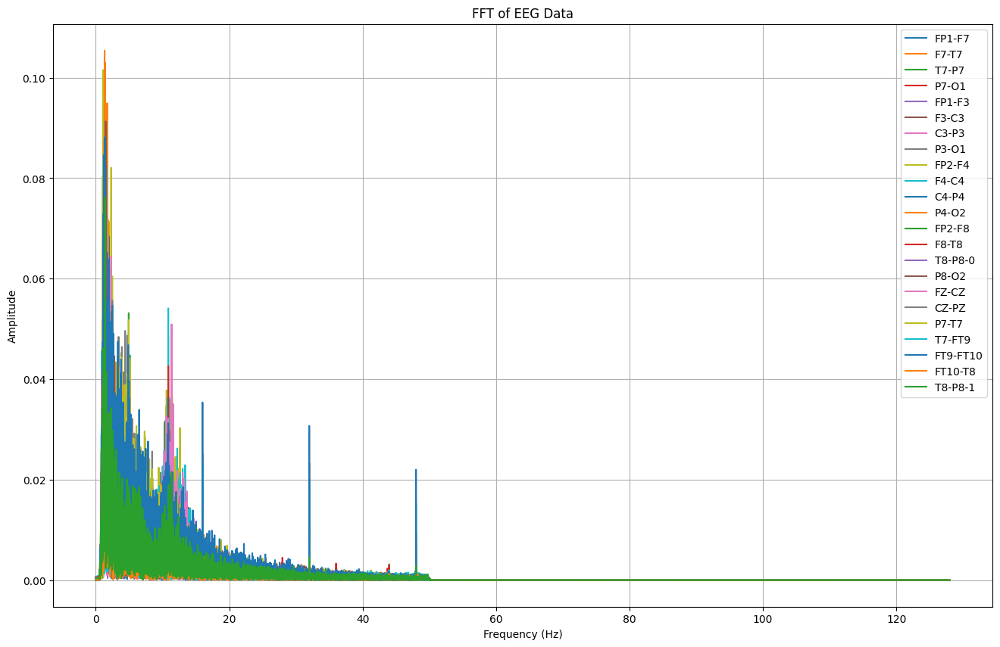

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000043  0.000050  0.000139  0.000136  0.000269  0.000037  0.000039   
1      0.000060  0.000072  0.000161  0.000121  0.000288  0.000057  0.000020   
2      0.000059  0.000071  0.000158  0.000118  0.000286  0.000059  0.000024   
3      0.000060  0.000070  0.000159  0.000119  0.000287  0.000057  0.000023   
4      0.000063  0.000072  0.000159  0.000119  0.000294  0.000057  0.000022   
...         ...       ...       ...       ...       ...       ...       ...   
19451  0.000002  0.000006  0.000003  0.000004  0.000010  0.000007  0.000008   
19452  0.000002  0.000006  0.000003  0.000004  0.000010  0.000007  0.000008   
19453  0.000002  0.000006  0.000003  0.000004  0.000010  0.000007  0.000008   
19454  0.000002  0.000006  0.000003  0.000004  0.000010  0.000007  0.000008   
19455  0.000002  0.000006  0.000003  0.000004  0.000010  0.000007  0.000008   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA94_4 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb15_54_4.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA94_4.columns:
        signal = TA94_4[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_94_4 = pd.DataFrame(fft_features).T
TA_94_4.columns = channels
TA_94_4['seizure'] = TA94_4['seizure']
TA_94_4['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_94_4.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA94_4[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_94_4.to_csv("/content/drive/MyDrive/TA/FFT/chb15_54_4.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_94_4}")


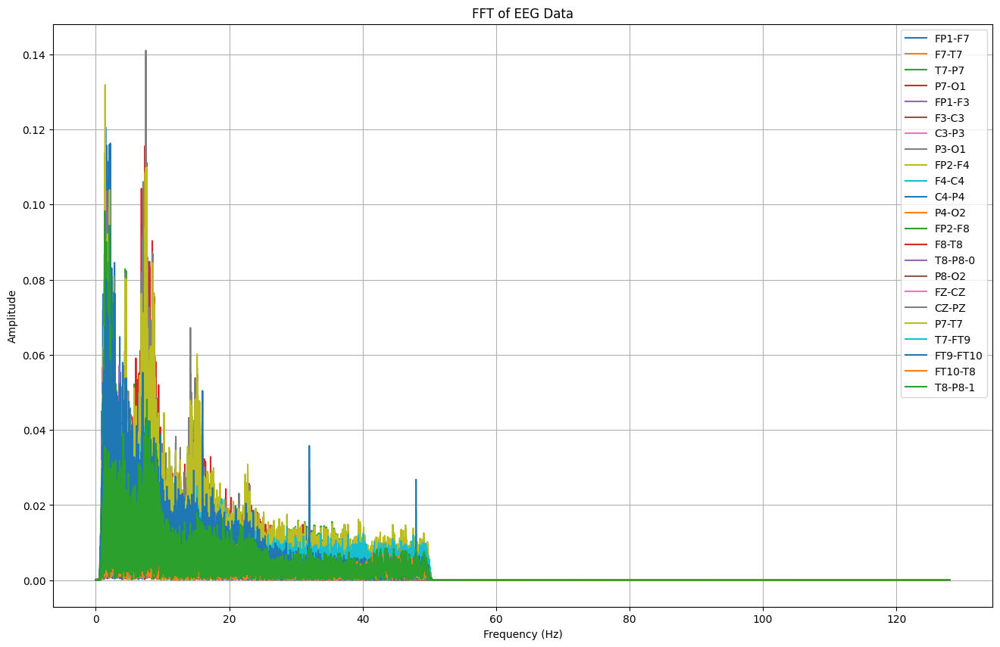

Data setelah FFT berhasil disimpan dalam file CSV:              FP1-F7     F7-T7     T7-P7     P7-O1        FP1-F3         F3-C3  \
0      5.529454e-05  0.000027  0.000013  0.000073  3.753389e-05  7.051582e-05   
1      1.894174e-05  0.000062  0.000041  0.000045  1.812083e-06  4.300851e-05   
2      2.393743e-05  0.000059  0.000044  0.000055  1.022276e-05  4.266675e-05   
3      3.368634e-05  0.000056  0.000033  0.000037  1.563362e-05  4.411478e-05   
4      1.899569e-05  0.000061  0.000045  0.000058  8.880566e-06  3.994773e-05   
...             ...       ...       ...       ...           ...           ...   
29179  2.635252e-07  0.000002  0.000002  0.000001  9.300469e-07  1.209711e-07   
29180  2.635450e-07  0.000002  0.000002  0.000001  9.300306e-07  1.209397e-07   
29181  2.635631e-07  0.000002  0.000002  0.000001  9.300301e-07  1.209780e-07   
29182  2.635444e-07  0.000002  0.000002  0.000001  9.300293e-07  1.209784e-07   
29183  2.635464e-07  0.000002  0.000002  0.000001  9.30033

In [ ]:

# Simpan data setelah filtering ke file CSV
TA95 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb15_62.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA95.columns:
        signal = TA95[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_95 = pd.DataFrame(fft_features).T
TA_95.columns = channels
TA_95['seizure'] = TA95['seizure']
TA_95['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_95.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA95[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_95.to_csv("/content/drive/MyDrive/TA/FFT/chb15_62.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_95}")


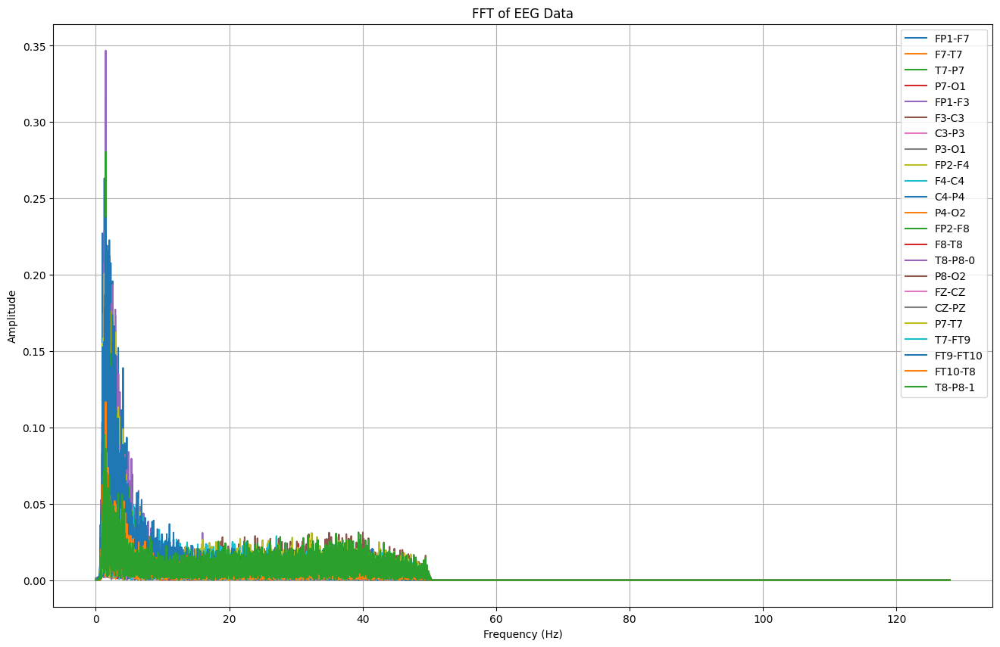

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.001369  0.000262  0.000525  0.000177  0.001502  0.000484  0.000375   
1      0.001379  0.000271  0.000533  0.000181  0.001511  0.000490  0.000381   
2      0.001375  0.000269  0.000533  0.000180  0.001507  0.000489  0.000381   
3      0.001380  0.000268  0.000535  0.000180  0.001509  0.000489  0.000384   
4      0.001380  0.000272  0.000532  0.000188  0.001510  0.000494  0.000385   
...         ...       ...       ...       ...       ...       ...       ...   
16507  0.000036  0.000016  0.000016  0.000026  0.000009  0.000010  0.000007   
16508  0.000036  0.000016  0.000016  0.000026  0.000009  0.000010  0.000007   
16509  0.000036  0.000016  0.000016  0.000026  0.000009  0.000010  0.000007   
16510  0.000036  0.000016  0.000016  0.000026  0.000009  0.000010  0.000007   
16511  0.000036  0.000016  0.000016  0.000026  0.000009  0.000010  0.000007   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA96 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb16_10.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA96.columns:
        signal = TA96[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_96 = pd.DataFrame(fft_features).T
TA_96.columns = channels
TA_96['seizure'] = TA96['seizure']
TA_96['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_96.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA96[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_96.to_csv("/content/drive/MyDrive/TA/FFT/chb16_10.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_96}")


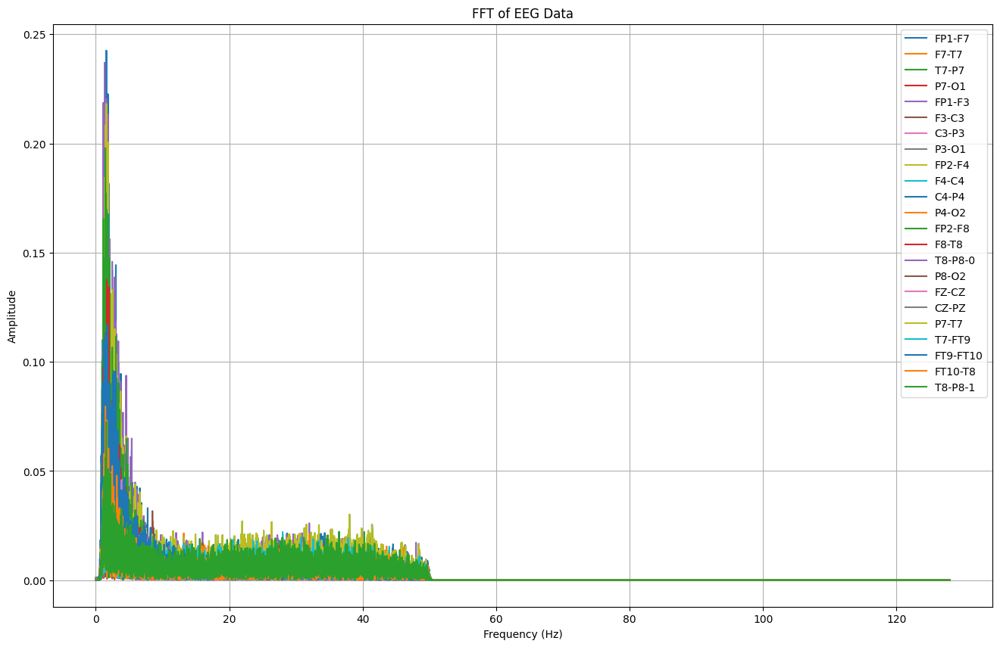

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3  \
0      0.001040  0.000055  0.000130  0.000112  0.001215  0.000122   
1      0.001048  0.000062  0.000134  0.000117  0.001222  0.000130   
2      0.001048  0.000057  0.000135  0.000119  0.001221  0.000129   
3      0.001045  0.000071  0.000129  0.000122  0.001225  0.000131   
4      0.001046  0.000063  0.000130  0.000120  0.001217  0.000126   
...         ...       ...       ...       ...       ...       ...   
16507  0.000043  0.000003  0.000005  0.000009  0.000038  0.000006   
16508  0.000043  0.000003  0.000005  0.000009  0.000038  0.000006   
16509  0.000043  0.000003  0.000005  0.000009  0.000038  0.000006   
16510  0.000043  0.000003  0.000005  0.000009  0.000038  0.000006   
16511  0.000043  0.000003  0.000005  0.000009  0.000038  0.000006   

              C3-P3     P3-O1    FP2-F4     F4-C4  ...     P8-O2     FZ-CZ  \
0      2.616164e-05  0.000054  0.000894  0

In [ ]:

# Simpan data setelah filtering ke file CSV
TA97 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb16_11.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA97.columns:
        signal = TA97[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_97 = pd.DataFrame(fft_features).T
TA_97.columns = channels
TA_97['seizure'] = TA97['seizure']
TA_97['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_97.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA97[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_97.to_csv("/content/drive/MyDrive/TA/FFT/chb16_11.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_97}")


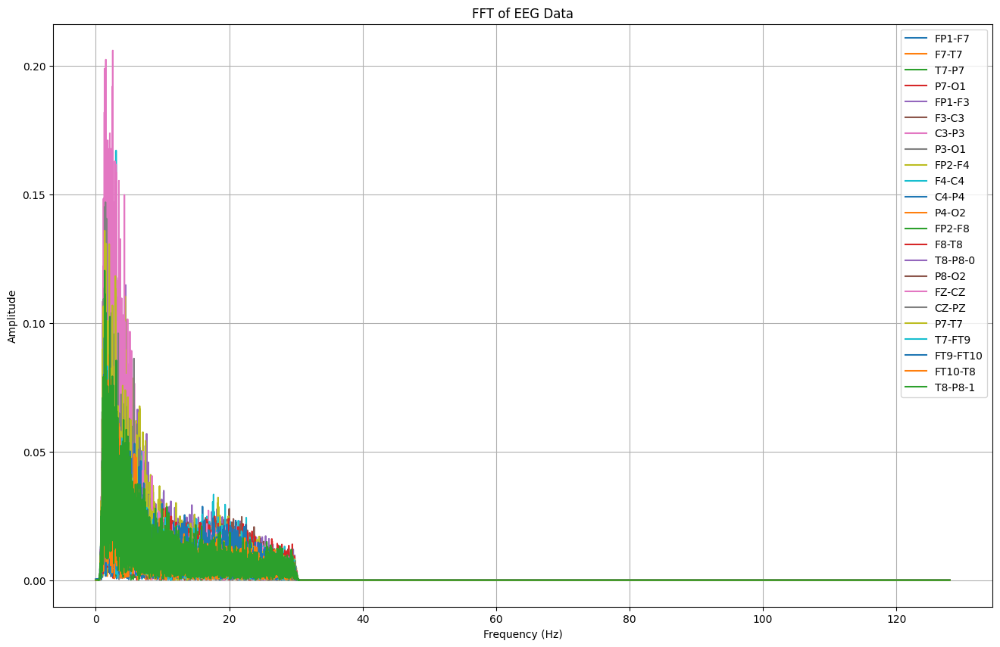

Data setelah FFT berhasil disimpan dalam file CSV:              FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3  \
0      9.306931e-05  0.000118  0.000166  0.000036  0.000071  0.000156   
1      9.722542e-05  0.000125  0.000161  0.000041  0.000064  0.000161   
2      9.824840e-05  0.000124  0.000163  0.000040  0.000065  0.000160   
3      9.548137e-05  0.000123  0.000159  0.000043  0.000066  0.000160   
4      9.298417e-05  0.000123  0.000161  0.000042  0.000071  0.000161   
...             ...       ...       ...       ...       ...       ...   
17147  2.478516e-07  0.000002  0.000008  0.000005  0.000004  0.000004   
17148  2.466731e-07  0.000002  0.000008  0.000005  0.000004  0.000004   
17149  2.472707e-07  0.000002  0.000008  0.000005  0.000004  0.000004   
17150  2.472567e-07  0.000002  0.000008  0.000005  0.000004  0.000004   
17151  2.473286e-07  0.000002  0.000008  0.000005  0.000004  0.000004   

          C3-P3     P3-O1        FP2-F4     F4-C4  ...     P8-O2     FZ-

In [ ]:

# Simpan data setelah filtering ke file CSV
TA98 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb16_14.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA98.columns:
        signal = TA98[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_98 = pd.DataFrame(fft_features).T
TA_98.columns = channels
TA_98['seizure'] = TA98['seizure']
TA_98['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_98.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA98[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_98.to_csv("/content/drive/MyDrive/TA/FFT/chb16_14.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_98}")


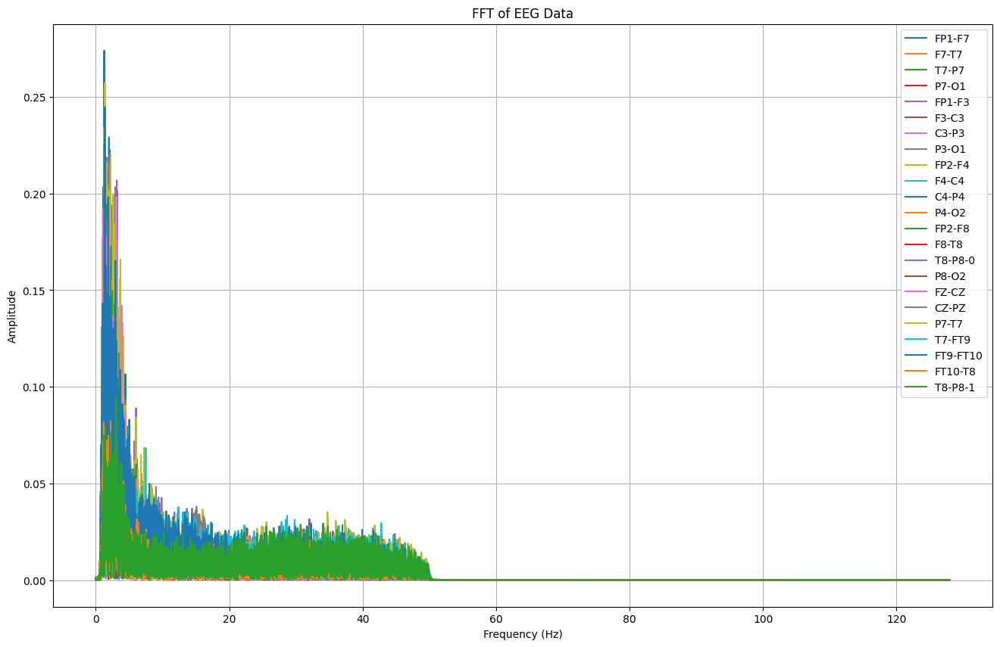

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000952  0.000071  0.000358  0.000201  0.001184  0.000352  0.000356   
1      0.000964  0.000077  0.000353  0.000206  0.001193  0.000345  0.000349   
2      0.000967  0.000081  0.000351  0.000208  0.001201  0.000348  0.000346   
3      0.000926  0.000076  0.000353  0.000206  0.001162  0.000349  0.000352   
4      0.000963  0.000090  0.000358  0.000206  0.001208  0.000349  0.000348   
...         ...       ...       ...       ...       ...       ...       ...   
16123  0.000037  0.000017  0.000015  0.000012  0.000027  0.000007  0.000005   
16124  0.000037  0.000017  0.000015  0.000012  0.000027  0.000007  0.000005   
16125  0.000037  0.000017  0.000015  0.000012  0.000027  0.000007  0.000005   
16126  0.000037  0.000017  0.000015  0.000012  0.000027  0.000007  0.000005   
16127  0.000037  0.000017  0.000015  0.000012  0.000027  0.000007  0.000005   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA99 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb16_16.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA99.columns:
        signal = TA99[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_99 = pd.DataFrame(fft_features).T
TA_99.columns = channels
TA_99['seizure'] = TA99['seizure']
TA_99['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_99.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA99[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_99.to_csv("/content/drive/MyDrive/TA/FFT/chb16_16.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_99}")


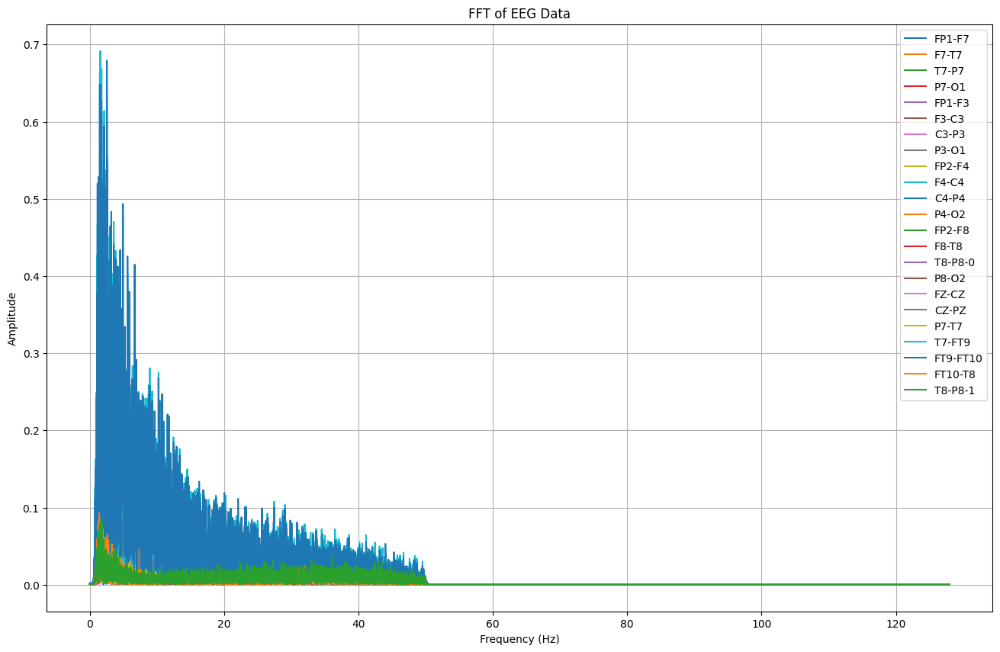

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000267  0.000475  0.000457  0.000095  0.000041  0.000105  0.000274   
1      0.000280  0.000467  0.000450  0.000100  0.000035  0.000097  0.000268   
2      0.000287  0.000468  0.000451  0.000102  0.000046  0.000101  0.000268   
3      0.000298  0.000468  0.000448  0.000101  0.000052  0.000098  0.000267   
4      0.000303  0.000466  0.000452  0.000103  0.000081  0.000094  0.000263   
...         ...       ...       ...       ...       ...       ...       ...   
16507  0.000088  0.000016  0.000018  0.000010  0.000029  0.000007  0.000003   
16508  0.000088  0.000016  0.000018  0.000010  0.000029  0.000007  0.000003   
16509  0.000088  0.000016  0.000018  0.000010  0.000029  0.000007  0.000003   
16510  0.000088  0.000016  0.000018  0.000010  0.000029  0.000007  0.000003   
16511  0.000088  0.000016  0.000018  0.000010  0.000029  0.000007  0.000003   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA100 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb16_17.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA100.columns:
        signal = TA100[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_100 = pd.DataFrame(fft_features).T
TA_100.columns = channels
TA_100['seizure'] = TA100['seizure']
TA_100['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_100.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA100[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_100.to_csv("/content/drive/MyDrive/TA/FFT/chb16_17.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_100}")


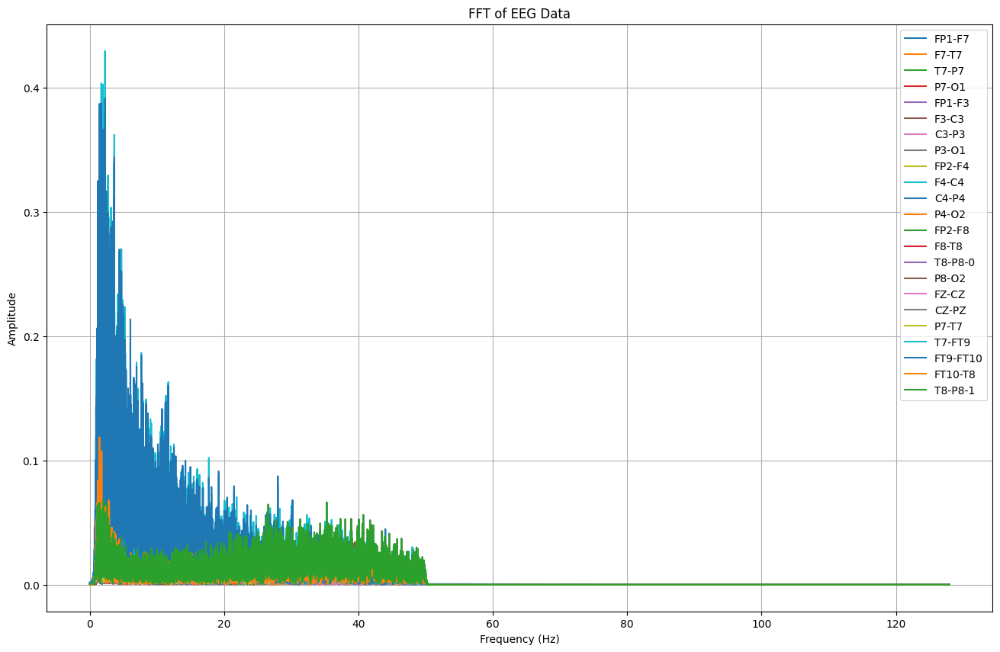

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000196  0.000533  0.000249  0.000416  0.002057  0.001063  0.000603   
1      0.000204  0.000541  0.000245  0.000420  0.002066  0.001056  0.000597   
2      0.000194  0.000534  0.000246  0.000420  0.002052  0.001060  0.000599   
3      0.000194  0.000542  0.000240  0.000419  0.002060  0.001056  0.000597   
4      0.000211  0.000543  0.000244  0.000419  0.002075  0.001056  0.000598   
...         ...       ...       ...       ...       ...       ...       ...   
16123  0.000041  0.000016  0.000010  0.000002  0.000033  0.000004  0.000005   
16124  0.000041  0.000016  0.000010  0.000002  0.000033  0.000004  0.000005   
16125  0.000041  0.000016  0.000010  0.000002  0.000033  0.000004  0.000005   
16126  0.000041  0.000016  0.000010  0.000002  0.000033  0.000004  0.000005   
16127  0.000041  0.000016  0.000010  0.000002  0.000033  0.000004  0.000005   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA100_1 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb16_17_1.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA100_1.columns:
        signal = TA100_1[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_100_1 = pd.DataFrame(fft_features).T
TA_100_1.columns = channels
TA_100_1['seizure'] = TA100_1['seizure']
TA_100_1['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_100_1.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA100_1[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_100_1.to_csv("/content/drive/MyDrive/TA/FFT/chb16_17_1.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_100_1}")


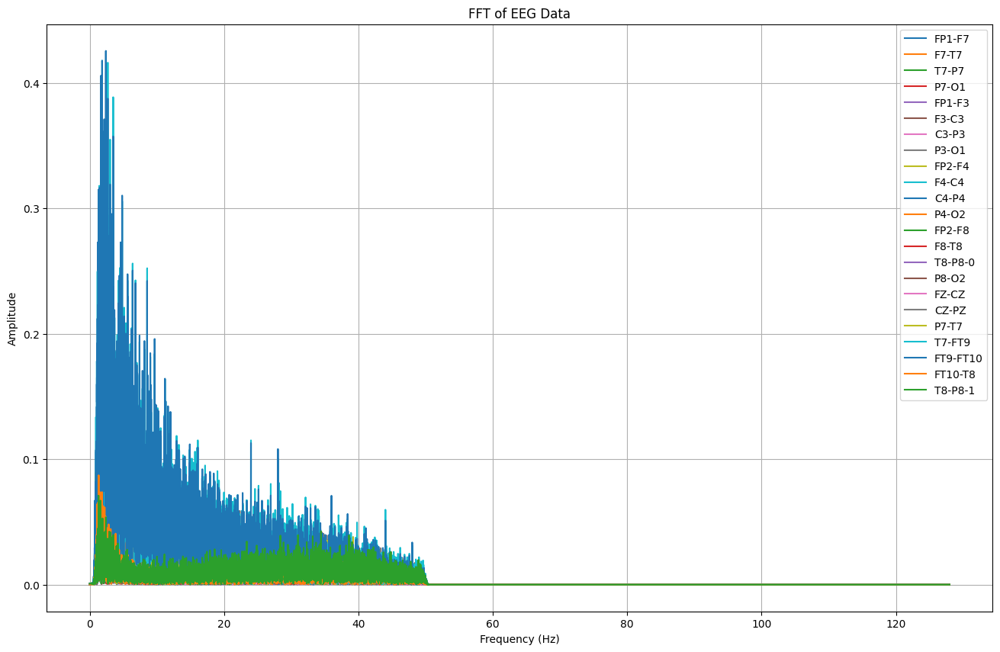

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000968  0.000027  0.000175  0.000415  0.000617  0.000327  0.000393   
1      0.000959  0.000020  0.000167  0.000411  0.000607  0.000321  0.000387   
2      0.000957  0.000018  0.000165  0.000411  0.000603  0.000321  0.000385   
3      0.000951  0.000022  0.000163  0.000412  0.000605  0.000320  0.000384   
4      0.000955  0.000016  0.000168  0.000415  0.000599  0.000320  0.000387   
...         ...       ...       ...       ...       ...       ...       ...   
16379  0.000010  0.000013  0.000006  0.000029  0.000015  0.000005  0.000010   
16380  0.000010  0.000013  0.000006  0.000029  0.000015  0.000005  0.000010   
16381  0.000010  0.000013  0.000006  0.000029  0.000015  0.000005  0.000010   
16382  0.000010  0.000013  0.000006  0.000029  0.000015  0.000005  0.000010   
16383  0.000010  0.000013  0.000006  0.000029  0.000015  0.000005  0.000010   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA100_2 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb16_17_2.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA100_2.columns:
        signal = TA100_2[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_100_2 = pd.DataFrame(fft_features).T
TA_100_2.columns = channels
TA_100_2['seizure'] = TA100_2['seizure']
TA_100_2['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_100_2.columns:
        fft_freqs, fft_vals = compute_fft(TA100_2[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_100_2.to_csv("/content/drive/MyDrive/TA/FFT/chb16_17_2.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_100_2}")


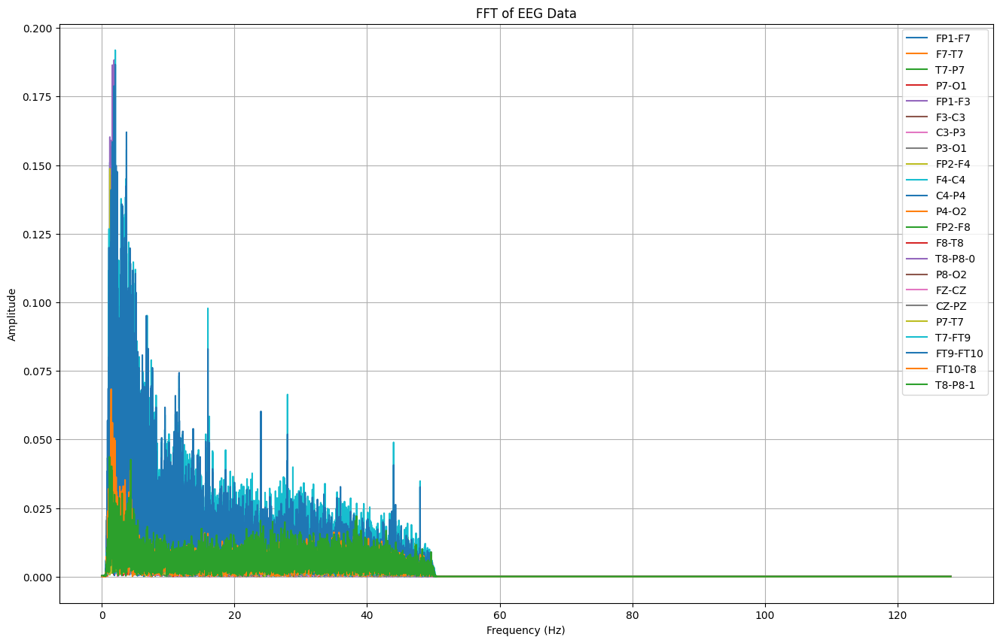

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3  \
0      0.000099  0.000048  0.000180  0.000002  0.000166  0.000093   
1      0.000091  0.000057  0.000185  0.000007  0.000157  0.000101   
2      0.000090  0.000054  0.000182  0.000003  0.000159  0.000099   
3      0.000088  0.000056  0.000183  0.000006  0.000157  0.000100   
4      0.000093  0.000058  0.000181  0.000008  0.000158  0.000098   
...         ...       ...       ...       ...       ...       ...   
16379  0.000011  0.000007  0.000009  0.000001  0.000010  0.000007   
16380  0.000011  0.000007  0.000009  0.000001  0.000010  0.000007   
16381  0.000011  0.000007  0.000009  0.000001  0.000010  0.000007   
16382  0.000011  0.000007  0.000009  0.000001  0.000010  0.000007   
16383  0.000011  0.000007  0.000009  0.000001  0.000010  0.000007   

              C3-P3     P3-O1    FP2-F4     F4-C4  ...     P8-O2     FZ-CZ  \
0      1.943118e-04  0.000016  0.000189  0

In [ ]:

# Simpan data setelah filtering ke file CSV
TA100_3 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb16_17_3.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA100_3.columns:
        signal = TA100_3[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_100_3 = pd.DataFrame(fft_features).T
TA_100_3.columns = channels
TA_100_3['seizure'] = TA100_3['seizure']
TA_100_3['frekuensi'] = fft_freqs


# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_100_3.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA100_3[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_100_3.to_csv("/content/drive/MyDrive/TA/FFT/chb16_17_3.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_100_3}")


# 101-120

In [ ]:

# Simpan data setelah filtering ke file CSV
TA101 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb16_18.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA101.columns:
        signal = TA101[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_101 = pd.DataFrame(fft_features).T
TA_101.columns = channels
TA_101['seizure'] = TA101['seizure']
TA_101['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_101.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA101[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_101.to_csv("/content/drive/MyDrive/TA/FFT/chb16_18.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_101}")


ValueError: Length mismatch: Expected axis has 17 elements, new values have 23 elements

In [ ]:

# Simpan data setelah filtering ke file CSV
TA101_1 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb16_18_1.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA101_1.columns:
        signal = TA101_1[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_101_1 = pd.DataFrame(fft_features).T
TA_101_1.columns = channels
TA_101_1['seizure'] = TA101_1['seizure']
TA_101_1['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_101_1.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA101_1[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_101_1.to_csv("/content/drive/MyDrive/TA/FFT/chb16_18_1.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_101_1}")


ValueError: Length mismatch: Expected axis has 17 elements, new values have 23 elements

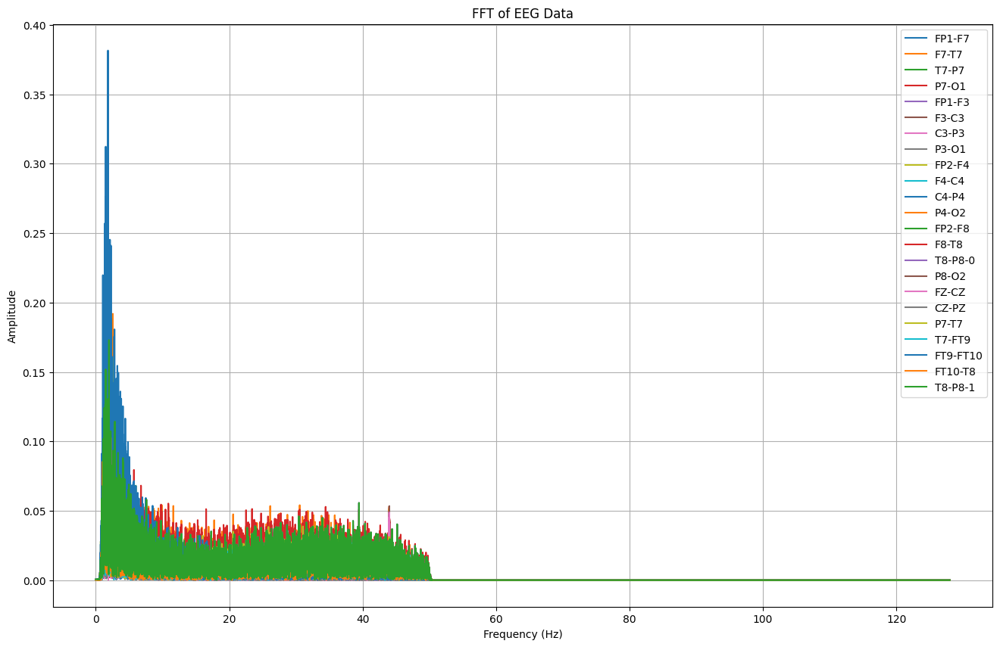

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1        FP1-F3     F3-C3  \
0      0.000363  0.000013  0.000206  0.000029  1.114702e-04  0.000039   
1      0.000377  0.000026  0.000194  0.000020  1.268167e-04  0.000051   
2      0.000379  0.000026  0.000198  0.000016  1.237893e-04  0.000056   
3      0.000375  0.000026  0.000197  0.000016  1.283003e-04  0.000049   
4      0.000380  0.000026  0.000197  0.000023  1.265217e-04  0.000050   
...         ...       ...       ...       ...           ...       ...   
26875  0.000002  0.000007  0.000019  0.000003  9.535630e-07  0.000008   
26876  0.000002  0.000007  0.000019  0.000003  9.535020e-07  0.000008   
26877  0.000002  0.000007  0.000019  0.000003  9.535483e-07  0.000008   
26878  0.000002  0.000007  0.000019  0.000003  9.535232e-07  0.000008   
26879  0.000002  0.000007  0.000019  0.000003  9.535308e-07  0.000008   

          C3-P3     P3-O1        FP2-F4     F4-C4  ...     P8-O2     FZ-

In [ ]:

# Simpan data setelah filtering ke file CSV
TA102 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb17_03.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA102.columns:
        signal = TA102[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_102 = pd.DataFrame(fft_features).T
TA_102.columns = channels
TA_102['seizure'] = TA102['seizure']
TA_102['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_102.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA102[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_102.to_csv("/content/drive/MyDrive/TA/FFT/chb17_03.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_102}")


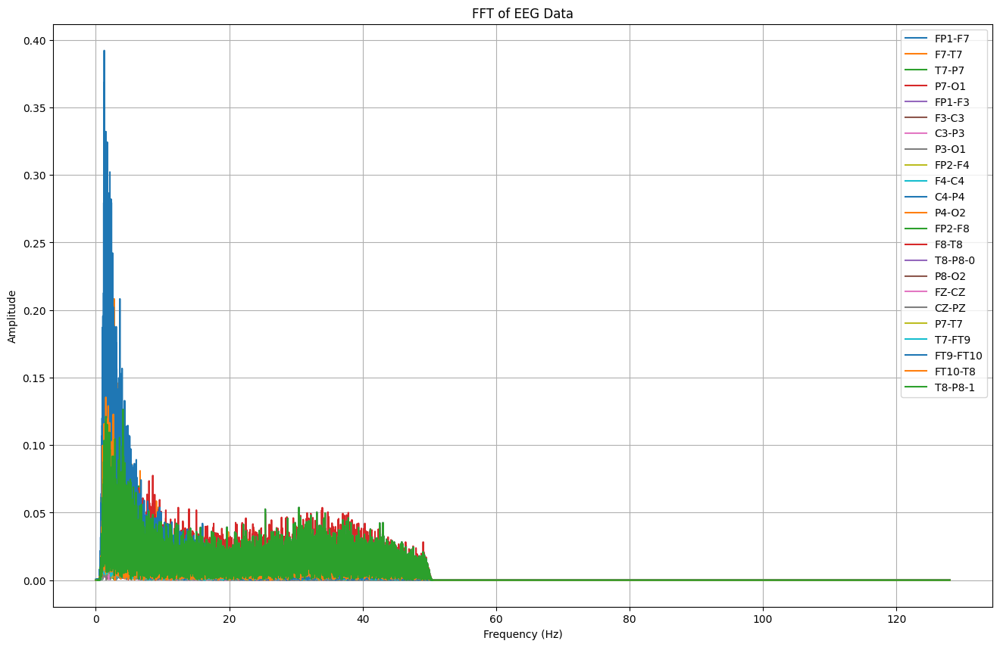

Data setelah FFT berhasil disimpan dalam file CSV:              FP1-F7     F7-T7     T7-P7         P7-O1    FP1-F3     F3-C3  \
0      2.443563e-04  0.000391  0.000472  2.246659e-04  0.000134  0.000109   
1      2.589426e-04  0.000403  0.000457  2.123118e-04  0.000112  0.000121   
2      2.594081e-04  0.000407  0.000462  2.126680e-04  0.000118  0.000128   
3      2.604616e-04  0.000404  0.000457  2.132616e-04  0.000115  0.000124   
4      2.577011e-04  0.000405  0.000461  2.144254e-04  0.000108  0.000115   
...             ...       ...       ...           ...       ...       ...   
30075  1.845651e-07  0.000019  0.000006  5.935779e-07  0.000005  0.000004   
30076  1.847432e-07  0.000019  0.000006  5.935651e-07  0.000005  0.000004   
30077  1.846042e-07  0.000019  0.000006  5.935526e-07  0.000005  0.000004   
30078  1.846965e-07  0.000019  0.000006  5.935634e-07  0.000005  0.000004   
30079  1.846503e-07  0.000019  0.000006  5.935602e-07  0.000005  0.000004   

              C3-P3     

In [ ]:

# Simpan data setelah filtering ke file CSV
TA103 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb17_04.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA103.columns:
        signal = TA103[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_103 = pd.DataFrame(fft_features).T
TA_103.columns = channels
TA_103['seizure'] = TA103['seizure']
TA_103['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_103.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA103[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_103.to_csv("/content/drive/MyDrive/TA/FFT/chb17_04.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_103}")


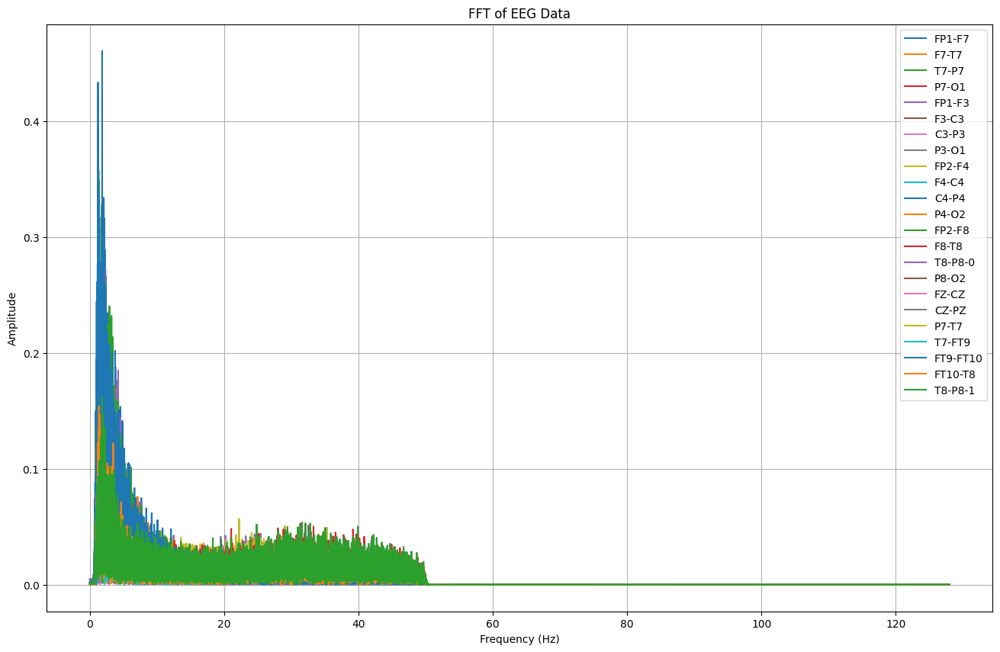

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7         P7-O1    FP1-F3     F3-C3  \
0      0.003836  0.001315  0.000166  1.756318e-05  0.004781  0.000360   
1      0.003813  0.001302  0.000175  8.516961e-06  0.004761  0.000345   
2      0.003817  0.001302  0.000174  5.088684e-06  0.004764  0.000346   
3      0.003809  0.001297  0.000177  7.927979e-06  0.004752  0.000345   
4      0.003804  0.001298  0.000173  1.361260e-05  0.004753  0.000342   
...         ...       ...       ...           ...       ...       ...   
26619  0.000020  0.000035  0.000010  4.798936e-07  0.000045  0.000019   
26620  0.000020  0.000035  0.000010  4.799609e-07  0.000045  0.000019   
26621  0.000020  0.000035  0.000010  4.799505e-07  0.000045  0.000019   
26622  0.000020  0.000035  0.000010  4.799747e-07  0.000045  0.000019   
26623  0.000020  0.000035  0.000010  4.799692e-07  0.000045  0.000019   

          C3-P3     P3-O1    FP2-F4     F4-C4  ...     P8-O2     FZ-CZ  

In [ ]:

# Simpan data setelah filtering ke file CSV
TA104 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb17_63.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA104.columns:
        signal = TA104[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_104 = pd.DataFrame(fft_features).T
TA_104.columns = channels
TA_104['seizure'] = TA104['seizure']
TA_104['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_104.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA104[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_104.to_csv("/content/drive/MyDrive/TA/FFT/chb17_63.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_104}")


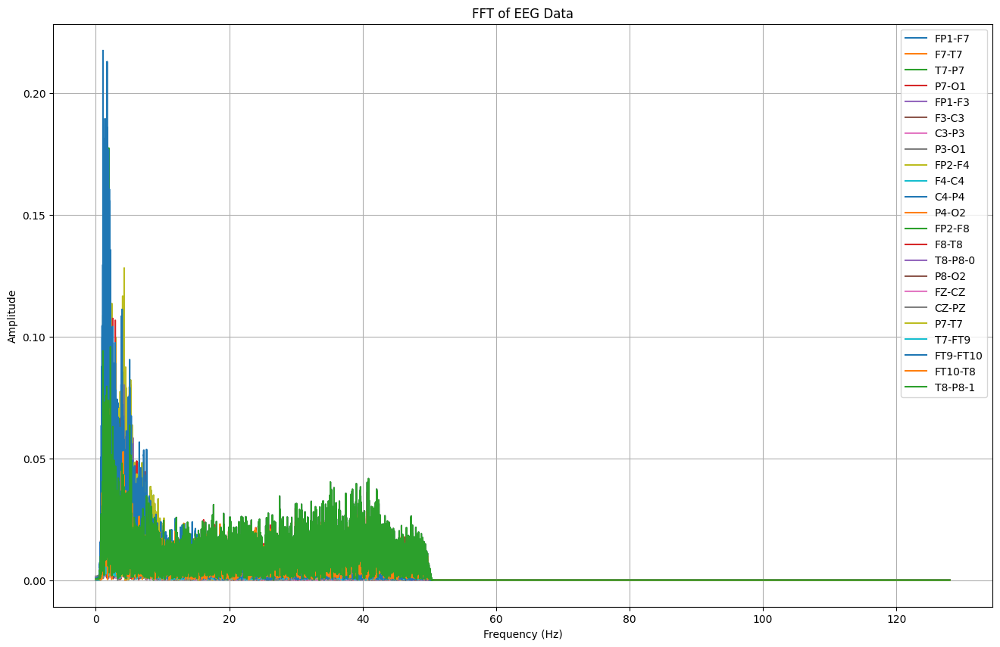

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7         P7-O1    FP1-F3     F3-C3  \
0      0.000622  0.000650  0.000188  2.187133e-04  0.000342  0.000568   
1      0.000609  0.000641  0.000181  2.254398e-04  0.000332  0.000560   
2      0.000607  0.000644  0.000181  2.244239e-04  0.000332  0.000560   
3      0.000612  0.000641  0.000181  2.236341e-04  0.000334  0.000560   
4      0.000605  0.000640  0.000180  2.267162e-04  0.000327  0.000559   
...         ...       ...       ...           ...       ...       ...   
21755  0.000018  0.000003  0.000011  2.362636e-07  0.000018  0.000007   
21756  0.000018  0.000003  0.000011  2.361927e-07  0.000018  0.000007   
21757  0.000018  0.000003  0.000011  2.362386e-07  0.000018  0.000007   
21758  0.000018  0.000003  0.000011  2.361957e-07  0.000018  0.000007   
21759  0.000018  0.000003  0.000011  2.361978e-07  0.000018  0.000007   

          C3-P3     P3-O1    FP2-F4     F4-C4  ...     P8-O2     FZ-CZ  

In [ ]:

# Simpan data setelah filtering ke file CSV
TA105 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb18_29.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA105.columns:
        signal = TA105[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_105 = pd.DataFrame(fft_features).T
TA_105.columns = channels
TA_105['seizure'] = TA105['seizure']
TA_105['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_105.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA105[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_105.to_csv("/content/drive/MyDrive/TA/FFT/chb18_29.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_105}")


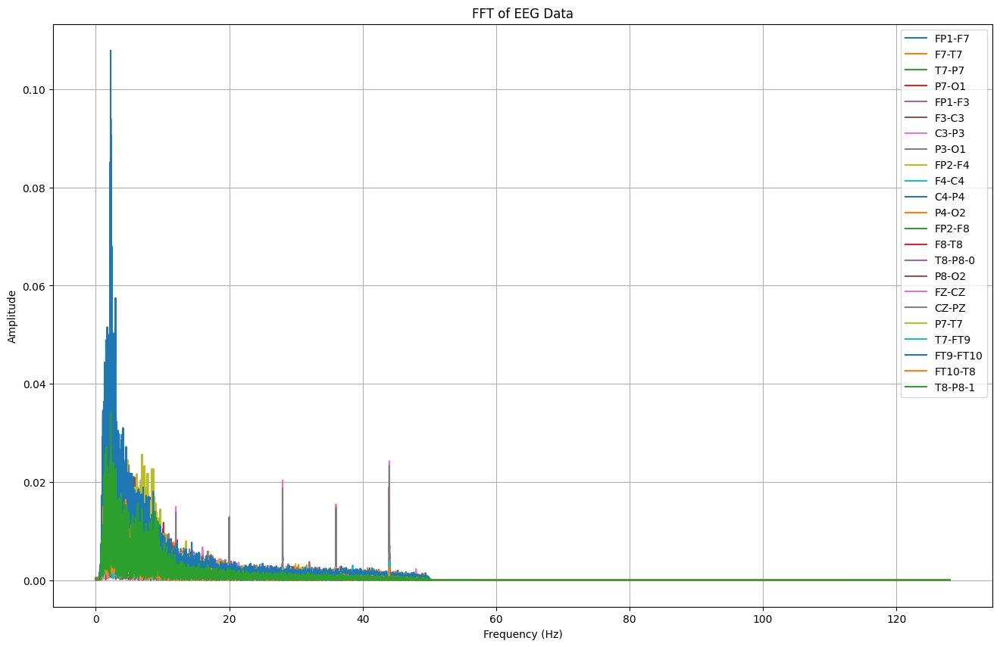

Data setelah FFT berhasil disimpan dalam file CSV:              FP1-F7         F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3  \
0      7.886106e-05  3.602354e-04  0.000339  0.000514  0.000171  0.000252   
1      8.663386e-05  3.680118e-04  0.000332  0.000509  0.000165  0.000259   
2      8.586364e-05  3.678476e-04  0.000331  0.000510  0.000165  0.000258   
3      8.765086e-05  3.679990e-04  0.000332  0.000509  0.000162  0.000258   
4      8.611614e-05  3.713203e-04  0.000331  0.000509  0.000162  0.000259   
...             ...           ...       ...       ...       ...       ...   
19195  5.535041e-07  3.314883e-08  0.000003  0.000016  0.000003  0.000008   
19196  5.534913e-07  3.314461e-08  0.000003  0.000016  0.000003  0.000008   
19197  5.534878e-07  3.313245e-08  0.000003  0.000016  0.000003  0.000008   
19198  5.534956e-07  3.314549e-08  0.000003  0.000016  0.000003  0.000008   
19199  5.534950e-07  3.314030e-08  0.000003  0.000016  0.000003  0.000008   

              C3-P3     

In [ ]:

# Simpan data setelah filtering ke file CSV
TA106 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb18_30.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA106.columns:
        signal = TA106[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_106 = pd.DataFrame(fft_features).T
TA_106.columns = channels
TA_106['seizure'] = TA106['seizure']
TA_106['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_106.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA106[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_106.to_csv("/content/drive/MyDrive/TA/FFT/chb18_30.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_106}")


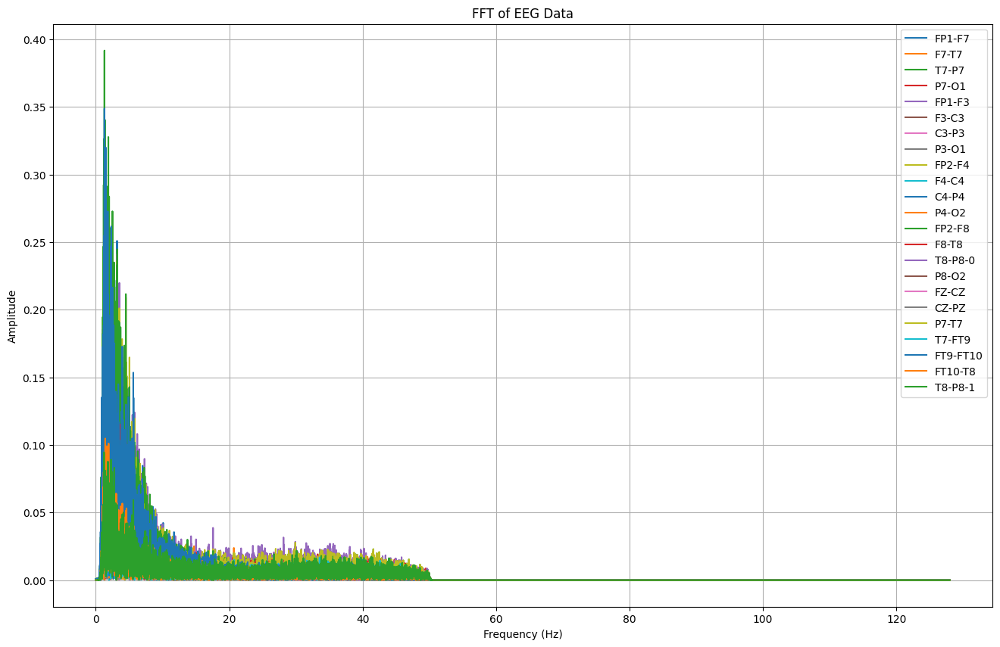

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000264  0.000996  0.000186  0.000226  0.000586  0.000341  0.000192   
1      0.000250  0.001010  0.000195  0.000234  0.000601  0.000354  0.000203   
2      0.000250  0.001011  0.000197  0.000231  0.000605  0.000352  0.000205   
3      0.000249  0.001012  0.000199  0.000228  0.000600  0.000359  0.000202   
4      0.000256  0.001012  0.000193  0.000227  0.000598  0.000351  0.000199   
...         ...       ...       ...       ...       ...       ...       ...   
24059  0.000012  0.000022  0.000019  0.000028  0.000005  0.000002  0.000003   
24060  0.000012  0.000022  0.000019  0.000028  0.000005  0.000002  0.000003   
24061  0.000012  0.000022  0.000019  0.000028  0.000005  0.000002  0.000003   
24062  0.000012  0.000022  0.000019  0.000028  0.000005  0.000002  0.000003   
24063  0.000012  0.000022  0.000019  0.000028  0.000005  0.000002  0.000003   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA107 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb18_31.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA107.columns:
        signal = TA107[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_107 = pd.DataFrame(fft_features).T
TA_107.columns = channels
TA_107['seizure'] = TA107['seizure']
TA_107['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_107.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA107[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_107.to_csv("/content/drive/MyDrive/TA/FFT/chb18_31.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_107}")


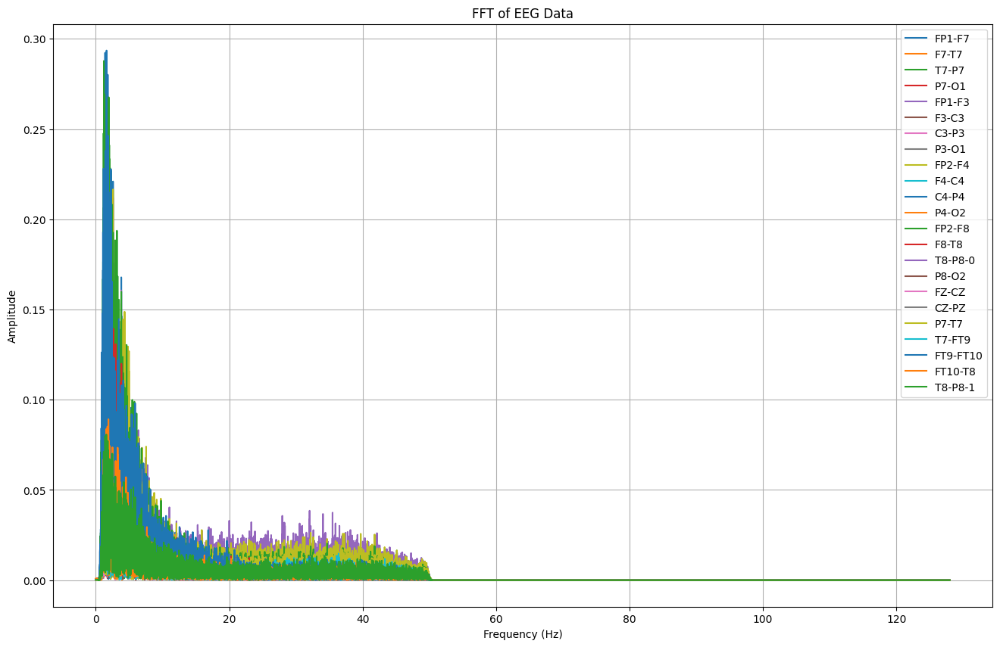

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000284  0.000400  0.000088  0.000311  0.000085  0.000015  0.000081   
1      0.000270  0.000413  0.000080  0.000303  0.000097  0.000027  0.000072   
2      0.000279  0.000416  0.000077  0.000306  0.000095  0.000025  0.000070   
3      0.000266  0.000416  0.000079  0.000306  0.000104  0.000028  0.000071   
4      0.000273  0.000414  0.000081  0.000310  0.000098  0.000026  0.000074   
...         ...       ...       ...       ...       ...       ...       ...   
22395  0.000012  0.000017  0.000013  0.000011  0.000011  0.000007  0.000009   
22396  0.000012  0.000017  0.000013  0.000011  0.000011  0.000007  0.000009   
22397  0.000012  0.000017  0.000013  0.000011  0.000011  0.000007  0.000009   
22398  0.000012  0.000017  0.000013  0.000011  0.000011  0.000007  0.000009   
22399  0.000012  0.000017  0.000013  0.000011  0.000011  0.000007  0.000009   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA108 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb18_32.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA108.columns:
        signal = TA108[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_108 = pd.DataFrame(fft_features).T
TA_108.columns = channels
TA_108['seizure'] = TA108['seizure']
TA_108['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_108.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA108[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_108.to_csv("/content/drive/MyDrive/TA/FFT/chb18_32.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_108}")


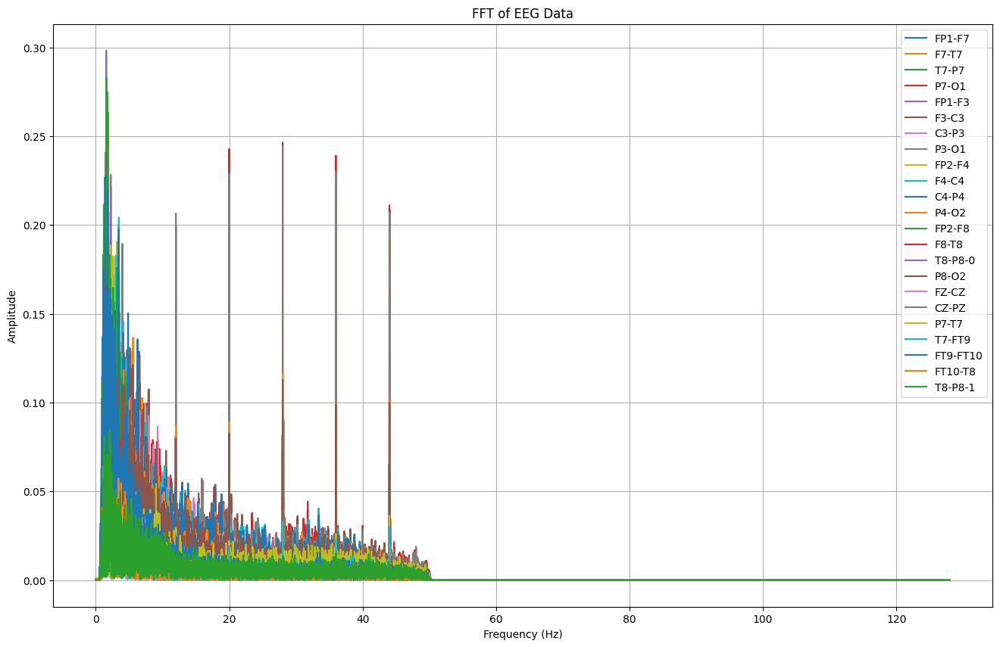

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000229  0.000163  0.000044  0.000268  0.000065  0.000113  0.000032   
1      0.000232  0.000174  0.000052  0.000258  0.000069  0.000126  0.000026   
2      0.000254  0.000167  0.000055  0.000261  0.000087  0.000110  0.000014   
3      0.000225  0.000175  0.000049  0.000257  0.000061  0.000135  0.000040   
4      0.000228  0.000172  0.000057  0.000262  0.000073  0.000111  0.000012   
...         ...       ...       ...       ...       ...       ...       ...   
24059  0.000013  0.000007  0.000009  0.000030  0.000003  0.000005  0.000002   
24060  0.000013  0.000007  0.000009  0.000030  0.000003  0.000005  0.000002   
24061  0.000013  0.000007  0.000009  0.000030  0.000003  0.000005  0.000002   
24062  0.000013  0.000007  0.000009  0.000030  0.000003  0.000005  0.000002   
24063  0.000013  0.000007  0.000009  0.000030  0.000003  0.000005  0.000002   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA109 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb18_35.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA109.columns:
        signal = TA109[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_109 = pd.DataFrame(fft_features).T
TA_109.columns = channels
TA_109['seizure'] = TA109['seizure']
TA_109['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_109.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA109[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_109.to_csv("/content/drive/MyDrive/TA/FFT/chb18_35.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_109}")


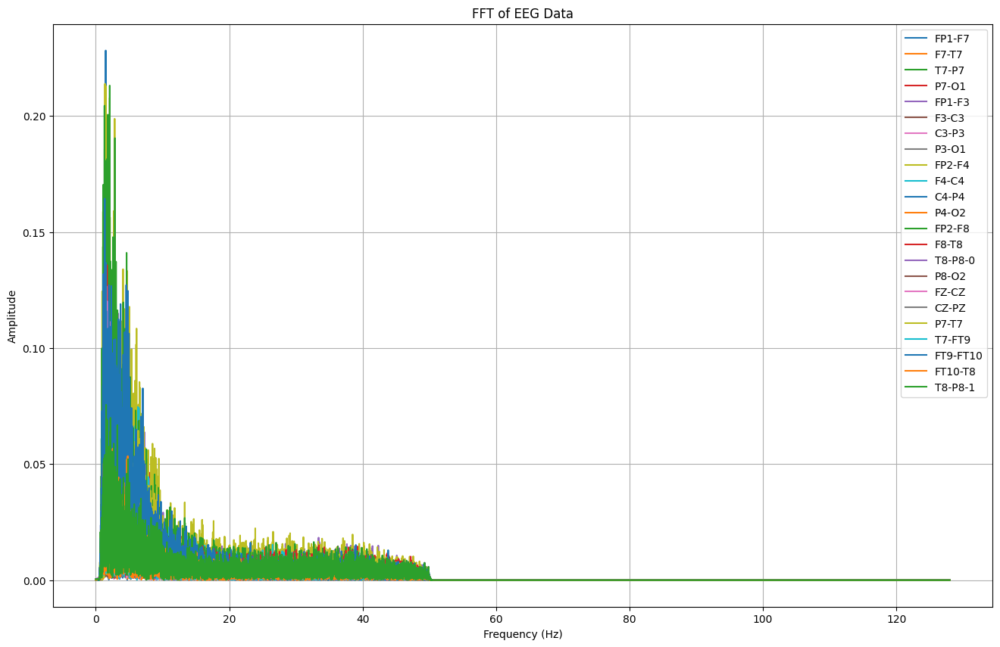

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000108  0.000388  0.000032  0.000304  0.000607  0.000350  0.000077   
1      0.000115  0.000397  0.000025  0.000310  0.000612  0.000359  0.000086   
2      0.000123  0.000399  0.000024  0.000311  0.000625  0.000356  0.000086   
3      0.000103  0.000393  0.000025  0.000309  0.000597  0.000358  0.000085   
4      0.000133  0.000402  0.000022  0.000306  0.000637  0.000358  0.000088   
...         ...       ...       ...       ...       ...       ...       ...   
21243  0.000010  0.000008  0.000005  0.000004  0.000002  0.000005  0.000008   
21244  0.000010  0.000008  0.000005  0.000004  0.000002  0.000005  0.000008   
21245  0.000010  0.000008  0.000005  0.000004  0.000002  0.000005  0.000008   
21246  0.000010  0.000008  0.000005  0.000004  0.000002  0.000005  0.000008   
21247  0.000010  0.000008  0.000005  0.000004  0.000002  0.000005  0.000008   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA110 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb18_36.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA110.columns:
        signal = TA110[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_110 = pd.DataFrame(fft_features).T
TA_110.columns = channels
TA_110['seizure'] = TA110['seizure']
TA_110['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_110.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA110[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_110.to_csv("/content/drive/MyDrive/TA/FFT/chb18_36.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_110}")


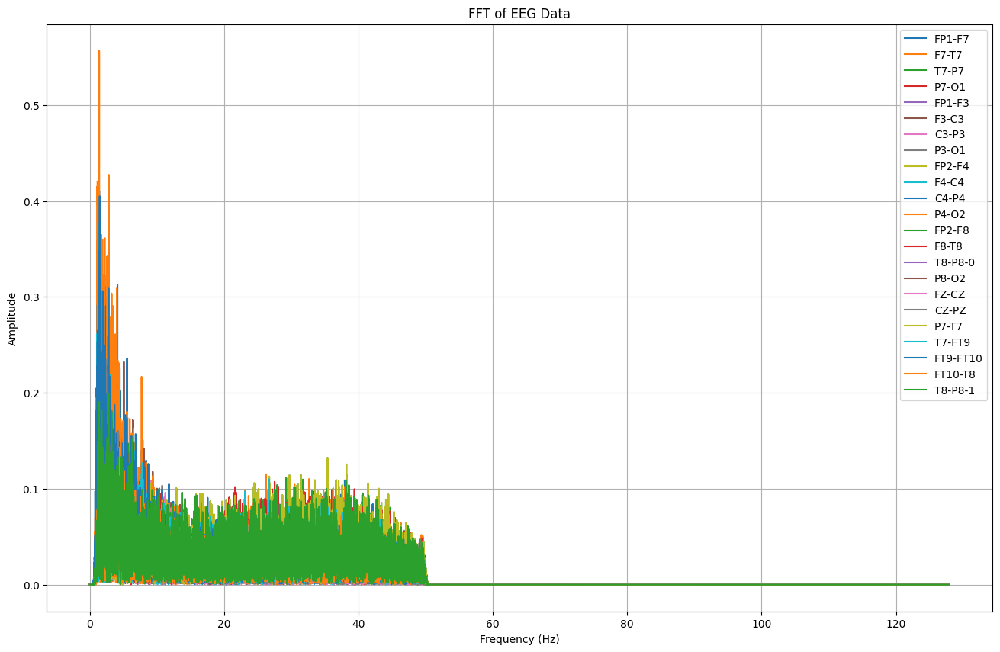

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000282  0.000118  0.001104  0.000571  0.000120  0.000240  0.000058   
1      0.000296  0.000141  0.001098  0.000577  0.000131  0.000253  0.000029   
2      0.000287  0.000153  0.001109  0.000607  0.000130  0.000181  0.000102   
3      0.000302  0.000161  0.001092  0.000587  0.000137  0.000259  0.000023   
4      0.000272  0.000168  0.001087  0.000572  0.000141  0.000207  0.000086   
...         ...       ...       ...       ...       ...       ...       ...   
25339  0.000014  0.000014  0.000013  0.000025  0.000008  0.000034  0.000009   
25340  0.000014  0.000014  0.000013  0.000025  0.000008  0.000034  0.000009   
25341  0.000014  0.000014  0.000013  0.000025  0.000008  0.000034  0.000009   
25342  0.000014  0.000014  0.000013  0.000025  0.000008  0.000034  0.000009   
25343  0.000014  0.000014  0.000013  0.000025  0.000008  0.000034  0.000009   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA111 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb19_28.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA111.columns:
        signal = TA111[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_111 = pd.DataFrame(fft_features).T
TA_111.columns = channels
TA_111['seizure'] = TA111['seizure']
TA_111['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_111.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA111[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_111.to_csv("/content/drive/MyDrive/TA/FFT/chb19_28.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_111}")


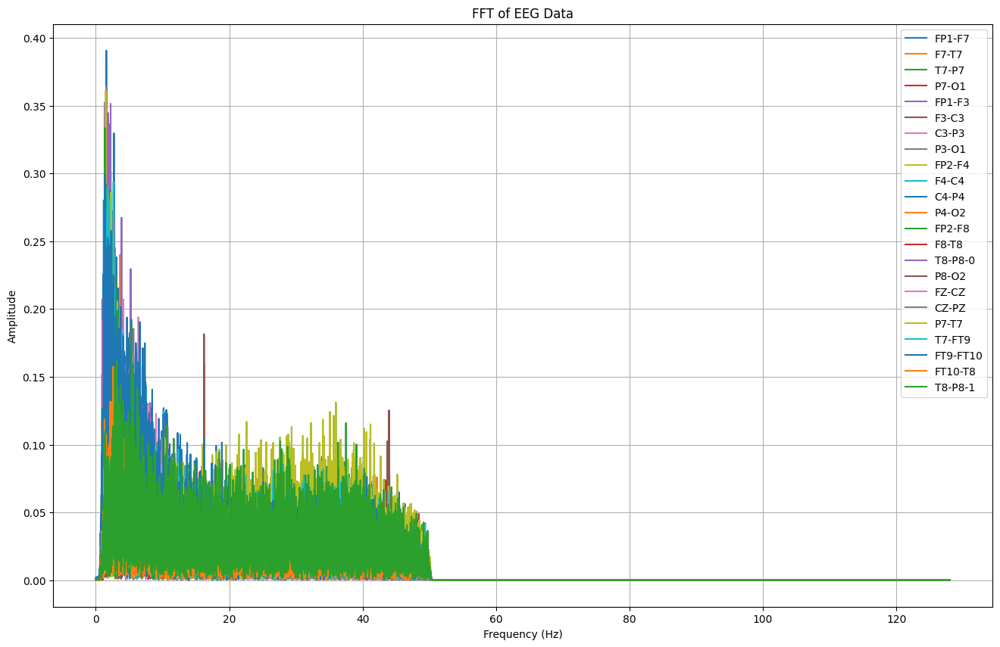

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000165  0.000407  0.000031  0.000517  0.000279  0.000466  0.000040   
1      0.000158  0.000392  0.000020  0.000509  0.000273  0.000446  0.000041   
2      0.000162  0.000401  0.000027  0.000503  0.000299  0.000460  0.000042   
3      0.000116  0.000381  0.000008  0.000512  0.000206  0.000451  0.000044   
4      0.000201  0.000401  0.000029  0.000501  0.000333  0.000459  0.000061   
...         ...       ...       ...       ...       ...       ...       ...   
25211  0.000025  0.000027  0.000011  0.000018  0.000044  0.000004  0.000006   
25212  0.000025  0.000027  0.000011  0.000018  0.000044  0.000004  0.000006   
25213  0.000025  0.000027  0.000011  0.000018  0.000044  0.000004  0.000006   
25214  0.000025  0.000027  0.000011  0.000018  0.000044  0.000004  0.000006   
25215  0.000025  0.000027  0.000011  0.000018  0.000044  0.000004  0.000006   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA112 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb19_29.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA112.columns:
        signal = TA112[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_112 = pd.DataFrame(fft_features).T
TA_112.columns = channels
TA_112['seizure'] = TA112['seizure']
TA_112['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_112.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA112[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_112.to_csv("/content/drive/MyDrive/TA/FFT/chb19_29.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_112}")


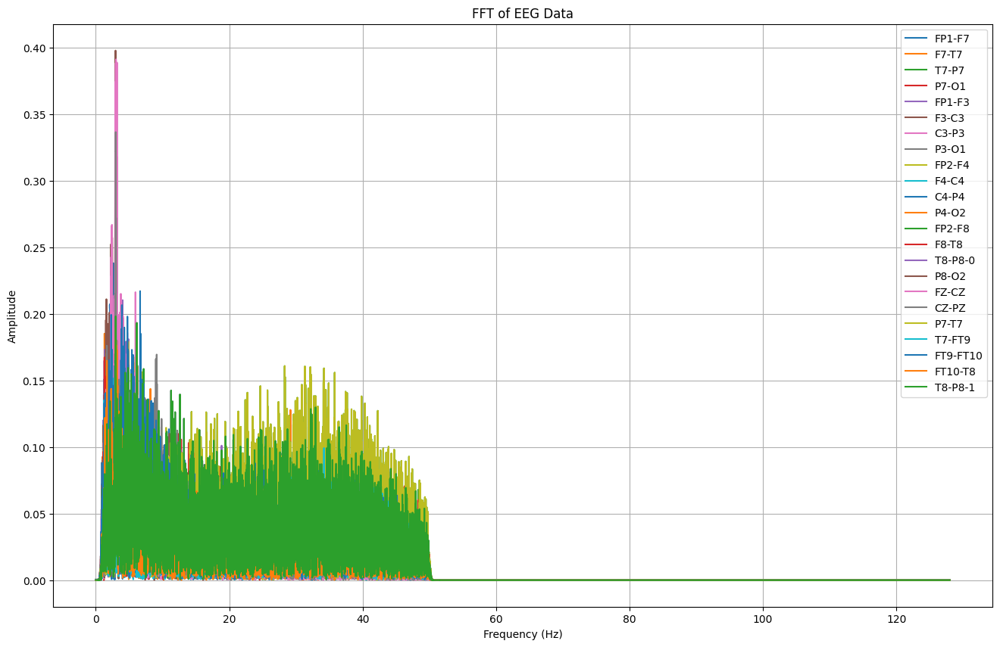

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000328  0.000087  0.000268  0.000005  0.000033  0.000072  0.000422   
1      0.000321  0.000115  0.000258  0.000002  0.000012  0.000067  0.000407   
2      0.000329  0.000133  0.000264  0.000013  0.000031  0.000053  0.000418   
3      0.000277  0.000078  0.000238  0.000006  0.000005  0.000062  0.000384   
4      0.000334  0.000103  0.000267  0.000007  0.000045  0.000051  0.000453   
...         ...       ...       ...       ...       ...       ...       ...   
25723  0.000008  0.000005  0.000017  0.000001  0.000016  0.000002  0.000004   
25724  0.000008  0.000005  0.000017  0.000001  0.000016  0.000002  0.000004   
25725  0.000008  0.000005  0.000017  0.000001  0.000016  0.000002  0.000004   
25726  0.000008  0.000005  0.000017  0.000001  0.000016  0.000002  0.000004   
25727  0.000008  0.000005  0.000017  0.000001  0.000016  0.000002  0.000004   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA113 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb19_30.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA113.columns:
        signal = TA113[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_113 = pd.DataFrame(fft_features).T
TA_113.columns = channels
TA_113['seizure'] = TA113['seizure']
TA_113['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_113.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA113[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_113.to_csv("/content/drive/MyDrive/TA/FFT/chb19_30.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_113}")


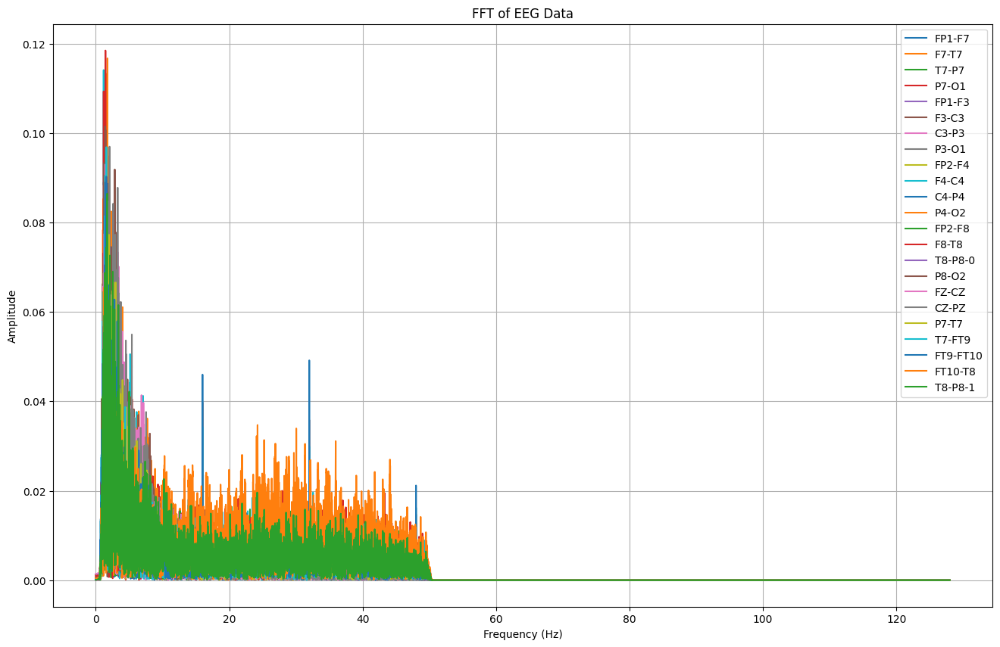

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000216  0.001075  0.000198  0.000504  0.000320  0.001198  0.000039   
1      0.000207  0.001067  0.000191  0.000510  0.000330  0.001188  0.000033   
2      0.000218  0.001065  0.000190  0.000513  0.000325  0.001198  0.000033   
3      0.000195  0.001067  0.000196  0.000511  0.000333  0.001176  0.000035   
4      0.000226  0.001071  0.000187  0.000516  0.000320  0.001206  0.000031   
...         ...       ...       ...       ...       ...       ...       ...   
19067  0.000007  0.000028  0.000025  0.000038  0.000005  0.000030  0.000018   
19068  0.000007  0.000028  0.000025  0.000038  0.000005  0.000030  0.000018   
19069  0.000007  0.000028  0.000025  0.000038  0.000005  0.000030  0.000018   
19070  0.000007  0.000028  0.000025  0.000038  0.000005  0.000030  0.000018   
19071  0.000007  0.000028  0.000025  0.000038  0.000005  0.000030  0.000018   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA114 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb20_12.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA114.columns:
        signal = TA114[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_114 = pd.DataFrame(fft_features).T
TA_114.columns = channels
TA_114['seizure'] = TA114['seizure']
TA_114['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_114.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA114[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_114.to_csv("/content/drive/MyDrive/TA/FFT/chb20_12.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_114}")


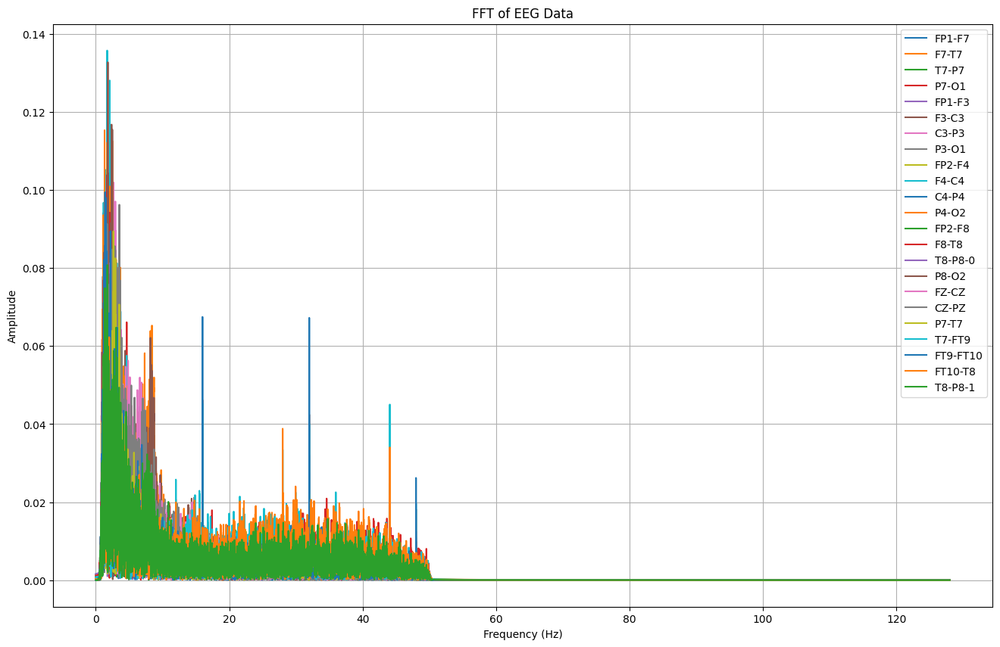

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7         F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3  \
0      0.001523  2.356449e-04  0.000477  0.000126  0.001575  0.000874   
1      0.001520  2.432843e-04  0.000470  0.000109  0.001573  0.000884   
2      0.001511  2.446509e-04  0.000471  0.000131  0.001563  0.000881   
3      0.001532  2.430567e-04  0.000472  0.000096  0.001582  0.000887   
4      0.001508  2.503808e-04  0.000468  0.000166  0.001559  0.000880   
...         ...           ...       ...       ...       ...       ...   
19195  0.000018  5.579881e-07  0.000006  0.000021  0.000003  0.000029   
19196  0.000018  5.579510e-07  0.000006  0.000021  0.000003  0.000029   
19197  0.000018  5.578717e-07  0.000006  0.000021  0.000003  0.000029   
19198  0.000018  5.578153e-07  0.000006  0.000021  0.000003  0.000029   
19199  0.000018  5.577991e-07  0.000006  0.000021  0.000003  0.000029   

          C3-P3     P3-O1    FP2-F4     F4-C4  ...     P8-O2     FZ-CZ  

In [ ]:

# Simpan data setelah filtering ke file CSV
TA115 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb20_13.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA115.columns:
        signal = TA115[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_115 = pd.DataFrame(fft_features).T
TA_115.columns = channels
TA_115['seizure'] = TA115['seizure']
TA_115['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_115.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA115[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_115.to_csv("/content/drive/MyDrive/TA/FFT/chb20_13.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_115}")


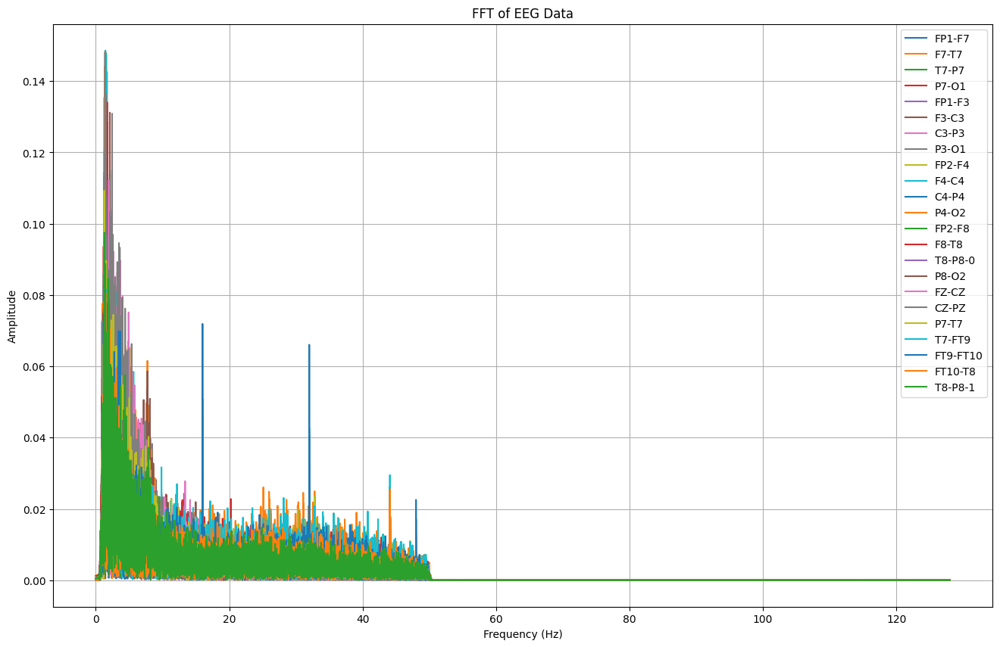

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000330  0.000188  0.000603  0.000613  0.000029  0.000042  0.000006   
1      0.000325  0.000182  0.000611  0.000623  0.000033  0.000052  0.000012   
2      0.000321  0.000178  0.000612  0.000615  0.000044  0.000046  0.000014   
3      0.000321  0.000190  0.000616  0.000616  0.000032  0.000058  0.000010   
4      0.000332  0.000167  0.000602  0.000616  0.000032  0.000045  0.000022   
...         ...       ...       ...       ...       ...       ...       ...   
20347  0.000005  0.000014  0.000012  0.000009  0.000005  0.000002  0.000001   
20348  0.000005  0.000014  0.000012  0.000009  0.000005  0.000002  0.000001   
20349  0.000005  0.000014  0.000012  0.000009  0.000005  0.000002  0.000001   
20350  0.000005  0.000014  0.000012  0.000009  0.000005  0.000002  0.000001   
20351  0.000005  0.000014  0.000012  0.000009  0.000005  0.000002  0.000001   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA115_1 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb20_13_1.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA115_1.columns:
        signal = TA115_1[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_115_1 = pd.DataFrame(fft_features).T
TA_115_1.columns = channels
TA_115_1['seizure'] = TA115_1['seizure']
TA_115_1['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_115_1.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA115_1[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_115_1.to_csv("/content/drive/MyDrive/TA/FFT/chb20_13_1.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_115_1}")


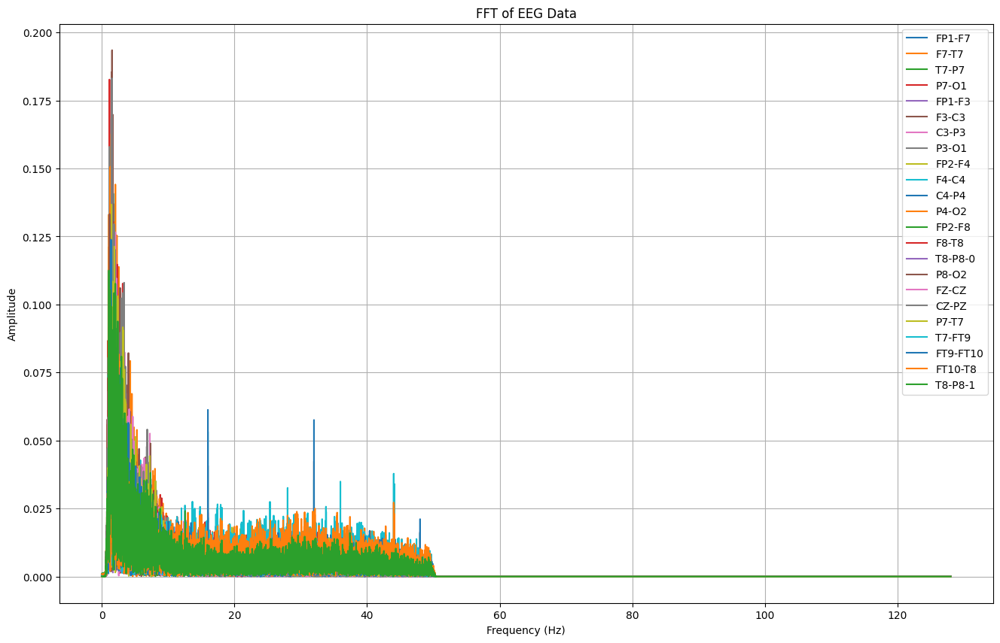

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000340  0.000471  0.000006  0.000103  0.000247  0.000069  0.000147   
1      0.000332  0.000465  0.000013  0.000083  0.000241  0.000060  0.000139   
2      0.000327  0.000461  0.000017  0.000116  0.000231  0.000062  0.000138   
3      0.000340  0.000469  0.000011  0.000120  0.000255  0.000060  0.000141   
4      0.000335  0.000458  0.000016  0.000076  0.000235  0.000064  0.000138   
...         ...       ...       ...       ...       ...       ...       ...   
20219  0.000004  0.000008  0.000002  0.000001  0.000003  0.000009  0.000008   
20220  0.000004  0.000008  0.000002  0.000001  0.000003  0.000009  0.000008   
20221  0.000004  0.000008  0.000002  0.000001  0.000003  0.000009  0.000008   
20222  0.000004  0.000008  0.000002  0.000001  0.000003  0.000009  0.000008   
20223  0.000004  0.000008  0.000002  0.000001  0.000003  0.000009  0.000008   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA116 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb20_14.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA116.columns:
        signal = TA116[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_116 = pd.DataFrame(fft_features).T
TA_116.columns = channels
TA_116['seizure'] = TA116['seizure']
TA_116['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

for channel in channels:
    if channel in TA_116.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA116[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_116.to_csv("/content/drive/MyDrive/TA/FFT/chb20_14.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_116}")


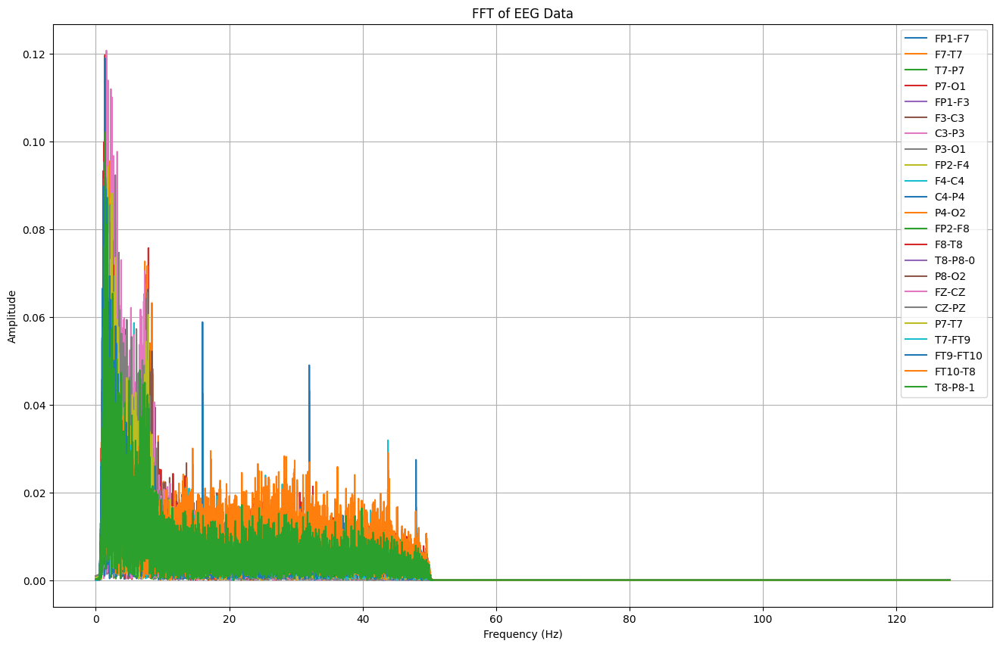

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000753  0.000376  0.000621  0.000035  0.000389  0.000105  0.000773   
1      0.000758  0.000385  0.000630  0.000045  0.000397  0.000098  0.000781   
2      0.000756  0.000381  0.000630  0.000039  0.000392  0.000102  0.000778   
3      0.000761  0.000383  0.000628  0.000057  0.000396  0.000101  0.000788   
4      0.000749  0.000399  0.000632  0.000015  0.000401  0.000093  0.000769   
...         ...       ...       ...       ...       ...       ...       ...   
19835  0.000009  0.000006  0.000006  0.000018  0.000010  0.000020  0.000004   
19836  0.000009  0.000006  0.000006  0.000018  0.000010  0.000020  0.000004   
19837  0.000009  0.000006  0.000006  0.000018  0.000010  0.000020  0.000004   
19838  0.000009  0.000006  0.000006  0.000018  0.000010  0.000020  0.000004   
19839  0.000009  0.000006  0.000006  0.000018  0.000010  0.000020  0.000004   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA117 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb20_15.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA117.columns:
        signal = TA117[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_117 = pd.DataFrame(fft_features).T
TA_117.columns = channels
TA_117['seizure'] = TA117['seizure']
TA_117['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

for channel in channels:
    if channel in TA_117.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA117[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_117.to_csv("/content/drive/MyDrive/TA/FFT/chb20_15.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_117}")


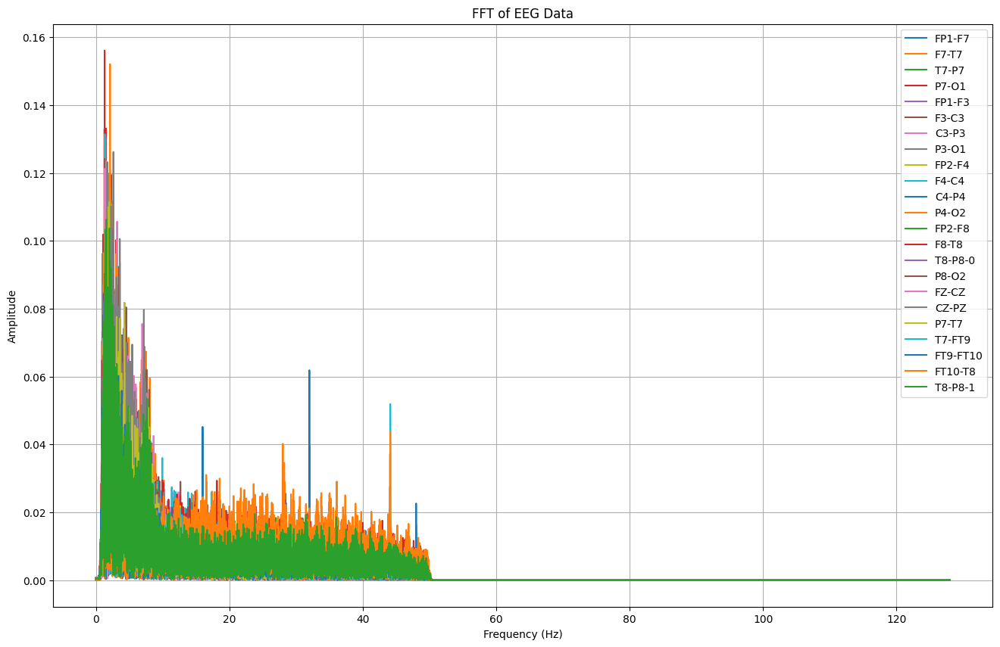

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000643  0.000086  0.000122  0.000744  0.000019  0.000334  0.000273   
1      0.000651  0.000082  0.000110  0.000716  0.000013  0.000329  0.000262   
2      0.000646  0.000075  0.000113  0.000735  0.000010  0.000332  0.000268   
3      0.000655  0.000087  0.000114  0.000744  0.000017  0.000320  0.000267   
4      0.000658  0.000064  0.000113  0.000781  0.000014  0.000327  0.000265   
...         ...       ...       ...       ...       ...       ...       ...   
21627  0.000020  0.000006  0.000009  0.000002  0.000007  0.000015  0.000043   
21628  0.000020  0.000006  0.000009  0.000002  0.000007  0.000015  0.000043   
21629  0.000020  0.000006  0.000009  0.000002  0.000007  0.000015  0.000043   
21630  0.000020  0.000006  0.000009  0.000002  0.000007  0.000015  0.000043   
21631  0.000020  0.000006  0.000009  0.000002  0.000007  0.000015  0.000043   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA117_1 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb20_15_1.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA117_1.columns:
        signal = TA117_1[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_117_1 = pd.DataFrame(fft_features).T
TA_117_1.columns = channels
TA_117_1['seizure'] = TA117_1['seizure']
TA_117_1['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

for channel in channels:
    if channel in TA_117_1.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA117_1[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_117_1.to_csv("/content/drive/MyDrive/TA/FFT/chb20_15_1.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_117_1}")


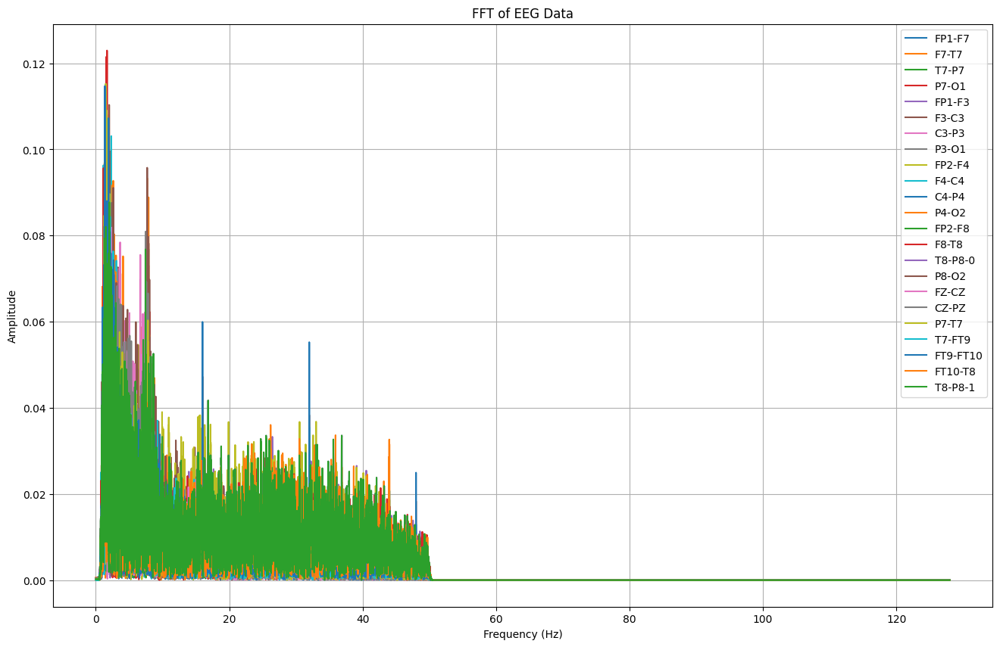

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7         F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3  \
0      0.000133  2.779601e-04  0.000216  0.000465  0.000298  0.000438   
1      0.000132  2.667853e-04  0.000208  0.000461  0.000303  0.000424   
2      0.000125  2.724123e-04  0.000210  0.000481  0.000306  0.000436   
3      0.000152  2.895713e-04  0.000213  0.000486  0.000273  0.000437   
4      0.000119  2.631292e-04  0.000208  0.000478  0.000325  0.000429   
...         ...           ...       ...       ...       ...       ...   
19835  0.000009  6.582598e-07  0.000033  0.000002  0.000019  0.000009   
19836  0.000009  6.582479e-07  0.000033  0.000002  0.000019  0.000009   
19837  0.000009  6.582370e-07  0.000033  0.000002  0.000019  0.000009   
19838  0.000009  6.582571e-07  0.000033  0.000002  0.000019  0.000009   
19839  0.000009  6.582419e-07  0.000033  0.000002  0.000019  0.000009   

          C3-P3     P3-O1    FP2-F4     F4-C4  ...     P8-O2     FZ-CZ  

In [ ]:

# Simpan data setelah filtering ke file CSV
TA118 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb20_16.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA118.columns:
        signal = TA118[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_118 = pd.DataFrame(fft_features).T
TA_118.columns = channels
TA_118['seizure'] = TA118['seizure']
TA_118['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

for channel in channels:
    if channel in TA_118.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA118[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_118.to_csv("/content/drive/MyDrive/TA/FFT/chb20_16.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_118}")


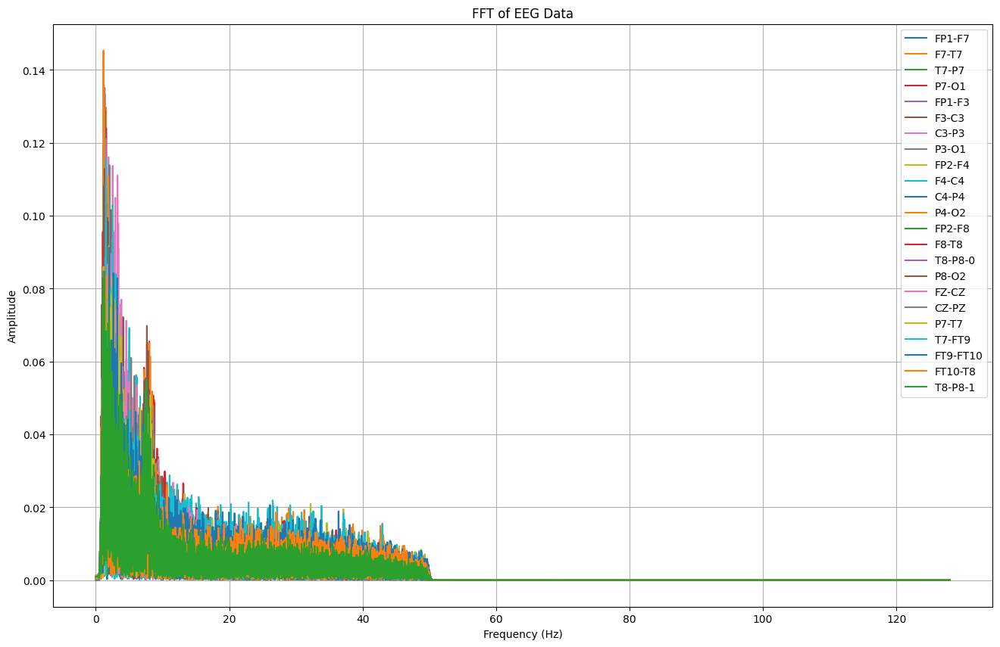

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000991  0.000014  0.001008  0.000819  0.001351  0.000426  0.000131   
1      0.001002  0.000032  0.001020  0.000797  0.001338  0.000424  0.000144   
2      0.001006  0.000042  0.001042  0.000848  0.001330  0.000427  0.000140   
3      0.000987  0.000040  0.001017  0.000823  0.001341  0.000452  0.000118   
4      0.000964  0.000040  0.000973  0.000780  0.001352  0.000468  0.000121   
...         ...       ...       ...       ...       ...       ...       ...   
20347  0.000004  0.000002  0.000009  0.000045  0.000005  0.000015  0.000008   
20348  0.000004  0.000002  0.000009  0.000045  0.000005  0.000015  0.000008   
20349  0.000004  0.000002  0.000009  0.000045  0.000005  0.000015  0.000008   
20350  0.000004  0.000002  0.000009  0.000045  0.000005  0.000015  0.000008   
20351  0.000004  0.000002  0.000009  0.000045  0.000005  0.000015  0.000008   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA119 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb20_68.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA119.columns:
        signal = TA119[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_119 = pd.DataFrame(fft_features).T
TA_119.columns = channels
TA_119['seizure'] = TA119['seizure']
TA_119['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

for channel in channels:
    if channel in TA_119.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA119[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_119.to_csv("/content/drive/MyDrive/TA/FFT/chb20_68.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_119}")


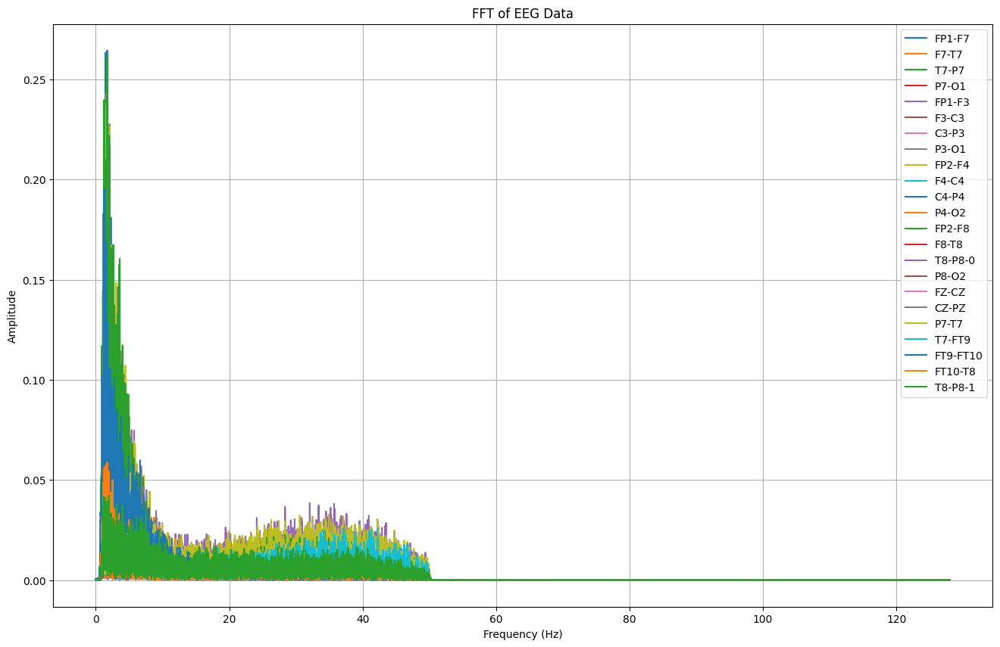

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000675  0.000085  0.000216  0.000230  0.000576  0.000014  0.000194   
1      0.000682  0.000093  0.000209  0.000224  0.000583  0.000007  0.000186   
2      0.000687  0.000094  0.000209  0.000225  0.000587  0.000007  0.000186   
3      0.000684  0.000091  0.000211  0.000223  0.000583  0.000008  0.000187   
4      0.000686  0.000097  0.000210  0.000223  0.000588  0.000005  0.000186   
...         ...       ...       ...       ...       ...       ...       ...   
22523  0.000002  0.000010  0.000007  0.000016  0.000010  0.000020  0.000001   
22524  0.000002  0.000010  0.000007  0.000016  0.000010  0.000020  0.000001   
22525  0.000002  0.000010  0.000007  0.000016  0.000010  0.000020  0.000001   
22526  0.000002  0.000010  0.000007  0.000016  0.000010  0.000020  0.000001   
22527  0.000002  0.000010  0.000007  0.000016  0.000010  0.000020  0.000001   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA120 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb21_19.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA120.columns:
        signal = TA120[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_120 = pd.DataFrame(fft_features).T
TA_120.columns = channels
TA_120['seizure'] = TA120['seizure']
TA_120['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

for channel in channels:
    if channel in TA_120.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA120[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_120.to_csv("/content/drive/MyDrive/TA/FFT/chb21_19.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_120}")


# 121 - 140

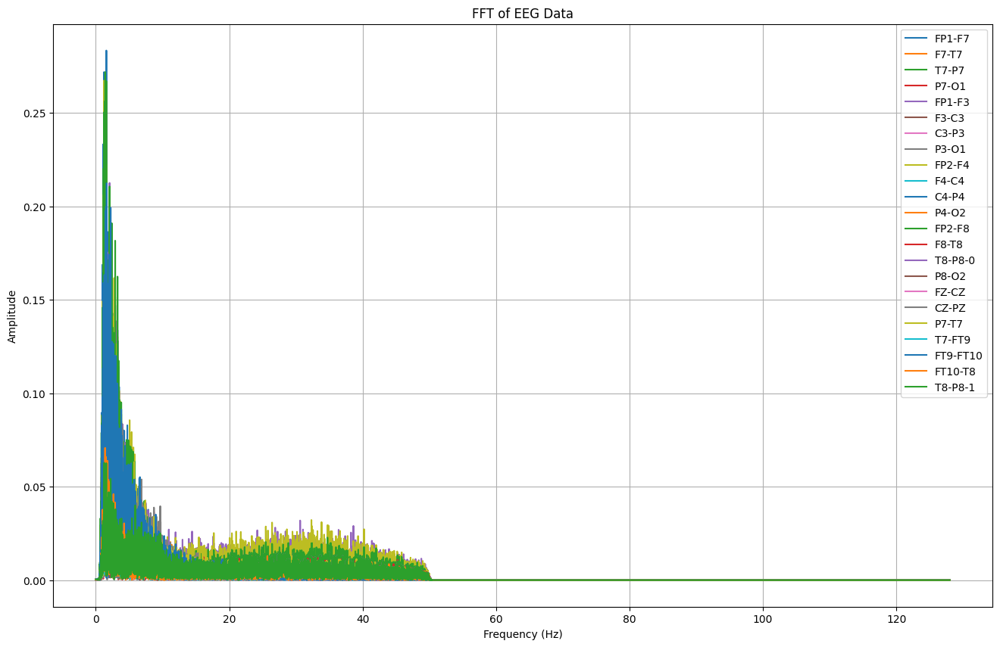

Data setelah FFT berhasil disimpan dalam file CSV:              FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3  \
0      3.873961e-04  0.000580  0.000348  0.000009  0.000083  0.000210   
1      3.788735e-04  0.000590  0.000343  0.000003  0.000074  0.000218   
2      3.787371e-04  0.000590  0.000343  0.000003  0.000074  0.000219   
3      3.794067e-04  0.000590  0.000341  0.000005  0.000075  0.000218   
4      3.700701e-04  0.000594  0.000340  0.000003  0.000064  0.000221   
...             ...       ...       ...       ...       ...       ...   
21755  5.803998e-07  0.000019  0.000016  0.000008  0.000006  0.000006   
21756  5.803902e-07  0.000019  0.000016  0.000008  0.000006  0.000006   
21757  5.803437e-07  0.000019  0.000016  0.000008  0.000006  0.000006   
21758  5.803787e-07  0.000019  0.000016  0.000008  0.000006  0.000006   
21759  5.803632e-07  0.000019  0.000016  0.000008  0.000006  0.000006   

          C3-P3     P3-O1    FP2-F4     F4-C4  ...     P8-O2     FZ-CZ  

In [ ]:

# Simpan data setelah filtering ke file CSV
TA121 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb21_20.csv")

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA121.columns:
        signal = TA121[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_121 = pd.DataFrame(fft_features).T
TA_121.columns = channels
TA_121['seizure'] = TA121['seizure']
TA_121['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

for channel in channels:
    if channel in TA_121.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA121[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_121.to_csv("/content/drive/MyDrive/TA/FFT/chb21_20.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_121}")


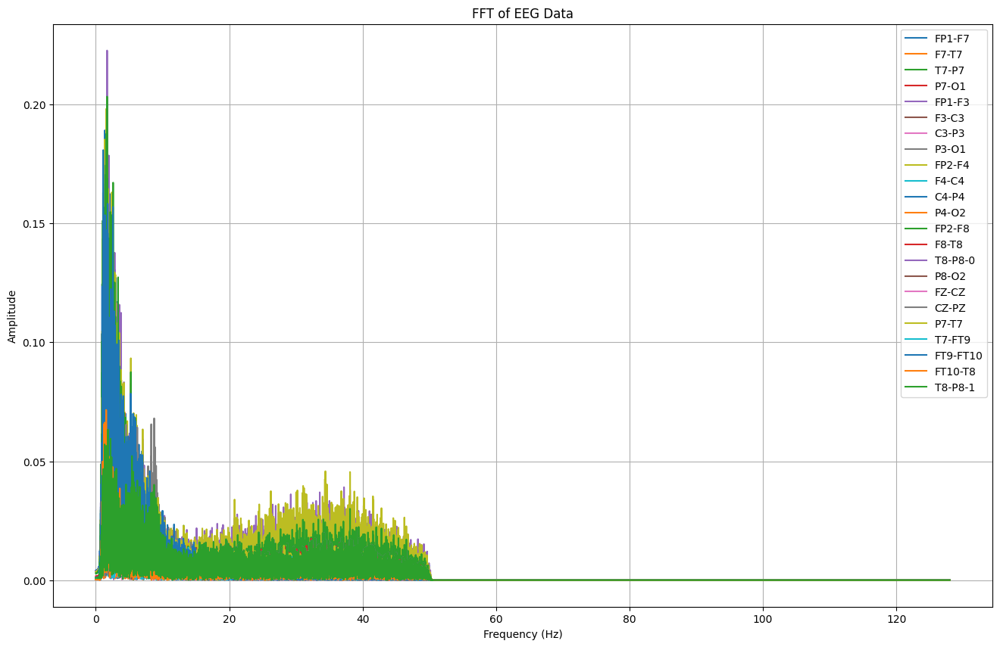

Data setelah FFT berhasil disimpan dalam file CSV:              FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3  \
0      4.061487e-03  0.000875  0.000790  0.000270  0.003725  0.000790   
1      4.069555e-03  0.000886  0.000799  0.000275  0.003734  0.000799   
2      4.068576e-03  0.000885  0.000797  0.000275  0.003732  0.000799   
3      4.063800e-03  0.000885  0.000797  0.000280  0.003728  0.000799   
4      4.086488e-03  0.000884  0.000799  0.000288  0.003752  0.000800   
...             ...       ...       ...       ...       ...       ...   
25723  6.866925e-07  0.000009  0.000035  0.000013  0.000003  0.000022   
25724  6.866867e-07  0.000009  0.000035  0.000013  0.000003  0.000022   
25725  6.867115e-07  0.000009  0.000035  0.000013  0.000003  0.000022   
25726  6.867702e-07  0.000009  0.000035  0.000013  0.000003  0.000022   
25727  6.867257e-07  0.000009  0.000035  0.000013  0.000003  0.000022   

          C3-P3     P3-O1    FP2-F4     F4-C4  ...     P8-O2     FZ-CZ  

In [ ]:

# Simpan data setelah filtering ke file CSV
TA122 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb21_21.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA122.columns:
        signal = TA122[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_122 = pd.DataFrame(fft_features).T
TA_122.columns = channels
TA_122['seizure'] = TA122['seizure']
TA_122['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

for channel in channels:
    if channel in TA_122.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA122[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_122.to_csv("/content/drive/MyDrive/TA/FFT/chb21_21.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_122}")


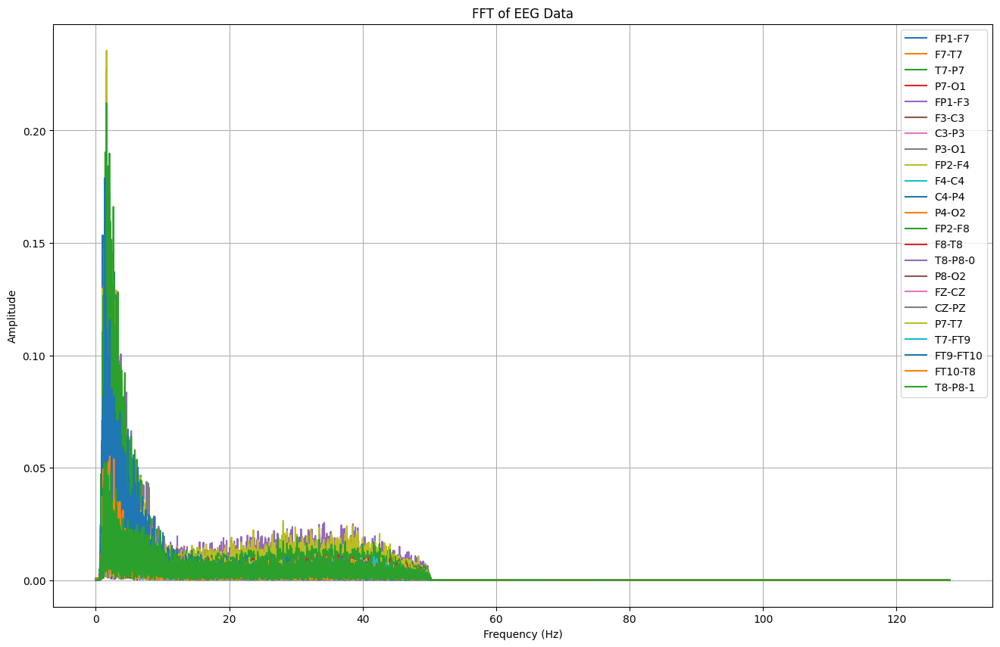

Data setelah FFT berhasil disimpan dalam file CSV:              FP1-F7         F7-T7         T7-P7     P7-O1    FP1-F3     F3-C3  \
0      5.957919e-04  4.186565e-04  3.780401e-04  0.000093  0.000667  0.000327   
1      5.881916e-04  4.115256e-04  3.826637e-04  0.000084  0.000660  0.000321   
2      5.848656e-04  4.101548e-04  3.825492e-04  0.000088  0.000658  0.000319   
3      5.840262e-04  4.086278e-04  3.863849e-04  0.000099  0.000652  0.000318   
4      5.955241e-04  4.130629e-04  3.799711e-04  0.000072  0.000667  0.000321   
...             ...           ...           ...       ...       ...       ...   
16891  1.694959e-07  1.251669e-07  3.069584e-07  0.000002  0.000011  0.000002   
16892  1.696345e-07  1.251961e-07  3.069492e-07  0.000002  0.000011  0.000002   
16893  1.695986e-07  1.252078e-07  3.069706e-07  0.000002  0.000011  0.000002   
16894  1.695619e-07  1.252207e-07  3.069619e-07  0.000002  0.000011  0.000002   
16895  1.695544e-07  1.251936e-07  3.069280e-07  0.000002 

In [ ]:

# Simpan data setelah filtering ke file CSV
TA123 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb21_22.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA123.columns:
        signal = TA123[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_123 = pd.DataFrame(fft_features).T
TA_123.columns = channels
TA_123['seizure'] = TA123['seizure']
TA_123['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

for channel in channels:
    if channel in TA_123.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA123[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_123.to_csv("/content/drive/MyDrive/TA/FFT/chb21_22.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_123}")


In [ ]:

# Simpan data setelah filtering ke file CSV
TA124 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb22_20.csv", index)

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA124.columns:
        signal = TA124[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_124 = pd.DataFrame(fft_features).T
TA_124.columns = channels
TA_124['seizure'] = TA124['seizure']
TA_124['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

for channel in channels:
    if channel in TA_124.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA124[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_124.to_csv("/content/drive/MyDrive/TA/FFT/chb22_20.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_124}")


NameError: name 'index' is not defined

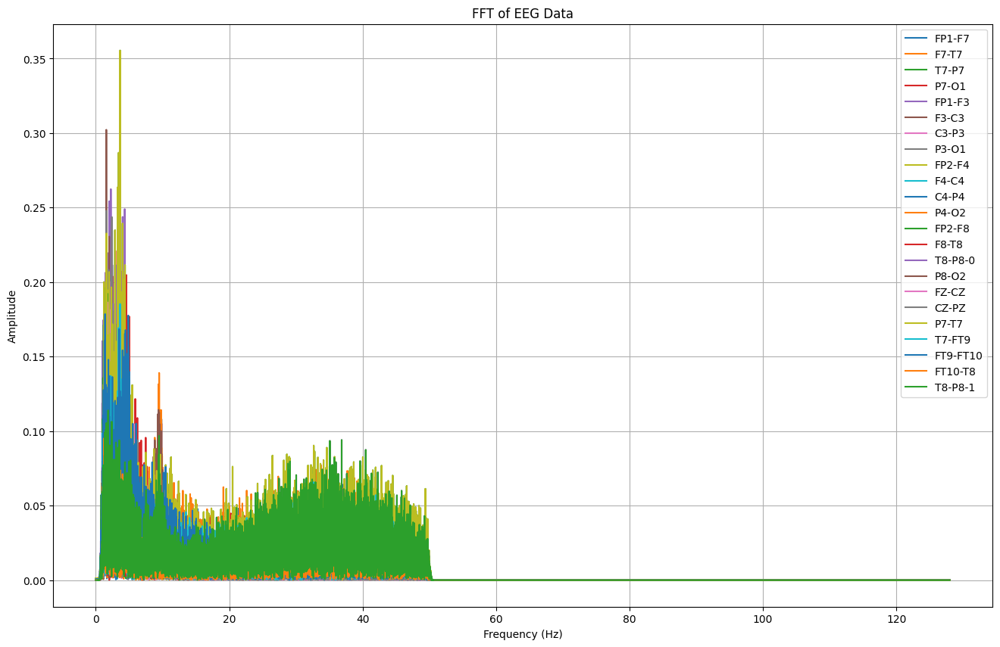

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3  \
0      0.000729  0.000233  0.001321  0.000014  0.000441  0.000305   
1      0.000714  0.000221  0.001328  0.000002  0.000457  0.000297   
2      0.000718  0.000213  0.001332  0.000010  0.000456  0.000291   
3      0.000715  0.000221  0.001334  0.000009  0.000462  0.000298   
4      0.000700  0.000228  0.001348  0.000019  0.000455  0.000271   
...         ...       ...       ...       ...       ...       ...   
25211  0.000017  0.000016  0.000057  0.000035  0.000004  0.000015   
25212  0.000017  0.000016  0.000057  0.000035  0.000004  0.000015   
25213  0.000017  0.000016  0.000057  0.000035  0.000004  0.000015   
25214  0.000017  0.000016  0.000057  0.000035  0.000004  0.000015   
25215  0.000017  0.000016  0.000057  0.000035  0.000004  0.000015   

              C3-P3     P3-O1    FP2-F4     F4-C4  ...     P8-O2  \
0      8.645287e-05  0.000290  0.000367  0.000066  .

In [ ]:

# Simpan data setelah filtering ke file CSV
TA125 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb22_25.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA125.columns:
        signal = TA125[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_125 = pd.DataFrame(fft_features).T
TA_125.columns = channels
TA_125['seizure'] = TA125['seizure']
TA_125['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

for channel in channels:
    if channel in TA_125.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA125[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_125.to_csv("/content/drive/MyDrive/TA/FFT/chb22_25.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_125}")


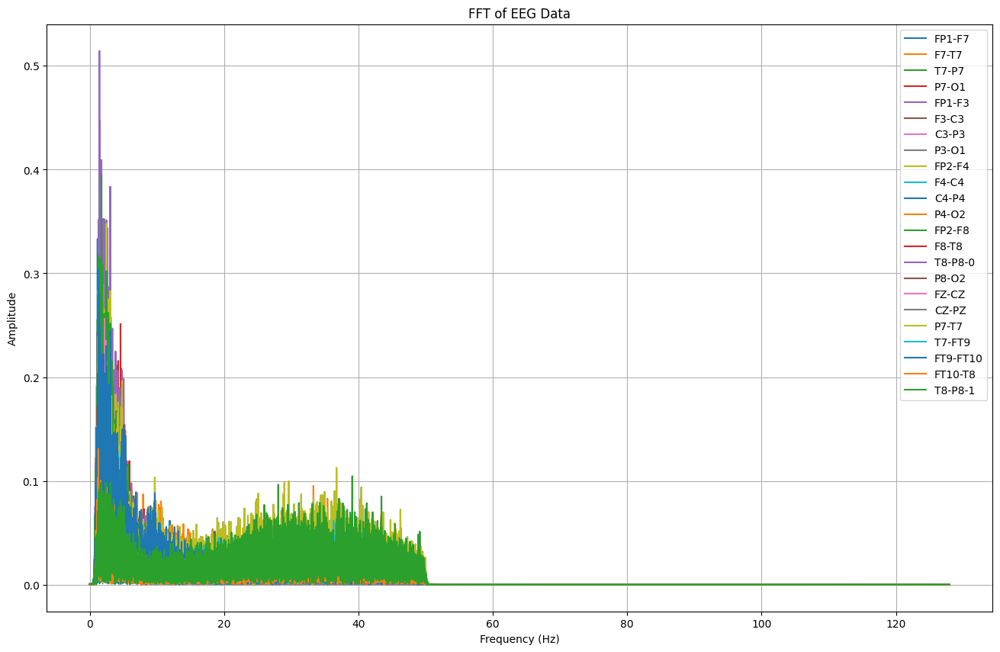

Data setelah FFT berhasil disimpan dalam file CSV:              FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3  \
0      4.352430e-07  0.000400  0.000343  0.000672  0.000662  0.000318   
1      1.292896e-05  0.000388  0.000343  0.000690  0.000645  0.000312   
2      1.924052e-05  0.000380  0.000333  0.000698  0.000637  0.000310   
3      1.534828e-05  0.000375  0.000326  0.000710  0.000640  0.000300   
4      2.194177e-05  0.000363  0.000318  0.000699  0.000653  0.000285   
...             ...       ...       ...       ...       ...       ...   
24571  5.191784e-05  0.000052  0.000159  0.000006  0.000026  0.000022   
24572  5.191841e-05  0.000052  0.000159  0.000006  0.000026  0.000022   
24573  5.191858e-05  0.000052  0.000159  0.000006  0.000026  0.000022   
24574  5.191843e-05  0.000052  0.000159  0.000006  0.000026  0.000022   
24575  5.191850e-05  0.000052  0.000159  0.000006  0.000026  0.000022   

          C3-P3     P3-O1    FP2-F4     F4-C4  ...     P8-O2     FZ-CZ  

In [ ]:

# Simpan data setelah filtering ke file CSV
TA126 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb22_38.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA126.columns:
        signal = TA126[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_126 = pd.DataFrame(fft_features).T
TA_126.columns = channels
TA_126['seizure'] = TA126['seizure']
TA_126['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

for channel in channels:
    if channel in TA_126.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA126[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_126.to_csv("/content/drive/MyDrive/TA/FFT/chb22_38.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_126}")


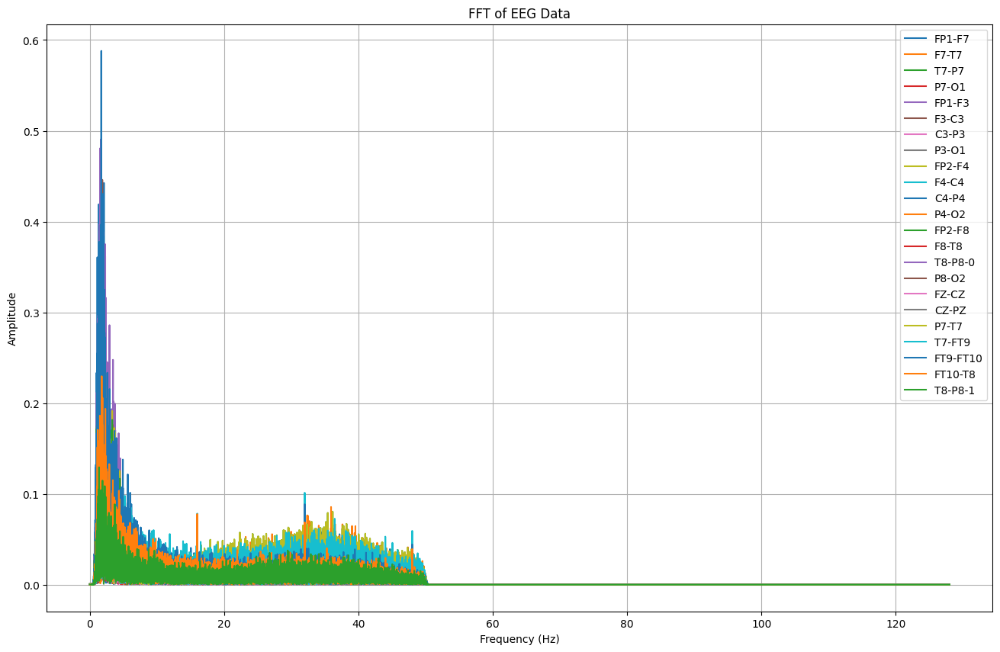

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3  \
0      0.000593  0.000597  0.000798  0.000236  0.000090  0.000335   
1      0.000599  0.000583  0.000789  0.000226  0.000080  0.000328   
2      0.000608  0.000586  0.000789  0.000222  0.000081  0.000321   
3      0.000619  0.000584  0.000792  0.000230  0.000052  0.000335   
4      0.000590  0.000573  0.000795  0.000226  0.000094  0.000317   
...         ...       ...       ...       ...       ...       ...   
29819  0.000012  0.000023  0.000017  0.000014  0.000006  0.000001   
29820  0.000012  0.000023  0.000017  0.000014  0.000006  0.000001   
29821  0.000012  0.000023  0.000017  0.000014  0.000006  0.000001   
29822  0.000012  0.000023  0.000017  0.000014  0.000006  0.000001   
29823  0.000012  0.000023  0.000017  0.000014  0.000006  0.000001   

              C3-P3     P3-O1    FP2-F4     F4-C4  ...         P8-O2  \
0      3.086436e-04  0.000292  0.000356  0.00006

In [ ]:

# Simpan data setelah filtering ke file CSV
TA127 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb23_06.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA127.columns:
        signal = TA127[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_127 = pd.DataFrame(fft_features).T
TA_127.columns = channels
TA_127['seizure'] = TA127['seizure']
TA_127['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

for channel in channels:
    if channel in TA_127.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA127[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_127.to_csv("/content/drive/MyDrive/TA/FFT/chb23_06.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_127}")


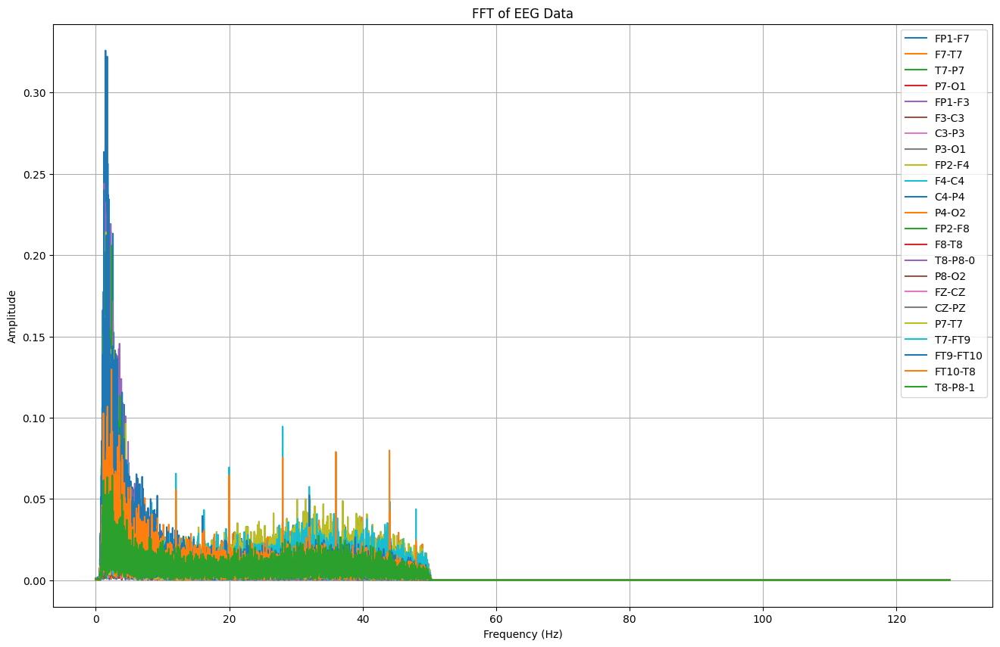

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7         P7-O1    FP1-F3     F3-C3  \
0      0.001343  0.000054  0.000188  9.320038e-05  0.001033  0.000015   
1      0.001337  0.000044  0.000197  9.932076e-05  0.001024  0.000009   
2      0.001336  0.000038  0.000187  9.891838e-05  0.001027  0.000007   
3      0.001327  0.000048  0.000191  1.028657e-04  0.001020  0.000008   
4      0.001328  0.000050  0.000200  9.974938e-05  0.001012  0.000016   
...         ...       ...       ...           ...       ...       ...   
17915  0.000013  0.000008  0.000005  7.393523e-07  0.000022  0.000011   
17916  0.000013  0.000008  0.000005  7.393332e-07  0.000022  0.000011   
17917  0.000013  0.000008  0.000005  7.393509e-07  0.000022  0.000011   
17918  0.000013  0.000008  0.000005  7.393330e-07  0.000022  0.000011   
17919  0.000013  0.000008  0.000005  7.393560e-07  0.000022  0.000011   

          C3-P3     P3-O1    FP2-F4         F4-C4  ...     P8-O2  \
0   

In [ ]:

# Simpan data setelah filtering ke file CSV
TA128 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb23_08.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA128.columns:
        signal = TA128[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_128 = pd.DataFrame(fft_features).T
TA_128.columns = channels
TA_128['seizure'] = TA128['seizure']
TA_128['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

for channel in channels:
    if channel in TA_128.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA128[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_128.to_csv("/content/drive/MyDrive/TA/FFT/chb23_08.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_128}")


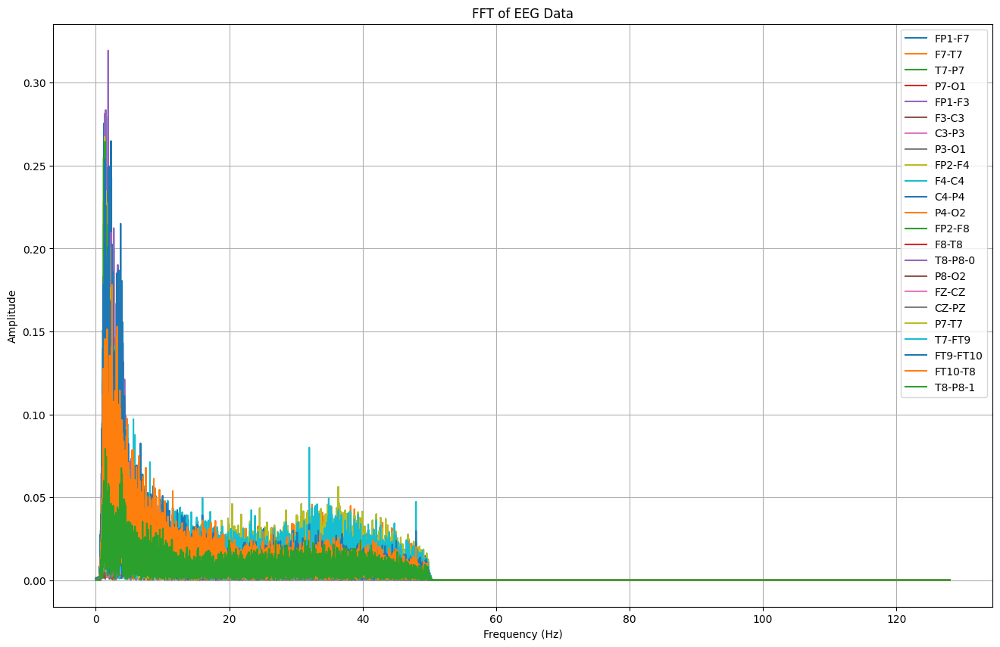

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7         T7-P7     P7-O1    FP1-F3     F3-C3  \
0      0.001360  0.000095  9.023112e-05  0.000216  0.000742  0.000261   
1      0.001367  0.000083  8.224985e-05  0.000209  0.000750  0.000268   
2      0.001375  0.000083  8.719464e-05  0.000208  0.000755  0.000269   
3      0.001369  0.000091  8.353184e-05  0.000210  0.000748  0.000265   
4      0.001373  0.000089  8.681138e-05  0.000212  0.000750  0.000268   
...         ...       ...           ...       ...       ...       ...   
21371  0.000004  0.000003  8.163019e-07  0.000022  0.000005  0.000001   
21372  0.000004  0.000003  8.170097e-07  0.000022  0.000005  0.000001   
21373  0.000004  0.000003  8.163404e-07  0.000022  0.000005  0.000001   
21374  0.000004  0.000003  8.168403e-07  0.000022  0.000005  0.000001   
21375  0.000004  0.000003  8.165743e-07  0.000022  0.000005  0.000001   

          C3-P3     P3-O1    FP2-F4     F4-C4  ...     P8-O2     FZ-CZ  

In [ ]:

# Simpan data setelah filtering ke file CSV
TA128_1 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb23_08_1.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA128_1.columns:
        signal = TA128_1[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_128_1 = pd.DataFrame(fft_features).T
TA_128_1.columns = channels
TA_128_1['seizure'] = TA128_1['seizure']
TA_128_1['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

for channel in channels:
    if channel in TA_128_1.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA128_1[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_128_1.to_csv("/content/drive/MyDrive/TA/FFT/chb23_08_1.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_128_1}")


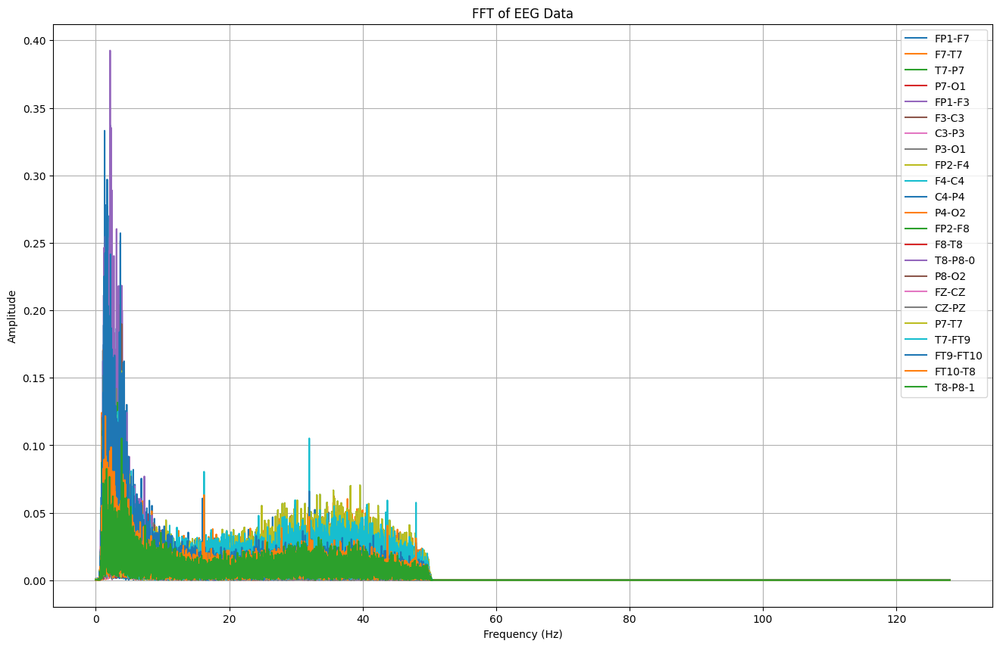

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.001079  0.000147  0.000564  0.000118  0.000814  0.000221  0.000066   
1      0.001071  0.000133  0.000571  0.000124  0.000808  0.000232  0.000074   
2      0.001066  0.000133  0.000568  0.000134  0.000807  0.000236  0.000082   
3      0.001053  0.000151  0.000574  0.000122  0.000775  0.000206  0.000071   
4      0.001070  0.000130  0.000561  0.000118  0.000843  0.000260  0.000076   
...         ...       ...       ...       ...       ...       ...       ...   
24443  0.000045  0.000025  0.000020  0.000008  0.000015  0.000019  0.000005   
24444  0.000045  0.000025  0.000020  0.000008  0.000015  0.000019  0.000005   
24445  0.000045  0.000025  0.000020  0.000008  0.000015  0.000019  0.000005   
24446  0.000045  0.000025  0.000020  0.000008  0.000015  0.000019  0.000005   
24447  0.000045  0.000025  0.000020  0.000008  0.000015  0.000019  0.000005   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA129 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb23_09.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA129.columns:
        signal = TA129[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_129 = pd.DataFrame(fft_features).T
TA_129.columns = channels
TA_129['seizure'] = TA129['seizure']
TA_129['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

for channel in channels:
    if channel in TA_129.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA129[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_129.to_csv("/content/drive/MyDrive/TA/FFT/chb23_09.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_129}")


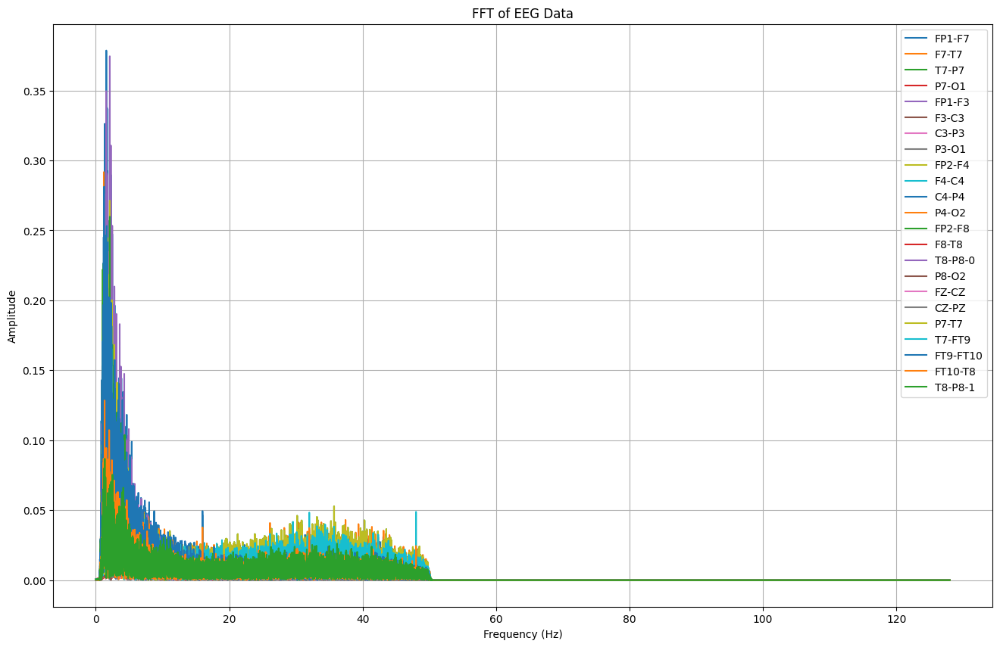

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7         T7-P7     P7-O1    FP1-F3     F3-C3  \
0      0.000115  0.000781  1.865408e-04  0.000207  0.000064  0.000149   
1      0.000124  0.000768  1.910052e-04  0.000215  0.000059  0.000161   
2      0.000126  0.000773  1.950941e-04  0.000220  0.000068  0.000166   
3      0.000142  0.000783  2.004199e-04  0.000209  0.000018  0.000126   
4      0.000138  0.000747  1.731005e-04  0.000196  0.000075  0.000169   
...         ...       ...           ...       ...       ...       ...   
23291  0.000002  0.000017  6.308895e-07  0.000002  0.000003  0.000012   
23292  0.000002  0.000017  6.306238e-07  0.000002  0.000003  0.000012   
23293  0.000002  0.000017  6.307160e-07  0.000002  0.000003  0.000012   
23294  0.000002  0.000017  6.306309e-07  0.000002  0.000003  0.000012   
23295  0.000002  0.000017  6.305943e-07  0.000002  0.000003  0.000012   

          C3-P3     P3-O1    FP2-F4     F4-C4  ...     P8-O2     FZ-CZ  

In [ ]:

# Simpan data setelah filtering ke file CSV
TA129_1 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb23_09_1.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA129_1.columns:
        signal = TA129_1[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_129_1 = pd.DataFrame(fft_features).T
TA_129_1.columns = channels
TA_129_1['seizure'] = TA129_1['seizure']
TA_129_1['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

for channel in channels:
    if channel in TA_129_1.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA129_1[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_129_1.to_csv("/content/drive/MyDrive/TA/FFT/chb23_09_1.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_129_1}")


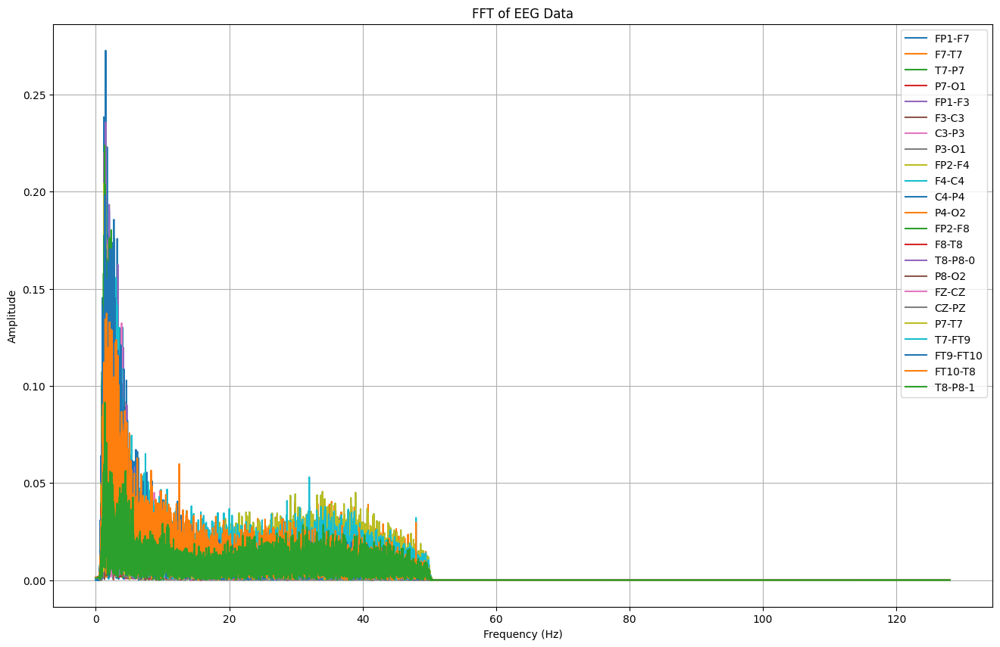

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.001256  0.000382  0.000262  0.000335  0.001029  0.000369  0.000202   
1      0.001246  0.000394  0.000257  0.000333  0.001013  0.000363  0.000207   
2      0.001250  0.000396  0.000262  0.000331  0.001025  0.000352  0.000207   
3      0.001254  0.000397  0.000255  0.000323  0.001040  0.000335  0.000213   
4      0.001239  0.000404  0.000250  0.000315  0.001006  0.000348  0.000221   
...         ...       ...       ...       ...       ...       ...       ...   
18811  0.000015  0.000028  0.000052  0.000004  0.000008  0.000006  0.000010   
18812  0.000015  0.000028  0.000052  0.000004  0.000008  0.000006  0.000010   
18813  0.000015  0.000028  0.000052  0.000004  0.000008  0.000006  0.000010   
18814  0.000015  0.000028  0.000052  0.000004  0.000008  0.000006  0.000010   
18815  0.000015  0.000028  0.000052  0.000004  0.000008  0.000006  0.000010   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA129_2 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb23_09_2.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA129_2.columns:
        signal = TA129_2[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_129_2 = pd.DataFrame(fft_features).T
TA_129_2.columns = channels
TA_129_2['seizure'] = TA129_2['seizure']
TA_129_2['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

for channel in channels:
    if channel in TA_129_2.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA129_2[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_129_2.to_csv("/content/drive/MyDrive/TA/FFT/chb23_09_2.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_129_2}")


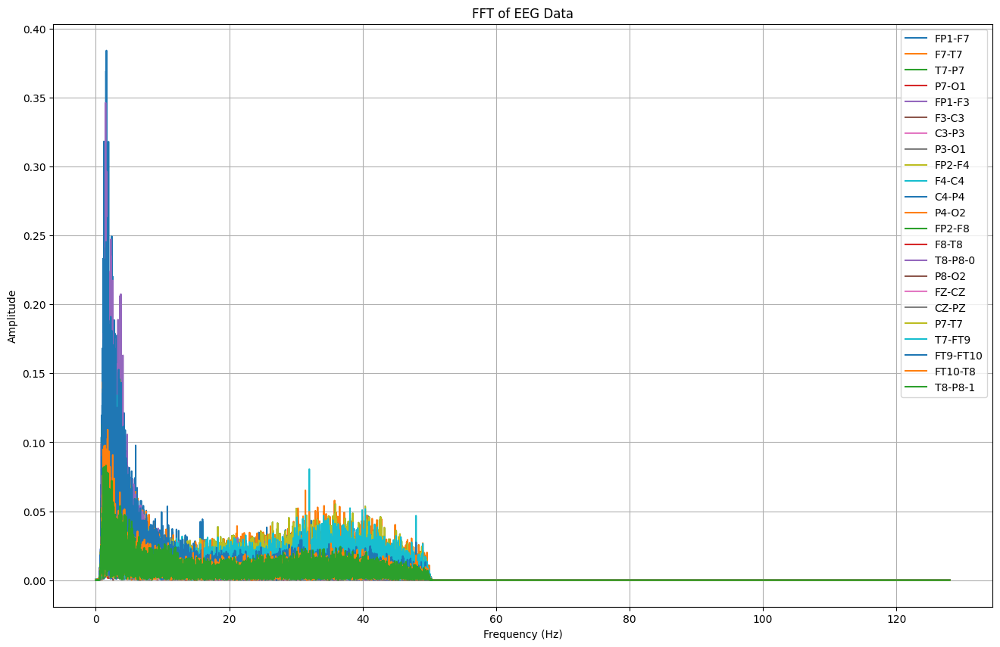

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000518  0.000135  0.000040  0.000247  0.000315  0.000035  0.000144   
1      0.000523  0.000119  0.000035  0.000258  0.000319  0.000024  0.000158   
2      0.000534  0.000123  0.000033  0.000256  0.000330  0.000028  0.000157   
3      0.000539  0.000132  0.000023  0.000239  0.000348  0.000042  0.000140   
4      0.000517  0.000105  0.000032  0.000261  0.000292  0.000008  0.000169   
...         ...       ...       ...       ...       ...       ...       ...   
26107  0.000037  0.000004  0.000002  0.000006  0.000028  0.000017  0.000002   
26108  0.000037  0.000004  0.000002  0.000006  0.000028  0.000017  0.000002   
26109  0.000037  0.000004  0.000002  0.000006  0.000028  0.000017  0.000002   
26110  0.000037  0.000004  0.000002  0.000006  0.000028  0.000017  0.000002   
26111  0.000037  0.000004  0.000002  0.000006  0.000028  0.000017  0.000002   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA129_3 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb23_09_3.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA129_3.columns:
        signal = TA129_3[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_129_3 = pd.DataFrame(fft_features).T
TA_129_3.columns = channels
TA_129_3['seizure'] = TA129_3['seizure']
TA_129_3['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

for channel in channels:
    if channel in TA_129_3.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA129_3[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_129_3.to_csv("/content/drive/MyDrive/TA/FFT/chb23_09_3.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_129_3}")


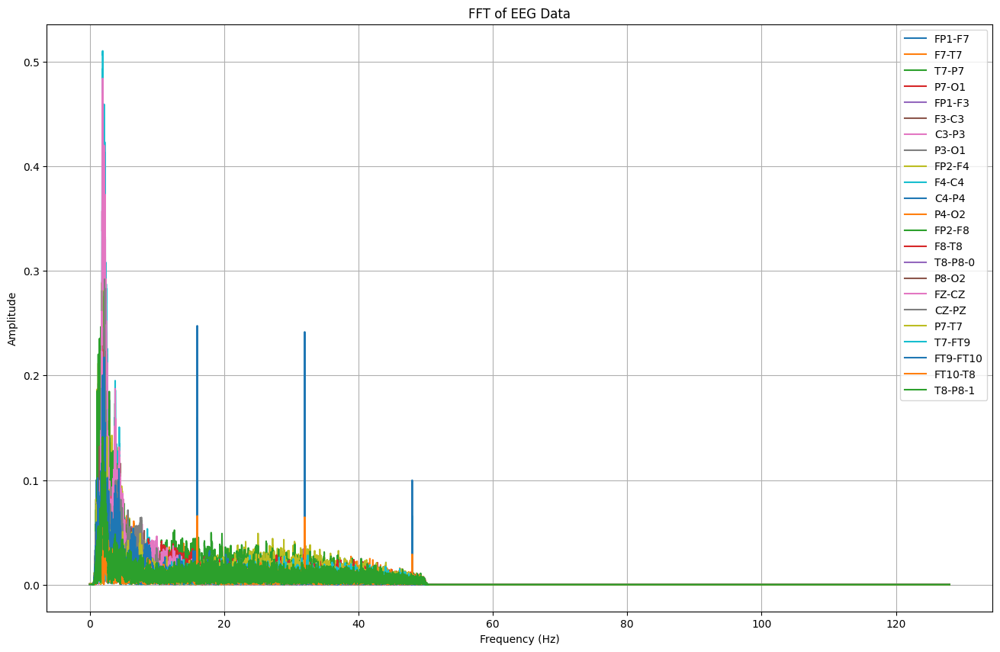

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3  \
0      0.000175  0.000029  0.000498  0.000561  0.000868  0.000103   
1      0.000188  0.000020  0.000490  0.000552  0.000861  0.000112   
2      0.000183  0.000025  0.000494  0.000554  0.000861  0.000106   
3      0.000189  0.000016  0.000490  0.000550  0.000861  0.000121   
4      0.000186  0.000031  0.000493  0.000557  0.000858  0.000099   
...         ...       ...       ...       ...       ...       ...   
18555  0.000019  0.000014  0.000021  0.000020  0.000015  0.000024   
18556  0.000019  0.000014  0.000021  0.000020  0.000015  0.000024   
18557  0.000019  0.000014  0.000021  0.000020  0.000015  0.000024   
18558  0.000019  0.000014  0.000021  0.000020  0.000015  0.000024   
18559  0.000019  0.000014  0.000021  0.000020  0.000015  0.000024   

              C3-P3     P3-O1    FP2-F4         F4-C4  ...     P8-O2  \
0      2.843043e-04  0.000131  0.000911  3.97187

In [ ]:

# Simpan data setelah filtering ke file CSV
TA130 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb24_01.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA130.columns:
        signal = TA130[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_130 = pd.DataFrame(fft_features).T
TA_130.columns = channels
TA_130['seizure'] = TA130['seizure']
TA_130['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

for channel in channels:
    if channel in TA_130.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA130[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_130.to_csv("/content/drive/MyDrive/TA/FFT/chb24_01.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_130}")


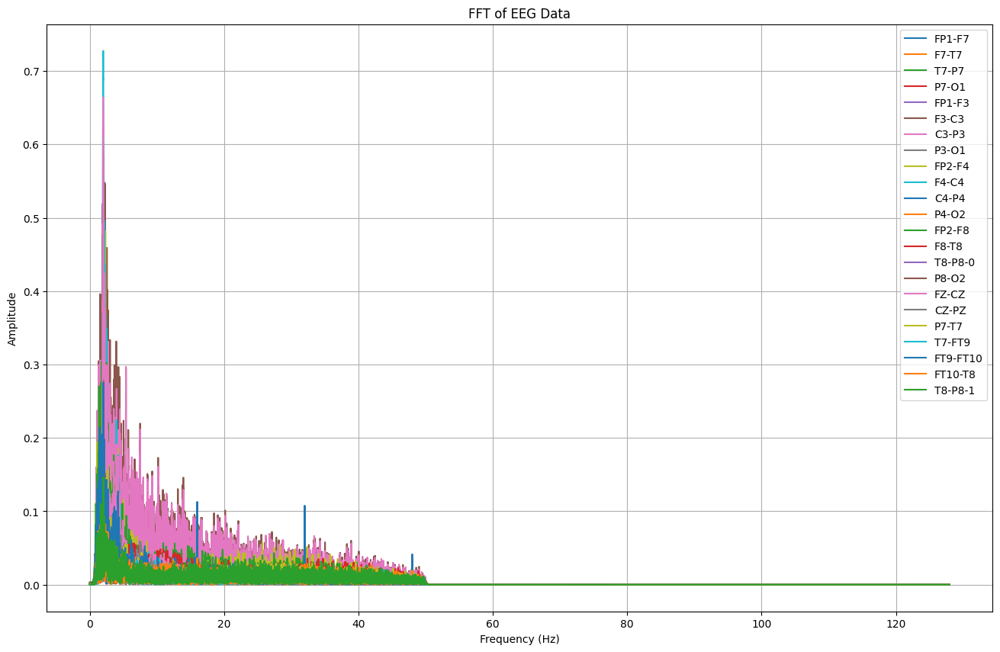

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.001483  0.001383  0.000567  0.001316  0.002521  0.000472  0.000315   
1      0.001492  0.001393  0.000573  0.001323  0.002527  0.000499  0.000307   
2      0.001490  0.001389  0.000570  0.001321  0.002529  0.000500  0.000297   
3      0.001494  0.001399  0.000576  0.001326  0.002529  0.000513  0.000301   
4      0.001494  0.001383  0.000570  0.001318  0.002537  0.000436  0.000352   
...         ...       ...       ...       ...       ...       ...       ...   
18555  0.000079  0.000014  0.000017  0.000024  0.000095  0.000033  0.000015   
18556  0.000079  0.000014  0.000017  0.000024  0.000095  0.000033  0.000015   
18557  0.000079  0.000014  0.000017  0.000024  0.000095  0.000033  0.000015   
18558  0.000079  0.000014  0.000017  0.000024  0.000095  0.000033  0.000015   
18559  0.000079  0.000014  0.000017  0.000024  0.000095  0.000033  0.000015   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA131 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb24_03.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA131.columns:
        signal = TA131[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_131 = pd.DataFrame(fft_features).T
TA_131.columns = channels
TA_131['seizure'] = TA131['seizure']
TA_131['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

for channel in channels:
    if channel in TA_131.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA131[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_131.to_csv("/content/drive/MyDrive/TA/FFT/chb24_03.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_131}")


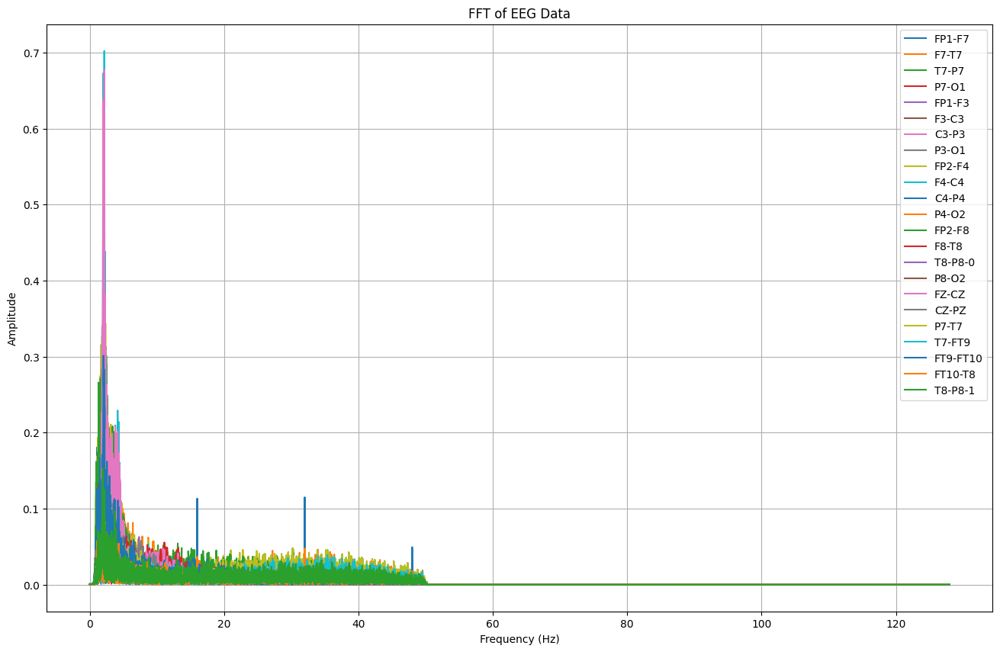

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000920  0.000266  0.000131  0.000389  0.000234  0.000678  0.000672   
1      0.000932  0.000278  0.000138  0.000379  0.000244  0.000687  0.000680   
2      0.000932  0.000272  0.000136  0.000381  0.000248  0.000677  0.000679   
3      0.000934  0.000284  0.000139  0.000374  0.000243  0.000698  0.000682   
4      0.000927  0.000268  0.000132  0.000384  0.000245  0.000673  0.000676   
...         ...       ...       ...       ...       ...       ...       ...   
19451  0.000018  0.000010  0.000002  0.000007  0.000010  0.000015  0.000015   
19452  0.000018  0.000010  0.000002  0.000007  0.000010  0.000015  0.000015   
19453  0.000018  0.000010  0.000002  0.000007  0.000010  0.000015  0.000015   
19454  0.000018  0.000010  0.000002  0.000007  0.000010  0.000015  0.000015   
19455  0.000018  0.000010  0.000002  0.000007  0.000010  0.000015  0.000015   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA132 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb24_04.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA132.columns:
        signal = TA132[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_132 = pd.DataFrame(fft_features).T
TA_132.columns = channels
TA_132['seizure'] = TA132['seizure']
TA_132['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

for channel in channels:
    if channel in TA_132.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA132[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_132.to_csv("/content/drive/MyDrive/TA/FFT/chb24_04.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_132}")


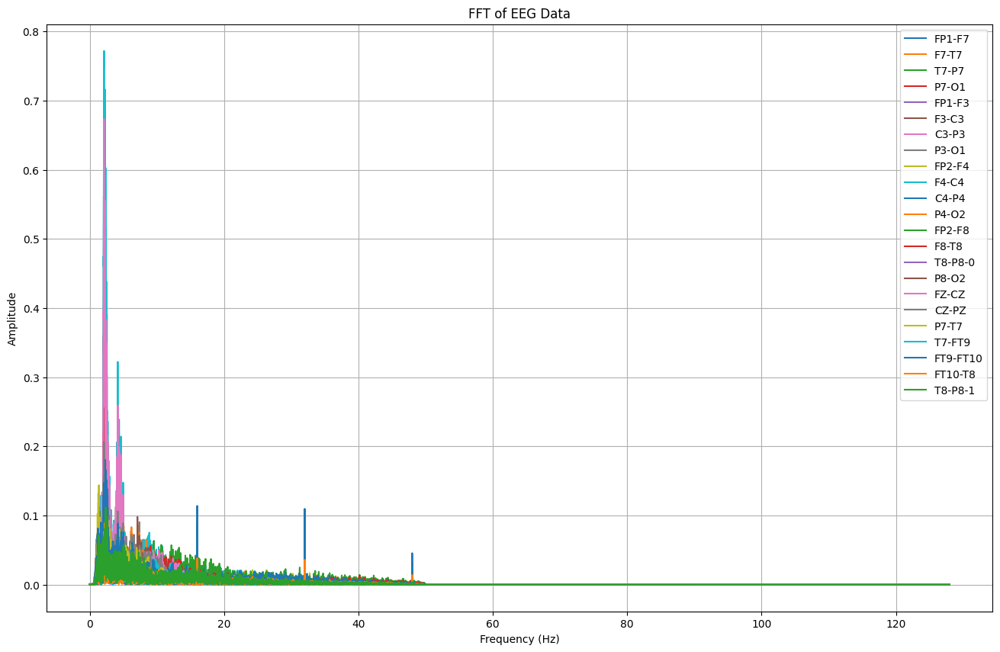

Data setelah FFT berhasil disimpan dalam file CSV:              FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3  \
0      1.248648e-04  0.000898  0.000486  0.000171  0.000673  0.000606   
1      1.142912e-04  0.000908  0.000493  0.000179  0.000669  0.000620   
2      1.193424e-04  0.000906  0.000493  0.000177  0.000671  0.000617   
3      1.120872e-04  0.000904  0.000494  0.000181  0.000670  0.000619   
4      1.291146e-04  0.000902  0.000493  0.000175  0.000669  0.000601   
...             ...       ...       ...       ...       ...       ...   
18811  6.303159e-07  0.000004  0.000006  0.000003  0.000005  0.000011   
18812  6.303256e-07  0.000004  0.000006  0.000003  0.000005  0.000011   
18813  6.303236e-07  0.000004  0.000006  0.000003  0.000005  0.000011   
18814  6.303227e-07  0.000004  0.000006  0.000003  0.000005  0.000011   
18815  6.303188e-07  0.000004  0.000006  0.000003  0.000005  0.000011   

          C3-P3     P3-O1    FP2-F4     F4-C4  ...     P8-O2     FZ-CZ  

In [ ]:

# Simpan data setelah filtering ke file CSV
TA132_1 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb24_04_1.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA132_1.columns:
        signal = TA132_1[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_132_1 = pd.DataFrame(fft_features).T
TA_132_1.columns = channels
TA_132_1['seizure'] = TA132_1['seizure']
TA_132_1['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

for channel in channels:
    if channel in TA_132_1.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA132_1[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_132_1.to_csv("/content/drive/MyDrive/TA/FFT/chb24_04_1.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_132_1}")


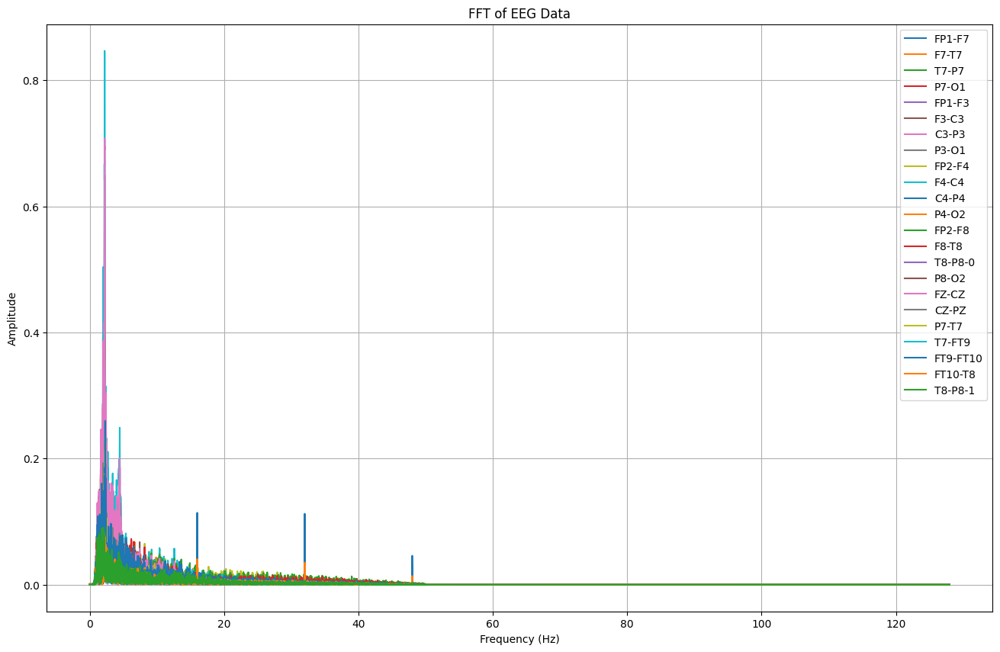

Data setelah FFT berhasil disimpan dalam file CSV:              FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3  \
0      9.672443e-05  0.000172  0.000221  0.000965  0.000484  0.000085   
1      8.665200e-05  0.000182  0.000213  0.000957  0.000491  0.000078   
2      8.985498e-05  0.000176  0.000215  0.000959  0.000491  0.000082   
3      9.363732e-05  0.000188  0.000208  0.000955  0.000489  0.000072   
4      8.661240e-05  0.000173  0.000218  0.000961  0.000487  0.000077   
...             ...       ...       ...       ...       ...       ...   
17787  4.215475e-07  0.000013  0.000016  0.000010  0.000010  0.000006   
17788  4.215383e-07  0.000013  0.000016  0.000010  0.000010  0.000006   
17789  4.215412e-07  0.000013  0.000016  0.000010  0.000010  0.000006   
17790  4.215424e-07  0.000013  0.000016  0.000010  0.000010  0.000006   
17791  4.215398e-07  0.000013  0.000016  0.000010  0.000010  0.000006   

          C3-P3     P3-O1    FP2-F4     F4-C4  ...     P8-O2     FZ-CZ  

In [ ]:

# Simpan data setelah filtering ke file CSV
TA132_2 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb24_04_2.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA132_2.columns:
        signal = TA132_2[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_132_2 = pd.DataFrame(fft_features).T
TA_132_2.columns = channels
TA_132_2['seizure'] = TA132_2['seizure']
TA_132_2['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

for channel in channels:
    if channel in TA_132_2.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA132_2[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_132_2.to_csv("/content/drive/MyDrive/TA/FFT/chb24_04_2.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_132_2}")


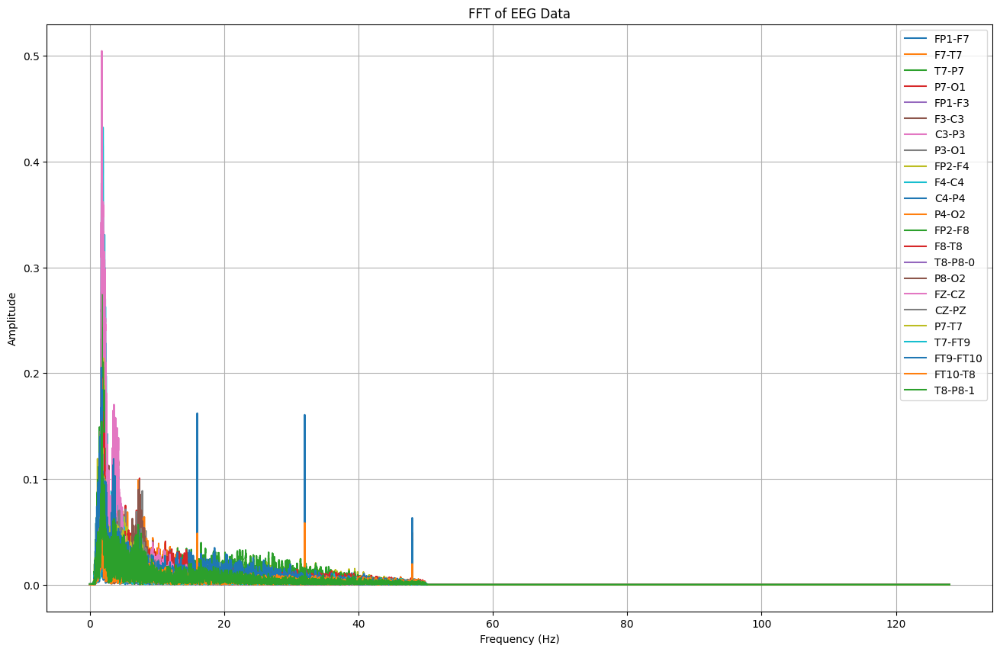

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000373  0.000004  0.000581  0.000319  0.000139  0.000345  0.000066   
1      0.000381  0.000019  0.000589  0.000310  0.000147  0.000357  0.000078   
2      0.000382  0.000012  0.000588  0.000314  0.000145  0.000354  0.000074   
3      0.000386  0.000023  0.000593  0.000309  0.000150  0.000363  0.000082   
4      0.000372  0.000014  0.000586  0.000318  0.000139  0.000355  0.000067   
...         ...       ...       ...       ...       ...       ...       ...   
18427  0.000005  0.000004  0.000017  0.000028  0.000013  0.000015  0.000017   
18428  0.000005  0.000004  0.000017  0.000028  0.000013  0.000015  0.000017   
18429  0.000005  0.000004  0.000017  0.000028  0.000013  0.000015  0.000017   
18430  0.000005  0.000004  0.000017  0.000028  0.000013  0.000015  0.000017   
18431  0.000005  0.000004  0.000017  0.000028  0.000013  0.000015  0.000017   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA133 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb24_06.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA133.columns:
        signal = TA133[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_133 = pd.DataFrame(fft_features).T
TA_133.columns = channels
TA_133['seizure'] = TA133['seizure']
TA_133['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

for channel in channels:
    if channel in TA_133.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA133[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_133.to_csv("/content/drive/MyDrive/TA/FFT/chb24_06.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_133}")


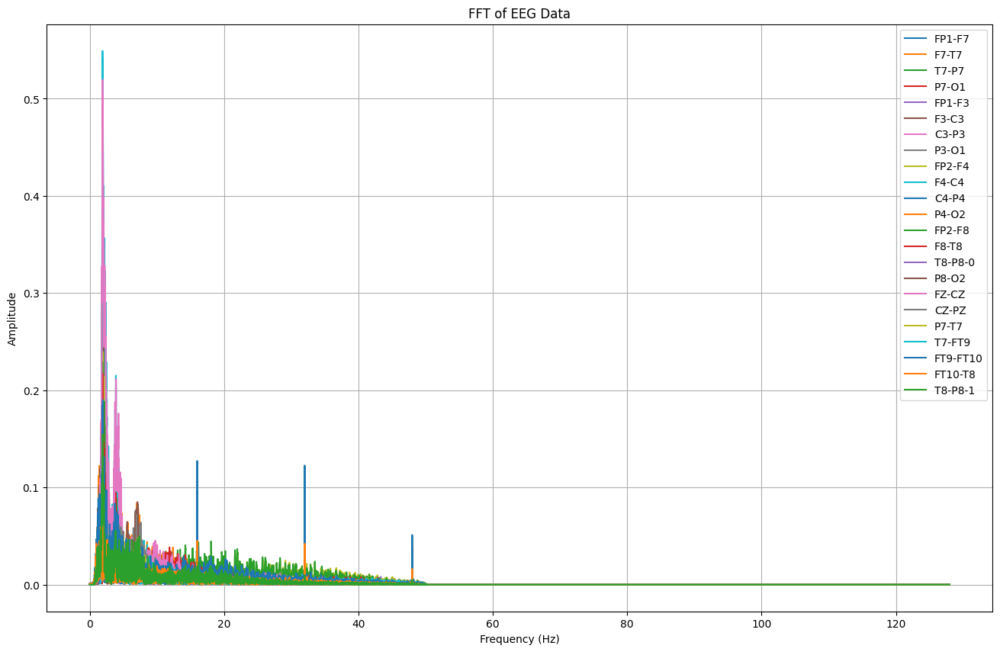

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000096  0.000204  0.000186  0.000246  0.000012  0.000016  0.000052   
1      0.000089  0.000194  0.000193  0.000239  0.000018  0.000008  0.000045   
2      0.000095  0.000198  0.000190  0.000240  0.000016  0.000013  0.000047   
3      0.000086  0.000202  0.000193  0.000241  0.000031  0.000026  0.000046   
4      0.000089  0.000194  0.000192  0.000236  0.000016  0.000015  0.000045   
...         ...       ...       ...       ...       ...       ...       ...   
15227  0.000009  0.000003  0.000005  0.000007  0.000009  0.000002  0.000004   
15228  0.000009  0.000003  0.000005  0.000007  0.000009  0.000002  0.000004   
15229  0.000009  0.000003  0.000005  0.000007  0.000009  0.000002  0.000004   
15230  0.000009  0.000003  0.000005  0.000007  0.000009  0.000002  0.000004   
15231  0.000009  0.000003  0.000005  0.000007  0.000009  0.000002  0.000004   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA134 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb24_07.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA134.columns:
        signal = TA134[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_134 = pd.DataFrame(fft_features).T
TA_134.columns = channels
TA_134['seizure'] = TA134['seizure']
TA_134['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

for channel in channels:
    if channel in TA_134.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA134[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_134.to_csv("/content/drive/MyDrive/TA/FFT/chb24_07.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_134}")


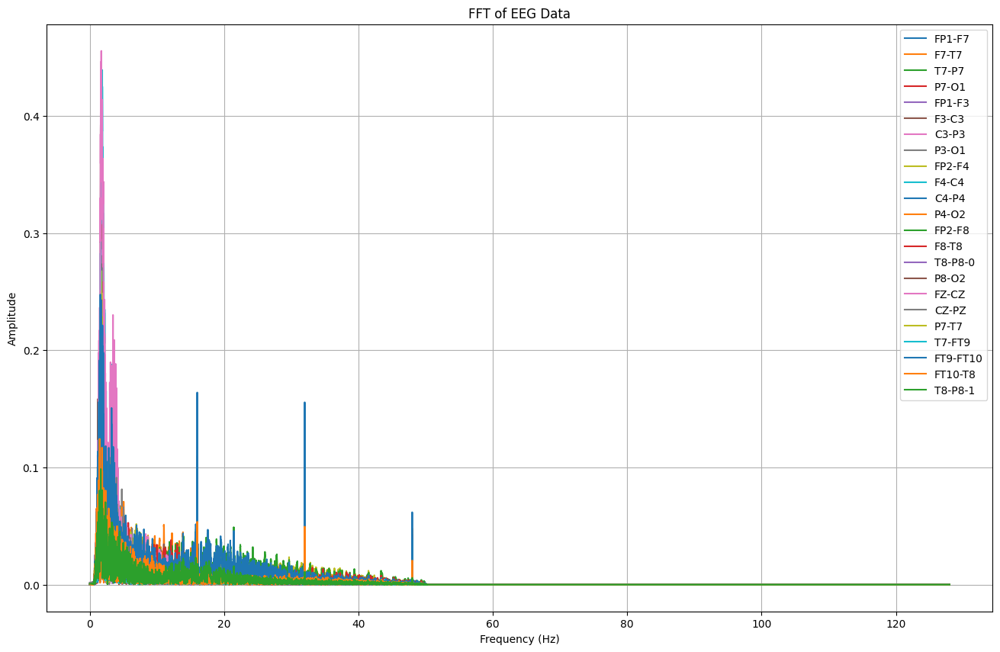

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1        FP1-F3     F3-C3  \
0      0.000115  0.000115  0.000567  0.000348  4.667640e-04  0.000366   
1      0.000108  0.000124  0.000558  0.000356  4.726866e-04  0.000377   
2      0.000104  0.000118  0.000562  0.000354  4.806120e-04  0.000366   
3      0.000105  0.000132  0.000556  0.000358  4.840800e-04  0.000377   
4      0.000100  0.000121  0.000564  0.000352  4.542559e-04  0.000399   
...         ...       ...       ...       ...           ...       ...   
17787  0.000005  0.000028  0.000004  0.000005  6.772045e-07  0.000015   
17788  0.000005  0.000028  0.000004  0.000005  6.772010e-07  0.000015   
17789  0.000005  0.000028  0.000004  0.000005  6.771997e-07  0.000015   
17790  0.000005  0.000028  0.000004  0.000005  6.772019e-07  0.000015   
17791  0.000005  0.000028  0.000004  0.000005  6.772014e-07  0.000015   

          C3-P3     P3-O1    FP2-F4     F4-C4  ...     P8-O2     FZ-CZ  

In [ ]:

# Simpan data setelah filtering ke file CSV
TA135 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb24_09.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA135.columns:
        signal = TA135[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_135 = pd.DataFrame(fft_features).T
TA_135.columns = channels
TA_135['seizure'] = TA135['seizure']
TA_135['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

for channel in channels:
    if channel in TA_135.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA135[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_135.to_csv("/content/drive/MyDrive/TA/FFT/chb24_09.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_135}")


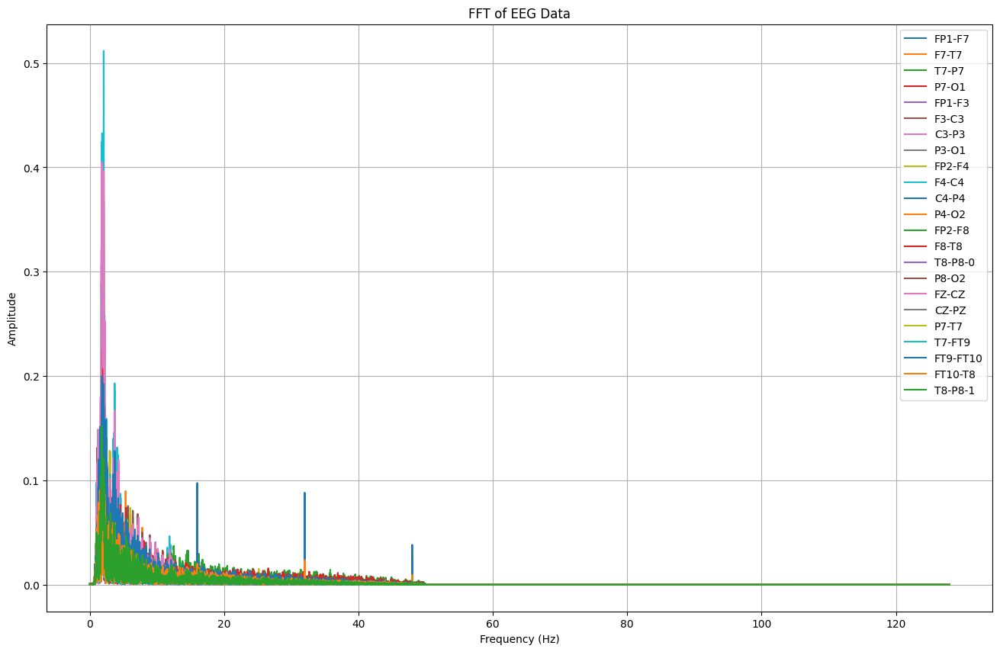

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7         F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3  \
0      0.000426  7.972046e-05  0.000058  0.000356  0.000194  0.000350   
1      0.000419  7.309290e-05  0.000053  0.000350  0.000199  0.000344   
2      0.000419  7.391440e-05  0.000054  0.000349  0.000201  0.000346   
3      0.000421  7.517613e-05  0.000053  0.000349  0.000199  0.000345   
4      0.000419  7.142002e-05  0.000050  0.000348  0.000200  0.000341   
...         ...           ...       ...       ...       ...       ...   
17019  0.000008  9.425599e-07  0.000018  0.000005  0.000003  0.000003   
17020  0.000008  9.425626e-07  0.000018  0.000005  0.000003  0.000003   
17021  0.000008  9.425598e-07  0.000018  0.000005  0.000003  0.000003   
17022  0.000008  9.425617e-07  0.000018  0.000005  0.000003  0.000003   
17023  0.000008  9.425623e-07  0.000018  0.000005  0.000003  0.000003   

          C3-P3     P3-O1    FP2-F4     F4-C4  ...     P8-O2     FZ-CZ  

In [ ]:

# Simpan data setelah filtering ke file CSV
TA136 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb24_11.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA136.columns:
        signal = TA136[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_136 = pd.DataFrame(fft_features).T
TA_136.columns = channels
TA_136['seizure'] = TA136['seizure']
TA_136['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

for channel in channels:
    if channel in TA_136.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA136[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_136.to_csv("/content/drive/MyDrive/TA/FFT/chb24_11.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_136}")


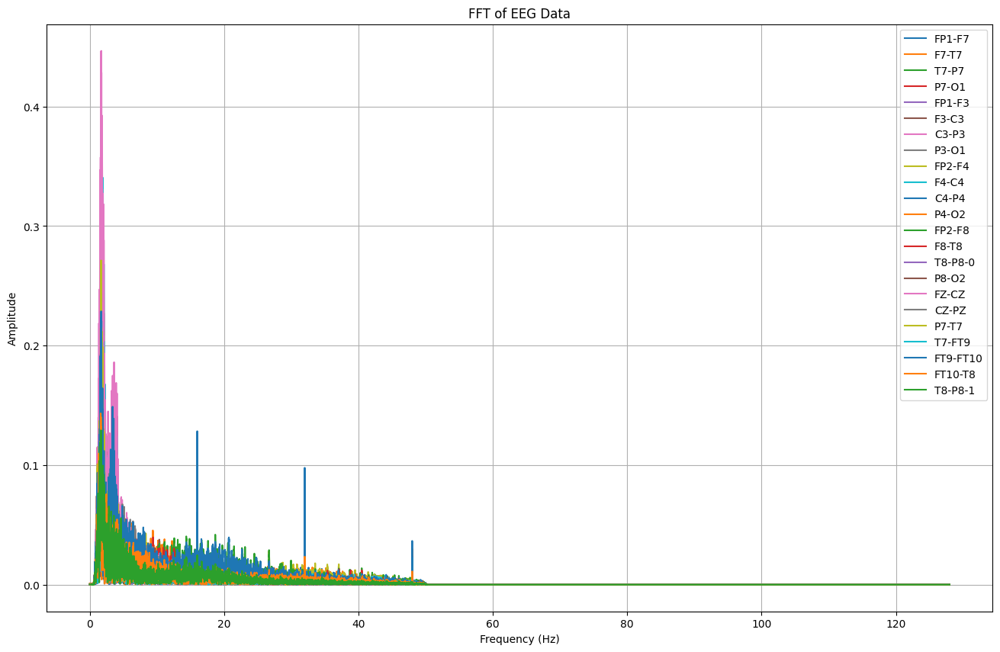

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000162  0.001017  0.000483  0.000177  0.000166  0.000075  0.000333   
1      0.000153  0.001007  0.000492  0.000169  0.000157  0.000067  0.000325   
2      0.000156  0.001010  0.000488  0.000171  0.000159  0.000070  0.000326   
3      0.000154  0.001006  0.000493  0.000167  0.000160  0.000061  0.000325   
4      0.000142  0.001014  0.000487  0.000174  0.000149  0.000074  0.000327   
...         ...       ...       ...       ...       ...       ...       ...   
17403  0.000002  0.000008  0.000002  0.000004  0.000006  0.000001  0.000007   
17404  0.000002  0.000008  0.000002  0.000004  0.000006  0.000001  0.000007   
17405  0.000002  0.000008  0.000002  0.000004  0.000006  0.000001  0.000007   
17406  0.000002  0.000008  0.000002  0.000004  0.000006  0.000001  0.000007   
17407  0.000002  0.000008  0.000002  0.000004  0.000006  0.000001  0.000007   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA137 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb24_13.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA137.columns:
        signal = TA137[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_137 = pd.DataFrame(fft_features).T
TA_137.columns = channels
TA_137['seizure'] = TA137['seizure']
TA_137['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

for channel in channels:
    if channel in TA_137.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA137[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_137.to_csv("/content/drive/MyDrive/TA/FFT/chb24_13.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_137}")


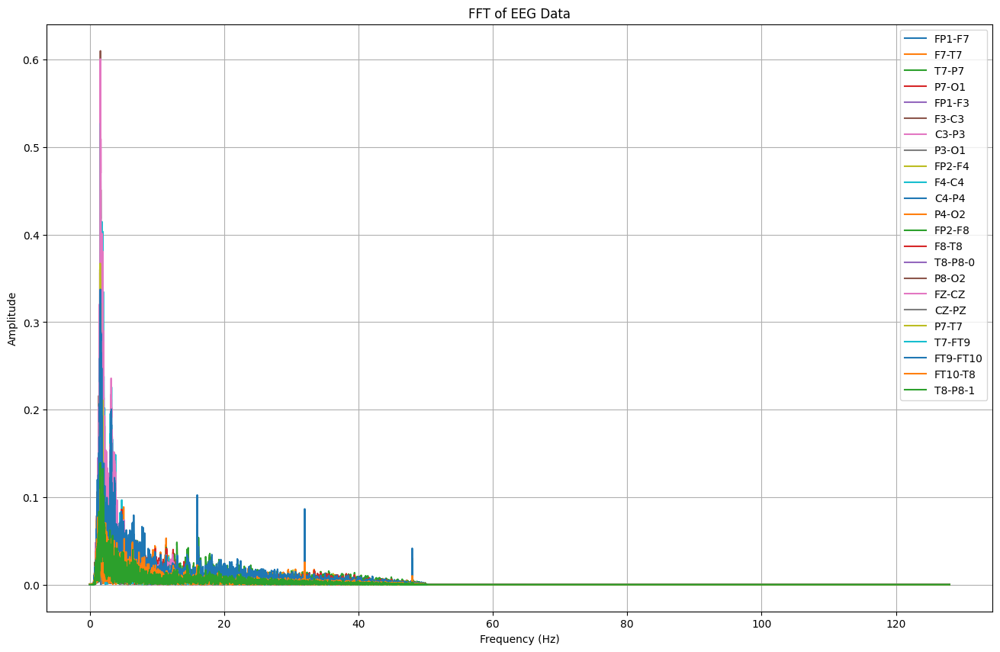

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000333  0.000191  0.000457  0.000347  0.000594  0.000604  0.000175   
1      0.000343  0.000198  0.000448  0.000338  0.000584  0.000614  0.000183   
2      0.000337  0.000197  0.000450  0.000341  0.000586  0.000607  0.000181   
3      0.000346  0.000203  0.000446  0.000338  0.000584  0.000622  0.000186   
4      0.000336  0.000192  0.000454  0.000344  0.000590  0.000600  0.000181   
...         ...       ...       ...       ...       ...       ...       ...   
18427  0.000008  0.000004  0.000003  0.000011  0.000013  0.000015  0.000014   
18428  0.000008  0.000004  0.000003  0.000011  0.000013  0.000015  0.000014   
18429  0.000008  0.000004  0.000003  0.000011  0.000013  0.000015  0.000014   
18430  0.000008  0.000004  0.000003  0.000011  0.000013  0.000015  0.000014   
18431  0.000008  0.000004  0.000003  0.000011  0.000013  0.000015  0.000014   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA138 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb24_14.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA138.columns:
        signal = TA138[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_138 = pd.DataFrame(fft_features).T
TA_138.columns = channels
TA_138['seizure'] = TA138['seizure']
TA_138['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

for channel in channels:
    if channel in TA_138.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA138[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_138.to_csv("/content/drive/MyDrive/TA/FFT/chb24_14.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_138}")


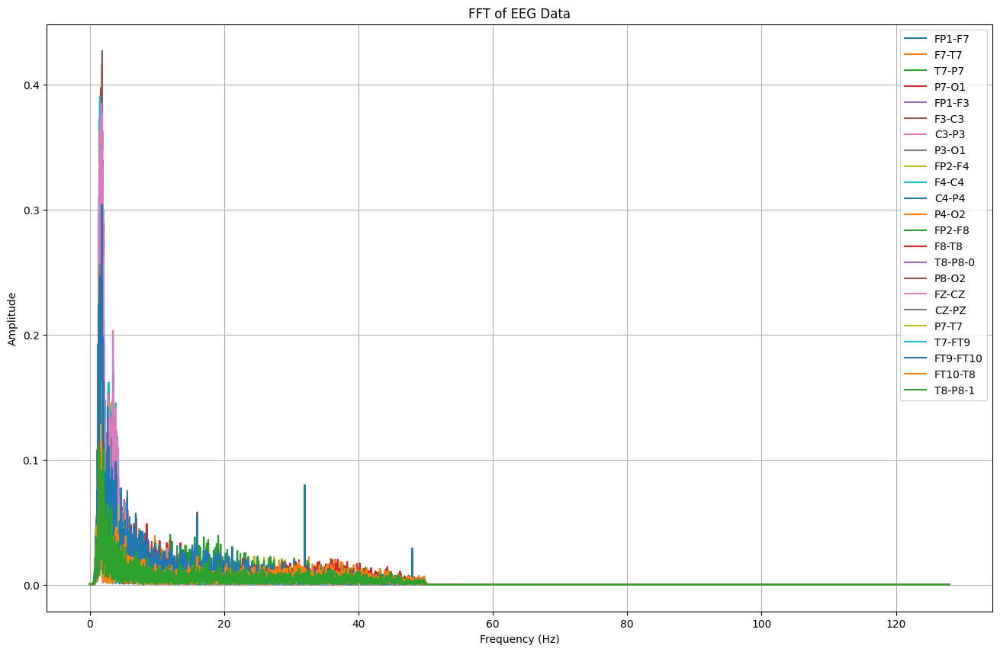

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7         P7-O1    FP1-F3     F3-C3  \
0      0.000408  0.000544  0.000861  3.447007e-04  0.000815  0.000094   
1      0.000413  0.000537  0.000857  3.495429e-04  0.000810  0.000104   
2      0.000419  0.000544  0.000854  3.519573e-04  0.000813  0.000110   
3      0.000422  0.000563  0.000856  3.484481e-04  0.000807  0.000093   
4      0.000413  0.000536  0.000864  3.506348e-04  0.000804  0.000082   
...         ...       ...       ...           ...       ...       ...   
13819  0.000004  0.000005  0.000005  1.482270e-07  0.000006  0.000028   
13820  0.000004  0.000005  0.000005  1.482112e-07  0.000006  0.000028   
13821  0.000004  0.000005  0.000005  1.481997e-07  0.000006  0.000028   
13822  0.000004  0.000005  0.000005  1.482036e-07  0.000006  0.000028   
13823  0.000004  0.000005  0.000005  1.481995e-07  0.000006  0.000028   

          C3-P3     P3-O1    FP2-F4     F4-C4  ...     P8-O2     FZ-CZ  

In [ ]:

# Simpan data setelah filtering ke file CSV
TA139 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb24_15.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA139.columns:
        signal = TA139[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_139 = pd.DataFrame(fft_features).T
TA_139.columns = channels
TA_139['seizure'] = TA139['seizure']
TA_139['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

for channel in channels:
    if channel in TA_139.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA139[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_139.to_csv("/content/drive/MyDrive/TA/FFT/chb24_15.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_139}")


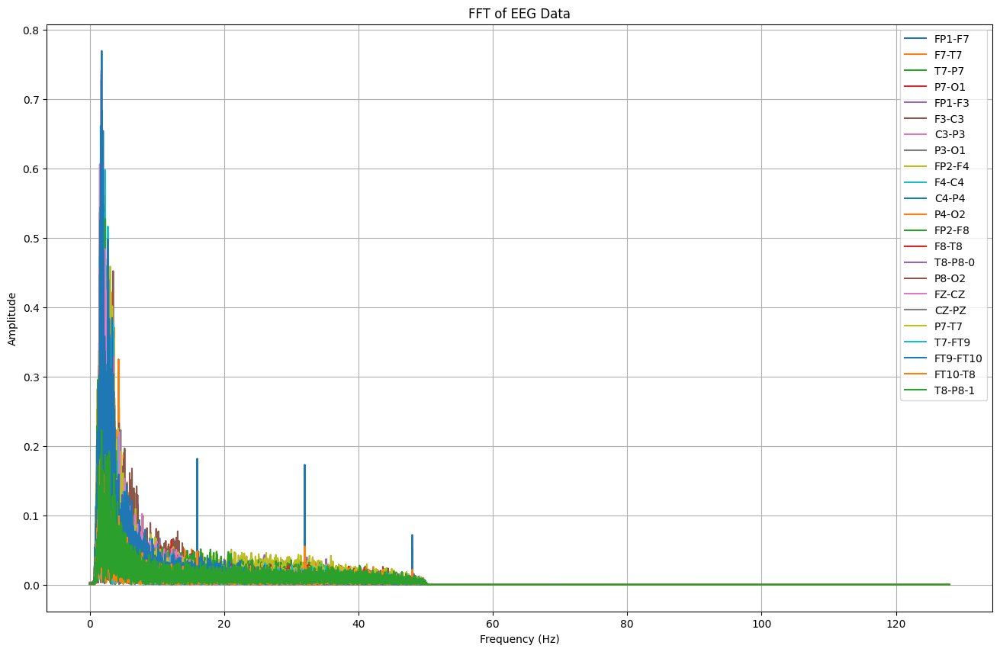

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.001082  0.003500  0.000614  0.002725  0.000100  0.000884  0.002097   
1      0.001093  0.003494  0.000607  0.002716  0.000093  0.000876  0.002090   
2      0.001094  0.003486  0.000609  0.002716  0.000089  0.000874  0.002092   
3      0.001095  0.003490  0.000604  0.002711  0.000084  0.000875  0.002092   
4      0.001093  0.003496  0.000609  0.002722  0.000106  0.000876  0.002088   
...         ...       ...       ...       ...       ...       ...       ...   
18555  0.000009  0.000041  0.000008  0.000005  0.000048  0.000012  0.000023   
18556  0.000009  0.000041  0.000008  0.000005  0.000048  0.000012  0.000023   
18557  0.000009  0.000041  0.000008  0.000005  0.000048  0.000012  0.000023   
18558  0.000009  0.000041  0.000008  0.000005  0.000048  0.000012  0.000023   
18559  0.000009  0.000041  0.000008  0.000005  0.000048  0.000012  0.000023   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA140 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb24_17.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA140.columns:
        signal = TA140[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_140 = pd.DataFrame(fft_features).T
TA_140.columns = channels
TA_140['seizure'] = TA140['seizure']
TA_140['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

for channel in channels:
    if channel in TA_140.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA140[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_140.to_csv("/content/drive/MyDrive/TA/FFT/chb24_17.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_140}")


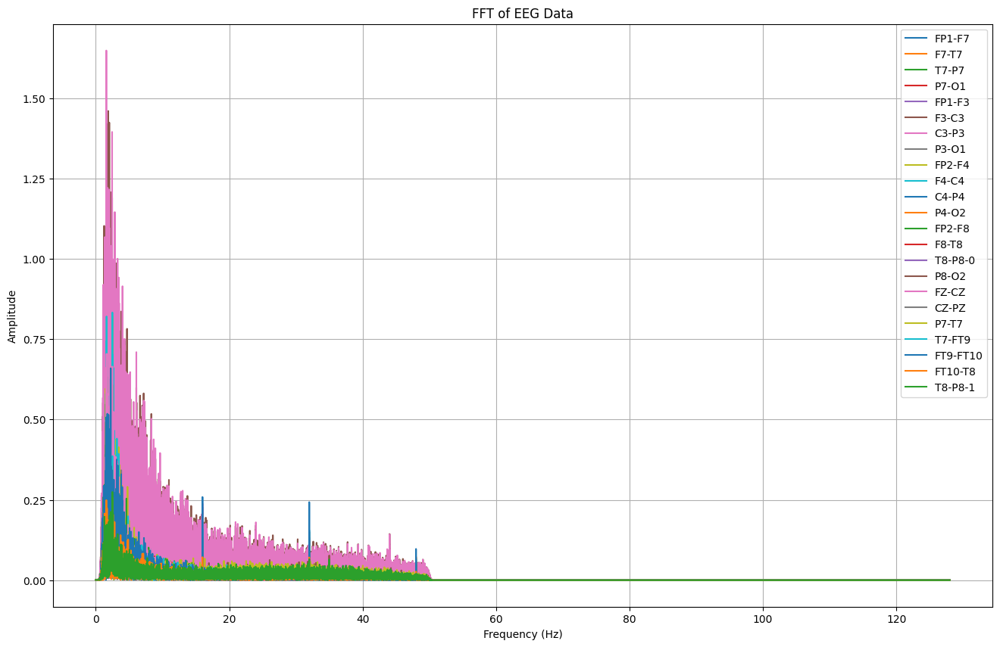

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.001285  0.000758  0.000770  0.000414  0.001579  0.001779  0.000861   
1      0.001277  0.000746  0.000763  0.000405  0.001576  0.001773  0.000873   
2      0.001275  0.000744  0.000763  0.000405  0.001565  0.001776  0.000873   
3      0.001285  0.000747  0.000766  0.000406  0.001584  0.001752  0.000853   
4      0.001266  0.000736  0.000761  0.000405  0.001550  0.001776  0.000879   
...         ...       ...       ...       ...       ...       ...       ...   
24059  0.000005  0.000015  0.000031  0.000018  0.000004  0.000399  0.000403   
24060  0.000005  0.000015  0.000031  0.000018  0.000004  0.000399  0.000403   
24061  0.000005  0.000015  0.000031  0.000018  0.000004  0.000399  0.000403   
24062  0.000005  0.000015  0.000031  0.000018  0.000004  0.000399  0.000403   
24063  0.000005  0.000015  0.000031  0.000018  0.000004  0.000399  0.000403   



In [ ]:

# Simpan data setelah filtering ke file CSV
TA141 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb24_21.csv")

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
sampling_rate = 256


# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA141.columns:
        signal = TA141[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_141 = pd.DataFrame(fft_features).T
TA_141.columns = channels
TA_141['seizure'] = TA141['seizure']
TA_141['frekuensi'] = fft_freqs

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

for channel in channels:
    if channel in TA_141.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA141[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_141.to_csv("/content/drive/MyDrive/TA/FFT/chb24_21.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_141}")
